In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os,sys,uproot
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import math
from scipy.special import logit
import ROOT
from array import array
from math import floor, log10
import decay_widths as dw

import Create_collie_inputs_slimmed as Aditya_funcs

print ('Success')

### Some root paths used by different users/devices
#     root_dir = "../../For_David/" for the default root directory used by David
#     root_dir = "/exp/uboone/data/users/jbateman/workdir/HPS_uboone_analysis/" # Filepath used on the FNAL cluster.
#     root_dir = "/Users/user/PhD/HPS_uboone_analysis/" # A filepath used for local running.
root_dir = "/Users/user/PhD/HPS_uboone_analysis/"
root_dir_fix = root_dir

In module 'Darwin':
/Library/Developer/CommandLineTools/SDKs/MacOSX.sdk/usr/include/libkern/arm/OSByteOrder.h:14:1: error: '_OSSwapInt16' has different definitions in different modules; definition in module 'Darwin.libkern.OSByteOrder' first difference is return type is 'uint16_t' (aka 'unsigned short')
uint16_t
^~~~~~~~
/Library/Developer/CommandLineTools/SDKs/MacOSX.sdk/usr/include/libkern/arm/_OSByteOrder.h:49:1: note: but in 'DarwinFoundation.OSByteOrder' found different return type '__uint16_t' (aka 'unsigned short')
__uint16_t
^~~~~~~~~~
In module 'Darwin':
/Library/Developer/CommandLineTools/SDKs/MacOSX.sdk/usr/include/libkern/arm/OSByteOrder.h:24:1: error: '_OSSwapInt32' has different definitions in different modules; definition in module 'Darwin.libkern.OSByteOrder' first difference is return type is 'uint32_t' (aka 'unsigned int')
uint32_t
^~~~~~~~
/Library/Developer/CommandLineTools/SDKs/MacOSX.sdk/usr/include/libkern/arm/_OSByteOrder.h:59:1: note: but in 'DarwinFoundation.O

Welcome to JupyROOT 6.30/02
Success


# Purpose of script

This script loads .pkl files of the NuMI signal and background samples after a pre-selection has been applied and the BDT scores have already been saved. 

The full set of uncertainties are calculated for signal and background. Output BDT scores and the associated uncertainties are saved in .root files for each channel in the analysis. 

Plot list: 1) The BDT input variables. 2) The BDT score distributions. 3) The uncertainty contributions for the input variables.


Code structure: All of the functions except for the few in Adiyta_funcs are defined WITHIN this notebook. This makes it very untidy to run through, but I kept it this way for the sake of easily customizing. 

For the variable names, Aditya used '_ls' to indicate the variable is related to the leading shower object. 

## Testing loading individual file

In [3]:
#This can be used to look at individual files without loading the full set of channels.

loc_pkls = root_dir+"BDT_inputs_pkl/"
filename_test = "AllVar_Selected_Run1_NuMI_Signal_KDAR_100_2shr_PPFX_pred_NEW"
test_df = pd.read_pickle(loc_pkls+f"{filename_test}.pkl")
print(test_df.keys().to_list())
print(f"Number of variables is: {len(test_df.keys())}")
print(f"Number of events is: {len(test_df)}")


['run_ls', 'sub_ls', 'evt_ls', 'shr_energy_tot_ls', 'pfnplanehits_Y_ls', 'contained_fraction_ls', 'shr_pitch_u_v_ls', 'trk_energy_ls', 'contained_sps_ratio_ls', 'total_hits_y_ls', 'trk_energy_hits_tot_ls', 'shr_start_x_ls', 'nu_pdg_ls', 'ccnc_ls', 'nu_parent_pdg_ls', 'theta_ls', 'reco_nu_vtx_sce_x_ls', 'reco_nu_vtx_sce_y_ls', 'reco_nu_vtx_sce_z_ls', 'npi0_ls', 'crtveto_ls', 'slpdg_ls', 'trk_score_v_ls', 'topological_score_ls', 'ppfx_cv_ls', 'n_showers_contained_MCStool_ls', 'DeltaMed_ls', 'NeutrinoEnergy2_ls', 'shr_energy_y_v_ls', 'shr_pfp_id_v_ls', 'hits_v_ls', 'n_tracks_ls', 'pi0_dir1_x_ls', 'pi0_dir1_z_ls', 'pi0_energy1_Y_ls', 'pi0_mass_Y_ls', 'shrclusdir0_ls', 'shrclusdir1_ls', 'shrclusdir2_ls', 'shr_openangle_ls', 'shr_theta_ls', 'shr_pca_0_ls', 'shr_px_ls', 'shr_px_v_ls', 'shr_pz_ls', 'trk_len_v_ls', 'pfnhits_ls', 'nslice_ls', 'shr_py_v_ls', 'shr_pz_v_ls', 'shr_start_x_v_ls', 'shr_start_y_v_ls', 'shr_start_z_v_ls', 'shr_dedx_y_v_ls', 'nu_e_ls', 'true_nu_pz_ls', 'temp_ID', 'test_s

## Functions for loading all files

In [4]:
def Get_ratios_trained(df):
    """
    Given a dataframe with variable \"is_trained\", will print the numbers of events with zero, number of events where it is one and the fraction of zeros.
    """
    num_zeros = len(df.query('is_trained==0'))
    num_ones = len(df.query('is_trained==1'))
    print(f"Zeros: {num_zeros}")
    print(f"Ones: {num_ones}")
    print(f"Fraction of zeros: {num_zeros/(num_zeros+num_ones)}")
    
def sci_notation(num, decimal_digits=0, precision=None, exponent=None):
    """
    Returns a string representation of the scientific
    notation of the given number formatted for use with
    LaTeX or Mathtext, with specified number of significant
    decimal digits and precision (number of decimal digits
    to show). The exponent to be used can also be specified
    explicitly.
    """
    if exponent is None:
        exponent = int(floor(log10(abs(num))))
    coeff = round(num / float(10**exponent), decimal_digits)
    if precision is None:
        precision = decimal_digits

    return r"${0:.{1}f}\times10^{{{{".format(coeff,precision)+"{0:d}".format(exponent)+"}}$"

def match_RSE_indices(pkl_data, uproot_file,columns=[0,1,2]):
    """
    This function matches events in the pkl file to the uproot file, using the run, subrun and event number.
    It returns the indices of the uproot file that match the pkl file, used to retrive the time of 
    flight values. 
    """
    
    test_run = pkl_data['run_ls'].to_numpy()
    test_subrun = pkl_data['sub_ls'].to_numpy()
    test_event = pkl_data['evt_ls'].to_numpy()

    keys = uproot_file.keys()
    data = uproot_file[keys[0]]
    keys = data.keys()
    runs = data[keys[columns[0]]].array()
    subruns = data[keys[columns[1]]].array()
    event = data[keys[columns[2]]].array()

    indices = []
    for i, run in enumerate(test_run):
        run_args = np.where(runs==run)
        subrun_args = np.where(subruns==test_subrun[i])
        event_arg = np.where(event==test_event[i])
        shared_run_sub_arg = np.intersect1d(run_args, subrun_args)
        shared_arg = np.intersect1d(shared_run_sub_arg, event_arg)
        indices.append(shared_arg[0])
    return indices

def New_loader(Run, mass, nshr, KDIF_KDAR_str, bool_full_sample=True, get_tof=False, for_david=True, testing_new_flux = False, update_KDAR_scaling = False):
    """
    New function to load the .pkl files as dataframes. Mostly taken directly from Aditya's code.
    get_tof is a boolean that determines whether to load the time of flight values from the root file.
    """
    #Constants for normalisation factors
    
    mc_pot_fhc = 2.33652e+21 # Need to update this when using new flux
    mc_pot_rhc = 1.98937e+21 # Need to update this when using new flux
    dirt_pot_fhc = 1.42143e+21
    dirt_pot_rhc = 1.03226e+21
    OnBeam_EA9CNT_wcut_fhc = 5268051.0
    OnBeam_EA9CNT_wcut_rhc = 10363728.0
    OffBeam_EXT_NUMIwin_FEMBeamTriggerAlgo_fhc = 9199232.74
    OffBeam_EXT_NUMIwin_FEMBeamTriggerAlgo_rhc = 32878305.25
    scale_ext_fhc = OnBeam_EA9CNT_wcut_fhc/OffBeam_EXT_NUMIwin_FEMBeamTriggerAlgo_fhc
    scale_ext_rhc = OnBeam_EA9CNT_wcut_rhc/OffBeam_EXT_NUMIwin_FEMBeamTriggerAlgo_rhc
    scale_ext_fhc = scale_ext_fhc*.98
    scale_ext_rhc = scale_ext_rhc*.98
    OnBeam_tortgt_wcut_fhc = 2.002e20
    OnBeam_tortgt_wcut_rhc = 5.009e20
    scale_nu_fhc = OnBeam_tortgt_wcut_fhc/mc_pot_fhc
    scale_nu_rhc = OnBeam_tortgt_wcut_rhc/mc_pot_rhc
    scale_dirt_fhc = OnBeam_tortgt_wcut_fhc/dirt_pot_fhc
    scale_dirt_rhc = OnBeam_tortgt_wcut_rhc/dirt_pot_rhc
    scale_dirt_fhc = scale_dirt_fhc*0.75
    scale_dirt_rhc = scale_dirt_rhc*0.35

    if Run == 'Run1':
        fhc_rhc_str = 'fhc'
        OnBeam_tortgt_wcut = OnBeam_tortgt_wcut_fhc
        scale_nu = scale_nu_fhc
        scale_dirt = scale_dirt_fhc
        scale_ext = scale_ext_fhc
    elif Run == 'Run3':
        if testing_new_flux:    
            print('Using new flux overlay')
            # # Params for new flux files
            mc_pot_rhc = 2.644072435807561e+21 # PoT for new flux, old flux val = 1.98937e+21
            scale_nu_rhc = OnBeam_tortgt_wcut_rhc/mc_pot_rhc
            # # Not touching these for now. Correspond to the EXT scaling, which is a separate file we haven't changed.
            # OnBeam_EA9CNT_wcut_rhc = 1795139.0 # for new flux, old val = 10363728.0
            # OffBeam_EXT_NUMIwin_FEMBeamTriggerAlgo_rhc = 5884692.975000 # for new flux, old val = 32878305.25
            # scale_ext_rhc = OnBeam_EA9CNT_wcut_rhc/OffBeam_EXT_NUMIwin_FEMBeamTriggerAlgo_rhc
            
            

        fhc_rhc_str = 'rhc'
        OnBeam_tortgt_wcut = OnBeam_tortgt_wcut_rhc
        scale_nu = scale_nu_rhc
        scale_dirt = scale_dirt_rhc
        scale_ext = scale_ext_rhc
    
    main_input_dir = root_dir+"/BDT_inputs_pkl/"
    
    ### DATA ###
    if bool_full_sample == True:
        print ('No data')
        df_data = pd.read_pickle(main_input_dir+'AllVar_Selected_'+Run+'_NuMI_opendata_'+nshr+'_NEW.pkl')
        df_data ['pred'] = 1.0
    else:
        df_data = pd.read_pickle(main_input_dir+'AllVar_Selected_'+Run+'_NuMI_Opendata_'+KDIF_KDAR_str+'_'+mass+'_'+nshr+'_PPFX_pred_NEW.pkl')
    
    #### SIG ####
    if bool_full_sample == True: print ('No signal')
    else:
        df_sig = pd.read_pickle(main_input_dir+'AllVar_Selected_'+Run+'_NuMI_Signal_'+KDIF_KDAR_str+'_'+mass+'_'+nshr+'_PPFX_pred_NEW.pkl')
        if get_tof==True:
            tof_file = f"tof_{fhc_rhc_str}_{mass}.root"

            with uproot.open(root_dir+"TOF_input_root/"+tof_file) as tof_data:
                indices = match_RSE_indices(df_sig, tof_data)
                keys = tof_data.keys()
                tof_data = tof_data[keys[0]]
                tof = tof_data['proper_tof'].array()[indices].to_numpy()

            df_sig['tof'] = tof
        frac_sig_test_sample = len(df_sig.query('is_trained == 0'))/len(df_sig)
        df_sig['frac_test_sample'] = frac_sig_test_sample #Should be 0.4
        df_sig = df_sig.query('is_trained==0') #Only taking testing events!
        
        if update_KDAR_scaling:
            print('Updating KDAR scaling for signal')

            if Run == 'Run1':
                df_sig['KDAR_scale'] = df_sig['KDAR_scale'].astype(float)
                df_sig.loc[df_sig['KDAR_scale'] == 8.0, 'KDAR_scale'] = 0.085/0.016
            elif Run == 'Run3':
                df_sig.loc[df_sig['KDAR_scale'] == 8.6, 'KDAR_scale'] = 0.085/0.016

            
        df_sig.eval('scale_factor_ls = (1/frac_test_sample)*KDAR_scale*'+str(OnBeam_tortgt_wcut)+'/test_sample_POT_ls',inplace=True)

    #### OVL ####
    if testing_new_flux and Run == 'Run3':
        loc_BDT_input = '/exp/uboone/data/users/jbateman/workdir/HPS_uboone_analysis/NewFlux/BDT_input_pkl/'
        # df_ovl = pd.read_pickle(main_input_dir+'AllVar_Selected_'+Run+'_NuMI_Overlay_'+KDIF_KDAR_str+'_'+mass+'_'+nshr+'_PPFX_pred_NEW.pkl') # Old overlay files
        df_ovl = pd.read_pickle(loc_BDT_input + f'AllVar_Selected_{Run}_NuMI_Overlay_{KDIF_KDAR_str}_{mass}_MeV_{nshr}_Weights_Updated_Flux_pred.pkl') # New flux overlay
        frac_ovl_test_sample = len(df_ovl.query('is_trained == 0'))/len(df_ovl) #Should be 0.4
        df_ovl['frac_test_sample'] = frac_ovl_test_sample
        df_ovl = df_ovl.query('is_trained==0')
        df_ovl.eval('scale_factor_ls = (1/frac_test_sample)*KDAR_scale*'+str(scale_nu),inplace=True)
        df_ovl['is_good_genie'] = 1
        df_ovl['is_good_ppfx'] = 1
        df_ovl['is_good_reint'] = 1

        df_ovl.loc[df_ovl['inf_weight_genie'] == "yes", 'is_good_genie'] = 0
        df_ovl.loc[df_ovl['zero_weight_genie'] == "yes", 'is_good_genie'] = 0
        df_ovl.loc[df_ovl['ones_weight_genie'] == "yes", 'is_good_genie'] = 0
        df_ovl.loc[df_ovl['thsnd_weight_genie'] == "yes", 'is_good_genie'] = 0
        
        df_ovl.loc[df_ovl['inf_weight_ppfx'] == "yes", 'is_good_ppfx'] = 0
        df_ovl.loc[df_ovl['zero_weight_ppfx'] == "yes", 'is_good_ppfx'] = 0
        df_ovl.loc[df_ovl['ones_weight_ppfx'] == "yes", 'is_good_ppfx'] = 0
        df_ovl.loc[df_ovl['thsnd_weight_ppfx'] == "yes", 'is_good_ppfx'] = 0
        
        df_ovl.loc[df_ovl['inf_weight_reint'] == "yes", 'is_good_reint'] = 0
        df_ovl.loc[df_ovl['zero_weight_reint'] == "yes", 'is_good_reint'] = 0
        df_ovl.loc[df_ovl['ones_weight_reint'] == "yes", 'is_good_reint'] = 0
        df_ovl.loc[df_ovl['thsnd_weight_reint'] == "yes", 'is_good_reint'] = 0
    
    
    else:
        if bool_full_sample == True:
            df_ovl = pd.read_pickle(main_input_dir+'AllVar_Selected_'+Run+'_NuMI_Overlay_'+nshr+'_WEIGHTS_NEW.pkl')
            df_ovl.eval('scale_factor_ls = KDAR_scale*'+str(scale_nu),inplace=True)
            df_ovl ['pred'] = 1.0
        else:
            df_ovl = pd.read_pickle(main_input_dir+'AllVar_Selected_'+Run+'_NuMI_Overlay_'+KDIF_KDAR_str+'_'+mass+'_'+nshr+'_PPFX_pred_NEW.pkl')
            frac_ovl_test_sample = len(df_ovl.query('is_trained == 0'))/len(df_ovl) #Should be 0.4
            df_ovl['frac_test_sample'] = frac_ovl_test_sample
            df_ovl = df_ovl.query('is_trained==0')
            df_ovl.eval('scale_factor_ls = (1/frac_test_sample)*KDAR_scale*'+str(scale_nu),inplace=True)

        df_ovl['is_good_genie'] = 1
        df_ovl['is_good_ppfx'] = 1
        df_ovl['is_good_reint'] = 1
        
        df_ovl['thsnd_weight_genie'] = (['yes' if all(a == 1000 for a in i) else 'no' for i in df_ovl['weightsGenie']])
        df_ovl['thsnd_weight_ppfx'] = (['yes' if all(a == 1000 for a in i) else 'no' for i in df_ovl['weightsPPFX']])
        df_ovl['thsnd_weight_reint'] = (['yes' if all(a == 1000 for a in i) else 'no' for i in df_ovl['weightsReint']])
        
        df_ovl.loc[df_ovl['inf_weight_genie'] == "yes", 'is_good_genie'] = 0
        df_ovl.loc[df_ovl['zero_weight_genie'] == "yes", 'is_good_genie'] = 0
        df_ovl.loc[df_ovl['ones_weight_genie'] == "yes", 'is_good_genie'] = 0
        df_ovl.loc[df_ovl['thsnd_weight_genie'] == "yes", 'is_good_genie'] = 0
        
        df_ovl.loc[df_ovl['inf_weight_ppfx'] == "yes", 'is_good_ppfx'] = 0
        df_ovl.loc[df_ovl['zero_weight_ppfx'] == "yes", 'is_good_ppfx'] = 0
        df_ovl.loc[df_ovl['ones_weight_ppfx'] == "yes", 'is_good_ppfx'] = 0
        df_ovl.loc[df_ovl['thsnd_weight_ppfx'] == "yes", 'is_good_ppfx'] = 0
        
        df_ovl.loc[df_ovl['inf_weight_reint'] == "yes", 'is_good_reint'] = 0
        df_ovl.loc[df_ovl['zero_weight_reint'] == "yes", 'is_good_reint'] = 0
        df_ovl.loc[df_ovl['ones_weight_reint'] == "yes", 'is_good_reint'] = 0
        df_ovl.loc[df_ovl['thsnd_weight_reint'] == "yes", 'is_good_reint'] = 0

    ### DIRT ###
    if bool_full_sample == True:
        df_dirt = pd.read_pickle(main_input_dir+'AllVar_Selected_'+Run+'_NuMI_Dirt_'+nshr+'_WEIGHTS_NEW.pkl')
        df_dirt.eval('scale_factor_ls = KDAR_scale*'+str(scale_dirt),inplace=True)
        df_dirt ['pred'] = 1.0
    else:
        df_dirt = pd.read_pickle(main_input_dir+'AllVar_Selected_'+Run+'_NuMI_Dirt_'+KDIF_KDAR_str+'_'+mass+'_'+nshr+'_PPFX_pred_NEW.pkl')
        frac_dirt_test_sample = len(df_dirt.query('is_trained == 0'))/len(df_dirt)
        df_dirt['frac_test_sample'] = frac_dirt_test_sample

        df_dirt = df_dirt.query('is_trained==0')
        df_dirt.eval('scale_factor_ls = (1/frac_test_sample)*KDAR_scale*'+str(scale_dirt),inplace=True)
    
    df_dirt['is_good'] = 0
    
    #### EXT ####
    if bool_full_sample == True:
        df_ext = pd.read_pickle(main_input_dir+'AllVar_Selected_'+Run+'_NuMI_Ext_'+nshr+'_WEIGHTS_NEW.pkl')
        df_ext.eval('scale_factor_ls = KDAR_scale*'+str(scale_ext),inplace=True)
        df_ext ['pred'] = 1.0
    else:
        df_ext = pd.read_pickle(main_input_dir+'AllVar_Selected_'+Run+'_NuMI_Ext_'+KDIF_KDAR_str+'_'+mass+'_'+nshr+'_PPFX_pred_NEW.pkl')
        frac_ext_test_sample = len(df_ext.query('is_trained == 0'))/len(df_ext)
        df_ext['frac_test_sample'] = frac_ext_test_sample

        df_ext = df_ext.query('is_trained==0')
        df_ext.eval('scale_factor_ls = (1/frac_test_sample)*KDAR_scale*'+str(scale_ext),inplace=True)
   
    #### Detsys ####
    if mass == '125' or mass == '130' or mass == '135' or mass == '140' or mass == '145':
        detsys_mass = '150'
        print("Loading 150 MeV detsys samples")
    else: detsys_mass = mass
    
    # detsys_sig_input_dir = './Final_detector_systematics_SIGNAL/'+detsys_mass+'_MeV/'
    # detsys_bkg_input_dir = './Final_detector_systematics_BACKGROUND/'+detsys_mass+'_MeV/'
    detsys_sig_input_dir = root_dir+'/Final_detector_systematics_SIGNAL/'+detsys_mass+'_MeV/'
    detsys_bkg_input_dir = root_dir+'/Final_detector_systematics_BACKGROUND/'+detsys_mass+'_MeV/'

    KDIF_KDAR_str_lower = KDIF_KDAR_str.lower()
    df_sig_detsys = pd.read_pickle(detsys_sig_input_dir + 'Signal_' + fhc_rhc_str + '_' + detsys_mass + '_MeV_' + nshr + '_' + KDIF_KDAR_str_lower +'.pkl')
    df_ovl_detsys = pd.read_pickle(detsys_bkg_input_dir + "bkg_" + fhc_rhc_str + '_' + detsys_mass + '_MeV_' + nshr + '_' + KDIF_KDAR_str_lower +'.pkl')
    
    sig_detsys_labels = ["CV",
        "ly_atten",
        "ly_down",
        "ly_rayleigh",
        "recomb",
        "sce",
        "wiremod_anglexz",
        "wiremod_angleyz",
        "wiremod_dEdx",
        "wiremod_x",
        "wiremod_yz",]

    if update_KDAR_scaling:
        for label in sig_detsys_labels:
            suffix = '_'+label
            
            print(f'Updating KDAR scaling for sig detsys {label}')
            if Run == 'Run1':
                df_sig_detsys['KDAR_scale'+suffix] = df_sig_detsys['KDAR_scale'+suffix].astype(float)
                df_sig_detsys.loc[df_sig_detsys['KDAR_scale'+suffix] == 8.0, 'KDAR_scale'+suffix] = 0.085/0.016
            elif Run == 'Run3':
                df_sig_detsys.loc[df_sig_detsys['KDAR_scale'+suffix] == 8.6, 'KDAR_scale'+suffix] = 0.085/0.016

    ovl_detsys_labels = [
        "CV",
        "LYAttenuation",
        "LYDown",
        "LYRayleigh",
        "Recomb2",
        "SCE",
        "WireModThetaXZ",
        "WireModThetaYZ",
        "WireModdEdX",
        "WireModX",
        "WireModYZ",
            ]

    if testing_new_flux:
        print('Updating KDAR scaling for overlay detsys')
        for label in ovl_detsys_labels:
            suffix = '_'+label
            df_ovl_detsys['KDAR_scale'+suffix]  *= 0.71 # +- 0.04 This is the average scale factor from the old to new flux for this sample. Calculated in BDT_pkl_gen/create_pkls_nb.ipynb
    
    
    if bool_full_sample == True: print ('NO LOGIT FOR SIGNAL..')
    else: df_sig['logit_pred'] = logit(df_sig['pred'])
    
    df_ovl['logit_pred'] = logit(df_ovl['pred'])
    df_dirt['logit_pred'] = logit(df_dirt['pred'])
    df_ext['logit_pred'] = logit(df_ext['pred'])
    df_data['logit_pred'] = logit(df_data['pred'])
    
    pred_column_sig = [col for col in df_sig_detsys if col.startswith('pred')]
    pred_column_ovl = [col for col in df_ovl_detsys if col.startswith('pred')]
    
    df_sig_detsys_copy = df_sig_detsys.copy()
    df_ovl_detsys_copy = df_ovl_detsys.copy()
    
    for pred in pred_column_sig:
        df_sig_detsys_copy['logit_'+pred] = logit(df_sig_detsys[pred])
    
    for pred in pred_column_ovl:
        df_ovl_detsys_copy['logit_'+pred] = logit(df_ovl_detsys[pred])

    print (f'SUCCESSFULLY LOADED THE PICKLE FILES {Run, mass, nshr, KDIF_KDAR_str}')
    
    if bool_full_sample == True:
        return df_ovl, df_dirt, df_ext, df_data, df_sig_detsys_copy, df_ovl_detsys_copy
    else:
        return df_sig, df_ovl, df_dirt, df_ext, df_data, df_sig_detsys_copy, df_ovl_detsys_copy
    

In [5]:
root_dir = root_dir_fix

df_sig_dict, df_overlay_dict, df_dirt_dict, df_beamoff_dict, df_data_dict = {},{},{},{},{}
sig_detsys_dict, ov_detsys_dict = {}, {}
HNL_masses = [100, 125, 130, 135, 140, 145, 150, 200] #Full set of HPS mass points, ignore the fact is says HNL
# HNL_masses = [150] #Can use reduced set of mass points so the script runs quicker.

Run = "3"
get_TOF = False # Set to true to load time of flight values, used for the axion reweighting.
use_new_flux = False # Set to true to use the new (fixed) flux files. Currently only generated for Run3.
update_KDAR_scaling = True

for HNL_mass in HNL_masses:
    for shr in ["1shr", "2shr"]:
        for K in ["KDIF", "KDAR"]:
            name = f"{HNL_mass}_{shr}_{K}"
            
            df_sig_dict[name], df_overlay_dict[name], df_dirt_dict[name], df_beamoff_dict[name], df_data_dict[name], sig_detsys_dict[name], ov_detsys_dict[name] = New_loader('Run'+Run, str(HNL_mass), shr, K, bool_full_sample=False, get_tof=get_TOF, for_david=False, testing_new_flux=use_new_flux, update_KDAR_scaling=update_KDAR_scaling)

if use_new_flux:
    # Update the root directory to the new flux directory, so files aren't overwritten.
    root_dir += "NewFlux/"

loaded_run = Run

print()
print("Loaded all!")

FileNotFoundError: [Errno 2] No such file or directory: '/Users/user/PhD/HPS_uboone_analysis//BDT_inputs_pkl/AllVar_Selected_Run3_NuMI_Opendata_KDIF_100_1shr_PPFX_pred_NEW.pkl'

In [6]:
sample_dict = {}

for HNL_mass in HNL_masses:
    for shr in ["1shr", "2shr"]:
        for K in ["KDIF", "KDAR"]:
            name_ends = f"{HNL_mass}_{shr}_{K}"
            
            sample_dict["signal_"+name_ends] = df_sig_dict[name_ends].copy()
            sample_dict["overlay_"+name_ends] = df_overlay_dict[name_ends].copy()
            sample_dict["dirtoverlay_"+name_ends] = df_dirt_dict[name_ends].copy()
            sample_dict["beamoff_"+name_ends] = df_beamoff_dict[name_ends].copy()
            sample_dict["data_"+name_ends] = df_data_dict[name_ends].copy()
    

In [7]:
#These are the nominal values of theta, taken directly from Aditya's thesis as the "KOTO CV"
#We initialise them so that the signal theta values can be plotted in the input variable plots

theta_text_dict = {'100':5.36e-4, '125':5.5e-4, '130':5.54e-4, '135':5.58e-4, '140':5.63e-4, '145':5.68e-4, '150':5.73e-4, '200':6.58e-4} #Taken directly from Aditya's thesis

theta_dict={'100_1shr_KDIF': 0.000536, '100_1shr_KDAR': 0.000536, '100_2shr_KDIF': 0.000536, '100_2shr_KDAR': 0.000536, 
            '125_1shr_KDIF': 0.00055, '125_1shr_KDAR': 0.00055, '125_2shr_KDIF': 0.00055, '125_2shr_KDAR': 0.00055, 
            '130_1shr_KDIF': 0.000554, '130_1shr_KDAR': 0.000554, '130_2shr_KDIF': 0.000554, '130_2shr_KDAR': 0.000554, 
            '135_1shr_KDIF': 0.000558, '135_1shr_KDAR': 0.000558, '135_2shr_KDIF': 0.000558, '135_2shr_KDAR': 0.000558, 
            '140_1shr_KDIF': 0.000563, '140_1shr_KDAR': 0.000563, '140_2shr_KDIF': 0.000563, '140_2shr_KDAR': 0.000563, 
            '145_1shr_KDIF': 0.000568, '145_1shr_KDAR': 0.000568, '145_2shr_KDIF': 0.000568, '145_2shr_KDAR': 0.000568, 
            '150_1shr_KDIF': 0.000573, '150_1shr_KDAR': 0.000573, '150_2shr_KDIF': 0.000573, '150_2shr_KDAR': 0.000573, 
            '200_1shr_KDIF': 0.000658, '200_1shr_KDAR': 0.000658, '200_2shr_KDIF': 0.000658, '200_2shr_KDAR': 0.000658}


# Original values of c_phi, used for the axion reweighting. 
c_phi_text_dict = {'100':0.0027014149387605906, '125':0.0018106609327994778, '130':0.0009990304425688081, '135':4.52690931768051e-06, '140':0.0008568518547569688, '145':0.0014326989318147938, '150':0.001798938228520414, '200':0.002864767955135017}  
c_phi_dict={'100_1shr_KDIF': 0.0027014149387605906, '100_1shr_KDAR': 0.0027014149387605906, '100_2shr_KDIF': 0.0027014149387605906, '100_2shr_KDAR': 0.0027014149387605906, 
            '125_1shr_KDIF': 0.0018106609327994778, '125_1shr_KDAR': 0.0018106609327994778, '125_2shr_KDIF': 0.0018106609327994778, '125_2shr_KDAR': 0.0018106609327994778, 
            '130_1shr_KDIF': 0.0009990304425688081, '130_1shr_KDAR': 0.0009990304425688081, '130_2shr_KDIF': 0.0009990304425688081, '130_2shr_KDAR': 0.0009990304425688081, 
            '135_1shr_KDIF': 4.52690931768051e-06, '135_1shr_KDAR': 4.52690931768051e-06, '135_2shr_KDIF': 4.52690931768051e-06, '135_2shr_KDAR': 4.52690931768051e-06, 
            '140_1shr_KDIF': 0.0008568518547569688, '140_1shr_KDAR': 0.0008568518547569688, '140_2shr_KDIF': 0.0008568518547569688, '140_2shr_KDAR': 0.0008568518547569688, 
            '145_1shr_KDIF': 0.0014326989318147938, '145_1shr_KDAR': 0.0014326989318147938, '145_2shr_KDIF': 0.0014326989318147938, '145_2shr_KDAR': 0.0014326989318147938, 
            '150_1shr_KDIF': 0.001798938228520414, '150_1shr_KDAR': 0.001798938228520414, '150_2shr_KDIF': 0.001798938228520414, '150_2shr_KDAR': 0.001798938228520414, 
            '200_1shr_KDIF': 0.002864767955135017, '200_1shr_KDAR': 0.002864767955135017, '200_2shr_KDIF': 0.002864767955135017, '200_2shr_KDAR': 0.002864767955135017}

## Scaling signal

In [15]:
print("Default thetas are:")
print(theta_dict)
print()

#Calculating the scalings for the signal histograms required to get the limits Aditya originally quoted. 
theta_scaling, hist_scaling = {}, {}
limit_theta_power_1 = {}
paper_limits = {100:3.08e-4, 125:2.93e-4, 130:2.94e-4, 135:3.21e-4, 140:2.79e-4, 145:2.47e-4, 150:2.9e-4, 200:2.31e-4} #Limits given by Aditya
for HNL_mass in theta_dict:
    mass_label=int(HNL_mass.split("_")[0])
    theta_scaling[HNL_mass] = paper_limits[mass_label]/(theta_dict[HNL_mass])
    hist_scaling[HNL_mass] = theta_scaling[HNL_mass]**(2)
    
print("Scalings for theta values are: ")
print(theta_scaling)
print(hist_scaling)

print("Original signal scalings:")
print(hist_scaling)
print()
visibility_scaling = 100.0
new_hist_scaling = {}
for HNL_mass in theta_dict:
    new_hist_scaling[HNL_mass] = hist_scaling[HNL_mass]*visibility_scaling
print("Signal scalings for plots:")
print(new_hist_scaling)

Default thetas are:
{'100_1shr_KDIF': 0.000536, '100_1shr_KDAR': 0.000536, '100_2shr_KDIF': 0.000536, '100_2shr_KDAR': 0.000536, '125_1shr_KDIF': 0.00055, '125_1shr_KDAR': 0.00055, '125_2shr_KDIF': 0.00055, '125_2shr_KDAR': 0.00055, '130_1shr_KDIF': 0.000554, '130_1shr_KDAR': 0.000554, '130_2shr_KDIF': 0.000554, '130_2shr_KDAR': 0.000554, '135_1shr_KDIF': 0.000558, '135_1shr_KDAR': 0.000558, '135_2shr_KDIF': 0.000558, '135_2shr_KDAR': 0.000558, '140_1shr_KDIF': 0.000563, '140_1shr_KDAR': 0.000563, '140_2shr_KDIF': 0.000563, '140_2shr_KDAR': 0.000563, '145_1shr_KDIF': 0.000568, '145_1shr_KDAR': 0.000568, '145_2shr_KDIF': 0.000568, '145_2shr_KDAR': 0.000568, '150_1shr_KDIF': 0.000573, '150_1shr_KDAR': 0.000573, '150_2shr_KDIF': 0.000573, '150_2shr_KDAR': 0.000573, '200_1shr_KDIF': 0.000658, '200_1shr_KDAR': 0.000658, '200_2shr_KDIF': 0.000658, '200_2shr_KDAR': 0.000658}

Scalings for theta values are: 
{'100_1shr_KDIF': 0.5746268583470979, '100_1shr_KDAR': 0.5746268583470979, '100_2shr_K

## KDIF/KDAR ratio

In [10]:
def calc_angle(sample, mass, run = 1, vec = [0,0,1]):
    theta = sample['shr_theta_ls']
    run = int(run)
    if run == 1:
        OnBeam_tortgt_wcut = 2.002e20
        root_string = 'Final_v51_FHC/sfn_numi_fhc_generic'
    elif run == 3:
        OnBeam_tortgt_wcut = 1.6e20
        root_string = 'Final_v51_FHC/sfn_numi_rhc_generic'
    else:
        print("Invalid run number")

    shr = "1shr"
    K = "KDIF"
    root_file = uproot.open(root_dir+root_string+f"_{mass}_ppfx_CV_train.root")['nuselection']
    root_keys = root_file['NeutrinoSelectionFilter;1'].keys()

    indices = dw.match_RSE_indices(sample, root_file)

    theta = root_file['NeutrinoSelectionFilter;1']['shr_theta'].array()[indices]


    if len(theta)>0:
        

        shr_px = root_file['NeutrinoSelectionFilter;1']['mc_px'].array()[indices]
        shr_py = root_file['NeutrinoSelectionFilter;1']['mc_py'].array()[indices]
        shr_pz = root_file['NeutrinoSelectionFilter;1']['mc_pz'].array()[indices]

        
        shr_px = shr_px[:,0] + shr_px[:,1]
        shr_py = shr_py[:,0] + shr_py[:,1]
        shr_pz = shr_pz[:,0] + shr_pz[:,1]

        p_vec = np.array([shr_px,shr_py,shr_pz]).T
    
        p_vec = p_vec/np.linalg.norm(p_vec,axis=1)[:,None]
        

        bnb_vector = np.array(vec)
        bnb_vector_arr = np.tile(bnb_vector, (len(p_vec),1))


        cos_theta = np.einsum('ij,ij->i', p_vec, bnb_vector_arr) 
        theta = np.arccos(cos_theta)

        angle = np.rad2deg(theta)
    else:
        angle =  []
    return angle

def Plot_kdif_kdar_fracs_root(sample_endname, samples=[], xlabel=[], thetas={}, HNL_scale=new_hist_scaling, run = loaded_run,
                                    scale_up=new_hist_scaling, HNL_mass = 0, colours_sample={}, order=[], sys_dict={}, plot_KDIF_KDAR=True, REWEIGHTING=False):
    """
    This function takes the input samples, the signal scalings and plots the variable given in the first argument. 
    There are probably many unnecessary arguemnts but I've kept them in case extra customization is reqiured.
    """
    if(samples==[]): raise Exception("Specify samples dict") 
    if(colours_sample=={}): colours_sample = {'overlay':'#0254cf','dirtoverlay':'cornflowerblue','beamoff':'limegreen',
                                              'signal':'red','signal_extra':'gold'}
    if(order==[]): order = ["beamoff","overlay","dirtoverlay"] #From bottom to top in stack
    if(plot_KDIF_KDAR): print("Plotting both KDIF and KDAR signal samples.")
    
    mass_str = sample_endname.split("_")[0]
    mass = int(mass_str)
    shr_str = sample_endname.split("_")[1]
    nshr_label = shr_str[0]
    K_str = sample_endname.split("_")[2]
    if K_str=="KDIF": extra_K_str = "KDAR" #This is so both KDAR and KDIF are on the same plot
    if K_str=="KDAR": extra_K_str = "KDIF"

    print("Number of showers: " + str(nshr_label))
   
    theta = thetas[HNL_mass]
    theta_2 = theta**2
    new_theta = np.sqrt(scale_up[HNL_mass])*theta
    theta = new_theta

    signal=samples[f"signal_{sample_endname}"]    
    signal_extra = samples[f"signal_{mass_str}_{shr_str}_{extra_K_str}"]

    weight_signal = samples[f"signal_{sample_endname}"]['scale_factor_ls']*scale_up[sample_endname]
    weight_signal_extra = samples[f"signal_{mass_str}_{shr_str}_{extra_K_str}"]['scale_factor_ls']*scale_up[f"{mass_str}_{shr_str}_{extra_K_str}"]

    signal_angle = calc_angle(signal, mass=mass_str, run=run)
    signal_extra_angle = calc_angle(signal_extra, mass=mass_str,  run=run)

    if REWEIGHTING == True:            
                ### I think we incorporate weights HERE!
                
        pdg = signal["mc_primary_pdg_ls"].to_numpy() # Try nu_parent_pdg_ls???
        bool_arr = np.abs(pdg) == 130
        print(pdg[:10])
        print(bool_arr[:10])
        tof = signal["tof"].to_numpy()*10**-9 ## (proper) time of flight given in nanoseconds
        theta  = theta_text_dict[f'{mass}']
        c_phi  = c_phi_text_dict[f'{mass}']
        c_w = 0
        c_B = 0
        reweighting = dw.reweighting(tof, mass, theta, c_w, c_phi, c_B, klong=bool_arr)

        weight_signal = weight_signal*reweighting

        pdg = signal_extra["mc_primary_pdg_ls"].to_numpy() # Try nu_parent_pdg_ls???
        bool_arr = np.abs(pdg) == 130
        print(pdg[:10])
        print(bool_arr[:10])
        tof = signal_extra["tof"].to_numpy()*10**-9 ## (proper) time of flight given in nanoseconds
        theta  = theta_text_dict[f'{mass}']
        c_phi  = c_phi_text_dict[f'{mass}']
        c_w = 0
        c_B = 0
        reweighting = dw.reweighting(tof, mass, theta, c_w, c_phi, c_B, klong=bool_arr)

        weight_signal_extra = weight_signal_extra*reweighting

    # angle_dict = {
    #     'signal':signal_angle,
    #     'signal_weights':weight_signal,
    #     'signal_extra':signal_extra_angle,
    #     'signal_extra_weights':weight_signal_extra
    # }
    angle_dict = {
        'signal':signal_angle,
        'signal_weights':weight_signal,
        'signal_extra':signal_extra_angle,
        'signal_extra_weights':weight_signal_extra
    }
    return angle_dict

In [11]:
run1_Sys_unc_1shr = {'NeutrinoEnergy2_ls':[0.117, 0.135, 0.0769], #Entries are [PPFX, Genie, Detector] fractions, for overlay and with swtrig and nslice applied 
                'shr_px_v_ls':[0.101, 0.120, 0.053],
                'shr_pz_v_ls':[0.101, 0.120, 0.0591]}

run1_Sys_unc_2shr = {'NeutrinoEnergy2_ls':[0.117, 0.135, 0.129], #Entries are [PPFX, Genie, Detector] fractions, for overlay and with swtrig and nslice applied 
                'shr_px_v_ls':[0.101, 0.120, 0.0927],
                'shr_pz_v_ls':[0.101, 0.120, 0.102]}

run1_Sys_unc = [run1_Sys_unc_1shr, run1_Sys_unc_2shr]


run3_Sys_unc_1shr = {'NeutrinoEnergy2_ls':[0.117, 0.135, 0.0769],
                    'shr_px_v_ls':[0.101, 0.120, 0.053],
                    'shr_pz_v_ls':[0.101, 0.120, 0.0591]}

run3_Sys_unc_2shr = {'NeutrinoEnergy2_ls':[0.117, 0.135, 0.129],
                    'shr_px_v_ls':[0.101, 0.120, 0.0927],
                    'shr_pz_v_ls':[0.101, 0.120, 0.102]}

run3_Sys_unc = [run3_Sys_unc_1shr, run3_Sys_unc_2shr]

In [12]:
variable = 'shr_pz_v_ls'
Run = loaded_run
mass = '150'
shrs = '1shr'
HNL_mass = mass + '_' +  shrs+ '_'+'KDIF'
sample_endname = f'{HNL_mass}' #_1shr_KDIF'

samples_plotting = sample_dict

ones_weights = False # To remove weights

print(f"Plotting Run {Run}")

if Run == "1": flat_sys_vars_dict = run1_Sys_unc
if Run == "3": flat_sys_vars_dict = run3_Sys_unc
plot_KDIF_KDAR=True
reweight = False 

#Set legsize=None to not show legend!
angle_dict_1shr = Plot_kdif_kdar_fracs_root(sample_endname, samples_plotting,
                                HNL_mass=sample_endname, run = loaded_run, thetas=theta_dict,HNL_scale=new_hist_scaling,
                                sys_dict=flat_sys_vars_dict, 
                                plot_KDIF_KDAR=plot_KDIF_KDAR, REWEIGHTING=reweight)

shrs = '2shr'
HNL_mass = mass + '_' +  shrs+ '_'+'KDIF'
sample_endname = f'{HNL_mass}' #_1shr_KDIF'
 
angles_dict_2shr = Plot_kdif_kdar_fracs_root(sample_endname, samples_plotting,
                                HNL_mass=sample_endname, run = loaded_run, thetas=theta_dict,HNL_scale=new_hist_scaling,
                                sys_dict=flat_sys_vars_dict, 
                                plot_KDIF_KDAR=plot_KDIF_KDAR, REWEIGHTING=reweight)

angles_kdif = np.append(angle_dict_1shr['signal'],angles_dict_2shr['signal'])
angles_kdar = np.append(angle_dict_1shr['signal_extra'],angles_dict_2shr['signal_extra'])

weights_kdif = np.append(angle_dict_1shr['signal_weights'],angles_dict_2shr['signal_weights'])
weights_kdar = np.append(angle_dict_1shr['signal_extra_weights'],angles_dict_2shr['signal_extra_weights'])

angles_tot = np.append(angles_kdif,angles_kdar)
weights_tot = np.append(weights_kdif,weights_kdar)

Plotting Run 1
Plotting both KDIF and KDAR signal samples.
Number of showers: 1
Plotting both KDIF and KDAR signal samples.
Number of showers: 2


saved
With names like KDIF_KDAR_angle_150_MeV_run1_scalar_alt.png


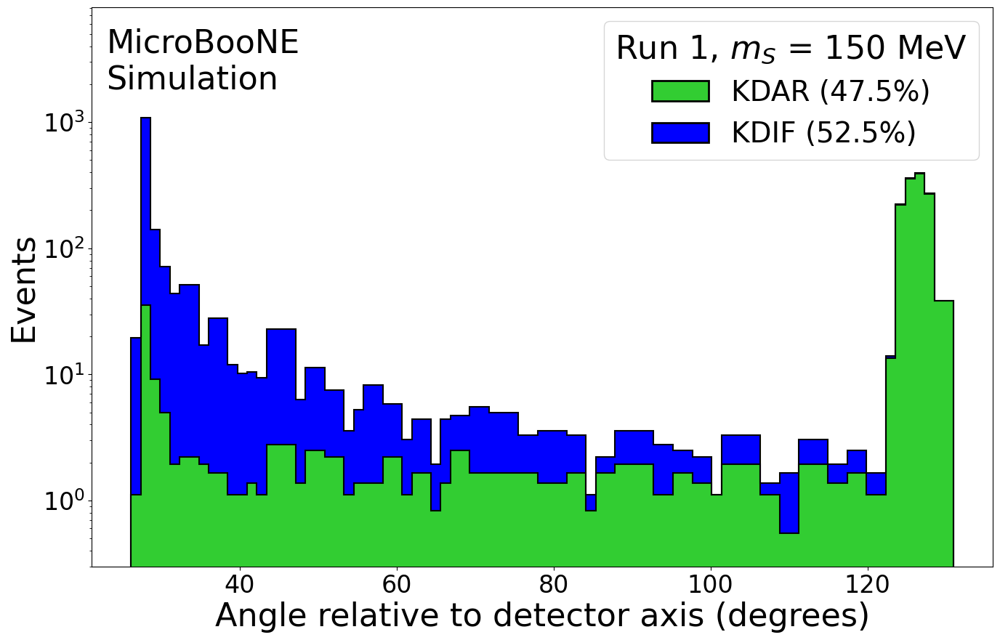

In [13]:
min_ang, max_ang = 20, 131
alt = True
test_hist = np.histogram(angles_tot, bins=100, weights=weights_tot)

if ones_weights:
    weights_kdif = np.ones_like(weights_kdif)
    weights_kdar = np.ones_like(weights_kdar)
    weights_tot = np.ones_like(weights_tot)

num_kdif = np.sum(weights_kdif)
num_kdar = np.sum(weights_kdar)
num_tot = np.sum(weights_tot)
bins = np.linspace(min_ang,max_ang,max_ang-min_ang-20)

min_count =  1
test_hist, bin_edges = np.histogram(angles_kdar, bins=bins, weights=weights_kdar)

hist_final = []
bin_edges_final = []
temp_count = 0
for i, count in enumerate(test_hist):
    temp_count += count
    if temp_count < min_count:
        None    
    else:
        hist_final.append(temp_count)
        bin_edges_final.append(bin_edges[i])
        temp_count = 0

bin_edges_final.append(bin_edges[-1])
bin_edges_final = np.array(bin_edges_final)
bin_centers_final = (bin_edges_final[:-1] + bin_edges_final[1:])/2
bins = bin_edges_final

plt.figure(figsize=(16,10), dpi=100)   
# plt.hist(angles_kdif, bins=bins, weights=weights_kdif, histtype='step', label='KDIF ({:.3}%)'.format(100*num_kdif/(num_kdif+num_kdar)), color='blue')
# plt.hist(angles_kdar, bins=bins, weights=weights_kdar, histtype='step', label='KDAR ({:.3}%)'.format(100*num_kdar/(num_kdif+num_kdar)), color='red')
# plt.hist(angles_tot, bins=bins, weights=weights_tot, histtype='step', label='Total', color='black')

hist_kdar, bin_edges = np.histogram(angles_kdar, bins=bins, weights=weights_kdar)
hist_kdif, bin_edges = np.histogram(angles_kdif, bins=bins, weights=weights_kdif)
hist_tot, bin_edges = np.histogram(angles_tot, bins=bins, weights=weights_tot)

if alt == True:
    c1 = 'limegreen'
    c2 = 'blue'
    alpha = 1
else:
    c1 = 'gold'
    c2 = 'red'
    alpha = 0.5
plt.bar(bin_centers_final, hist_kdar, width=np.diff(bin_edges_final), color=c1,alpha=alpha)
plt.hist(angles_kdar, bins=bins, weights=weights_kdar, histtype='step', linewidth=1.5, color='black')
plt.bar(bin_centers_final, hist_kdif, width=np.diff(bin_edges_final), bottom=hist_kdar, color=c2,alpha=alpha)
plt.hist(angles_tot, bins=bins, weights=weights_tot, histtype='step', linewidth=1.5, color='black')

plt.bar(-1,-1, label='KDAR ({:.3}%)'.format(100*num_kdar/(num_kdif+num_kdar)), color=c1, linewidth=2, alpha=alpha,edgecolor='black')
plt.bar(-1,-1, label='KDIF ({:.3}%)'.format(100*num_kdif/(num_kdif+num_kdar)), color=c2, linewidth=2, alpha=alpha,edgecolor='black')

plt.yscale('log')
plt.xlabel(r'Angle relative to detector axis (degrees)',fontsize=32)
plt.ylabel('Events',fontsize=32)
plt.xticks(fontsize=24)
plt.yticks(fontsize=24)

max_height = 7.5*np.max(hist_tot)


plt.text(1.15*min_ang, max_height*0.225,"MicroBooNE\nSimulation",fontsize=32)

min_ang = np.min(bin_edges_final)
max_ang = np.max(bin_edges_final)
plt.xlim(min_ang-5,max_ang+5)
plt.ylim(0.3,max_height)


if reweight:
    plt.legend(loc='upper right',title = rf'Run {loaded_run}, $m_a$ = {mass} MeV', title_fontsize=32, fontsize=28)
    ext = 'alp'
else:
    plt.legend(loc='upper right',title = rf'Run {loaded_run}, $m_S$ = {mass} MeV', title_fontsize=32, fontsize=28)
    ext = 'scalar'
save_figures = input("Do you want to save this figure? y/n ")

if alt == True:
    ext+='_alt'

if save_figures == "y":
    plt.savefig(root_dir+f"Plots/BDT_input/KDIF_KDAR_angle_{mass}_MeV_run" + Run + "_" + ext + ".pdf", dpi=100)
    plt.savefig(root_dir+f"Plots/BDT_input/KDIF_KDAR_angle_{mass}_MeV_run" + Run + "_" + ext  + ".png", dpi=100)
    print("saved")
    print("With names like " + f"KDIF_KDAR_angle_{mass}_MeV_run" + Run + "_" + ext + ".png")


# plt.show()

### Ratio of 1 or 2 reconstructed showers as a function of mass

In [381]:
def get_weighted_num_events(sample, name, mass, REWEIGHTING=False):
    
    weight = sample['scale_factor_ls']*new_hist_scaling[name]
    if REWEIGHTING == True:            
                ### I think we incorporate weights HERE!
        print('reweighting')       
        pdg = sample["mc_primary_pdg_ls"].to_numpy() # Try nu_parent_pdg_ls???
        bool_arr = np.abs(pdg) == 130
        tof = sample["tof"].to_numpy()*10**-9 ## (proper) time of flight given in nanoseconds
        theta  = theta_text_dict[f'{mass}']
        c_phi  = c_phi_text_dict[f'{mass}']
        c_w = 0
        c_B = 0
        alp_weight = dw.reweighting(tof, mass, theta, c_w, c_phi, c_B, klong=bool_arr)

        weight = weight*alp_weight
    
    return np.sum(weight)

In [189]:
mass_range = [100,125,130,135,140,145,150,200]
reweight = False

ratio_arr = []

for m in mass_range:
    temp = []

    for nshr in ['1shr', '2shr']:
        n_events = 0
        for k in ['KDIF', 'KDAR']:
            name = f"{str(m)}_{nshr}_{k}"
            temp_sample = samples_plotting["signal_"+name]
            n_events += get_weighted_num_events(temp_sample, name=name, mass=m, REWEIGHTING=reweight)
        print(f"Number of events for {m} MeV, {nshr} is {n_events}")
        temp.append(n_events)
    ratio_arr.append(temp)

ratio_arr = np.array(ratio_arr)

reweighting


KeyError: 'tof'

In [15]:
plt.plot(mass_range, ratio_arr[:,0],label='1shr')
plt.plot(mass_range, ratio_arr[:,1],label='2shr')
plt.legend()
plt.yscale('log')

TypeError: list indices must be integers or slices, not tuple

## Plotting BDT input variables

In [382]:
print("Potential variables to plot are:")
print(list(sample_dict['signal_150_1shr_KDIF'].keys()))

variables = ['NeutrinoEnergy2_ls', 'shr_px_v_ls', 'shr_pz_v_ls'] #BDT input variables Justin suggested to plot

Potential variables to plot are:
['run_ls', 'sub_ls', 'evt_ls', 'shr_energy_tot_ls', 'pfnplanehits_Y_ls', 'contained_fraction_ls', 'shr_pitch_u_v_ls', 'trk_energy_ls', 'contained_sps_ratio_ls', 'total_hits_y_ls', 'trk_energy_hits_tot_ls', 'shr_start_x_ls', 'nu_pdg_ls', 'ccnc_ls', 'nu_parent_pdg_ls', 'theta_ls', 'reco_nu_vtx_sce_x_ls', 'reco_nu_vtx_sce_y_ls', 'reco_nu_vtx_sce_z_ls', 'npi0_ls', 'crtveto_ls', 'slpdg_ls', 'trk_score_v_ls', 'topological_score_ls', 'ppfx_cv_ls', 'n_showers_contained_MCStool_ls', 'DeltaMed_ls', 'NeutrinoEnergy2_ls', 'shr_energy_y_v_ls', 'shr_pfp_id_v_ls', 'hits_v_ls', 'n_tracks_ls', 'pi0_dir1_x_ls', 'pi0_dir1_z_ls', 'pi0_energy1_Y_ls', 'pi0_mass_Y_ls', 'shrclusdir0_ls', 'shrclusdir1_ls', 'shrclusdir2_ls', 'shr_openangle_ls', 'shr_theta_ls', 'shr_pca_0_ls', 'shr_px_ls', 'shr_px_v_ls', 'shr_pz_ls', 'trk_len_v_ls', 'pfnhits_ls', 'nslice_ls', 'shr_py_v_ls', 'shr_pz_v_ls', 'shr_start_x_v_ls', 'shr_start_y_v_ls', 'shr_start_z_v_ls', 'shr_dedx_y_v_ls', 'nu_e_ls', 't

In [25]:
def Get_chi_squared(Obs_hist, Exp_hist, errors_hist):
    """
    Returns the chi squared value for an input observed, expected and error on expected hist. 
    """
    if len(Obs_hist) != len(Exp_hist) or len(Obs_hist)!= len( errors_hist):
        print("Histograms of different lenghts! Exiting.")
        return 0
    Total = 0.0
    for i, obs in enumerate(Obs_hist):
        if Exp_hist[i]==0: continue
        calc = (Obs_hist[i]-Exp_hist[i])**2/errors_hist[i]**2
        Total += calc
    return Total

def SF_times_weights_sample_names(sample_dict, sample, HNL_mass, Run, SF_signal):
    
    sample_start = sample.split("_")[0]
    
    if (sample_start == 'overlay') or (sample_start == 'dirtoverlay'): SF = sample_dict[sample]['ppfx_cv_ls']*sample_dict[sample]['scale_factor_ls']
    elif sample_start == 'beamoff': SF = np.ones(len(sample_dict[sample][f'run']))*sample_dict[sample]['scale_factor_ls']
    elif sample_start =='data': SF = np.ones(len(sample_dict[sample]["logit_pred"]))
    else: 
        SF = np.ones(len(sample_dict[sample]["logit_pred"]))*(sample_dict[sample]['scale_factor_ls']*SF_signal)
    return SF

def Plot_preselection_variable_data(variable, sample_endname, samples=[], xlabel=[],xlims=[0,0],bins=40,figsize=[10,10], thetas={}, HNL_scale=new_hist_scaling,
                                    scale_up=new_hist_scaling, dpi=100, HNL_mass = 0, legloc="best",logy=False, cutline=0.0, 
                                    show_ev_nums=False, CalcSys=False, xticks=[], colours_sample={}, order=[], sys_dict={}, centre_bins=False, 
                                    hatch=False, ylabel="Events", Frame=True, arrow_place=[], ylimit=None, legsize=22, display=True, 
                                    HNL_scale_label=False, err_print=False, Run="", chi_squared=False, 
                                    dirt_frac_error=1.0, ncols=1, title_name=None, sub_plot_range=None, 
                                    sub_ylabel=None, textpos=None, plot_text=None, textsize=16, plot_KDIF_KDAR=True, use_reweighting=False,):
    """
    This function takes the input samples, the signal scalings and plots the variable given in the first argument. 
    There are probably many unnecessary arguemnts but I've kept them in case extra customization is reqiured.
    """
    if(samples==[]): raise Exception("Specify samples dict") 
    if(xlabel==[]): xlabel=variable
    if(colours_sample=={}): colours_sample = {'overlay':'#0254cf','dirtoverlay':'cornflowerblue','beamoff':'limegreen',
                                              'signal':'red','signal_extra':'gold'}
    if(order==[]): order = ["beamoff","overlay","dirtoverlay"] #From bottom to top in stack
    if(sys_dict=={} and CalcSys==True): raise Exception("Specify systematic errors dict")
    if(plot_KDIF_KDAR): print("Plotting both KDIF and KDAR signal samples.")
    
    mass_str = sample_endname.split("_")[0]
    shr_str = sample_endname.split("_")[1]
    nshr_label = shr_str[0]
    K_str = sample_endname.split("_")[2]
    if K_str=="KDIF": extra_K_str = "KDAR" #This is so both KDAR and KDIF are on the same plot
    if K_str=="KDAR": extra_K_str = "KDIF"

    print("Number of showers: " + str(nshr_label))
    
    if nshr_label == "1": sys_dict_plot = sys_dict[0]
    if nshr_label == "2": sys_dict_plot = sys_dict[1]
    
    beamgood=samples[f"data_{sample_endname}"] 
    beamoff=samples[f"beamoff_{sample_endname}"]
    overlay=samples[f"overlay_{sample_endname}"]
    dirtoverlay=samples[f"dirtoverlay_{sample_endname}"]
    signal=samples[f"signal_{sample_endname}"]
    
    signal_extra = samples[f"signal_{mass_str}_{shr_str}_{extra_K_str}"]
       
    var_Data=beamgood[variable]
    var_Offbeam=beamoff[variable]
    var_Overlay=overlay[variable]
    var_Dirt=dirtoverlay[variable]
    var_HNL=signal[variable]
    var_HNL_extra=signal_extra[variable]
    
    variable_sample = {'overlay':var_Overlay,
                       'dirtoverlay':var_Dirt,
                       'beamoff':var_Offbeam,
                       'signal':var_HNL,
                       'signal_extra':var_HNL_extra}

    weight_Offbeam=samples[f"beamoff_{sample_endname}"]['scale_factor_ls']
    weight_Overlay=samples[f"overlay_{sample_endname}"]['scale_factor_ls'] #Was this, wasn't correctly accounting for ppfx weighting!
    weight_Overlay=samples[f"overlay_{sample_endname}"]['scale_factor_ls']*samples[f"overlay_{sample_endname}"]['ppfx_cv_ls']
    weight_Dirt=samples[f"dirtoverlay_{sample_endname}"]['scale_factor_ls']*samples[f"dirtoverlay_{sample_endname}"]['ppfx_cv_ls']
    weight_signal = samples[f"signal_{sample_endname}"]['scale_factor_ls']*new_hist_scaling[sample_endname]
    weight_signal_extra = samples[f"signal_{mass_str}_{shr_str}_{extra_K_str}"]['scale_factor_ls']*new_hist_scaling[f"{mass_str}_{shr_str}_{extra_K_str}"]
    

    # weight_signal = SF_times_weights_sample_names(samples, "signal_"+sample_endname, HNL_mass, Run, 1.0)*new_hist_scaling[sample_endname]
    # weight_signal_extra = SF_times_weights_sample_names(samples, f"signal_{mass_str}_{shr_str}_{extra_K_str}", HNL_mass, Run, 1.0)*new_hist_scaling[f"{mass_str}_{shr_str}_{extra_K_str}"]    


    if use_reweighting == True:            
                ### I think we incorporate weights HERE!

        # weight_signal = SF_times_weights_sample_names(samples, "signal_"+sample_endname, HNL_mass, Run, 1.0)
        # weight_signal_extra = SF_times_weights_sample_names(samples, f"signal_{mass_str}_{shr_str}_{extra_K_str}", HNL_mass, Run, 1.0)    

        mass = int(mass_str)  
        pdg = samples[f"signal_{sample_endname}"]["mc_primary_pdg_ls"].to_numpy() # Try nu_parent_pdg_ls???
        bool_arr = np.abs(pdg) == 130
        print(pdg[:10])
        print(bool_arr[:10])
        tof = samples[f"signal_{sample_endname}"]["tof"].to_numpy()*10**-9 ## (proper) time of flight given in nanoseconds
        theta  = theta_text_dict[f'{mass}']
        c_phi  = c_phi_text_dict[f'{mass}']
        c_w = 0
        c_B = 0
        reweighting = dw.reweighting(tof, mass, theta, c_w, c_phi, c_B, klong=bool_arr)
        weight_signal = weight_signal*reweighting


        pdg = samples[f"signal_{mass_str}_{shr_str}_{extra_K_str}"]["mc_primary_pdg_ls"].to_numpy() # Try nu_parent_pdg_ls???
        bool_arr = np.abs(pdg) == 130
        print(pdg[:10])
        print(bool_arr[:10])
        tof = samples[f"signal_{mass_str}_{shr_str}_{extra_K_str}"]["tof"].to_numpy()*10**-9 ## (proper) time of flight given in nanoseconds
        theta  = theta_text_dict[f'{mass}']
        c_phi  = c_phi_text_dict[f'{mass}']
        c_w = 0
        c_B = 0
        reweighting = dw.reweighting(tof, mass, theta, c_w, c_phi, c_B, klong=bool_arr)

        weight_signal_extra = weight_signal_extra*reweighting

    weights_sample = {'overlay':weight_Overlay,
                      'dirtoverlay':weight_Dirt,
                      'beamoff':weight_Offbeam,
                      'signal':weight_signal,
                      'signal_extra':weight_signal_extra}
    
    if xlims[0] == 0 and xlims[1] == 0: xlims = [min(var_Overlay),max(var_Overlay)]
    
    if(isinstance(bins, int)):
        nbins=bins
        if centre_bins == True:
            bins=np.linspace(xlims[0],xlims[1],nbins+1)-0.5
        else:
            bins=np.linspace(xlims[0],xlims[1],nbins+1)
    else: nbins=len(bins)-1
    
    #all UNWEIGHTED hists
    totbkg=np.histogram(var_Offbeam,bins=bins,range=xlims)[0]+np.histogram(var_Dirt,bins=bins,range=xlims)[0]+np.histogram(var_Overlay,bins=bins,range=xlims)[0]
    offbkg=np.histogram(var_Offbeam,bins=bins,range=xlims)[0]
    overlaybkg=np.histogram(var_Overlay,bins=bins,range=xlims)[0]
    dirtbkg=np.histogram(var_Dirt,bins=bins,range=xlims)[0]
    
    #weighted hists
    offbkg_weighted=np.histogram(var_Offbeam,bins=bins,range=xlims,weights=weight_Offbeam)[0]
    overlaybkg_weighted=np.histogram(var_Overlay,bins=bins,range=xlims,weights=weight_Overlay)[0]
    dirtbkg_weighted=np.histogram(var_Dirt,bins=bins,range=xlims,weights=weight_Dirt)[0]
           
    #Testing Owens way, Err = sqrt(N*S.F**2)
    mc_w=np.histogram(var_Overlay,bins=bins,range=xlims,weights=weight_Overlay**2)
    off_w=np.histogram(var_Offbeam,bins=bins,range=xlims,weights=weight_Offbeam**2)
    dirt_w=np.histogram(var_Dirt,bins=bins,range=xlims,weights=weight_Dirt**2)
    
    off_err=np.sqrt(off_w[0])
    mc_err=np.sqrt(mc_w[0])
    dirt_err=np.sqrt(dirt_w[0])
    
    # stat_bkgerr=np.sqrt(offbkg_stat**2+overlaybkg_stat**2+dirtbkg_stat**2) #Adding stat errors in quadrature, my way
    stat_bkgerr=np.sqrt(off_err**2+mc_err**2+dirt_err**2) #Adding stat errors in quadrature for EXT,overlay,dirtoverlay
    tot_mcerr = stat_bkgerr
    
    if(CalcSys): #Owen's way of calculating systematics for arbitrary variable, using my new function
        frac_total = 0
        for frac_sys in sys_dict_plot[variable]: #This contains the genie and ppfx fractional uncertainties
            frac_total += frac_sys**2 #Adding genie and ppfx uncertainties in quadrature
        
        total_frac_sys = np.sqrt(frac_total) #Quadrature sum of the genie and ppfx fractional errors
        total_sys_err = total_frac_sys*overlaybkg_weighted #Genie and ppfx uncertainty on the overlay
        
        dirt_norm_err_fac = dirt_frac_error #100% dirt normalization uncertainty from Krish "conservative"
        dirt_norm_err=dirtbkg_weighted*dirt_norm_err_fac
        tot_mcerr=np.sqrt(stat_bkgerr**2+total_sys_err**2+dirt_norm_err**2)
        if(err_print):
            print("dirt error: " + str(dirt_norm_err))
            print("genie and ppfx error: " + str(total_sys_err))
            print("mc stat error: " + str(stat_bkgerr))
            print("Total error: " + str(tot_mcerr))
    
    fig,ax = plt.subplots(nrows=2, ncols=1, sharex=True, gridspec_kw={'height_ratios': [3, 1]}, figsize=figsize,dpi=dpi)
    
    plt.sca(ax[0])
    
    if isinstance(title_name, str): plt.title(title_name, fontsize=24)
        
    x,y=np.histogram(var_Data,bins=bins,range=xlims)
    x1,y=np.histogram(var_Data,bins=bins,range=xlims)
    bin_center = [(y[i] + y[i+1])/2. for i in range(len(y)-1)]
    dat_val=x
    dat_err=np.sqrt(x1)*np.nan_to_num(x/x1)

    Datanum=dat_val.sum()
    Offbeamnum=sum(weight_Offbeam)
    Dirtnum=sum(weight_Dirt)
    Overlaynum=sum(weight_Overlay) 
    HNL_num=sum(weight_signal)
    HNL_num_extra=sum(weight_signal_extra)
    
    plotted_beamoff = sum(offbkg_weighted)
    plotted_overlay = sum(overlaybkg_weighted)
    plotted_dirt = sum(dirtbkg_weighted)
    total_data_hist = np.histogram(var_Data,bins=np.linspace(-9999, 9999, num=2))[0]
    total_data = sum(total_data_hist)
    
    if HNL_scale_label==False: 
        HNL_label = f"{HNL_mass} MeV HNL"
    if HNL_scale_label==True: 
        mass_label=int(HNL_mass.split("_")[0])
        
        if use_reweighting:

            theta = thetas[HNL_mass]
            theta_label = sci_notation(theta, decimal_digits=1)
            HNL_label = f"{mass_label} MeV ALP $a$ {K_str} \n" + r"$c_\phi$ = " + theta_label
            HNL_extra_label = f"{mass_label} MeV ALP $a$ {extra_K_str} \n" + r"$c_\phi$ = " + theta_label
        else:
            theta = thetas[HNL_mass]
            theta_2 = theta**2
            new_theta = np.sqrt(scale_up[HNL_mass])*theta
            theta_label = sci_notation(new_theta, decimal_digits=1)
            HNL_label = f"{mass_label} MeV scalar S {K_str} \n" + r"$\theta$ = " + theta_label
            HNL_extra_label = f"{mass_label} MeV scalar S {extra_K_str} \n" + r"$\theta$ = " + theta_label
    
    if show_ev_nums==True:
        labels_sample = {'overlay':fr"In-Cryo $\nu$ ({Overlaynum:.1f})",
                         'dirtoverlay':fr"Out-Cryo $\nu$ ({Dirtnum:.1f})",
                         'beamoff':f"Beam-Off ({Offbeamnum:.1f})",}
                        #  'signal':f"{HNL_mass} MeV scalar S ({HNL_num:.1f})"}
        if use_reweighting == True:
            labels_sample.update({'signal':f"{HNL_mass} MeV ALP a ({HNL_num:.1f})"})
        else:
            labels_sample.update({'signal':f"{HNL_mass} MeV scalar S ({HNL_num:.1f})"})
        # labels=[fr"In-Cryo $\nu$ ({Overlaynum:.1f})",fr"Out-Cryo $\nu$ ({Dirtnum:.1f})",f"Beam-Off ({Offbeamnum:.1f})"]
        # sig_label = [f"{HNL_mass} MeV HPS {K_str} ({HNL_num:.1f})"] #HNL_label
        # extra_sig_label = [f"{HNL_mass} MeV HPS {extra_K_str} ({HNL_num_extra:.1f})"] #HNL_extra_label

        sig_label = [HNL_label+f"({HNL_num:.1f})"] #HNL_label
        extra_sig_label = [HNL_extra_label + f"({HNL_num_extra:.1f})"] #HNL_extra_label
        sig_extra_label = [HNL_extra_label + f"({HNL_num_extra:.1f})"]
        data_label = f"{Run} NuMI Data ({Datanum:.0f})"
        
        data_mc = Datanum/(plotted_overlay+plotted_dirt+plotted_beamoff)
        
        print(f"Plotted data: {Datanum}")
        print(f"Plotted overlay: {plotted_overlay}")
        print(f"Plotted dirt: {plotted_dirt}")
        print(f"Plotted beamoff: {plotted_beamoff}")
        print(f"Plotted Data/MC = {data_mc:.2f}")
        data_mc_full = total_data/(Overlaynum+Dirtnum+Offbeamnum)
        print(f"Total data: {total_data}")
        print(f"Total overlay: {Overlaynum}")
        print(f"Total dirt: {Dirtnum}")
        print(f"Total beamoff: {Offbeamnum}")
        print(f"Full range Data/MC = {data_mc_full:.2f}")

        # sig_label = [HNL_label]
        # sig_extra_label = [HNL_extra_label]
        # data_label = f"{Run} NuMI Data"
    else:
        labels_sample = {'overlay':fr"In-Cryo $\nu$",
                         'dirtoverlay':fr"Out-Cryo $\nu$",
                         'beamoff':f"Beam-Off",
                         'signal':HNL_label}
        
        #  'signal':f"{HNL_mass} MeV scalar S ({HNL_num:.1f})"}
        # if use_reweighting == True:
        #     labels_sample.update({'signal':f"{HNL_mass} MeV ALP a ({HNL_num:.1f})"})
        # else:
        #     labels_sample.update({'signal':f"{HNL_mass} MeV scalar S ({HNL_num:.1f})"})
        
        if (plot_KDIF_KDAR): labels_sample.update({'signal_extra':HNL_extra_label})

        sig_label = [HNL_label]
        sig_extra_label = [HNL_extra_label]
        data_label = f"{Run} NuMI Data"
    
    plt.errorbar(bin_center,dat_val,yerr=dat_err,fmt='.',color='black',lw=5,capsize=5,elinewidth=3,label=data_label) #Plotting data

    varis, weights, colors, labels = [], [], [], []
    for sample in order:
        varis.append(variable_sample[sample])
        weights.append(weights_sample[sample])
        colors.append(colours_sample[sample])
        labels.append(labels_sample[sample])
            
    plot=plt.hist(varis, label=labels, range=xlims, bins=bins,
                  histtype="stepfilled", stacked=True,density=False,linewidth=2,edgecolor="black",
                  weights=weights, color=colors)
    
    upvals=np.append((plot[0][2]+tot_mcerr),(plot[0][2]+tot_mcerr)[-1])
    lowvals=np.append((plot[0][2]-tot_mcerr),(plot[0][2]-tot_mcerr)[-1])
    
    if hatch == False:
        plt.fill_between(y, lowvals, upvals,step="post",color="grey",alpha=0.3,zorder=2)
    if hatch == True:
        plt.fill_between(y, lowvals, upvals,step="post",hatch='//',alpha=0,zorder=2)

    color=colours_sample["signal"]
    
    bkg_stack=varis
    bkg_stack_w=weights

    plt.hist(var_HNL,
             label=sig_label,
             range=xlims,bins=bins,
             stacked=True,density=False,
             weights=weight_signal,histtype="step",color=color,lw=4)
    if (plot_KDIF_KDAR):
        plt.hist(var_HNL_extra,
                 label=sig_extra_label,
                 range=xlims,bins=bins,
                 stacked=True,density=False,
                 weights=weight_signal_extra,histtype="step",color=colours_sample["signal_extra"],lw=4)
    



    if(logy == True): plt.yscale("log")
    else: plt.yscale("linear")
        
    if chi_squared==True:
        Exp_hist = offbkg_weighted+overlaybkg_weighted+dirtbkg_weighted
        Obs_hist = dat_val
        chi_square_val = Get_chi_squared(Obs_hist, Exp_hist, tot_mcerr)
        reduced_chi_squared = chi_square_val/(len(Obs_hist)) # degrees of freedom is no. of bins here
        print("d.o.f is " + str(len(Obs_hist)))
        print("Chi squared is " + str(chi_square_val))
        print("Reduced Chi squared is " + str(reduced_chi_squared))
            
    if isinstance(ylabel, str): plt.ylabel(ylabel, fontsize=textsize)
    if isinstance(legsize, int):
        plt.legend(loc=legloc,frameon=Frame, prop={'size': legsize}, ncols=ncols)
    
    plt.xlim(xlims)
    if ylimit != None: plt.ylim(0,ylimit)
    
    plt.bar([-1],[-1],color="grey", alpha=0.3, label="Total uncertainty",lw=3)
    handles, labels = plt.gca().get_legend_handles_labels()
    order = [0,1,2,6,4,3,5]
    if plot_text != None:
        plt.legend([handles[idx] for idx in order],[labels[idx] for idx in order], loc=legloc,frameon=Frame, prop={'size': legsize}, ncols=ncols, title=plot_text, title_fontsize=1.1*legsize)
        
    plt.yticks(fontsize=18)
    
    #-------------------------#
    #--------Sub-plot---------#
    #-------------------------#
    plt.sca(ax[1])
    
    fracer_data=np.nan_to_num(np.sqrt(x1)/x1)
    x_err=fracer_data*x
    fracer_mc=np.nan_to_num(tot_mcerr/plot[0][2])
    
    rat_err_data=x_err*(1/plot[0][2])
    
    rat_err_mc=fracer_mc
    rat_err=np.sqrt(rat_err_data**2)

    rat_err_mc=np.nan_to_num(rat_err_mc) 

    upvals=np.append(1+(rat_err_mc),1+(rat_err_mc)[-1]) #hate this but need to repeat last value to get bar on last bin to work, saw it here https://matplotlib.org/stable/gallery/lines_bars_and_markers/filled_step.html
    lowvals=np.append(1-(rat_err_mc),1-(rat_err_mc)[-1])

    # plt.hist(bins_cent_dict[HNL_mass],
    #                  weights=1-(fracer_stat),
    #                  bins=bins_dict[HNL_mass],
    #                  lw=1, edgecolor="red", histtype="step", label="Stat. quadrature sum")
    # plt.step(bins_cent_dict[HNL_mass],
    #             weights=1+(fracer_stat),
    #             bins=bins_dict[HNL_mass],
    #             lw=1, edgecolor="red", histtype="step")

    # Hacky way to get the error bar onto a legend. Not currently used, instead in the main plot.
    # plt.plot(-1,-1,color="grey", alpha=0.3, label="Stat. + Sys. error",lw=3)
    # plt.legend(loc=legloc,frameon=Frame, prop={'size': legsize}, )
    plt.fill_between(y, lowvals, upvals,step="post",color="grey",alpha=0.3,zorder=2)
    
    rat=np.nan_to_num(x/plot[0][2])
    rat[x==0]=1 #dont think this is a good way to deal with this

    rat_err=np.nan_to_num(rat*np.sqrt(fracer_mc**2+fracer_data**2))
    
    plt.errorbar(bin_center,rat,yerr=fracer_data,fmt='.',color='black',lw=3,capsize=3,elinewidth=1,label="data")
    if isinstance(sub_ylabel, str): plt.ylabel(sub_ylabel, fontsize=textsize)
    else: plt.ylabel("Data/MC", fontsize=textsize)
    plt.axhline(1,ls='-',color='black')
    # plt.axhline(1.1,ls='--',color='grey') #in case you want 10% error lines
    # plt.axhline(0.9,ls='--',color='grey')
    ylim = max(abs(np.nan_to_num(rat)))*1.1 #Not currently used
    if sub_plot_range != None: plt.ylim(1-sub_plot_range,1+sub_plot_range)
    else: plt.ylim(0.7,1.3)
    plt.xlim(xlims)
    if xticks != []:
        plt.xticks(xticks, fontsize=18)
    else: plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)
    
    plt.xlabel(xlabel+r', $n_{\mathrm{shower}}=$'+f'{nshr_label}', fontsize=textsize)
    
    plt.tight_layout(rect=[0, 0, 1, 0.92])
    
    if display == False:
        plt.close()
        
    if chi_squared==True: return reduced_chi_squared


# A note on uncertainties

The uncertainties plotted in the input variable plots are quadrature sums of the different sources of uncertainty. 
The Flux, cross-section, reinteractions, and detector modelling uncertainties for the in-cryostat sample are taken as FLAT across the distributions. 
This assumption of flat uncertainties is checked when the uncertainty sources are plotted later in the script.
The reason for not calculating these uncertainties fully for each plot is that it takes several minutes for each calculation.

Also because the reinteraction uncertainties are so small (~5% or lower), we do not plot them in the plots below.

In [384]:
run1_Sys_unc_1shr = {'NeutrinoEnergy2_ls':[0.117, 0.135, 0.0769], #Entries are [PPFX, Genie, Detector] fractions, for overlay and with swtrig and nslice applied 
                'shr_px_v_ls':[0.101, 0.120, 0.053],
                'shr_pz_v_ls':[0.101, 0.120, 0.0591]}

run1_Sys_unc_2shr = {'NeutrinoEnergy2_ls':[0.117, 0.135, 0.129], #Entries are [PPFX, Genie, Detector] fractions, for overlay and with swtrig and nslice applied 
                'shr_px_v_ls':[0.101, 0.120, 0.0927],
                'shr_pz_v_ls':[0.101, 0.120, 0.102]}

run1_Sys_unc = [run1_Sys_unc_1shr, run1_Sys_unc_2shr]


run3_Sys_unc_1shr = {'NeutrinoEnergy2_ls':[0.117, 0.135, 0.0769],
                    'shr_px_v_ls':[0.101, 0.120, 0.053],
                    'shr_pz_v_ls':[0.101, 0.120, 0.0591]}

run3_Sys_unc_2shr = {'NeutrinoEnergy2_ls':[0.117, 0.135, 0.129],
                    'shr_px_v_ls':[0.101, 0.120, 0.0927],
                    'shr_pz_v_ls':[0.101, 0.120, 0.102]}

run3_Sys_unc = [run3_Sys_unc_1shr, run3_Sys_unc_2shr]

variable_names_dict = {'NeutrinoEnergy2_ls':"Reconstructed Energy in Y plane [MeV]", 'shr_px_v_ls':"Shower $p_{x}$ fraction", 'shr_pz_v_ls':"Shower $p_{z}$ fraction"}

Variables_bins = {'NeutrinoEnergy2_ls':np.linspace(0.001,2000,21), #WAS np.linspace(0.001,2000,21)
                  'shr_px_v_ls':np.linspace(-1.0,1.0,21), 
                  'shr_pz_v_ls':np.linspace(-1.0,1.0,21),
                  'shr_pz_ls':np.linspace(-200,600,21)}

theta_scaling, hist_scaling = {}, {}
limit_theta_power_1 = {}
paper_limits = {100:3.08e-4, 125:2.93e-4, 130:2.94e-4, 135:3.21e-4, 140:2.79e-4, 145:2.47e-4, 150:2.9e-4, 200:2.31e-4}
for HNL_mass in theta_dict:
    mass_label=int(HNL_mass.split("_")[0])
    theta_scaling[HNL_mass] = paper_limits[mass_label]/(theta_dict[HNL_mass])
    hist_scaling[HNL_mass] = theta_scaling[HNL_mass]**(2)
    
print("Scalings for theta values are: ")
print(theta_scaling)
print("Scalings for signal hists are: ")
print(hist_scaling)

print()
print(variables)


Scalings for theta values are: 
{'100_1shr_KDIF': 0.5746268656716418, '100_1shr_KDAR': 0.5746268656716418, '100_2shr_KDIF': 0.5746268656716418, '100_2shr_KDAR': 0.5746268656716418, '125_1shr_KDIF': 0.5327272727272727, '125_1shr_KDAR': 0.5327272727272727, '125_2shr_KDIF': 0.5327272727272727, '125_2shr_KDAR': 0.5327272727272727, '130_1shr_KDIF': 0.5306859205776173, '130_1shr_KDAR': 0.5306859205776173, '130_2shr_KDIF': 0.5306859205776173, '130_2shr_KDAR': 0.5306859205776173, '135_1shr_KDIF': 0.575268817204301, '135_1shr_KDAR': 0.575268817204301, '135_2shr_KDIF': 0.575268817204301, '135_2shr_KDAR': 0.575268817204301, '140_1shr_KDIF': 0.4955595026642984, '140_1shr_KDAR': 0.4955595026642984, '140_2shr_KDIF': 0.4955595026642984, '140_2shr_KDAR': 0.4955595026642984, '145_1shr_KDIF': 0.4348591549295774, '145_1shr_KDAR': 0.4348591549295774, '145_2shr_KDIF': 0.4348591549295774, '145_2shr_KDAR': 0.4348591549295774, '150_1shr_KDIF': 0.5061082024432809, '150_1shr_KDAR': 0.5061082024432809, '150_2shr

In [385]:
Calculate_sys = True
variable = 'shr_pz_v_ls'

HNL_mass = 150

sample_options = [f'{HNL_mass}_1shr_KDIF', f'{HNL_mass}_1shr_KDAR', f'{HNL_mass}_2shr_KDIF', f'{HNL_mass}_2shr_KDAR']
sample_endname = f'{HNL_mass}_1shr_KDIF'

samples_plotting = sample_dict

print("\'"+variable+"\'")
print(f"Plotting for {sample_endname}")

if Run == "1": flat_sys_vars_dict = run1_Sys_unc
if Run == "3": flat_sys_vars_dict = run3_Sys_unc

print("Maximum value in overlay is " + str(max(samples_plotting[f"overlay_{sample_endname}"][variable].to_numpy())))    
print("Maximum value in signal is " + str(max(samples_plotting[f"signal_{sample_endname}"][variable].to_numpy()))) 
print("Manimum value in signal is " + str(min(samples_plotting[f"signal_{sample_endname}"][variable].to_numpy()))) 
# samples_plotting.keys()


'shr_pz_v_ls'
Plotting for 150_1shr_KDIF
Maximum value in overlay is 0.9998097
Maximum value in signal is 0.99977833
Manimum value in signal is -0.9983293


Plotting shr_pz_v_ls for Run 1
Not using reweighting
Plotting both KDIF and KDAR signal samples.
Number of showers: 1
Plotted data: 11062
Plotted overlay: 4457.623705872789
Plotted dirt: 680.9832914643185
Plotted beamoff: 5886.518662013613
Plotted Data/MC = 1.00
Total data: 11062
Total overlay: 4457.623705872802
Total dirt: 680.9832914643205
Total beamoff: 5886.518662013613
Full range Data/MC = 1.00
d.o.f is 20
Chi squared is 10.669537578757529
Reduced Chi squared is 0.5334768789378764
saved
With names like BDT_input_shr_pz_v_ls_run1_150_1shr_BOTH


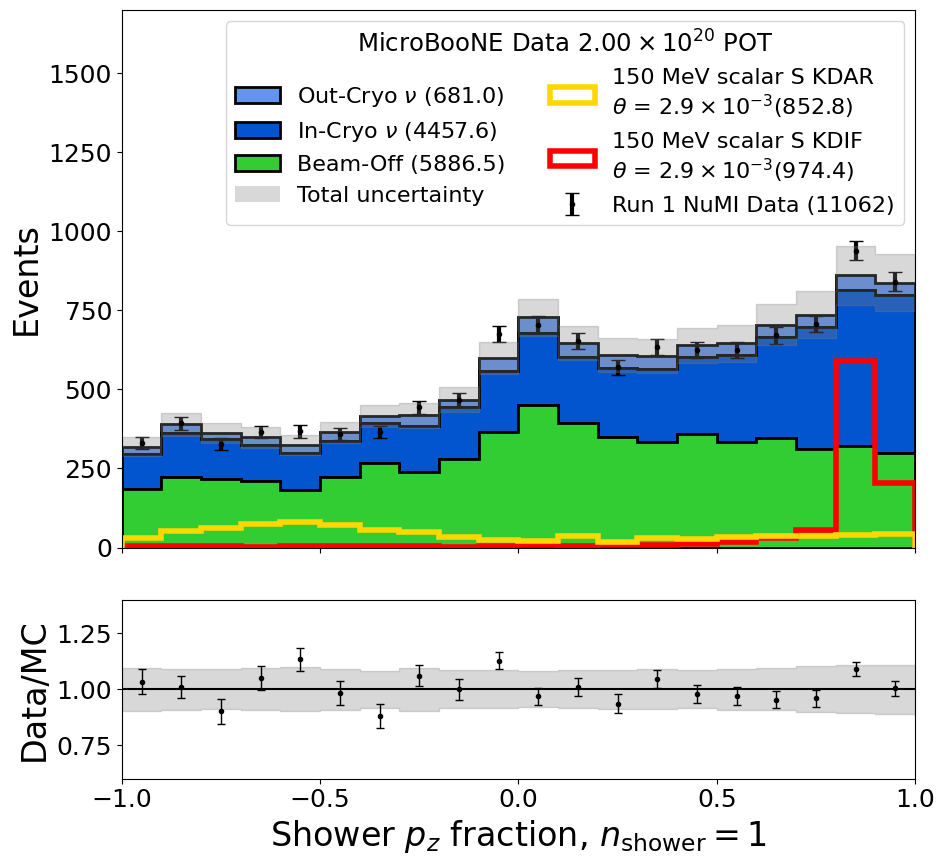

In [386]:
print(f"Plotting {variable} for Run {Run}")

if variable in variable_names_dict: xlabel = variable_names_dict[variable]
else: xlabel = variable

if variable in Variables_bins: bins = Variables_bins[variable]
else: bins = np.linspace(0, 10, 21) #Random default plotting bins
xlims = [bins[0],bins[-1]]
# print(bins)
# print(xlims)


bins_var = bins

if Run=="1": 
    Run_name = "Run 1"
    titlename = r"MicroBooNE Data $2.00\times10^{20}$ POT"
if Run=="3": 
    Run_name = "Run 3"
    titlename = r"MicroBooNE Data $5.01\times10^{20}$ POT"
    
# titlename = r"MicroBooNE Data $5.01\times10^{20}$ POT"

sample_colours_test = {'overlay':'#0254cf',
                       'dirtoverlay':'cornflowerblue',
                       'beamoff':'limegreen',
                       'signal':'red',
                       "signal_extra":"gold"}

reduced_chi_squared_dict={}

plot_KDIF_KDAR=True
reweight = False

if reweight:
    angles = c_phi_dict
    print("Using reweighting")
else:
    angles = theta_dict
    print("Not using reweighting")

#Set legsize=None to not show legend!
reduced_chi_squared_dict[variable]=Plot_preselection_variable_data(variable, sample_endname, samples_plotting, xlabel=xlabel, xlims=xlims, 
                                                                      bins=bins, HNL_mass=sample_endname, thetas=angles,HNL_scale=new_hist_scaling,
                                   cutline=[], legloc="best", show_ev_nums=True, 
                                   CalcSys=Calculate_sys, logy=False, colours_sample=sample_colours_test,
                                   xticks=[], sys_dict=flat_sys_vars_dict, centre_bins=False, hatch=False, ylabel="Events", 
                                   arrow_place=[], ylimit=1700, legsize=16, err_print=False, Run=Run_name, chi_squared=True, 
                                   dirt_frac_error=0.75, HNL_scale_label=True, 
                                   ncols=2, title_name=None, sub_plot_range=0.4, sub_ylabel="Data/MC",
                                   plot_text=titlename, textsize=24, plot_KDIF_KDAR=plot_KDIF_KDAR, use_reweighting=reweight)


Name = ""
if Calculate_sys==True: Sys_name = "with_sys"
if Calculate_sys==False: Sys_name = "no_sys"

save_figures = input("Do you want to save this figure? y/n ")

shr_endname = sample_endname
if (plot_KDIF_KDAR): shr_endname = sample_endname.split("_")[0]+"_"+sample_endname.split("_")[1]+"_BOTH"

if save_figures == "y":
    plt.savefig(root_dir+f"Plots/BDT_input/BDT_input_{variable}_run" + Run + "_" + str(shr_endname) + ".pdf")
    plt.savefig(root_dir+f"Plots/BDT_input/BDT_input_{variable}_run" + Run + "_" + str(shr_endname) + ".png")
    print("saved")
    print("With names like " + f"BDT_input_{variable}_run" + Run + "_" + str(shr_endname))


## Merging bins for new BDT score histograms

In [84]:
# HNL_masses = [100, 125, 130, 135, 140, 145, 150, 200]
signal_SF_dict = {100:5.0, 125:4.0, 130:3.0, 135:3.0, 140:2.0, 145:2.0, 150:1.5, 200:0.8}

max_scores, min_scores = [], []
# for HNL_mass in HNL_masses:
for name_str in sample_dict:
    names_split = name_str.split("_")
    end_name = names_split[1]+"_"+names_split[2]+"_"+names_split[3]
    # max_scores.append(max(sample_test_dict[str(HNL_mass)+name_ends]['logit_pred']))
    max_scores.append(max(sample_dict["signal_"+end_name]['logit_pred']))
    min_scores.append(min(sample_dict["overlay_"+end_name]['logit_pred']))
    
max_all_scores = max(max_scores)
min_all_scores = min(min_scores)
print("Maximum score for all signal samples is " + str(max_all_scores))
print("Minimum score for all signal samples is " + str(min_all_scores))                     

max_score_int = np.ceil(max_all_scores)
min_score_int = np.floor(min_all_scores)
print("Maximum integer for bins is " + str(max_score_int))
print("Minimum integer for bins is " + str(min_score_int))


Maximum score for all signal samples is 7.32858943939209
Minimum score for all signal samples is -10.778789520263672
Maximum integer for bins is 8.0
Minimum integer for bins is -11.0


In [85]:
#Checking which bins to merge Need to properly write this
merged_bins_dict, bin_cents = {}, {}
# min_score_cut = -5.0
min_score_cut = min_score_int
xlims = [min_score_cut,max_score_int]
nbins = int(xlims[1]-xlims[0])
min_overlay = 3 #The threshold of minimum overlay events required in a bin, used to be 1
print("Initial nbins is " + str(nbins))
print("With range of " + str(xlims))
print(f"Requiring more than {min_overlay} overlay events in each bin")

for name_str in sample_dict:
    names_split = name_str.split("_")
    end_name = names_split[1]+"_"+names_split[2]+"_"+names_split[3]
    
    bins_list = np.histogram(sample_dict["overlay_"+end_name]['logit_pred'],bins=nbins,range=xlims)[1]
    bkg_scores=[sample_dict['overlay_'+end_name]['logit_pred'],
                sample_dict['dirtoverlay_'+end_name]['logit_pred'],
                sample_dict['beamoff_'+end_name]['logit_pred']]
    totbkg=np.histogram(bkg_scores[0],bins=nbins,range=xlims)[0]+np.histogram(bkg_scores[1],bins=nbins,range=xlims)[0]+np.histogram(bkg_scores[2],bins=nbins,range=xlims)[0]
    offbkg=np.histogram(bkg_scores[2],bins=nbins,range=xlims)[0]
    overlaybkg=np.histogram(bkg_scores[0],bins=nbins,range=xlims)[0]
    dirtbkg=np.histogram(bkg_scores[1],bins=nbins,range=xlims)[0]
    bins_new=[]
    for i,bin_bkg in enumerate(totbkg):
        if(overlaybkg[i]>min_overlay): #Checking if unweighted overlay bkg has at least one event in the bin
            bins_new.append(bins_list[i])

    bins_new.append(bins_list[-1])
    merged_bins_dict[end_name] = bins_new
    bin_cents[end_name] = (np.array(bins_new[:-1])+np.array(bins_new[1:]))/2

#This is just to check that the events in the samples have NOT been used for BDT training, i.e they are only test events.    
hist_type_list = ["overlay", "dirtoverlay", "beamoff", "signal"]
for hist_type in hist_type_list:
    print(f"------{hist_type}------")
    Get_ratios_trained(sample_dict[hist_type+"_100_1shr_KDIF"])
    print()
    

Initial nbins is 19
With range of [-11.0, 8.0]
Requiring more than 3 overlay events in each bin
------overlay------
Zeros: 15058
Ones: 0
Fraction of zeros: 1.0

------dirtoverlay------
Zeros: 1187
Ones: 0
Fraction of zeros: 1.0

------beamoff------
Zeros: 6669
Ones: 0
Fraction of zeros: 1.0

------signal------
Zeros: 5318
Ones: 0
Fraction of zeros: 1.0



In [86]:
def make_overflow_bin(bins_dict, bins_cents_dict):
    """
    For making the final "overflow" bin the same size as the previous bins, i.e one integer in width.
    """
    bins_overflow, bins_cent_overflow = {}, {}
    for HNL_mass in bins_dict:
        overflow_bin = bins_cents_dict[HNL_mass][-2]+1 #Just adding one to the penultimate bin centre val. 
        bins_cent_overflow[HNL_mass] = bins_cents_dict[HNL_mass].copy()
        bins_cent_overflow[HNL_mass][-1] = overflow_bin
        bins_overflow[HNL_mass] = bins_dict[HNL_mass].copy()
        bins_overflow[HNL_mass][-1] = bins_dict[HNL_mass][-2]+1 #Just adding one to the penultimate bin end val. 
    return bins_overflow, bins_cent_overflow

bins_overflow, bins_cents_overflow = make_overflow_bin(merged_bins_dict, bin_cents)

def make_xlims_dict(bins_dict, spacing, lower = None):
    """
    Making a dict of xlims for plotting several mass points at once.
    Also returns a dict of xticks for the purpose of indicating the overflow.
    """
    xlims_adjusted, xticks_adjusted = {}, {}
    vals_dict={}
    for HNL_mass in bins_dict:
        if isinstance(lower,(int, float)): lower_val = lower
        else: lower_val = bins_dict[HNL_mass][0]
        xlims_adjusted[HNL_mass] = [lower_val,bins_dict[HNL_mass][-1]]
        ticks = np.arange(bins_dict[HNL_mass][0], bins_dict[HNL_mass][-1], spacing)
        if ticks[-1] != bins_dict[HNL_mass][-2]: ticks = np.append(ticks, bins_dict[HNL_mass][-1]-1)
        ticks_strings = []
        vals = []
        for val in ticks:
            ticks_strings.append(str(int(val)))
            vals.append(val)
        ticks_strings[-1] = str(ticks_strings[-1])+"+"
        xticks_adjusted[HNL_mass] = ticks_strings
        vals_dict[HNL_mass] = vals
        
    return xlims_adjusted, xticks_adjusted, vals_dict

xlims_dict, xticks_dict, vals_dict = make_xlims_dict(bins_overflow, 2)

xlims=[min_score_int,max_score_int]    
BINS = int(xlims[1]-xlims[0])

## Get detector uncertainty

In [87]:
def safe_div(x,y):
    if y == 0.0:
        return 0
    return x / y

def get_frac_ydata_std_dev_detsys(df, var, bins, bdt_score_str='0.0'):

    y_CV, bin_CV = np.histogram(df.query('pred_CV >='+bdt_score_str)[var+'_CV'], bins=bins)
    y_ly_atten,_ = np.histogram(df.query('pred_LYAttenuation >='+bdt_score_str)[var+'_LYAttenuation'], bins=bins)

    y_ly_down,_ = np.histogram(df.query('pred_LYDown >='+bdt_score_str)[var+'_LYDown'], bins=bins)
    y_ly_rayleigh,_ = np.histogram(df.query('pred_LYRayleigh >='+bdt_score_str)[var+'_LYRayleigh'], bins=bins)
    y_recomb,_ = np.histogram(df.query('pred_Recomb2 >='+bdt_score_str)[var+'_Recomb2'], bins=bins)
    y_sce,_  = np.histogram(df.query('pred_SCE >='+bdt_score_str)[var+'_SCE'], bins=bins)
    y_wiremod_anglexz,_ = np.histogram(df.query('pred_WireModThetaXZ >='+bdt_score_str)[var+'_WireModThetaXZ'], bins=bins)
    y_wiremod_angleyz,_ = np.histogram(df.query('pred_WireModThetaYZ >='+bdt_score_str)[var+'_WireModThetaYZ'], bins=bins)
    y_wiremod_dEdx,_ = np.histogram(df.query('pred_WireModdEdX >='+bdt_score_str)[var+'_WireModdEdX'], bins=bins)
    y_wiremod_x,_ = np.histogram(df.query('pred_WireModX >='+bdt_score_str)[var+'_WireModX'], bins=bins)
    y_wiremod_yz,_ = np.histogram(df.query('pred_WireModYZ >='+bdt_score_str)[var+'_WireModYZ'], bins=bins)

    y_all_arr = np.array([y_ly_atten, y_ly_down, y_ly_rayleigh, y_recomb, y_sce, y_wiremod_anglexz, y_wiremod_angleyz, y_wiremod_dEdx, y_wiremod_x, y_wiremod_yz, y_CV])

    ydata_std_dev = Aditya_funcs.std_dev(y_all_arr)
    # frac_ydata_std_dev_detsys_bkg = ydata_std_dev/y_CV
    
    frac_ydata_std_dev_detsys_bkg=np.zeros(len(y_CV))
    
    for j in range(len(y_CV)):
        frac_ydata_std_dev_detsys_bkg[j] = safe_div(ydata_std_dev[j],y_CV[j])
        
    return frac_ydata_std_dev_detsys_bkg

def get_frac_ydata_std_dev_detsys_SIGNAL(df, var, bins, bdt_score_str='0.0'): #Making a cut at bdt score of 0.0 doesn't remove any events as this is pre-logit function.
    
    weights_cv = df.query('pred_CV >='+bdt_score_str)['KDAR_scale_CV']
    weights_ly_atten = df.query('pred_ly_atten >='+bdt_score_str)['KDAR_scale_ly_atten']
    weights_ly_down = df.query('pred_ly_down >='+bdt_score_str)['KDAR_scale_ly_down']
    weights_ly_rayleigh = df.query('pred_ly_rayleigh >='+bdt_score_str)['KDAR_scale_ly_rayleigh']
    weights_recomb = df.query('pred_recomb >='+bdt_score_str)['KDAR_scale_recomb']
    weights_sce = df.query('pred_sce >='+bdt_score_str)['KDAR_scale_sce']    
    weights_wiremod_anglexz = df.query('pred_wiremod_anglexz >='+bdt_score_str)['KDAR_scale_wiremod_anglexz']
    weights_wiremod_angleyz = df.query('pred_wiremod_angleyz >='+bdt_score_str)['KDAR_scale_wiremod_angleyz']
    weights_wiremod_dEdx = df.query('pred_wiremod_dEdx >='+bdt_score_str)['KDAR_scale_wiremod_dEdx']
    weights_wiremod_x = df.query('pred_wiremod_x >='+bdt_score_str)['KDAR_scale_wiremod_x']
    weights_wiremod_yz = df.query('pred_wiremod_yz >='+bdt_score_str)['KDAR_scale_wiremod_yz']
    
    y_CV, bin_CV = np.histogram(df.query('pred_CV >='+bdt_score_str)[var+'_CV'], weights=weights_cv, bins=bins)
    y_ly_atten,_= np.histogram(df.query('pred_ly_atten >='+bdt_score_str)[var+'_ly_atten'],weights=weights_ly_atten, bins=bins)
    y_ly_down,_= np.histogram(df.query('pred_ly_down >='+bdt_score_str)[var+'_ly_down'],weights=weights_ly_down, bins=bins)
    y_ly_rayleigh,_= np.histogram(df.query('pred_ly_rayleigh >='+bdt_score_str)[var+'_ly_rayleigh'],weights=weights_ly_rayleigh, bins=bins)
    y_recomb,_= np.histogram(df.query('pred_recomb >='+bdt_score_str)[var+'_recomb'],weights=weights_recomb, bins=bins)
    y_sce,_ = np.histogram(df.query('pred_sce >='+bdt_score_str)[var+'_sce'],weights=weights_sce, bins=bins)
    y_wiremod_anglexz,_= np.histogram(df.query('pred_wiremod_anglexz >='+bdt_score_str)[var+'_wiremod_anglexz'],weights=weights_wiremod_anglexz, bins=bins)
    y_wiremod_angleyz,_= np.histogram(df.query('pred_wiremod_angleyz >='+bdt_score_str)[var+'_wiremod_angleyz'],weights=weights_wiremod_angleyz, bins=bins)
    y_wiremod_dEdx,_= np.histogram(df.query('pred_wiremod_dEdx >='+bdt_score_str)[var+'_wiremod_dEdx'],weights=weights_wiremod_dEdx, bins=bins)
    y_wiremod_x,_= np.histogram(df.query('pred_wiremod_x >='+bdt_score_str)[var+'_wiremod_x'],weights=weights_wiremod_x, bins=bins)
    y_wiremod_yz,_= np.histogram(df.query('pred_wiremod_yz >='+bdt_score_str)[var+'_wiremod_yz'],weights=weights_wiremod_yz, bins=bins)
    
    y_all_arr = np.array([y_ly_atten, y_ly_down, y_ly_rayleigh, y_recomb, y_sce, y_wiremod_anglexz, y_wiremod_angleyz, y_wiremod_dEdx, y_wiremod_x, y_wiremod_yz, y_CV])
    
    ydata_std_dev = Aditya_funcs.std_dev_SIGNAL(y_all_arr)
    ydata_std_dev = np.array(ydata_std_dev)
    
    frac_ydata_std_dev_detsys_SIGNAL=np.zeros(len(y_CV))
    
    for j in range(len(y_CV)):
        frac_ydata_std_dev_detsys_SIGNAL[j] = safe_div(ydata_std_dev[j],y_CV[j])

    return frac_ydata_std_dev_detsys_SIGNAL


In [88]:
#BDT score detector sys
calc_detsys = input("Do you want to calculate detector systematics for the BDT score distributions? y/n ")

if calc_detsys =="y":

    ov_detsys_unc_dict, sig_detsys_unc_dict = {}, {}
    for name in ov_detsys_dict:
        ov_detsys_unc_dict[name] = get_frac_ydata_std_dev_detsys(ov_detsys_dict[name], 'logit_pred', merged_bins_dict[name], bdt_score_str='0.0')
        sig_detsys_unc_dict[name] = get_frac_ydata_std_dev_detsys_SIGNAL(sig_detsys_dict[name], 'logit_pred', merged_bins_dict[name], bdt_score_str='0.0')
        
    print("Calculated detector systematics for BDT score distributions")

    pred_column_sig = [col for col in sig_detsys_dict[name] if col.startswith('pred')]
    print(pred_column_sig)

    df_overlay_dict['100_1shr_KDIF'].keys()
    reweight_vars = ['weightsGenie', 'weightsPPFX', 'weightsReint']
    CV = 'ppfx_cv'

Calculated detector systematics for BDT score distributions
['pred_CV', 'pred_ly_atten', 'pred_ly_down', 'pred_ly_rayleigh', 'pred_recomb', 'pred_sce', 'pred_wiremod_anglexz', 'pred_wiremod_angleyz', 'pred_wiremod_dEdx', 'pred_wiremod_x', 'pred_wiremod_yz']


## Get Multisim uncertainties

In [89]:
def get_n_bins_uni(df_mc, var, nbins, flux_xsec_str, bool_is_signal=False):
    """
    Function from Aditya, leaving as-is.
    """
    n_arr = []
    bin_arr = []
    pot_scale = 1
    
    if flux_xsec_str == 'ppfx' or flux_xsec_str == 'xsec':
        
        if bool_is_signal == False:
            if flux_xsec_str == 'ppfx':
                for uni in range (0, 600):
                # For flux uncertainties
                    weights_bkg_ppfx = df_mc['scale_factor_ls']*pot_scale*df_mc['bnb_scale_ls']*df_mc['weightSplineTimesTune_ls']*df_mc.weightsPPFX.map(lambda x: x[uni])/1000
                    a_ppfx, b_ppfx = np.histogram(df_mc[var], weights = weights_bkg_ppfx, bins=nbins)

                    n_arr.append(a_ppfx)
                    bin_arr.append(b_ppfx)

            elif flux_xsec_str == 'xsec':
                for uni in range (0, 600):
                    # For genie xsec uncertainties
                    weights_bkg_xsec = df_mc['scale_factor_ls']*pot_scale*df_mc['bnb_scale_ls']*df_mc['ppfx_cv_ls']*df_mc.weightsGenie.map(lambda x: x[uni])/1000
                    a_xsec, b_xsec = np.histogram(df_mc[var], weights = weights_bkg_xsec, bins=nbins)
                    n_arr.append(a_xsec)
                    bin_arr.append(b_xsec)
                    
        elif bool_is_signal == True:
            print ('Final final')
            #display(df_mc)
                
            for uni in range (0, 600):
                weights_sig_ppfx = df_mc['scale_factor_ls']*df_mc['ppfx_cv_ls']*df_mc.weightsPPFX.map(lambda x: x[uni])/1000
                a_sig_ppfx, b_sig_ppfx = np.histogram(df_mc[var],weights = weights_sig_ppfx, bins=nbins)
                n_arr.append(a_sig_ppfx)
                bin_arr.append(b_sig_ppfx)
                
        else:
            print ('Something went wrong. Cannot get n and bins array.')
            return 0,0
            
    elif flux_xsec_str == 'reint':
                
        for uni in range (0, 1000):
            # For reinteraction uncertainties
            weights_bkg_reint = df_mc['scale_factor_ls']*pot_scale*df_mc['bnb_scale_ls']*df_mc['ppfx_cv_ls']*df_mc['weightSplineTimesTune_ls']*df_mc.weightsReint.map(lambda x: x[uni])/1000
            a_reint, b_reint = np.histogram(df_mc[var], weights = weights_bkg_reint, bins=nbins)
            n_arr.append(a_reint)
            bin_arr.append(b_reint)
            
    return n_arr, bin_arr


def get_ydata_std_dev_xsec(df_data, var, bins):
    """
    Shortening Aditya's function to get the Genie reweight error by only having bins as input.
    """
    ydata_std_dev = []
    
    df_data_good = df_data.query('is_good_genie == 1').copy()
    df_data_bad = df_data.query('is_good_genie != 1').copy()
    
    pot_scale = 1
    #bnb_scale_ls = 0.759
    
    weights_good = df_data_good['scale_factor_ls']*pot_scale*df_data_good['bnb_scale_ls']*df_data_good['ppfx_cv_ls']*df_data_good['weightSplineTimesTune_ls']
    weights_bad = df_data_bad['scale_factor_ls']*pot_scale*df_data_bad['bnb_scale_ls']*df_data_bad['ppfx_cv_ls']*df_data_bad['weightSplineTimesTune_ls']

    a_good, _ = np.histogram(df_data_good[var], weights = weights_good, bins=bins)
    a_bad, _ = np.histogram(df_data_bad[var], weights = weights_bad, bins=bins)
    
    a_good_arr, b_good_arr = get_n_bins_uni(df_data_good, var, bins, flux_xsec_str = 'xsec') #This calculates the error but I'm not sure if it uses plot range
    a_good_arr.append(a_good) # Since need the last value which will be CV in def std_dev () method
    
    ydata_std_dev_good = Aditya_funcs.std_dev(a_good_arr)
    ydata_std_dev_bad = a_bad

    for sig_good, sig_bad, a_good_i, a_bad_i in zip(ydata_std_dev_good, ydata_std_dev_bad, a_good, a_bad):

        tot = a_good_i+a_bad_i
        
        #ydata_std_dev.append(math.sqrt((sig_good*a_good_i/tot)**2 + (sig_bad*a_bad_i/tot)**2))
        ydata_std_dev.append(math.sqrt((sig_good)**2 + (sig_bad)**2))

    return ydata_std_dev

def get_ydata_std_dev_reint(df_mc, var, nbins):
    """
    Function taken from Aditya. Calculates reinteraction multisim uncertainty.
    """
    
    ydata_std_dev = []
    df_data_good = df_mc.query('is_good_reint == 1').copy()
    df_data_bad = df_mc.query('is_good_reint != 1').copy()
    
    pot_scale = 1
    
    weights_good = df_data_good['scale_factor_ls']*pot_scale*df_data_good['bnb_scale_ls']*df_data_good['ppfx_cv_ls']*df_data_good['weightSplineTimesTune_ls']
    weights_bad = df_data_bad['scale_factor_ls']*pot_scale*df_data_bad['bnb_scale_ls']*df_data_bad['ppfx_cv_ls']*df_data_bad['weightSplineTimesTune_ls']
    
    a_good, _ = np.histogram(df_data_good[var], weights = weights_good, bins=nbins)
    a_bad, _ = np.histogram(df_data_bad[var], weights = weights_bad, bins=nbins)

    a_good_arr, b_good_arr = get_n_bins_uni(df_data_good, var, nbins, flux_xsec_str = 'reint')
    a_good_arr.append(a_good) # Since need the last value which will be CV in def std_dev () method
    
    ydata_std_dev_good = Aditya_funcs.std_dev(a_good_arr)
    ydata_std_dev_bad = a_bad*0.3
    
    for sig_good, sig_bad, a_good_i, a_bad_i in zip(ydata_std_dev_good, ydata_std_dev_bad, a_good, a_bad):
        tot = a_good_i+a_bad_i
        ydata_std_dev.append(math.sqrt((sig_good)**2 + (sig_bad)**2))
    
    return ydata_std_dev

def get_ydata_std_dev_ppfx(df_data, var, nbins):
    """
    Function taken from Aditya. Calculates flux multisim uncertainty.
    """
    
    ydata_std_dev = []

    df_data_KL = df_data.query('nu_parent_pdg_ls==130').copy()
    df_data_non_KL = df_data.query('nu_parent_pdg_ls!=130').copy()
    
    
    df_data_KL_good = df_data_KL.query('is_good_ppfx == 1').copy()
    df_data_KL_bad = df_data_KL.query('is_good_ppfx != 1').copy()
    
    df_data_non_KL_good = df_data_non_KL.query('is_good_ppfx == 1').copy()
    df_data_non_KL_bad = df_data_non_KL.query('is_good_ppfx != 1').copy()
    
    pot_scale = 1
    
    weights_KL_good = df_data_KL_good['scale_factor_ls']*pot_scale*df_data_KL_good['bnb_scale_ls']*df_data_KL_good['ppfx_cv_ls']*df_data_KL_good['weightSplineTimesTune_ls']
    weights_KL_bad = df_data_KL_bad['scale_factor_ls']*pot_scale*df_data_KL_bad['bnb_scale_ls']*df_data_KL_bad['ppfx_cv_ls']*df_data_KL_bad['weightSplineTimesTune_ls']

    weights_non_KL_good = df_data_non_KL_good['scale_factor_ls']*pot_scale*df_data_non_KL_good['bnb_scale_ls']*df_data_non_KL_good['ppfx_cv_ls']*df_data_non_KL_good['weightSplineTimesTune_ls']
    weights_non_KL_bad = df_data_non_KL_bad['scale_factor_ls']*pot_scale*df_data_non_KL_bad['bnb_scale_ls']*df_data_non_KL_bad['ppfx_cv_ls']*df_data_non_KL_bad['weightSplineTimesTune_ls']

    a_KL_good, _ = np.histogram(df_data_KL_good[var], weights = weights_KL_good, bins=nbins)
    a_KL_bad, _ = np.histogram(df_data_KL_bad[var], weights = weights_KL_bad, bins=nbins)

    a_non_KL_good, _ = np.histogram(df_data_non_KL_good[var], weights = weights_non_KL_good, bins=nbins)
    a_non_KL_bad, _ = np.histogram(df_data_non_KL_bad[var], weights = weights_non_KL_bad, bins=nbins)

    ydata_std_dev_KL_good = a_KL_good
    ydata_std_dev_KL_bad = math.sqrt(2)*a_KL_bad # Think of it like a complete different histogram. It will have fraction of height

    a_non_KL_good_arr, b_non_KL_good_arr = get_n_bins_uni(df_data_non_KL_good, var, nbins, flux_xsec_str = 'ppfx')
    a_non_KL_good_arr.append(a_non_KL_good) # Since need the last value which will be CV in def std_dev () method
    
    ydata_std_dev_non_KL_good = Aditya_funcs.std_dev(a_non_KL_good_arr)
    ydata_std_dev_non_KL_bad = a_non_KL_bad

    for sig_KL_good, sig_KL_bad, sig_non_KL_good, sig_non_KL_bad, a_KL_good_i, a_KL_bad_i, a_non_KL_good_i, a_non_KL_bad_i in zip(ydata_std_dev_KL_good, ydata_std_dev_KL_bad, ydata_std_dev_non_KL_good, ydata_std_dev_non_KL_bad, a_KL_good, a_KL_bad, a_non_KL_good, a_non_KL_bad):
        tot = a_KL_good_i+a_KL_bad_i+a_non_KL_good_i+a_non_KL_bad_i
        ydata_std_dev.append(math.sqrt((sig_KL_good)**2 + (sig_KL_bad)**2 + (sig_non_KL_good)**2 + (sig_non_KL_bad)**2))

    return ydata_std_dev


In [90]:
calc_multisim_sys = input(f"Do you want to calculate flux, x-section, and reinteractions systematics for BDT scores? y/n ")

if calc_multisim_sys =="y":

    flux_error_dict = {}
    print("Calculating multisim uncertianties, this will take a while (~1 hour).")

    #Loop over the histograms to fill the uncertainty dicts
    for key in df_overlay_dict:
        print(f"Calculating for {key}")
        flux_error_dict[key] = get_ydata_std_dev_ppfx(df_overlay_dict[key], 'logit_pred', merged_bins_dict[key]) 
        print("Done flux")


Calculating multisim uncertianties, this will take a while (~1 hour).
Calculating for 100_1shr_KDIF
Done flux
Calculating for 100_1shr_KDAR
Done flux
Calculating for 100_2shr_KDIF
Done flux
Calculating for 100_2shr_KDAR
Done flux
Calculating for 125_1shr_KDIF
Done flux
Calculating for 125_1shr_KDAR
Done flux
Calculating for 125_2shr_KDIF
Done flux
Calculating for 125_2shr_KDAR
Done flux
Calculating for 130_1shr_KDIF
Done flux
Calculating for 130_1shr_KDAR
Done flux
Calculating for 130_2shr_KDIF
Done flux
Calculating for 130_2shr_KDAR
Done flux
Calculating for 135_1shr_KDIF
Done flux
Calculating for 135_1shr_KDAR
Done flux
Calculating for 135_2shr_KDIF
Done flux
Calculating for 135_2shr_KDAR
Done flux
Calculating for 140_1shr_KDIF
Done flux
Calculating for 140_1shr_KDAR
Done flux
Calculating for 140_2shr_KDIF
Done flux
Calculating for 140_2shr_KDAR
Done flux
Calculating for 145_1shr_KDIF
Done flux
Calculating for 145_1shr_KDAR
Done flux
Calculating for 145_2shr_KDIF
Done flux
Calculatin

In [91]:
if calc_multisim_sys =="y":

    genie_err_dict = {}
    print("Calculating multisim uncertianties, this will take a while (~1 hour).")

    #Loop over the histograms to fill the uncertainty dicts
    for key in df_overlay_dict:
        print(f"Calculating for {key}")
        genie_err_dict[key] = get_ydata_std_dev_xsec(df_overlay_dict[key], 'logit_pred', merged_bins_dict[key])
        print("Done xsection")


Calculating multisim uncertianties, this will take a while (~1 hour).
Calculating for 100_1shr_KDIF
Done xsection
Calculating for 100_1shr_KDAR
Done xsection
Calculating for 100_2shr_KDIF
Done xsection
Calculating for 100_2shr_KDAR
Done xsection
Calculating for 125_1shr_KDIF
Done xsection
Calculating for 125_1shr_KDAR
Done xsection
Calculating for 125_2shr_KDIF
Done xsection
Calculating for 125_2shr_KDAR
Done xsection
Calculating for 130_1shr_KDIF
Done xsection
Calculating for 130_1shr_KDAR
Done xsection
Calculating for 130_2shr_KDIF
Done xsection
Calculating for 130_2shr_KDAR
Done xsection
Calculating for 135_1shr_KDIF
Done xsection
Calculating for 135_1shr_KDAR
Done xsection
Calculating for 135_2shr_KDIF
Done xsection
Calculating for 135_2shr_KDAR
Done xsection
Calculating for 140_1shr_KDIF
Done xsection
Calculating for 140_1shr_KDAR
Done xsection
Calculating for 140_2shr_KDIF
Done xsection
Calculating for 140_2shr_KDAR
Done xsection
Calculating for 145_1shr_KDIF
Done xsection
Calcul

In [92]:
if calc_multisim_sys =="y":

    reint_err_dict = {}
    print("Calculating multisim uncertianties, this will take a while (~1 hour).")

    #Loop over the histograms to fill the uncertainty dicts
    for key in df_overlay_dict:
        print(f"Calculating for {key}")
        reint_err_dict[key] = get_ydata_std_dev_reint(df_overlay_dict[key], 'logit_pred', merged_bins_dict[key])
        print("Done reint")

    print("Done!")

Calculating multisim uncertianties, this will take a while (~1 hour).
Calculating for 100_1shr_KDIF
Done reint
Calculating for 100_1shr_KDAR
Done reint
Calculating for 100_2shr_KDIF
Done reint
Calculating for 100_2shr_KDAR
Done reint
Calculating for 125_1shr_KDIF
Done reint
Calculating for 125_1shr_KDAR
Done reint
Calculating for 125_2shr_KDIF
Done reint
Calculating for 125_2shr_KDAR
Done reint
Calculating for 130_1shr_KDIF
Done reint
Calculating for 130_1shr_KDAR
Done reint
Calculating for 130_2shr_KDIF
Done reint
Calculating for 130_2shr_KDAR
Done reint
Calculating for 135_1shr_KDIF
Done reint
Calculating for 135_1shr_KDAR
Done reint
Calculating for 135_2shr_KDIF
Done reint
Calculating for 135_2shr_KDAR
Done reint
Calculating for 140_1shr_KDIF
Done reint
Calculating for 140_1shr_KDAR
Done reint
Calculating for 140_2shr_KDIF
Done reint
Calculating for 140_2shr_KDAR
Done reint
Calculating for 145_1shr_KDIF
Done reint
Calculating for 145_1shr_KDAR
Done reint
Calculating for 145_2shr_KDI

## Calculating systematics for BDT input variable

In [93]:
#BDT input var detector sys
#1 shower

calc_detsys_input = input(f"Do you want to calculate detector systematics for the input variable {variable}? y/n ")

if calc_detsys_input =="y":

    input_var_detsys_1shr = get_frac_ydata_std_dev_detsys(ov_detsys_dict["100_1shr_KDAR"], variable, bins_var, bdt_score_str='-9999')

    #2 shower
    input_var_detsys_2shr = get_frac_ydata_std_dev_detsys(ov_detsys_dict["100_2shr_KDAR"], variable, bins_var, bdt_score_str='-9999')

    print(f"Calculated detector systematics for input variable {variable} distribution")

    print(input_var_detsys_1shr)
    print(input_var_detsys_2shr)

In [94]:
calc_multisim_sys_input = input(f"Do you want to calculate flux, x-section, and reinteractions systematics for variable {variable}? y/n ")

if calc_multisim_sys_input =="y":

    #input_var_detsys = get_frac_ydata_std_dev_detsys(ov_detsys_dict[name], variable, bins_var, bdt_score_str='-9999') 
    input_var_flux_err_1shr = get_ydata_std_dev_ppfx(df_overlay_dict["100_1shr_KDAR"], variable, bins_var) 
    input_var_flux_err_2shr = get_ydata_std_dev_ppfx(df_overlay_dict["100_2shr_KDAR"], variable, bins_var)

    input_var_genie_err_1shr = get_ydata_std_dev_xsec(df_overlay_dict["100_1shr_KDAR"], variable, bins_var) 
    input_var_genie_err_2shr = get_ydata_std_dev_xsec(df_overlay_dict["100_2shr_KDAR"], variable, bins_var)

    input_var_reint_err_1shr = get_ydata_std_dev_reint(df_overlay_dict["100_1shr_KDAR"], variable, bins_var) 
    input_var_reint_err_2shr = get_ydata_std_dev_reint(df_overlay_dict["100_2shr_KDAR"], variable, bins_var)
    print("Done all")

In [95]:
sample_endname_1shr = "100_1shr_KDAR"
sample_endname_2shr = "100_2shr_KDAR"

overlay_1shr=sample_dict[f"overlay_{sample_endname_1shr}"]
var_Overlay_1shr=overlay_1shr[variable]
weight_Overlay_1shr=sample_dict[f"overlay_{sample_endname_1shr}"]['scale_factor_ls']

overlay_2shr=sample_dict[f"overlay_{sample_endname_2shr}"]
var_Overlay_2shr=overlay_2shr[variable]
weight_Overlay_2shr=sample_dict[f"overlay_{sample_endname_2shr}"]['scale_factor_ls']

overlaybkg_hist_1shr=np.histogram(var_Overlay_1shr,bins=bins_var,weights=weight_Overlay_1shr)[0]
overlaybkg_hist_2shr=np.histogram(var_Overlay_2shr,bins=bins_var,weights=weight_Overlay_2shr)[0]
# hist = np.histogram(score, bins=bins, weights=SF_list)

flux_frac_1shr = np.array(input_var_flux_err_1shr)/overlaybkg_hist_1shr
flux_frac_2shr = np.array(input_var_flux_err_2shr)/overlaybkg_hist_2shr

genie_frac_1shr = np.array(input_var_genie_err_1shr)/overlaybkg_hist_1shr
genie_frac_2shr = np.array(input_var_genie_err_2shr)/overlaybkg_hist_2shr

reint_frac_1shr = np.array(input_var_reint_err_1shr)/overlaybkg_hist_1shr
reint_frac_2shr = np.array(input_var_reint_err_2shr)/overlaybkg_hist_2shr

print("Flux:")
print(flux_frac_1shr)
print(flux_frac_2shr)
print("Genie:")
print(genie_frac_1shr)
print(genie_frac_2shr)
print("Reint:")
print(reint_frac_1shr)
print(reint_frac_2shr)

print("Mean errors are:")
print("Flux:")
print(np.mean(flux_frac_1shr))
print(np.mean(flux_frac_2shr))
print("Genie:")
print(np.mean(genie_frac_1shr))
print(np.mean(genie_frac_2shr))
print("Reint:")
print(np.mean(reint_frac_1shr))
print(np.mean(reint_frac_2shr))
print("Detector:")
print(np.mean(input_var_detsys_1shr))
print(np.mean(input_var_detsys_2shr))

Flux:
[0.05646877 0.05323837 0.07926456 0.06622532 0.05373432 0.05371247
 0.05524145 0.05899722 0.0564949  0.05597238 0.06094192 0.0549793
 0.06049028 0.06115108 0.05854374 0.05955214 0.059683   0.05737492
 0.06021807 0.05847655]
[0.03709758 0.04347616 0.03278943 0.0467079  0.03647436 0.04611834
 0.05160061 0.05270572 0.04366934 0.06965518 0.04639003 0.05189796
 0.05224264 0.04419452 0.04561391 0.0389516  0.04647587 0.04789682
 0.04475292 0.0469193 ]
Genie:
[0.06871679 0.07261867 0.08549201 0.0699523  0.06692812 0.06456584
 0.06373875 0.07491711 0.07592478 0.07094485 0.07541748 0.06967915
 0.07737897 0.07018487 0.07399283 0.06959021 0.07136774 0.06988584
 0.06956985 0.0634183 ]
[0.06326273 0.0876993  0.06702622 0.08017019 0.06073141 0.07239038
 0.07847392 0.08780096 0.06208689 0.07570446 0.0827025  0.07885845
 0.074446   0.07330001 0.05933782 0.06304073 0.07476766 0.06774318
 0.06620568 0.06562798]
Reint:
[0.00934704 0.01061795 0.01095639 0.00834919 0.00838023 0.00471908
 0.00619179 0.

## Plotting systematics for BDT input variable

In [96]:
# variable
print(bins_var)

beamoff=samples_plotting[f"beamoff_{sample_endname}"]
overlay=samples_plotting[f"overlay_{sample_endname}"]
dirtoverlay=samples_plotting[f"dirtoverlay_{sample_endname}"]

var_Offbeam=beamoff[variable]
var_Overlay=overlay[variable]
var_Dirt=dirtoverlay[variable]

weight_Offbeam=samples_plotting[f"beamoff_{sample_endname}"]['scale_factor_ls']
weight_Overlay=samples_plotting[f"overlay_{sample_endname}"]['scale_factor_ls']
weight_Dirt=samples_plotting[f"dirtoverlay_{sample_endname}"]['scale_factor_ls']

offbkg_weighted=np.histogram(var_Offbeam,bins=bins_var,weights=weight_Offbeam)[0]
overlaybkg_weighted=np.histogram(var_Overlay,bins=bins_var,weights=weight_Overlay)[0]
dirtbkg_weighted=np.histogram(var_Dirt,bins=bins_var,weights=weight_Dirt)[0]

#Testing Owens way, Err = sqrt(N*S.F**2)
mc_w=np.histogram(var_Overlay,bins=bins_var,weights=weight_Overlay**2)
off_w=np.histogram(var_Offbeam,bins=bins_var,weights=weight_Offbeam**2)
dirt_w=np.histogram(var_Dirt,bins=bins_var,weights=weight_Dirt**2)

off_err=np.sqrt(off_w[0])
mc_err=np.sqrt(mc_w[0])
dirt_err=np.sqrt(dirt_w[0])

# stat_bkgerr=np.sqrt(offbkg_stat**2+overlaybkg_stat**2+dirtbkg_stat**2) #Adding stat errors in quadrature, my way
stat_overlay = mc_err
stat_bkgerr=np.sqrt(off_err**2+mc_err**2+dirt_err**2)
ov_stat_frac = np.divide(mc_err, overlaybkg_weighted)
# det_unc = np.divide(input_var_detsys_1shr, overlaybkg_weighted)
det_unc = input_var_detsys_1shr

print(stat_bkgerr)
print(ov_stat_frac)

[-1.  -0.9 -0.8 -0.7 -0.6 -0.5 -0.4 -0.3 -0.2 -0.1  0.   0.1  0.2  0.3
  0.4  0.5  0.6  0.7  0.8  0.9  1. ]
[17.73346926 20.06580915 16.85531779 16.89421445 18.24164775 18.36678767
 19.46249434 19.90944919 20.46423232 22.75859718 26.53430873 23.56274347
 23.62834193 23.95696264 24.83847678 25.11698107 26.51385996 27.53478586
 30.65546947 32.03867437]
[0.05380791 0.04867468 0.05123155 0.05198752 0.05151617 0.0474579
 0.04856141 0.04967008 0.04567568 0.03837648 0.03757087 0.03881762
 0.0376355  0.03813865 0.03788694 0.03395125 0.03246534 0.02863682
 0.02453665 0.02526033]


In [97]:
split_names = sample_endname.split("_")
sample_endname_2=split_names[0]+"_2shr_"+split_names[2]

beamoff=samples_plotting[f"beamoff_{sample_endname_2}"]
overlay=samples_plotting[f"overlay_{sample_endname_2}"]
dirtoverlay=samples_plotting[f"dirtoverlay_{sample_endname_2}"]

var_Offbeam=beamoff[variable]
var_Overlay=overlay[variable]
var_Dirt=dirtoverlay[variable]

weight_Offbeam=samples_plotting[f"beamoff_{sample_endname_2}"]['scale_factor_ls']
weight_Overlay=samples_plotting[f"overlay_{sample_endname_2}"]['scale_factor_ls']
weight_Dirt=samples_plotting[f"dirtoverlay_{sample_endname_2}"]['scale_factor_ls']

offbkg_weighted=np.histogram(var_Offbeam,bins=bins_var,weights=weight_Offbeam)[0]
overlaybkg_weighted=np.histogram(var_Overlay,bins=bins_var,weights=weight_Overlay)[0]
dirtbkg_weighted=np.histogram(var_Dirt,bins=bins_var,weights=weight_Dirt)[0]

#Testing Owens way, Err = sqrt(N*S.F**2)
mc_w=np.histogram(var_Overlay,bins=bins_var,weights=weight_Overlay**2)
off_w=np.histogram(var_Offbeam,bins=bins_var,weights=weight_Offbeam**2)
dirt_w=np.histogram(var_Dirt,bins=bins_var,weights=weight_Dirt**2)

off_err=np.sqrt(off_w[0])
mc_err=np.sqrt(mc_w[0])
dirt_err=np.sqrt(dirt_w[0])

# stat_bkgerr=np.sqrt(offbkg_stat**2+overlaybkg_stat**2+dirtbkg_stat**2) #Adding stat errors in quadrature, my way
stat_overlay = mc_err
stat_bkgerr_2=np.sqrt(off_err**2+mc_err**2+dirt_err**2)
ov_stat_frac_2 = np.divide(mc_err, overlaybkg_weighted)
# det_unc_2 = np.divide(input_var_detsys_2shr, overlaybkg_weighted)
det_unc_2 = input_var_detsys_2shr

print(stat_bkgerr_2)
print(ov_stat_frac_2)

[ 8.52044227  8.40235033  8.4931244   8.91456892  8.20210108  8.86887679
  8.97041396  8.95333142  9.78432265 10.96926044 11.70136097 11.64362446
 11.42225047 12.38406819 12.94620368 13.98110654 14.71851685 16.87195091
 19.67970524 20.22771635]
[0.08247861 0.0877058  0.08638684 0.08333333 0.08451543 0.08451543
 0.08838835 0.08574929 0.07372098 0.0695048  0.06804138 0.06622662
 0.06523281 0.05852057 0.05479966 0.04950738 0.046676   0.03990434
 0.03394221 0.03242722]


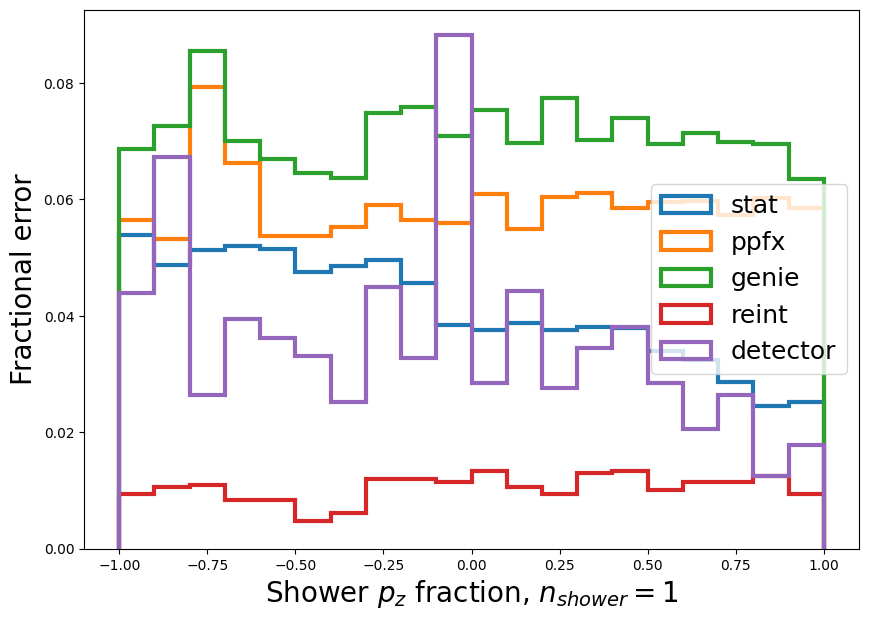

In [98]:
#1shr
frac=ov_stat_frac
frac_ppfx=flux_frac_1shr
frac_genie=genie_frac_1shr
frac_reint=reint_frac_1shr
frac_det=det_unc

# for Variable in Variable_list:
plt.figure(figsize=[10,7],facecolor='white')

bins_cent=(bins_var[:-1]+bins_var[1:])/2
plt.hist(bins_cent,weights=np.nan_to_num(frac),bins=bins_var, label="stat", histtype="step", lw=3)
plt.hist(bins_cent,weights=np.nan_to_num(frac_ppfx),bins=bins_var,label="ppfx", histtype="step", lw=3)
plt.hist(bins_cent,weights=np.nan_to_num(frac_genie),bins=bins_var, label="genie",  histtype="step", lw=3)
plt.hist(bins_cent,weights=np.nan_to_num(frac_reint),bins=bins_var, label="reint",  histtype="step", lw=3)
plt.hist(bins_cent,weights=np.nan_to_num(frac_det),bins=bins_var, label="detector",  histtype="step", lw=3)

plt.legend(fontsize=18)

plt.xlabel(xlabel+r", $n_{shower}=1$",fontsize=20)
plt.ylabel(f"Fractional error",fontsize=20)

save_figures = input("Do you want to save this figure? y/n ")

if save_figures=="y":
    plt.savefig(root_dir+f"Plots/BDT_input/uncertainties/Uncertainty_breakdown_{variable}_run" + Run + "_1shr.pdf")
    plt.savefig(root_dir+f"Plots/BDT_input/uncertainties/Uncertainty_breakdown_{variable}_run" + Run + "_1shr.png")
    print("Saved")

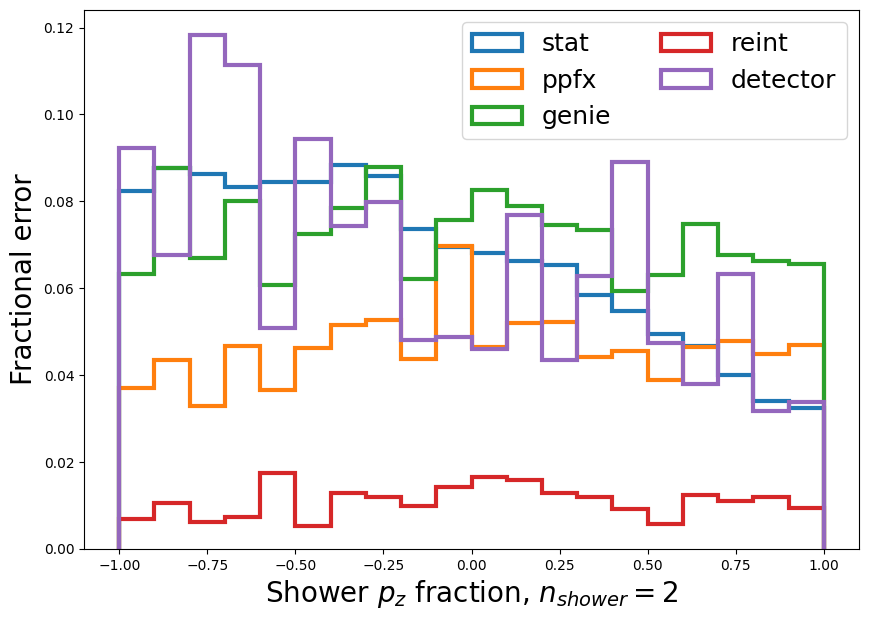

In [99]:
#2shr
frac=ov_stat_frac_2
frac_ppfx=flux_frac_2shr
frac_genie=genie_frac_2shr
frac_reint=reint_frac_2shr
frac_det=det_unc_2

# for Variable in Variable_list:
plt.figure(figsize=[10,7],facecolor='white')

bins_cent=(bins_var[:-1]+bins_var[1:])/2
plt.hist(bins_cent,weights=np.nan_to_num(frac),bins=bins_var, label="stat", histtype="step", lw=3)
plt.hist(bins_cent,weights=np.nan_to_num(frac_ppfx),bins=bins_var,label="ppfx", histtype="step", lw=3)
plt.hist(bins_cent,weights=np.nan_to_num(frac_genie),bins=bins_var, label="genie",  histtype="step", lw=3)
plt.hist(bins_cent,weights=np.nan_to_num(frac_reint),bins=bins_var, label="reint",  histtype="step", lw=3)
plt.hist(bins_cent,weights=np.nan_to_num(frac_det),bins=bins_var, label="detector",  histtype="step", lw=3)

plt.legend(fontsize=18, ncols=2)

plt.xlabel(xlabel+r", $n_{shower}=2$",fontsize=20)
plt.ylabel(f"Fractional error",fontsize=20)

save_figures = input("Do you want to save this figure? y/n ")

if save_figures=="y":
    plt.savefig(root_dir+f"Plots/BDT_input/uncertainties/Uncertainty_breakdown_{variable}_run" + Run + "_2shr.pdf")
    plt.savefig(root_dir+f"Plots/BDT_input/uncertainties/Uncertainty_breakdown_{variable}_run" + Run + "_2shr.png")
    print("Saved")

## Capping uncertainties

In [100]:
def SF_times_weights_sample_names(sample_dict, sample, HNL_mass, Run, SF_signal):
    """
    Returns the scaling object for the samples, used when saving the BDT output. 
    """
    
    sample_start = sample.split("_")[0]
    
    if (sample_start == 'overlay') or (sample_start == 'dirtoverlay'): SF = sample_dict[sample]['ppfx_cv_ls']*sample_dict[sample]['scale_factor_ls']
    elif sample_start == 'beamoff': SF = np.ones(len(sample_dict[sample][f'run']))*sample_dict[sample]['scale_factor_ls']
    elif sample_start =='data': SF = np.ones(len(sample_dict[sample]["logit_pred"]))
    else: 
        SF = np.ones(len(sample_dict[sample]["logit_pred"]))*(sample_dict[sample]['scale_factor_ls']*SF_signal)
    return SF

In [101]:
keys_test = list(merged_bins_dict.keys())
if Run == "1": Run_name = "run1"
if Run == "3": Run_name = "run3"

flux_frac, genie_frac, reint_frac = {}, {}, {}

for key in keys_test:
    HNL_mass = key.split("_")[0]
    score = sample_dict["overlay_"+key]["logit_pred"]
    SF_list = SF_times_weights_sample_names(sample_dict, "overlay_"+key, HNL_mass, Run_name, 1.0)
    bins = merged_bins_dict[key]
    hist = np.histogram(score, bins=bins, weights=SF_list)
    
    flux_frac[key] = np.array(flux_error_dict[key])/hist[0]
    genie_frac[key] = np.array(genie_err_dict[key])/hist[0]
    reint_frac[key] = np.array(reint_err_dict[key])/hist[0]
    

In [102]:
def Cap_hist_vals(uncapped_hists_dict, cap_val):
    """
    Returns a dict of the hists with the values capped at the \"cap_val\" argument value. 
    """
    capped_hists_dict = {}
    
    print(f"Capping the uncertainties at {cap_val*100}%")
    
    for key in uncapped_hists_dict:
        capped_hist_placeholder = np.zeros(len(uncapped_hists_dict[key]))
        for i, val in enumerate(uncapped_hists_dict[key]):
            if val <= cap_val: capped_hist_placeholder[i] = val
            else: capped_hist_placeholder[i] = cap_val
        capped_hists_dict[key] = capped_hist_placeholder
    
    return capped_hists_dict
    

In [103]:
#Due to low statistics in some regions of BDT score, the values of uncertainties are capped to avoid the values being overestimated (i.e stat-driven)
ov_detsys_capped = Cap_hist_vals(ov_detsys_unc_dict, 0.3)
sig_detsys_capped = Cap_hist_vals(sig_detsys_unc_dict, 0.3)

flux_error_dict_capped = Cap_hist_vals(flux_frac, 0.3)
genie_err_dict_capped = Cap_hist_vals(genie_frac, 0.3)
reint_err_dict_capped = Cap_hist_vals(reint_frac, 0.3)

print("Capped all uncertainty histograms.")

Capping the uncertainties at 30.0%
Capping the uncertainties at 30.0%
Capping the uncertainties at 30.0%
Capping the uncertainties at 30.0%
Capping the uncertainties at 30.0%
Capped all uncertainty histograms.


## Saving output to .root files

In [104]:
def Save_one_hist(hist,name,nbins,xlims):
    tData = ROOT.TH1F(name,name,len(nbins)-1,array("d",nbins))
    for i in range(len(nbins)-1):
        tData.SetBinContent(i+1,hist['hist'][i])
        tData.SetBinError(i+1,hist['err'][i])
    return tData
    
def SaveToRoot_new(nbins,xlims,hist_samples,theta,fileName='test.root'): 
    rFile = ROOT.TFile(f'{fileName}','RECREATE')
    tData = ROOT.TH1F("theta","theta",1,array("d",[0,1]))
    tData.SetBinContent(1,theta)
    rFile.Write()
    for i, name in enumerate(hist_samples):
        tData = Save_one_hist(hist_samples[name],name,nbins,xlims)
        rFile.Write()
    rFile.Close()

def make_stat_err_true(var, bins, weights_times_SF): #Saved in Functions.py
    hist_unweighted = np.histogram(var,bins=bins)[0]
    hist_weighted = np.histogram(var,bins=bins,weights=weights_times_SF)[0]
    Total_SF = np.nan_to_num(hist_weighted/hist_unweighted)
    stat_err = np.sqrt(hist_unweighted)*Total_SF
    return stat_err

def make_stat_err_new(var, bins, weights_times_SF): 
    hist_squared = np.histogram(var,bins=bins,weights=weights_times_SF**2)[0]
    stat_err=np.sqrt(hist_squared)
    return stat_err

def SF_times_weights_sample_names(sample_dict, sample, HNL_mass, Run, SF_signal):
    
    sample_start = sample.split("_")[0]
    
    if (sample_start == 'overlay') or (sample_start == 'dirtoverlay'): SF = sample_dict[sample]['ppfx_cv_ls']*sample_dict[sample]['scale_factor_ls']
    elif sample_start == 'beamoff': SF = np.ones(len(sample_dict[sample][f'run']))*sample_dict[sample]['scale_factor_ls']
    elif sample_start =='data': SF = np.ones(len(sample_dict[sample]["logit_pred"]))
    else: 
        SF = np.ones(len(sample_dict[sample]["logit_pred"]))*(sample_dict[sample]['scale_factor_ls']*SF_signal)
    return SF

SF_list = SF_times_weights_sample_names(sample_dict, sample+"_"+key, HNL_mass, Run_name, SCALE_EVENTS)

In [105]:
theta_CV_dict = {100:5.36e-4, 125:5.5e-4, 130:5.54e-4, 135:5.58e-4, 140:5.63e-4, 145:5.68e-4, 150:5.73e-4, 200:6.58e-4} #Taken directly from Aditya's thesis
SCALE_UP_dict = {100:1.0, 125:1.0, 130:1.0, 135:1.0, 140:1.0, 145:1.0, 150:1.0, 200:1.0} #Currently applying no scaling


REWEIGHTING = True

TEST = False


if REWEIGHTING == True:
    if get_TOF != True:
        raise Exception("Stopping because time of flight data has not been loaded, cannot reweight.")

new_theta_dict, dict_for_root = {}, {}
if Run == "1": Run_name = "run1"
if Run == "3": Run_name = "run3"

samples = ['overlay', 'dirtoverlay', 'beamoff', "signal", "data"]
unc_hists = ['overlay_detvar', 'signal_detvar', 'ppfx', 'genie', 'reint']

keys = list(merged_bins_dict.keys())

for i, key in enumerate(keys):
    print(key)
    HNL_mass = key.split("_")[0]
    K_str = key.split("_")[2]
    print(HNL_mass)
    original_theta = theta_CV_dict[int(HNL_mass)]
    new_theta = original_theta*SCALE_UP_dict[int(HNL_mass)]
    new_theta_dict[int(HNL_mass)] = original_theta*SCALE_UP_dict[int(HNL_mass)]
    SCALE_EVENTS = SCALE_UP_dict[int(HNL_mass)]**2 #The Number of events is proportional to theta^2
    
    bins = merged_bins_dict[key]
    
    for sample in samples:

        if sample=="overlay": 
            score = sample_dict[sample+"_"+key]["logit_pred"]
            SF_list = SF_times_weights_sample_names(sample_dict, sample+"_"+key, HNL_mass, Run_name, SCALE_EVENTS)
            # stat_err = make_stat_err_true(score, bins, SF_list) #Should generally use this
            stat_err = make_stat_err_new(score, bins, SF_list) #Can use if I get a Nan or inf error
            hist = np.histogram(score, bins=bins, weights=SF_list)
            dict_for_root[sample] = {'bins': np.array(hist[1]), 'hist': np.array(hist[0]), 'err': np.array(stat_err)}
            ov_hist = hist
        if sample=="signal": 
            score = sample_dict[sample+"_"+key]["logit_pred"]
            SF_list = SF_times_weights_sample_names(sample_dict, sample+"_"+key, HNL_mass, Run_name, SCALE_EVENTS)
            # stat_err = make_stat_err_true(score, bins, SF_list) #Should generally use this
            stat_err = make_stat_err_new(score, bins, SF_list) #Can use if I get a Nan or inf error
            
            if REWEIGHTING == True:            
                ### I think we incorporate weights HERE!
                
                pdg = sample_dict[sample+"_"+key]["mc_primary_pdg_ls"].to_numpy() # Try nu_parent_pdg_ls???
                bool_arr = np.abs(pdg) == 130
                print(pdg[:10])
                print(bool_arr[:10])
                tof = sample_dict[sample+"_"+key]["tof"].to_numpy()*10**-9 ## (proper) time of flight given in nanoseconds
                theta  = theta_text_dict[f'{HNL_mass}']
                c_phi  = c_phi_text_dict[f'{HNL_mass}']
                c_w = 0
                c_B = 0

                reweighting = dw.reweighting(tof, HNL_mass, theta, c_w, c_phi, c_B, klong=bool_arr)
                stat_err = make_stat_err_new(score, bins, SF_list*reweighting)

                hist = np.histogram(score, bins=bins, weights=SF_list*reweighting)
            else: 
                hist = np.histogram(score, bins=bins, weights=SF_list)
            dict_for_root[sample] = {'bins': np.array(hist[1]), 'hist': np.array(hist[0]), 'err': np.array(stat_err)}
            sig_hist = hist
        else:
            score = sample_dict[sample+"_"+key]["logit_pred"]
            SF_list = SF_times_weights_sample_names(sample_dict, sample+"_"+key, HNL_mass, Run_name, SCALE_EVENTS)
            # stat_err = make_stat_err_true(score, bins, SF_list) #Should generally use this
            stat_err = make_stat_err_new(score, bins, SF_list) #Can use if I get a Nan or inf error
            hist = np.histogram(score, bins=bins, weights=SF_list)
            dict_for_root[sample] = {'bins': np.array(hist[1]), 'hist': np.array(hist[0]), 'err': np.array(stat_err)}
    
    if K_str=="KDAR": 
        dict_for_root['signal_KDAR'] = {'bins': np.array(bins), 'hist': np.ones(len(sig_hist[0]))*0.3, 
                                                      'err': np.zeros(len(sig_hist[0]))}
    else: 
        dict_for_root['signal_KDAR'] = {'bins': np.array(bins), 'hist': np.zeros(len(sig_hist[0])), 
                                                      'err': np.zeros(len(sig_hist[0]))}
    dict_for_root['overlay_detvar'] = {'bins': np.array(bins), 'hist': np.array(ov_detsys_capped[key]), 'err': np.zeros(len(ov_detsys_capped[key]))}
    dict_for_root['signal_detvar'] = {'bins': np.array(bins), 'hist': np.array(sig_detsys_capped[key]), 'err': np.zeros(len(sig_detsys_capped[key]))}
    dict_for_root['ppfx'] = {'bins': np.array(bins), 'hist': np.array(flux_error_dict_capped[key]),
                             'err': np.zeros(len(ov_detsys_capped[key]))}
    dict_for_root['genie'] = {'bins': np.array(bins), 'hist': np.array(genie_err_dict_capped[key]), 
                              'err': np.zeros(len(ov_detsys_capped[key]))}
    dict_for_root['reint'] = {'bins': np.array(bins), 'hist': np.array(reint_err_dict_capped[key]), 
                              'err': np.zeros(len(ov_detsys_capped[key]))}
    
    hist_samples = {"bkg_overlay":dict_for_root['overlay'],"bkg_dirt":dict_for_root['dirtoverlay'],
                    "bkg_EXT":dict_for_root['beamoff'],"signal":dict_for_root["signal"],
                    "data":dict_for_root['data'],
                    "overlay_DetVar_uncertainty_frac":dict_for_root['overlay_detvar'],
                    "signal_DetVar_uncertainty_frac":dict_for_root['signal_detvar'],
                    "signal_KDAR_frac":dict_for_root['signal_KDAR'],
                    "ppfx_uncertainty_frac":dict_for_root['ppfx'], 
                    "Genie_uncertainty_frac":dict_for_root['genie'],
                    "Reinteraction_uncertainty_frac":dict_for_root['reint']}
    
    if TEST == True:
        save_name = Run_name+f"_TEST_ALL_Capped_{key}.root"
    
    else:
        save_name = Run_name+f"_ALL_Capped_{key}.root"
    
    if REWEIGHTING == True:
        SaveToRoot_new(merged_bins_dict[key],xlims,hist_samples,theta=new_theta,fileName=root_dir+"BDT_RW_output/"+save_name)
    else: 
        SaveToRoot_new(merged_bins_dict[key],xlims,hist_samples,theta=new_theta,fileName=root_dir+"BDT_output/"+save_name)
print("Saved all")
print(f"Saved with names like {save_name}")


100_1shr_KDIF
100
[-321  130  130  321  130  321  321  321  130  321]
[False  True  True False  True False False False  True False]
100_1shr_KDAR
100
[321 321 321 321 321 321 321 321 321 321]
[False False False False False False False False False False]
100_2shr_KDIF
100
[ 130. -321. -321. -321. -321.  130.  130. -321.  321.  130.]
[ True False False False False  True  True False False  True]
100_2shr_KDAR
100
[321 321 321 321 321 321 321 321 321 321]
[False False False False False False False False False False]
125_1shr_KDIF
125
[-321  130  130 -321  130 -321  130  130  321 -321]
[False  True  True False  True False  True  True False False]
125_1shr_KDAR
125
[321 321 321 321 321 321 321 321 321 321]
[False False False False False False False False False False]
125_2shr_KDIF
125
[-321. -321.  321.  321. -321.  321.  130.  130. -321.  321.]
[False False False False False False  True  True False False]
125_2shr_KDAR
125
[321. 321. 321. 321. 321. 321. 321. 321. 321. 321.]
[False False Fal

## Plot final BDT score distributions

In [16]:
def Load_root_hists(filenames, location='BDT_output/', HNL_masses=[100,150,200]):
    loc_hists = location

    hist_dict_run1, hist_dict_run3, theta_dict = {}, {}, {}

    #Loading in the .root files
    for HNL_mass in HNL_masses:
        for shr in ["1shr", "2shr"]:
            for K in ["KDIF", "KDAR"]:
            # name_ends = f"{HNL_mass}_R{Run}_{K}_{shr}"
                name_ends = f"{HNL_mass}_{shr}_{K}"
                hist_dict_run1[name_ends] = uproot.open(loc_hists+f'run1_ALL_Capped_{name_ends}' + filenames)
                hist_dict_run3[name_ends] = uproot.open(loc_hists+f'run3_ALL_Capped_{name_ends}' + filenames)
                theta_dict[name_ends] = hist_dict_run1[name_ends]["theta"].values()[0] #assuming scaled theta is the same for all runs, only 1 value saved

    print("thetas are:")
    print(theta_dict)
    print("Done")
    
    return hist_dict_run1, hist_dict_run3, theta_dict


In [17]:
#These are the nominal values of theta, taken directly from Aditya's thesis as the "KOTO CV"
#We initialise them so that the signal theta values can be plotted in the input variable plots

theta_text_dict = {'100':5.36e-4, '125':5.5e-4, '130':5.54e-4, '135':5.58e-4, '140':5.63e-4, '145':5.68e-4, '150':5.73e-4, '200':6.58e-4} #Taken directly from Aditya's thesis

theta_dict={'100_1shr_KDIF': 0.000536, '100_1shr_KDAR': 0.000536, '100_2shr_KDIF': 0.000536, '100_2shr_KDAR': 0.000536, 
            '125_1shr_KDIF': 0.00055, '125_1shr_KDAR': 0.00055, '125_2shr_KDIF': 0.00055, '125_2shr_KDAR': 0.00055, 
            '130_1shr_KDIF': 0.000554, '130_1shr_KDAR': 0.000554, '130_2shr_KDIF': 0.000554, '130_2shr_KDAR': 0.000554, 
            '135_1shr_KDIF': 0.000558, '135_1shr_KDAR': 0.000558, '135_2shr_KDIF': 0.000558, '135_2shr_KDAR': 0.000558, 
            '140_1shr_KDIF': 0.000563, '140_1shr_KDAR': 0.000563, '140_2shr_KDIF': 0.000563, '140_2shr_KDAR': 0.000563, 
            '145_1shr_KDIF': 0.000568, '145_1shr_KDAR': 0.000568, '145_2shr_KDIF': 0.000568, '145_2shr_KDAR': 0.000568, 
            '150_1shr_KDIF': 0.000573, '150_1shr_KDAR': 0.000573, '150_2shr_KDIF': 0.000573, '150_2shr_KDAR': 0.000573, 
            '200_1shr_KDIF': 0.000658, '200_1shr_KDAR': 0.000658, '200_2shr_KDIF': 0.000658, '200_2shr_KDAR': 0.000658}

# Original values of c_phi, used for the axion reweighting. 
c_phi_text_dict = {'100':0.0027014149387605906, '125':0.0018106609327994778, '130':0.0009990304425688081, '135':4.52690931768051e-06, '140':0.0008568518547569688, '145':0.0014326989318147938, '150':0.001798938228520414, '200':0.002864767955135017}  
c_phi_dict={'100_1shr_KDIF': 0.0027014149387605906, '100_1shr_KDAR': 0.0027014149387605906, '100_2shr_KDIF': 0.0027014149387605906, '100_2shr_KDAR': 0.0027014149387605906, 
            '125_1shr_KDIF': 0.0018106609327994778, '125_1shr_KDAR': 0.0018106609327994778, '125_2shr_KDIF': 0.0018106609327994778, '125_2shr_KDAR': 0.0018106609327994778, 
            '130_1shr_KDIF': 0.0009990304425688081, '130_1shr_KDAR': 0.0009990304425688081, '130_2shr_KDIF': 0.0009990304425688081, '130_2shr_KDAR': 0.0009990304425688081, 
            '135_1shr_KDIF': 4.52690931768051e-06, '135_1shr_KDAR': 4.52690931768051e-06, '135_2shr_KDIF': 4.52690931768051e-06, '135_2shr_KDAR': 4.52690931768051e-06, 
            '140_1shr_KDIF': 0.0008568518547569688, '140_1shr_KDAR': 0.0008568518547569688, '140_2shr_KDIF': 0.0008568518547569688, '140_2shr_KDAR': 0.0008568518547569688, 
            '145_1shr_KDIF': 0.0014326989318147938, '145_1shr_KDAR': 0.0014326989318147938, '145_2shr_KDIF': 0.0014326989318147938, '145_2shr_KDAR': 0.0014326989318147938, 
            '150_1shr_KDIF': 0.001798938228520414, '150_1shr_KDAR': 0.001798938228520414, '150_2shr_KDIF': 0.001798938228520414, '150_2shr_KDAR': 0.001798938228520414, 
            '200_1shr_KDIF': 0.002864767955135017, '200_1shr_KDAR': 0.002864767955135017, '200_2shr_KDIF': 0.002864767955135017, '200_2shr_KDAR': 0.002864767955135017}

In [18]:
hist_dict_run1, hist_dict_run3, theta_dict =  Load_root_hists(".root", location=root_dir+'BDT_output/', HNL_masses=[100,125,130,135,140,145,150,200])

thetas are:
{'100_1shr_KDIF': 0.000536, '100_1shr_KDAR': 0.000536, '100_2shr_KDIF': 0.000536, '100_2shr_KDAR': 0.000536, '125_1shr_KDIF': 0.00055, '125_1shr_KDAR': 0.00055, '125_2shr_KDIF': 0.00055, '125_2shr_KDAR': 0.00055, '130_1shr_KDIF': 0.000554, '130_1shr_KDAR': 0.000554, '130_2shr_KDIF': 0.000554, '130_2shr_KDAR': 0.000554, '135_1shr_KDIF': 0.000558, '135_1shr_KDAR': 0.000558, '135_2shr_KDIF': 0.000558, '135_2shr_KDAR': 0.000558, '140_1shr_KDIF': 0.000563, '140_1shr_KDAR': 0.000563, '140_2shr_KDIF': 0.000563, '140_2shr_KDAR': 0.000563, '145_1shr_KDIF': 0.000568, '145_1shr_KDAR': 0.000568, '145_2shr_KDIF': 0.000568, '145_2shr_KDAR': 0.000568, '150_1shr_KDIF': 0.000573, '150_1shr_KDAR': 0.000573, '150_2shr_KDIF': 0.000573, '150_2shr_KDAR': 0.000573, '200_1shr_KDIF': 0.000658, '200_1shr_KDAR': 0.000658, '200_2shr_KDIF': 0.000658, '200_2shr_KDAR': 0.000658}
Done


In [19]:
def Get_full_hist_dicts(flux_error_dict, genie_err_dict, reint_err_dict, ov_detsys_unc_dict, sig_detsys_unc_dict):
    """
    Return dicts of all required histograms for the plotting of BDT output distributions.
    """
    tot_uncertainty_dict = {}
    sig_sys_err = {}
    
    for key in ov_detsys_unc_dict:
        tot_uncertainty = [np.array(flux_error_dict[key]),
                           np.array(genie_err_dict[key]),
                           np.array(reint_err_dict[key]),
                           np.array(ov_detsys_unc_dict[key])]
        
    
def add_all_errors(err_list): #adds in quadrature, assuming all hists are same shape
    """
    Takes a list of histograms. 
    Returns the quadrature sum of the values in these hists.
    """
    Total_hist = np.zeros_like(err_list[0])
    for i in range(len(err_list[0])): #Looping over the bins
        for errs in err_list: #Looping over the histograms
            Total_hist[i] += errs[i]**2 #Adding error from each hist in quadrature
        Total_hist[i] = np.sqrt(Total_hist[i])
    return Total_hist

def Get_uncertainty_dicts(hist_dict, Params):
    """
    Given a dict of uproot files will return the total signal uncertainty, bkg uncertainty and bin dicts.
    """
    overlay_dict, dirt_dict, EXT_dict = {}, {}, {}
    signal_dict = {}
    bins_dict = {}
    bins_cent_dict = {}
    tot_uncertainty_dict = {}
    bkg_sys_dict = {}
    sig_sys_err = {}
    data = {}
    
    for HNL_mass in hist_dict:
        overlay_dict[HNL_mass] = hist_dict[HNL_mass]['bkg_overlay'].to_numpy()[0]
        dirt_dict[HNL_mass] = hist_dict[HNL_mass]['bkg_dirt'].to_numpy()[0]
        EXT_dict[HNL_mass] = hist_dict[HNL_mass]['bkg_EXT'].to_numpy()[0]
        signal_dict[HNL_mass] = hist_dict[HNL_mass]['signal'].to_numpy()[0]

        tot_uncertainty = [hist_dict[HNL_mass]['ppfx_uncertainty_frac'].to_numpy()[0]*hist_dict[HNL_mass]['bkg_overlay'].to_numpy()[0], #overlay ppfx error
                           hist_dict[HNL_mass]['Genie_uncertainty_frac'].to_numpy()[0]*hist_dict[HNL_mass]['bkg_overlay'].to_numpy()[0], #overlay genie error
                           hist_dict[HNL_mass]['Reinteraction_uncertainty_frac'].to_numpy()[0]*hist_dict[HNL_mass]['bkg_overlay'].to_numpy()[0], #overlay reinteraction error
                           hist_dict[HNL_mass]['overlay_DetVar_uncertainty_frac'].to_numpy()[0]*hist_dict[HNL_mass]['bkg_overlay'].to_numpy()[0], #overlay detector variation error
                           hist_dict[HNL_mass]['bkg_dirt'].to_numpy()[0]*Params["Flat_bkg_dirt_frac"], #dirt flat systematic error
                           hist_dict[HNL_mass]['bkg_overlay'].errors(), #stat error
                           hist_dict[HNL_mass]['bkg_dirt'].errors(), #stat error
                           hist_dict[HNL_mass]['bkg_EXT'].errors()] #stat error
        
        bkg_sys_list = [hist_dict[HNL_mass]['ppfx_uncertainty_frac'].to_numpy()[0]*hist_dict[HNL_mass]['bkg_overlay'].to_numpy()[0], #overlay ppfx error
                        hist_dict[HNL_mass]['Genie_uncertainty_frac'].to_numpy()[0]*hist_dict[HNL_mass]['bkg_overlay'].to_numpy()[0], #overlay genie error
                        hist_dict[HNL_mass]['Reinteraction_uncertainty_frac'].to_numpy()[0]*hist_dict[HNL_mass]['bkg_overlay'].to_numpy()[0], #overlay reinteraction error
                        hist_dict[HNL_mass]['overlay_DetVar_uncertainty_frac'].to_numpy()[0]*hist_dict[HNL_mass]['bkg_overlay'].to_numpy()[0], #overlay detector variation error
                        hist_dict[HNL_mass]['bkg_dirt'].to_numpy()[0]*Params["Flat_bkg_dirt_frac"]] #dirt flat systematic error

        tot_sig_unc = [hist_dict[HNL_mass]['signal'].errors(),
                       hist_dict[HNL_mass]['signal_DetVar_uncertainty_frac'].to_numpy()[0]*hist_dict[HNL_mass]['signal'].to_numpy()[0],
                       hist_dict[HNL_mass]['signal'].values()*hist_dict[HNL_mass]["signal_KDAR_frac"].to_numpy()[0]]

        sig_sys_err[HNL_mass] = add_all_errors(tot_sig_unc)

        tot_uncertainty_dict[HNL_mass] = add_all_errors(tot_uncertainty)
        bkg_sys_dict[HNL_mass] = add_all_errors(bkg_sys_list)

        bins_dict[HNL_mass] = hist_dict[HNL_mass]['bkg_overlay'].to_numpy()[1] #A tuple of bin edges
        bins_cent_dict[HNL_mass]=(bins_dict[HNL_mass][:-1]+bins_dict[HNL_mass][1:])/2

        data[HNL_mass] = hist_dict[HNL_mass]['data'].values()

    bkgs_dict = {'overlay':overlay_dict, 'dirtoverlay':dirt_dict, 'beamoff':EXT_dict}
    
    return signal_dict, bkgs_dict, data, sig_sys_err, tot_uncertainty_dict, bkg_sys_dict, bins_dict, bins_cent_dict


In [20]:
def Get_ratios_KDAR(df):
    """
    Given a dataframe with variable \"KDAR_scale\", will print the fraction of events with the scale != 1.0.
    """

    num_KDIF = len(df.query('KDAR_scale==1.0'))
    num_KDAR = len(df.query('KDAR_scale!=1.0'))
    print(f"Zeros: {num_zeros}")
    print(f"Ones: {num_ones}")
    print(f"Fraction of zeros: {num_zeros/(num_zeros+num_ones)}")

In [21]:
Params={"Flat_bkg_dirt_frac":1.0, "Signal_flux_error":0.3}

signal_dict_r1, bkgs_dict_r1, data_r1, sig_sys_err_r1, tot_uncertainty_dict_r1, bkg_sys_r1, bins_dict_r1, bins_cent_dict_r1 = Get_uncertainty_dicts(hist_dict_run1, 
                                                                                                                                        Params)

signal_dict_r3, bkgs_dict_r3, data_r3, sig_sys_err_r3, tot_uncertainty_dict_r3, bkg_sys_r3, bins_dict_r3, bins_cent_dict_r3 = Get_uncertainty_dicts(hist_dict_run3, 
                                                                                                                                        Params)


In [35]:
def make_overflow_bin(bins_dict, bins_cents_dict):
    """
    For making the final "overflow" bin the same size as the previous bins, i.e one integer in width.
    """
    bins_overflow, bins_cent_overflow = {}, {}
    for HNL_mass in bins_dict:
        overflow_bin = bins_cents_dict[HNL_mass][-2]+1 #Just adding one to the penultimate bin centre val. 
        bins_cent_overflow[HNL_mass] = bins_cents_dict[HNL_mass].copy()
        bins_cent_overflow[HNL_mass][-1] = overflow_bin
        bins_overflow[HNL_mass] = bins_dict[HNL_mass].copy()
        bins_overflow[HNL_mass][-1] = bins_dict[HNL_mass][-2]+1 #Just adding one to the penultimate bin end val. 
    return bins_overflow, bins_cent_overflow

def make_xlims_dict(bins_dict, lower = None):
    """
    Making a dict of xlims for plotting several mass points at once.
    Also returns a dict of xticks for the purpose of indicating the overflow.
    """
    xlims_adjusted, xticks_adjusted = {}, {}
    for HNL_mass in bins_dict:
        if isinstance(lower,(int, float)): lower_val = lower
        else: lower_val = bins_dict[HNL_mass][0]
        xlims_adjusted[HNL_mass] = [lower_val,bins_dict[HNL_mass][-1]]
        ticks = np.arange(bins_dict[HNL_mass][0], bins_dict[HNL_mass][-1], 1)
        ticks_strings = []
        for val in ticks:
            ticks_strings.append(str(int(val)))
        ticks_strings[-1] = str(ticks_strings[-1]) # +"+" # Removing "+" from the last tick
        xticks_adjusted[HNL_mass] = ticks_strings
        
    return xlims_adjusted, xticks_adjusted


bins_overflow_r1, bins_cents_overflow_r1 = make_overflow_bin(bins_dict_r1, bins_cent_dict_r1)
bins_overflow_r3, bins_cents_overflow_r3 = make_overflow_bin(bins_dict_r3, bins_cent_dict_r3)

In [36]:
def Plot_BDT_output_systematics_data(signal={}, tot_uncertainty_dict={}, sys_uncertainty_dict={}, sig_unc={}, bkgs={}, data={}, bins_cent_dict={}, bins_dict={},
                                     colours={}, ALPHA=1.0, xlims=[], xticks=[], upper_y=[],
                                     figsize=[12,12], density=False, legloc="upper right",legsize=22,
                                     logy=False, savefig=False, save_str="", Run="_", HNL_scale=1.0,scale_up=[], thetas=[], order=[], override_sub_ylim=False,
                                     sig_sys=False, HNL_scale_label=False, stacked=False, title_name=None, textpos=None, textsize=None,
                                     plot_text=None, ncols=1, plot_stat_sys=False, show_ev_nums=True, get_chi2 = False, subplot_ratio=1):
    """
    This should take the histograms which have already been binned and scaled and plot the total uncertainties on bkg.
    Therefore it will display what is being fed into the limit setting software. INCLUDING the data.
    """
    if(isinstance(HNL_scale, float)): print("Scaling by a single number for all")
    if(isinstance(HNL_scale, dict)): print("Scaling each mass point individually")
    if(signal=={}): raise Exception("Specify HNL sample masses")
    if(bkgs=={}): raise Exception("Specify background samples")
    if(data=={}): raise Exception("Specify data sample")
    if(bins_cent_dict=={}): raise Exception("Specify bin centres")
    if(bins_dict=={}): raise Exception("Specify bins")
    if(colours=={}): colours = {'overlay':'#0254cf',
                                'dirtoverlay':'cornflowerblue',
                                'beamoff':'limegreen',
                                'signal':'red',
                                'signal_pi0':'gold'}
    if(order==[]): order = ["beamoff","overlay","dirtoverlay"] #From bottom to top in stack
    if(thetas==[]): print("Haven't entered thetas, can't calculate scalings") 
    
    if logy == True: logscale="log"
    elif logy == False: logscale="linear"
        
    savefig = input("Do you want to save the BDT score plots? y/n")
    
    for HNL_mass in signal.keys():
        
        print(HNL_mass) #debugging
        
        mass_label = HNL_mass.split("_")[0]
        nshr_label = HNL_mass.split("_")[1]
        nshr_label = nshr_label[0]
        K_label = HNL_mass.split("_")[2]
        
        fig,ax = plt.subplots(nrows=2, ncols=1, sharex=True, gridspec_kw={'height_ratios': [3, subplot_ratio]}, figsize=figsize,dpi=100)
        
        if xlims==[]: xlims_plot=[bins_dict[HNL_mass][0],bins_dict[HNL_mass][-1]]
        elif(isinstance(xlims, dict)): xlims_plot = xlims[HNL_mass]
        else: xlims_plot=xlims
        
        #----primary plot----#
        plt.sca(ax[0])
        
        if isinstance(title_name, str): plt.title(title_name, fontsize=24)
        
        if(isinstance(HNL_scale, dict)): HNL_scaling=HNL_scale[HNL_mass]
        else: HNL_scaling = HNL_scale
        print("HNL scale is " + str(HNL_scaling))
        
        bins_cents=[bins_cent_dict[HNL_mass], bins_cent_dict[HNL_mass], bins_cent_dict[HNL_mass]]
        
        if HNL_scale_label==False: HNL_label = f"{mass_label} MeV HPS"
        if HNL_scale_label==True: 
            theta = thetas[HNL_mass]
            theta_2 = theta**2
            new_theta = np.sqrt(scale_up[HNL_mass])*theta
            theta_label = sci_notation(new_theta, decimal_digits=1)
            HNL_label = f"{mass_label} MeV HPS \n" + r"$\theta$ = " + theta_label
        
        labels_sample = {'overlay':fr"In-Cryo $\nu$",
                         'dirtoverlay':fr"Out-Cryo $\nu$",
                         'beamoff':f"Beam-Off",
                         'signal':HNL_label}

        bkg_scores, bkg_colors, labels = [], [], []
        for sample in order:
            bkg_scores.append(bkgs[sample][HNL_mass])
            bkg_colors.append(colours[sample])
            labels.append(labels_sample[sample])
        
        hist_placeholder = np.histogram(bins_cents, weights=bkg_scores, range=xlims_plot)[0] #Just for calculating ylims
        
        hist_full_placeholder = np.histogram(bins_cents, weights=bkg_scores, bins=bins_dict[HNL_mass])[0] #For making the error bars
        numbins = len(np.where( bins_cent_dict[HNL_mass] > xlims_plot[0] )[0])+1 #Getting the number of bins that will be plotted with the given xlims range
        
        tot_uncrt = tot_uncertainty_dict[HNL_mass]
        sys_uncrt = sys_uncertainty_dict[HNL_mass]
        upvals_placeholder = hist_full_placeholder+tot_uncrt
        lowvals_placeholder = hist_full_placeholder-tot_uncrt
        upvals = np.append(upvals_placeholder, [0])
        lowvals = np.append(lowvals_placeholder, [0])
        
        stat_uncrt = np.sqrt(tot_uncrt**2-sys_uncrt**2)
        
        dat_val=data[HNL_mass]
        
        maxy = max(upvals[-numbins:])
        
        ov_placeholder = np.histogram(bins_cents[0], weights=bkgs['overlay'][HNL_mass], range=xlims_plot)[0] 
        dirt_placeholder = np.histogram(bins_cents[0], weights=bkgs['dirtoverlay'][HNL_mass], range=xlims_plot)[0] 
        beamoff_placeholder = np.histogram(bins_cents[0], weights=bkgs['beamoff'][HNL_mass], range=xlims_plot)[0] 
        sig_placeholder = np.histogram(bins_cents[0], weights=signal[HNL_mass]*HNL_scaling, range=xlims_plot)[0] 
        dat_placeholder =np.histogram(bins_cent_dict[HNL_mass],weights=dat_val, range=xlims_plot)[0]
        
        full_ov = np.histogram(bins_cents[0], weights=bkgs['overlay'][HNL_mass], bins=bins_dict[HNL_mass])[0]
        full_dirt = np.histogram(bins_cents[0], weights=bkgs['dirtoverlay'][HNL_mass], bins=bins_dict[HNL_mass])[0]
        full_beamoff = np.histogram(bins_cents[0], weights=bkgs['beamoff'][HNL_mass], bins=bins_dict[HNL_mass])[0]
        full_data = np.histogram(bins_cent_dict[HNL_mass],weights=dat_val, bins=bins_dict[HNL_mass])[0]
        
        
        
        
        Datanum=dat_placeholder.sum()
        Offbeamnum=sum(beamoff_placeholder)
        Dirtnum=sum(dirt_placeholder)
        Overlaynum=sum(ov_placeholder) 
        HNL_num=sum(sig_placeholder)
        
        # hist_full_placeholder = np.histogram(bins_cents, weights=bkg_scores, bins=bins_dict[HNL_mass])[0] #For making the error bars
        
        if show_ev_nums==True:
            labels_sample = {'overlay':fr"In-Cryo $\nu$ ({Overlaynum:.1f})",
                             'dirtoverlay':fr"Out-Cryo $\nu$ ({Dirtnum:.1f})",
                             'beamoff':f"Beam-Off ({Offbeamnum:.1f})",
                             'signal':f"{HNL_label} ({HNL_num:.1f})"}

            sig_label = [HNL_label+f"({HNL_num:.1f})"] #HNL_label
            data_label = f"{Run} NuMI Data ({Datanum:.0f})"

            data_mc = Datanum/(Overlaynum+Dirtnum+Offbeamnum)
            data_mc_full = sum(full_data)/(sum(full_ov)+sum(full_dirt)+sum(full_beamoff))
            print(f"Plotted Data/MC = {data_mc:.2f}")
            print(f"Full range Data/MC = {data_mc_full:.2f}")
            
        labels=[]
        for sample in order:
            labels.append(labels_sample[sample])
        
        plot=plt.hist(bins_cents,
                      label=labels,
                      bins=bins_dict[HNL_mass],
                      histtype="stepfilled",
                      stacked=True,linewidth=2,edgecolor="black",
                      weights=bkg_scores, color=bkg_colors, alpha=ALPHA)
            
        plt.fill_between(bins_dict[HNL_mass], lowvals, upvals, step="post",color="grey",alpha=0.3,zorder=2)
        
        sig_placeholder = np.histogram(bins_cent_dict[HNL_mass], weights=signal[HNL_mass]*HNL_scaling, bins=bins_dict[HNL_mass])[0] #For making the error bars
        sig_down_placeholder = sig_placeholder-sig_unc[HNL_mass]*HNL_scaling
        sig_up_placeholder = sig_placeholder+sig_unc[HNL_mass]*HNL_scaling
        sig_down = np.append(sig_down_placeholder, [0])
        sig_up = np.append(sig_up_placeholder, [0])

        if stacked==False:
            
            if K_label == 'KDAR':
                colour = colours['signal_pi0']
            else:
                colour =  colours['signal']


            plt.hist(bins_cent_dict[HNL_mass],
                     weights=signal[HNL_mass]*HNL_scaling,
                     bins=bins_dict[HNL_mass],
                     lw=4, edgecolor=colour, label=labels_sample["signal"], histtype="step")
            
        if stacked==True:
                        
            if K_label == 'KDAR':
                colour = colours['signal_pi0']
            else:
                colour =  colours['signal']
            
            sig_stacked = hist_full_placeholder+sig_placeholder
            plt.hist(bins_cent_dict[HNL_mass],
                     weights=sig_stacked,
                     bins=bins_dict[HNL_mass],
                     lw=4, edgecolor=colour, label=labels_sample["signal"], histtype="step")
        
        if sig_sys == True:
            plt.rcParams.update({'hatch.color': colours['signal']})
            plt.fill_between(bins_dict[HNL_mass], sig_down, sig_up, step="post",hatch='//',alpha=0,zorder=2,lw=2)
        
        ylims = [0,maxy*1.1]
        
        plt.xlim(xlims_plot)
        if logy==False:
            plt.ylim(ylims)
        
        dat_val=data[HNL_mass]
        
        x,y=np.histogram(bins_cent_dict[HNL_mass],weights=dat_val,bins=bins_dict[HNL_mass],density=density)
        x1,y=np.histogram(bins_cent_dict[HNL_mass],weights=dat_val,bins=bins_dict[HNL_mass])
        bin_center = [(y[i] + y[i+1])/2. for i in range(len(y)-1)]
        dat_placeholder=x
        dat_err=np.sqrt(x1)*np.nan_to_num(x/x1)
        
        if Run=="run1":Run_label = "Run 1"
        if Run=="run3":Run_label = "Run 3"
        data_label = f"{Run_label} NuMI Data" 
        if show_ev_nums==True: data_label = f"{Run_label} NuMI Data ({round(Datanum)})" #Datanum
        # data_label = f"Data"
        
        plt.errorbar(bin_center, dat_placeholder, yerr=dat_err,fmt='.',color='black',lw=5,capsize=5,elinewidth=3,label=data_label) #Plotting data

        if get_chi2 == True:
            data_temp =np.histogram(bins_cent_dict[HNL_mass],weights=dat_val, range=xlims_plot)[0]
            error_temp = np.histogram(bins_cents[0], weights=tot_uncrt, range=xlims_plot)[0] 

            bkg_arr = ov_placeholder + dirt_placeholder + beamoff_placeholder

            ndof = len(data_temp)-1

            print(len(error_temp), len(bkg_arr), len(data_temp))
            print('Chi square = ', Get_chi_squared(data_temp, bkg_arr, error_temp))
            print('Reduced Chi square = ', Get_chi_squared(data_temp, bkg_arr, error_temp)/ndof)

        plt.ylabel('Events', fontsize=30)
        plt.yscale(logscale)
        plt.legend(loc=legloc,frameon=True, fontsize = legsize, ncols=ncols)
        
        if HNL_mass == "150_2shr_KDAR": 
            plt.ylim([0, 550])
            print("Adapted y axis range in one plot for paper")

        if HNL_mass == "150_2shr_KDIF": 
            plt.ylim([0, 1000])
            print("Adapted y axis range in one plot for paper")
        
        plt.bar([-1],[-1],color="grey", alpha=0.3, label="Total uncertainty",lw=3)

        handles_fig, labels_fig = plt.gca().get_legend_handles_labels()
        order_labels = [0,1,2,5,3,4]

        if plot_text != None:
            if HNL_mass == "150_2shr_KDAR" : 
                # plt.legend(loc="upper left", frameon=True, prop={'size': legsize}, title=plot_text, title_fontsize=1.1*legsize, ncols=ncols)
                plt.legend([handles_fig[idx] for idx in order_labels],[labels_fig[idx] for idx in order_labels], loc="upper left",frameon=True, prop={'size': legsize}, ncols=ncols, title=plot_text, title_fontsize=1.1*legsize)
            else:    
                # plt.legend(loc=legloc, frameon=True, prop={'size': legsize}, title=plot_text, title_fontsize=1.1*legsize, ncols=ncols)
                plt.legend([handles_fig[idx] for idx in order_labels],[labels_fig[idx] for idx in order_labels], loc=legloc,frameon=True, prop={'size': legsize}, ncols=ncols, title=plot_text, title_fontsize=1.1*legsize)
            
        #----sub-plot----# 
        plt.sca(ax[1])
        
        fracer_data=np.nan_to_num(np.sqrt(x1)/x1)
        x_err=fracer_data*x
        fracer_mc=np.nan_to_num(tot_uncrt/plot[0][2])
        
        fracer_sys=np.nan_to_num(sys_uncrt/plot[0][2])
        fracer_stat=np.nan_to_num(stat_uncrt/plot[0][2])

        rat_err_data=x_err*(1/plot[0][2])

        rat_err_mc=fracer_mc

        rat_err_mc=np.nan_to_num(rat_err_mc) #other wise the next doesnt plot pro[erly]

        upvals= np.append(1+(rat_err_mc),1+(rat_err_mc)[-1]) #hate this but need to repeat last value to get bar on last bin to work, saw it here https://matplotlib.org/stable/gallery/lines_bars_and_markers/filled_step.html
        lowvals=np.append(1-(rat_err_mc),1-(rat_err_mc)[-1])
        
        upvals_sys=np.append(1+(fracer_sys),1+(fracer_sys)[-1])
        lowvals_sys=np.append(1-(fracer_sys),1-(fracer_sys)[-1])
        
        upvals_stat = np.append(1+(fracer_stat),1+(fracer_stat)[-1])
        lowvals_stat = np.append(1+(fracer_stat),1+(fracer_stat)[-1])

        plt.fill_between(y, lowvals, upvals,step="post",color="grey",alpha=0.3,zorder=2.)#, label="Total uncertainty")
        # plt.fill_between(y, lowvals_sys, upvals_sys,edgecolor="black",alpha=0.0,zorder=2)
        if (plot_stat_sys):
            plt.hist(bins_cent_dict[HNL_mass],
                     weights=1-(fracer_stat),
                     bins=bins_dict[HNL_mass],
                     lw=1, edgecolor="red", histtype="step", label="Stat. ")
            plt.hist(bins_cent_dict[HNL_mass],
                     weights=1+(fracer_stat),
                     bins=bins_dict[HNL_mass],
                     lw=1, edgecolor="red", histtype="step")
            plt.hist(bins_cent_dict[HNL_mass],
                     weights=1-(fracer_sys),
                     bins=bins_dict[HNL_mass],
                     lw=1, edgecolor="black", histtype="step", label="Syst. quadrature sum")
            plt.hist(bins_cent_dict[HNL_mass],
                     weights=1+(fracer_sys),
                     bins=bins_dict[HNL_mass],
                     lw=1, edgecolor="black", histtype="step")
            

        rat=np.nan_to_num(x/plot[0][2])
        rat[x==0]=1 #dont think this is a good way to deal with this

        plt.errorbar(bin_center,rat,yerr=fracer_data,fmt='.',color='black',lw=3,capsize=3,elinewidth=1)
        plt.ylabel("Data/MC")
        plt.axhline(1,ls='-',color='black')
        
        ylim = max(abs(np.nan_to_num(rat)))*1.1
        ylim_min = min(abs(np.nan_to_num(rat)))*0.9

        if (1.0+(1.0-ylim_min))>ylim: Use_ylim = False #Which is further from 1.0
        else: Use_ylim = True #i.e the max is further from 1.0 than the min.
        ylim_low = 1-(ylim-1.0)
        ylim_high = 1+(1.0-ylim_min)
        if (ylim>1.5) or (ylim_min<0.5):
            if(Use_ylim):plt.ylim(ylim_low,ylim)
            else:plt.ylim(ylim_min,ylim_high)
        else: plt.ylim(0.5,1.5)
    

        if isinstance(xticks,dict):
            plt.xticks(ticks=np.arange(bins_dict[HNL_mass][0], bins_dict[HNL_mass][-1], 1), labels=xticks[HNL_mass])

        if upper_y!=[]:
            plt.ylim(1-upper_y, 1+upper_y)
        
        if override_sub_ylim:
            plt.ylim(0.25,1.75)    
        
        if (plot_stat_sys):plt.legend(loc="lower left",fontsize = legsize)

        plt.xlim(xlims_plot)
        
        plt.xlabel(f'BDT Score '+r'($m_{\mathrm{HPS}}=$'+f'{mass_label} MeV,' +r' $n_{\mathrm{shower}}=$'+f'{nshr_label}, {K_label})', fontsize=28)
        
        plt.tight_layout()
        
        if savefig == "y":
            plt.savefig(root_dir+"Plots/Rebinned_BDT_scores/BDT_output_sys_" + Run + "_" + str(HNL_mass) + "MeV_" + logscale + ".pdf")
            plt.savefig(root_dir+"Plots/Rebinned_BDT_scores/BDT_output_sys_" + Run + "_" + str(HNL_mass) + "MeV_" + logscale + ".png")
        plt.show()
        plt.close()
        
        

Scaling each mass point individually
100_1shr_KDIF
HNL scale is 33.019602633385574
10 10 10
Chi square =  11.823029422339976
Reduced Chi square =  1.313669935815553


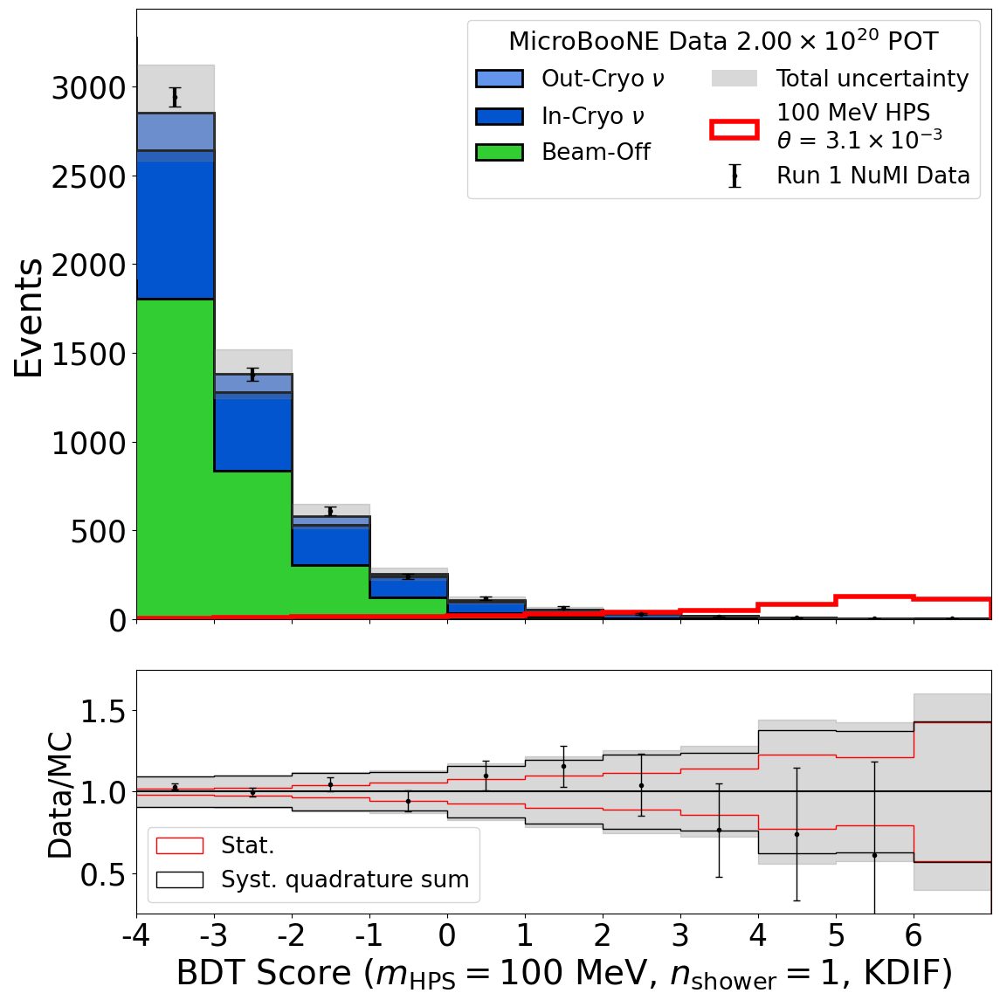

100_1shr_KDAR
HNL scale is 33.019602633385574
10 10 10
Chi square =  3.0992620732757614
Reduced Chi square =  0.3443624525861957


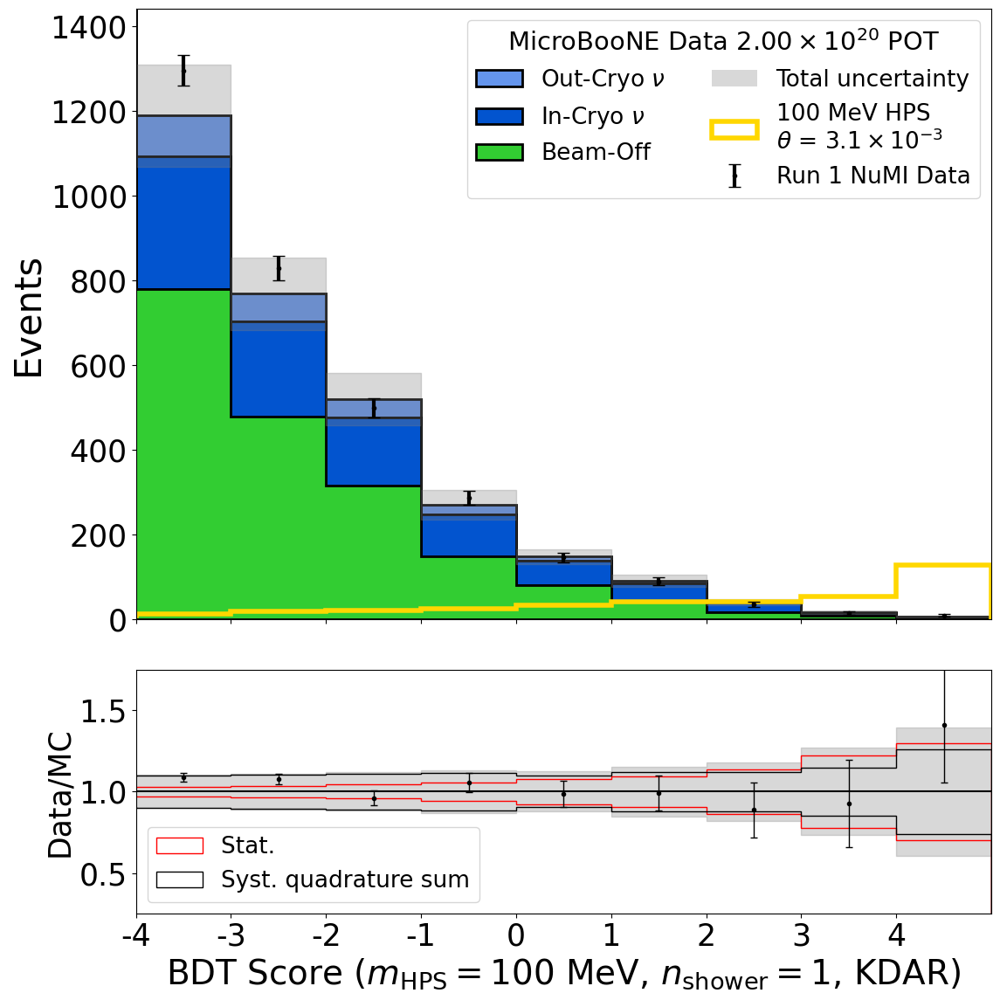

100_2shr_KDIF
HNL scale is 33.019602633385574
10 10 10
Chi square =  12.089919699306723
Reduced Chi square =  1.3433244110340803


/var/folders/wr/yb1fjkjn1mbg644j5v7f2tlm0000gp/T/ipykernel_25420/3279421264.py:191: RuntimeWarning: invalid value encountered in divide
  dat_err=np.sqrt(x1)*np.nan_to_num(x/x1)
/var/folders/wr/yb1fjkjn1mbg644j5v7f2tlm0000gp/T/ipykernel_25420/3279421264.py:241: RuntimeWarning: invalid value encountered in divide
  fracer_data=np.nan_to_num(np.sqrt(x1)/x1)


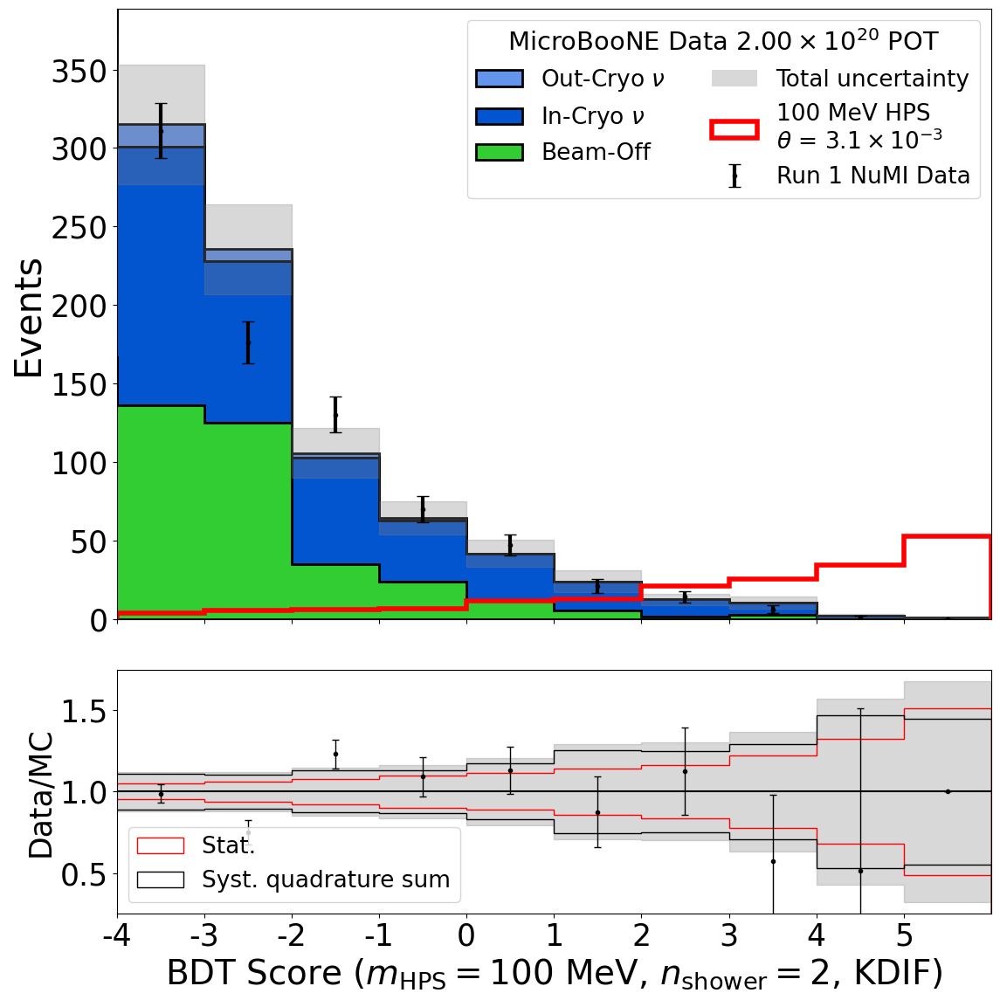

100_2shr_KDAR
HNL scale is 33.019602633385574
10 10 10
Chi square =  5.29003513174351
Reduced Chi square =  0.5877816813048344


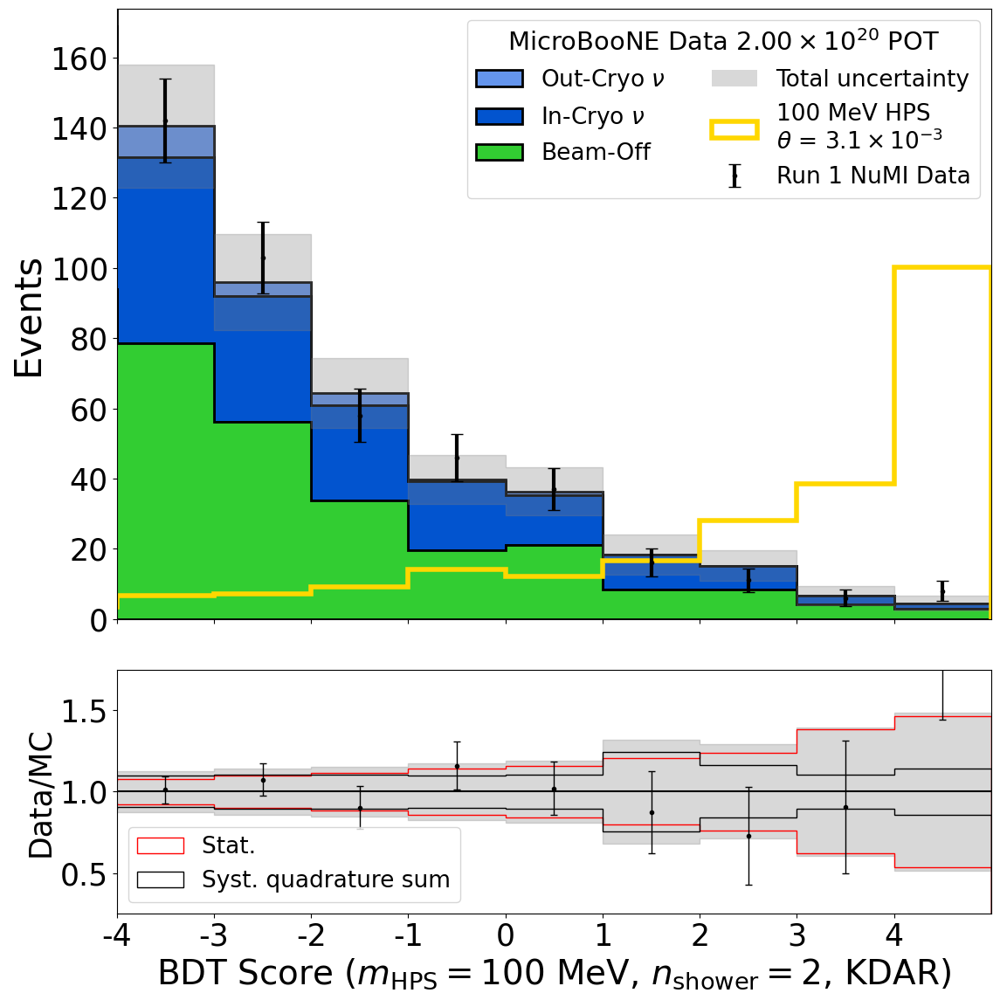

125_1shr_KDIF
HNL scale is 28.379835018301986
10 10 10
Chi square =  2.317587985915191
Reduced Chi square =  0.25750977621279897


/var/folders/wr/yb1fjkjn1mbg644j5v7f2tlm0000gp/T/ipykernel_25420/3279421264.py:191: RuntimeWarning: invalid value encountered in divide
  dat_err=np.sqrt(x1)*np.nan_to_num(x/x1)
/var/folders/wr/yb1fjkjn1mbg644j5v7f2tlm0000gp/T/ipykernel_25420/3279421264.py:241: RuntimeWarning: invalid value encountered in divide
  fracer_data=np.nan_to_num(np.sqrt(x1)/x1)


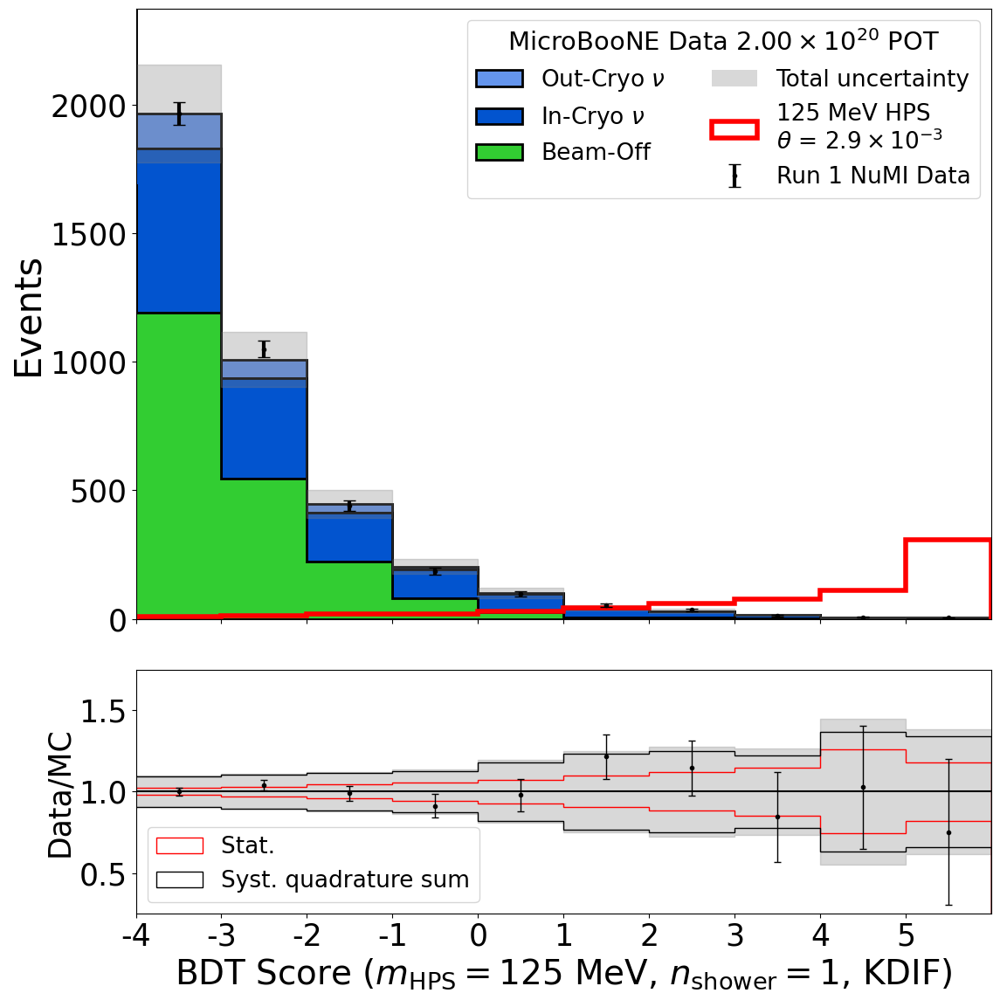

125_1shr_KDAR
HNL scale is 28.379835018301986
10 10 10
Chi square =  3.8342136847824335
Reduced Chi square =  0.4260237427536037


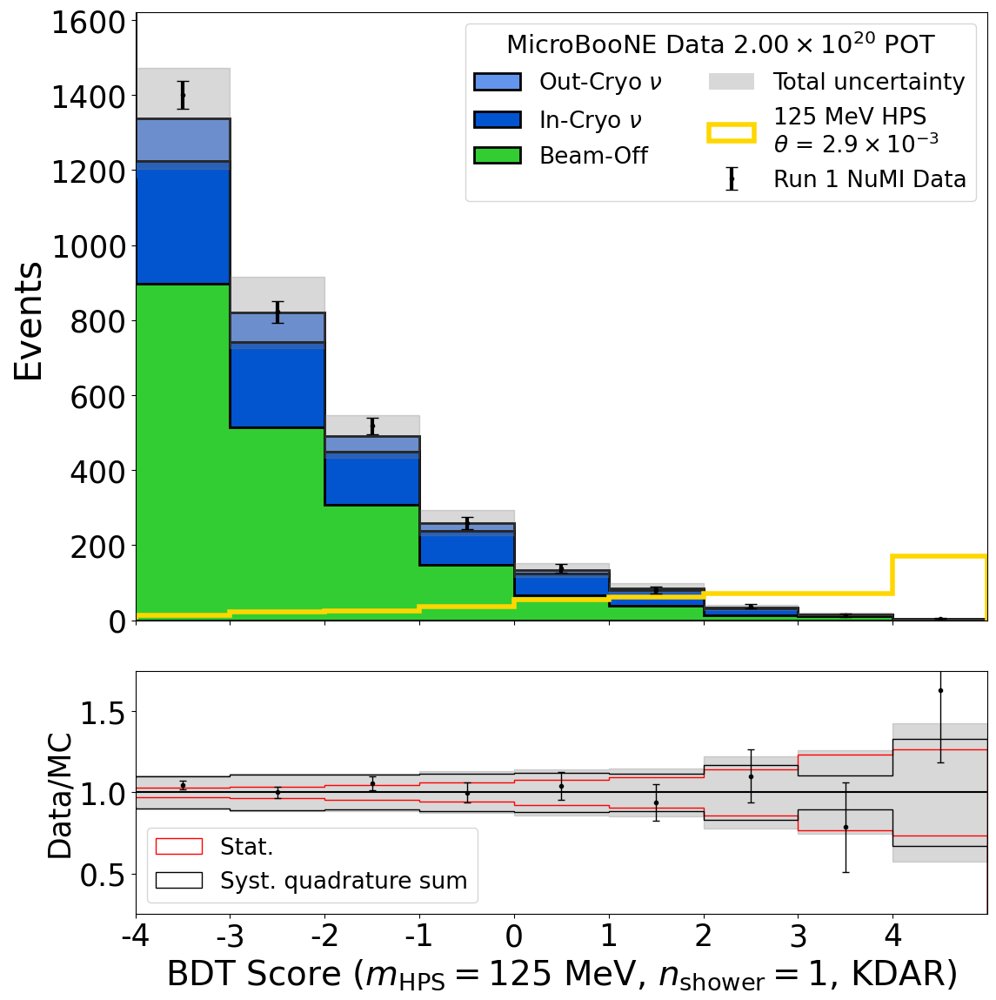

125_2shr_KDIF
HNL scale is 28.379835018301986
10 10 10
Chi square =  6.3020212179863995
Reduced Chi square =  0.7002245797762666


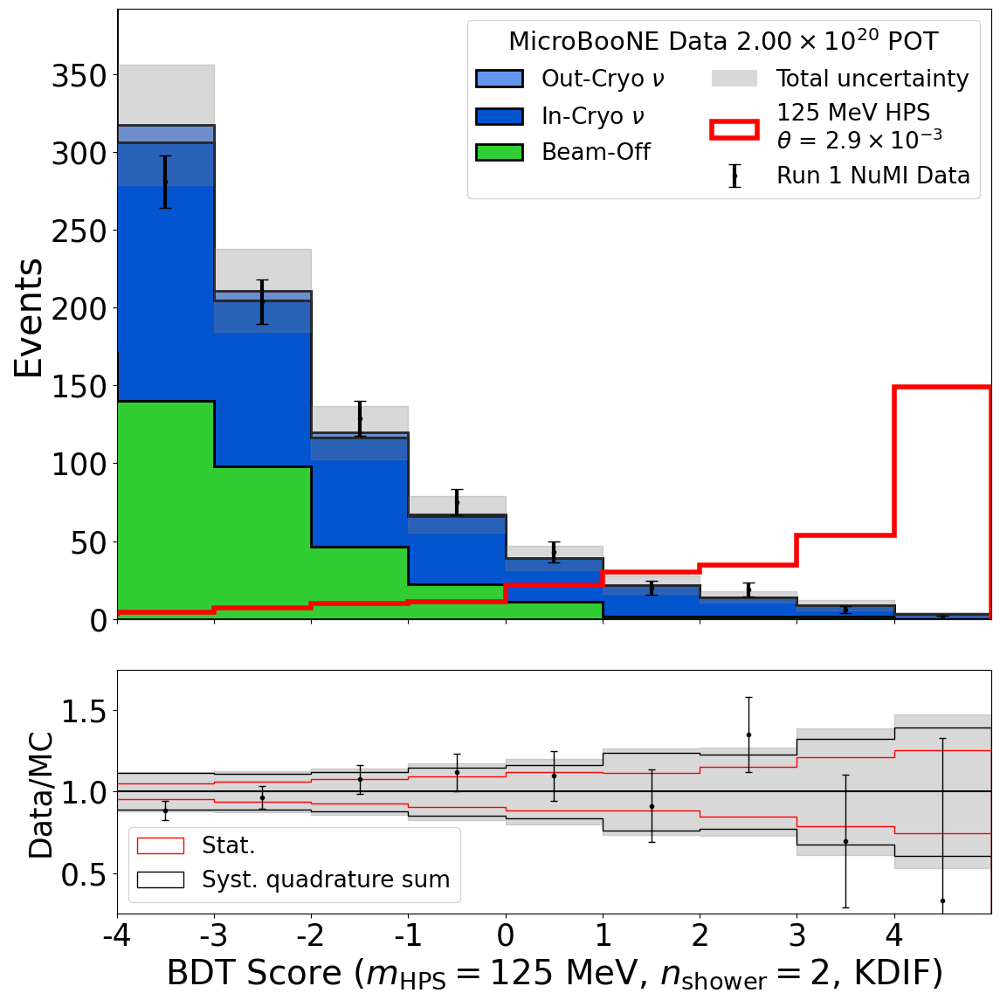

125_2shr_KDAR
HNL scale is 28.379835018301986
10 10 10
Chi square =  13.740361677593341
Reduced Chi square =  1.526706853065927


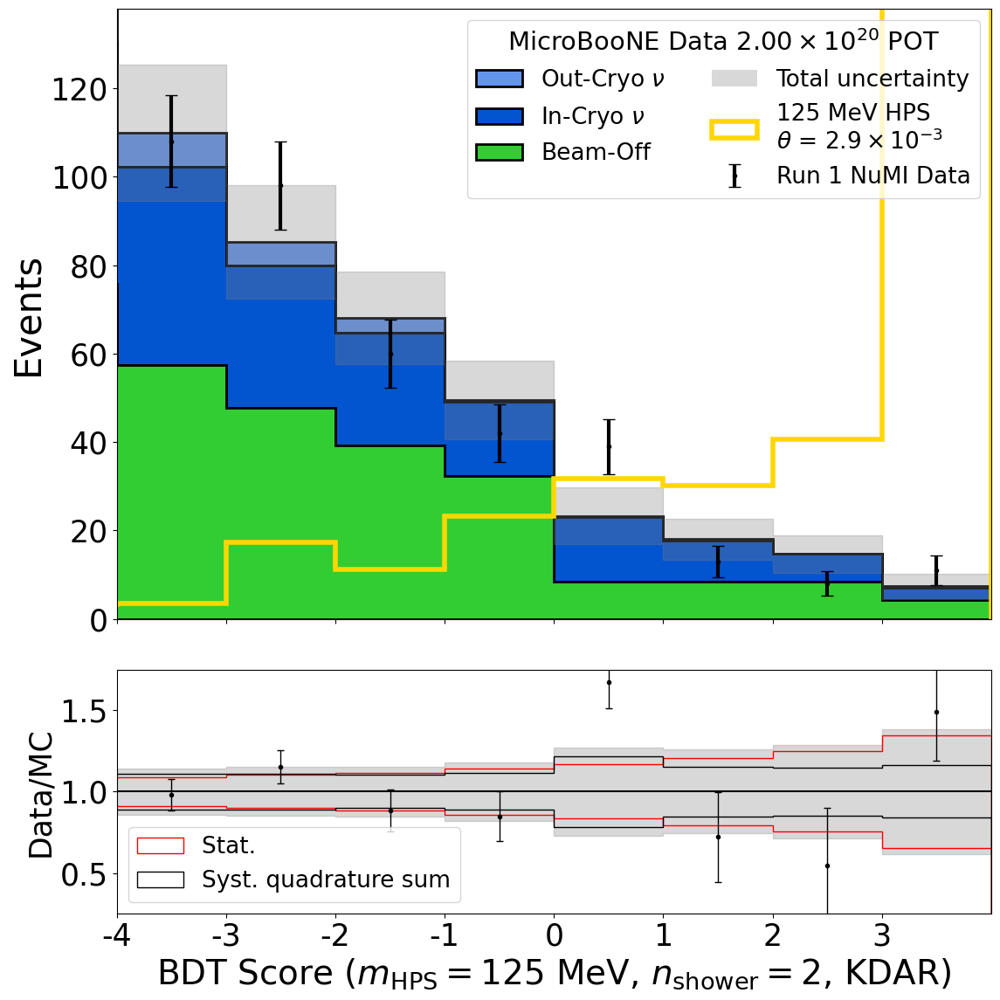

130_1shr_KDIF
HNL scale is 28.162751836253243
10 10 10
Chi square =  1.9621100647577647
Reduced Chi square =  0.2180122294175294


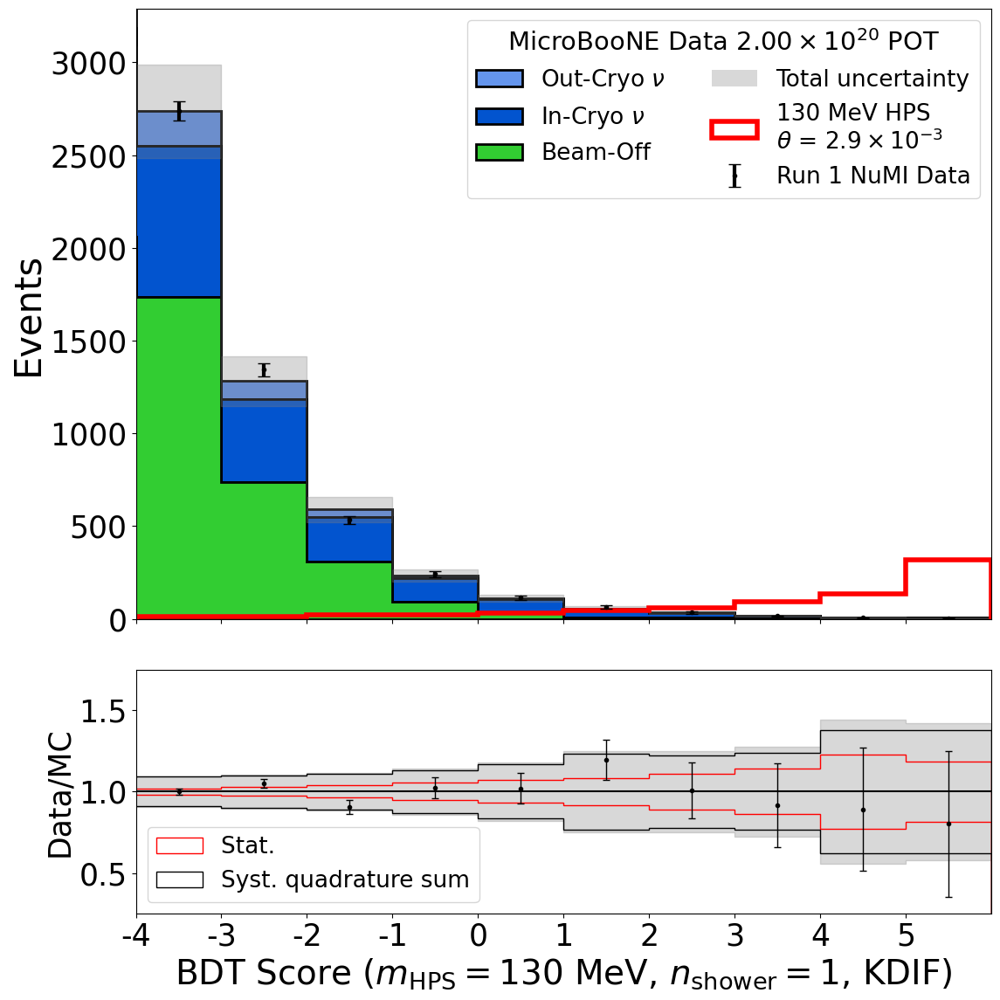

130_1shr_KDAR
HNL scale is 28.162751836253243
10 10 10
Chi square =  4.455360831910549
Reduced Chi square =  0.4950400924345055


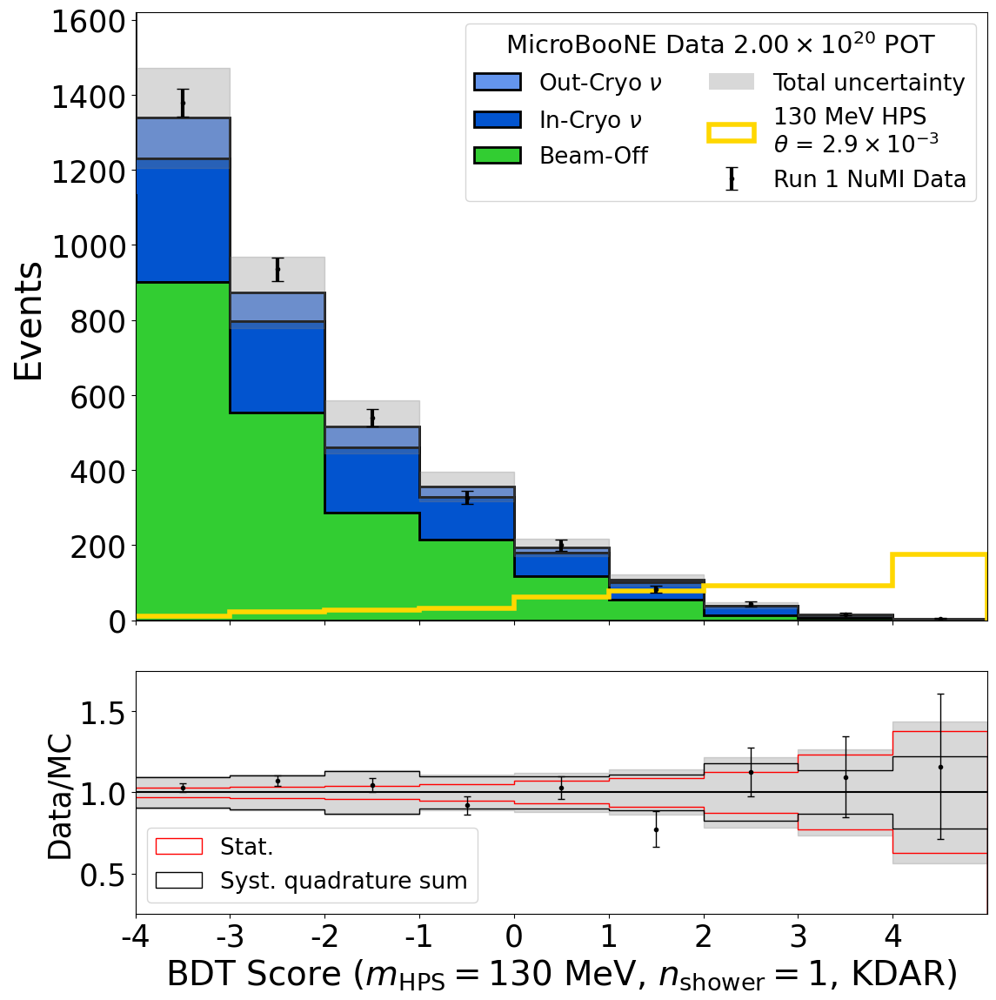

130_2shr_KDIF
HNL scale is 28.162751836253243
10 10 10
Chi square =  10.089826373363708
Reduced Chi square =  1.1210918192626342


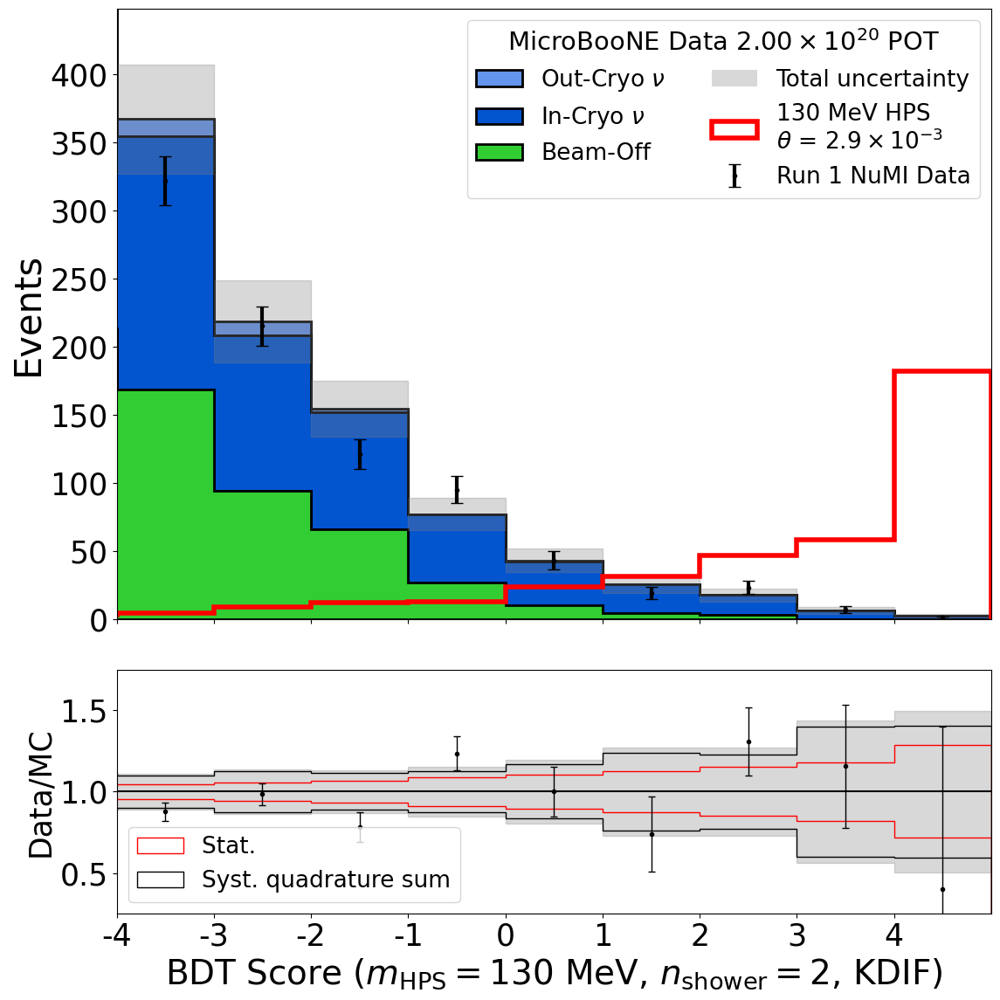

130_2shr_KDAR
HNL scale is 28.162751836253243
10 10 10
Chi square =  8.007457298864914
Reduced Chi square =  0.8897174776516571


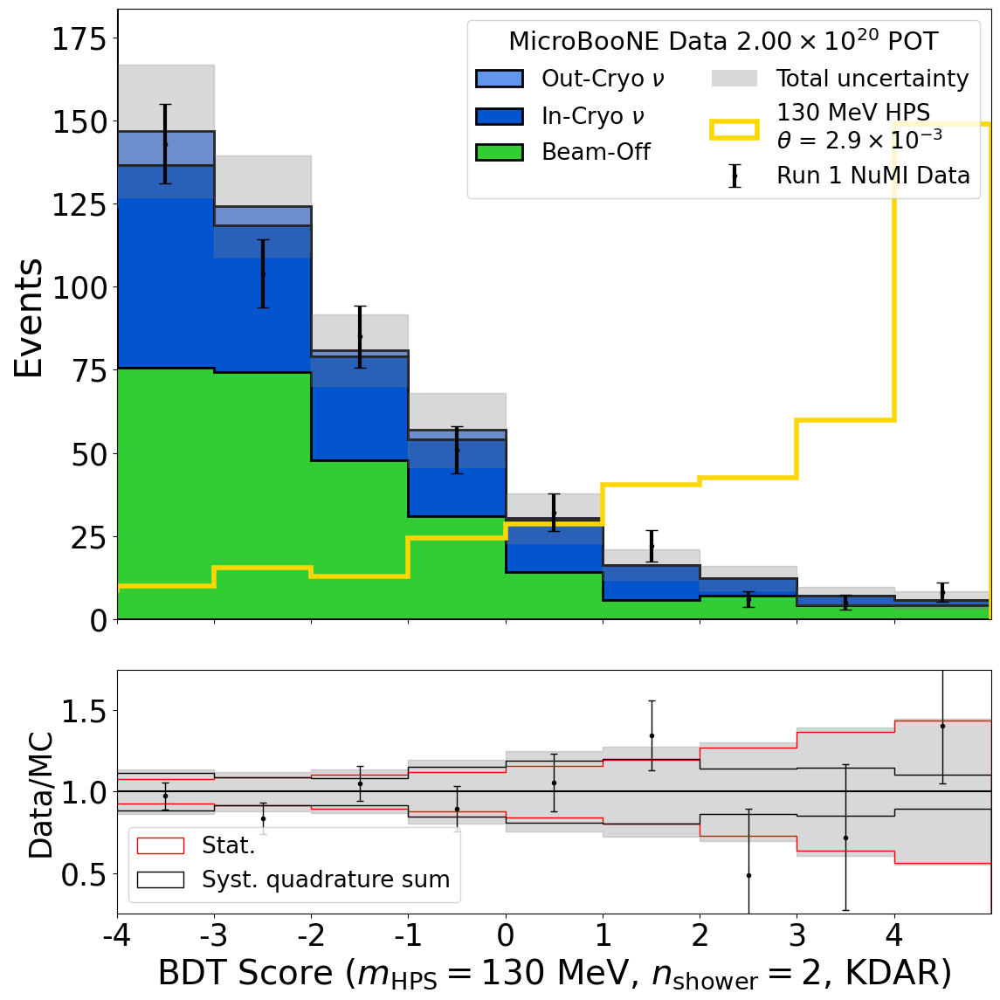

135_1shr_KDIF
HNL scale is 33.0934212370203
10 10 10
Chi square =  1.2342059312814737
Reduced Chi square =  0.1371339923646082


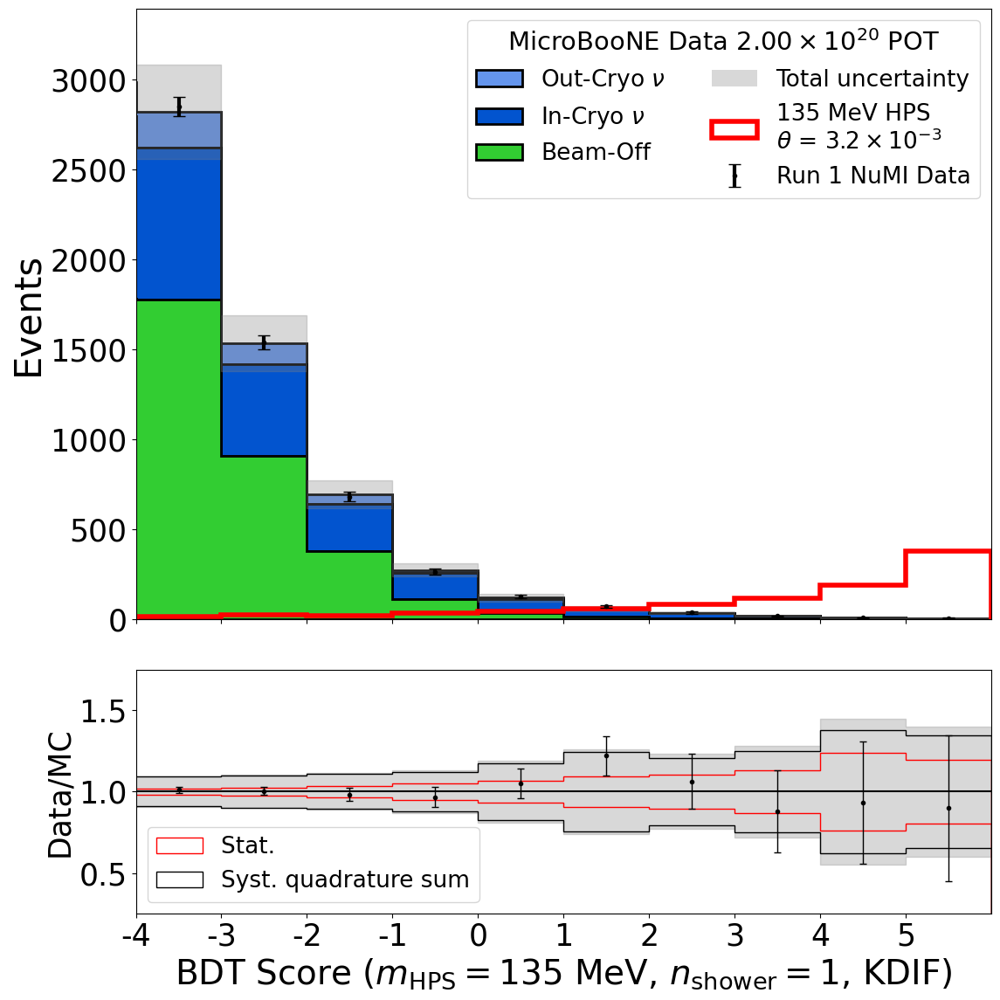

135_1shr_KDAR
HNL scale is 33.0934212370203
10 10 10
Chi square =  8.577730288935738
Reduced Chi square =  0.9530811432150821


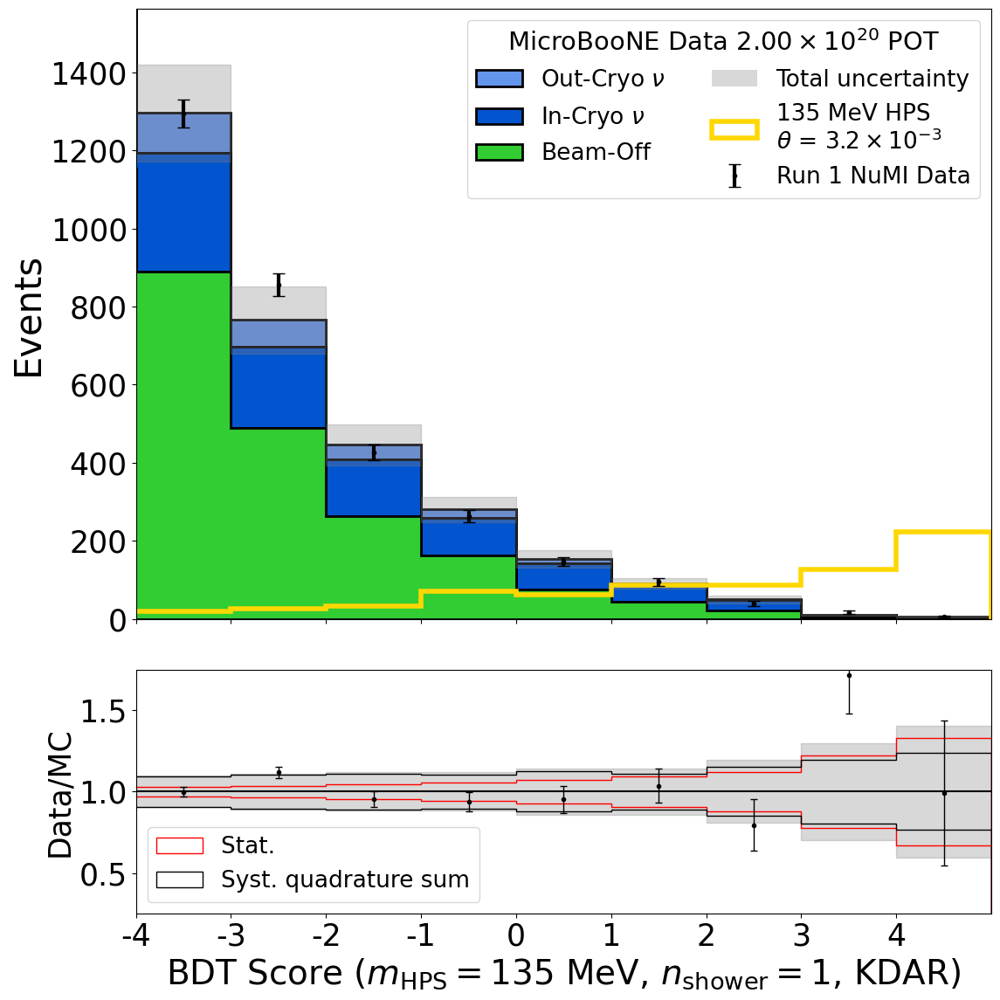

135_2shr_KDIF
HNL scale is 33.0934212370203
10 10 10
Chi square =  4.308986012911671
Reduced Chi square =  0.4787762236568523


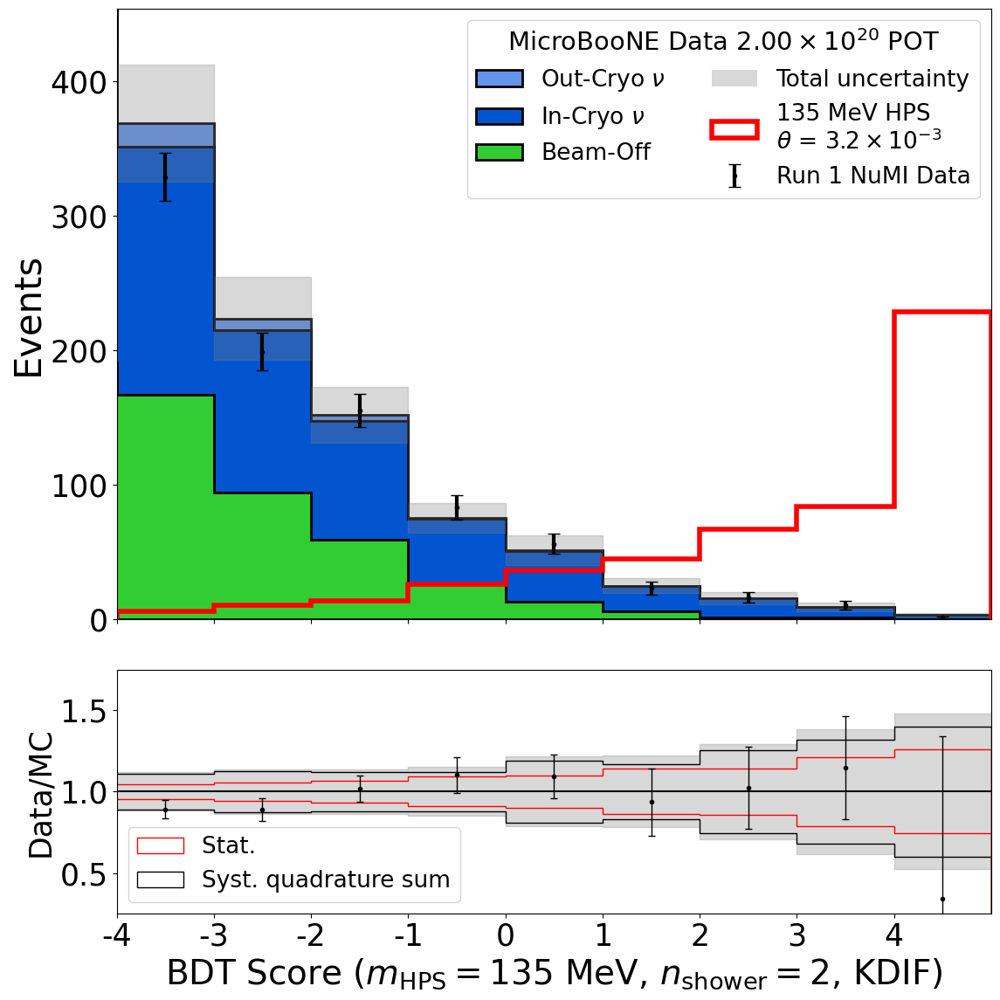

135_2shr_KDAR
HNL scale is 33.0934212370203
10 10 10
Chi square =  6.773626500440561
Reduced Chi square =  0.7526251667156179


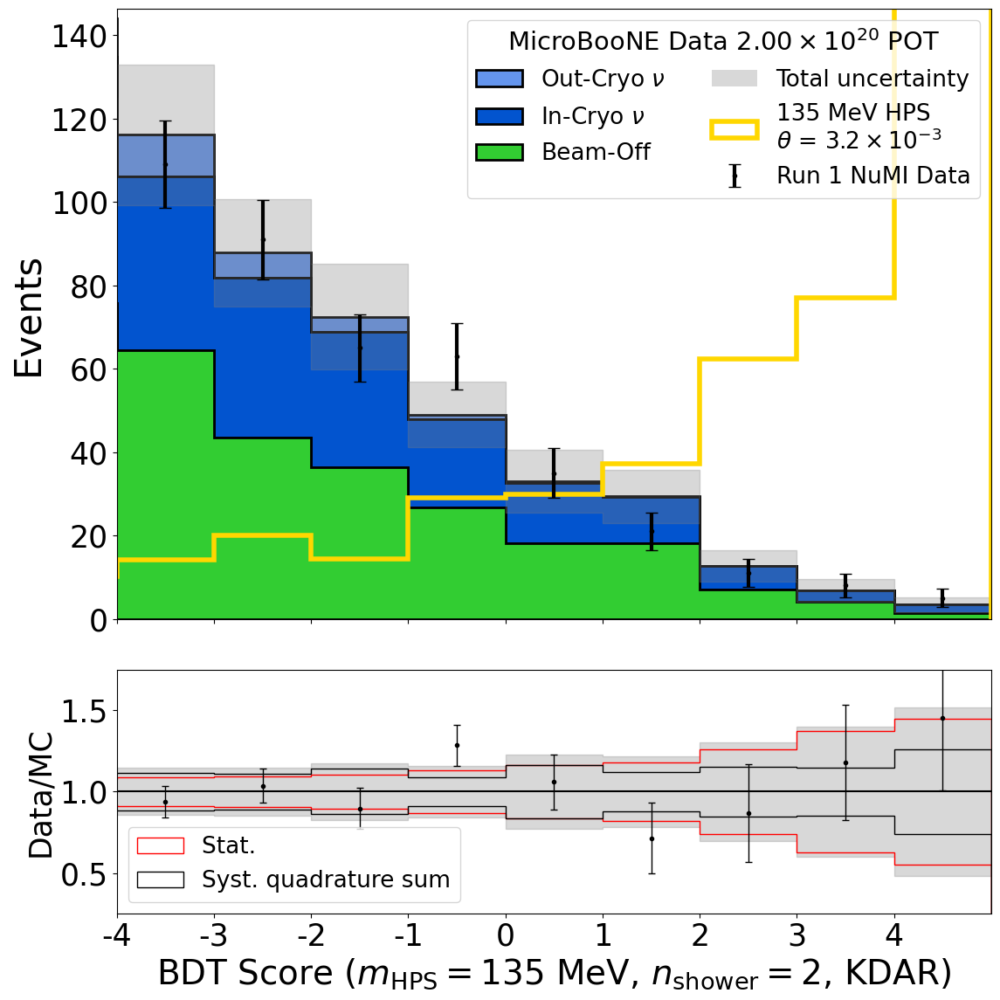

140_1shr_KDIF
HNL scale is 24.557923848397692
10 10 10
Chi square =  3.9713084872505737
Reduced Chi square =  0.4412564985833971


/var/folders/wr/yb1fjkjn1mbg644j5v7f2tlm0000gp/T/ipykernel_25420/3279421264.py:191: RuntimeWarning: invalid value encountered in divide
  dat_err=np.sqrt(x1)*np.nan_to_num(x/x1)
/var/folders/wr/yb1fjkjn1mbg644j5v7f2tlm0000gp/T/ipykernel_25420/3279421264.py:241: RuntimeWarning: invalid value encountered in divide
  fracer_data=np.nan_to_num(np.sqrt(x1)/x1)


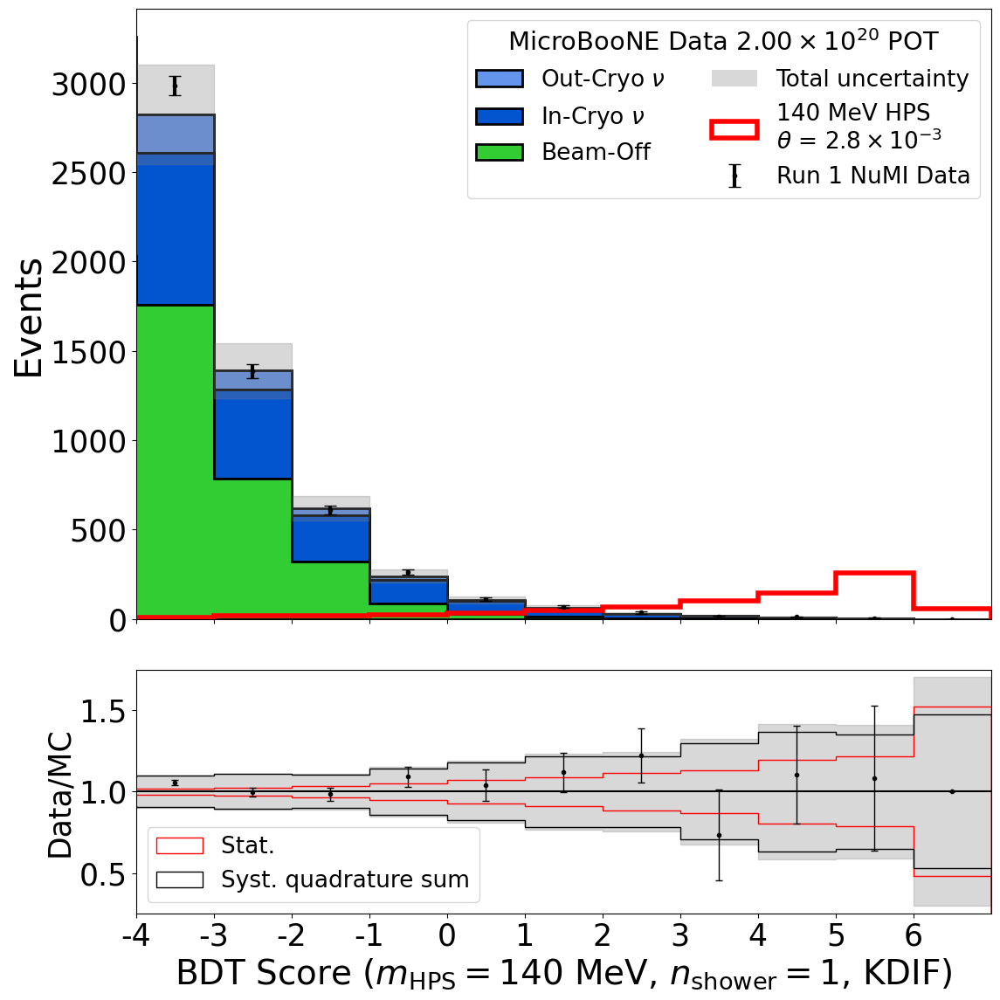

140_1shr_KDAR
HNL scale is 24.557923848397692
10 10 10
Chi square =  6.451541004507431
Reduced Chi square =  0.7168378893897145


/var/folders/wr/yb1fjkjn1mbg644j5v7f2tlm0000gp/T/ipykernel_25420/3279421264.py:191: RuntimeWarning: invalid value encountered in divide
  dat_err=np.sqrt(x1)*np.nan_to_num(x/x1)
/var/folders/wr/yb1fjkjn1mbg644j5v7f2tlm0000gp/T/ipykernel_25420/3279421264.py:241: RuntimeWarning: invalid value encountered in divide
  fracer_data=np.nan_to_num(np.sqrt(x1)/x1)


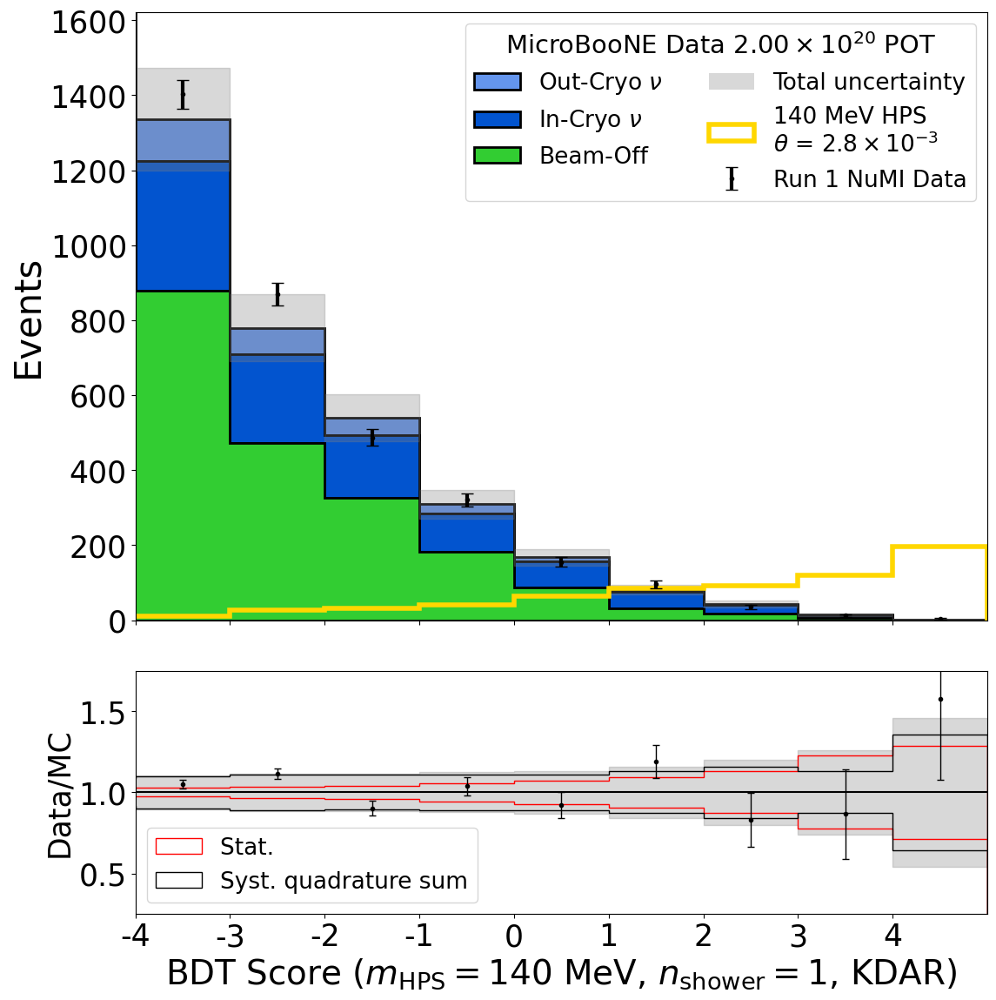

140_2shr_KDIF
HNL scale is 24.557923848397692
10 10 10
Chi square =  9.260907134851925
Reduced Chi square =  1.0289896816502138


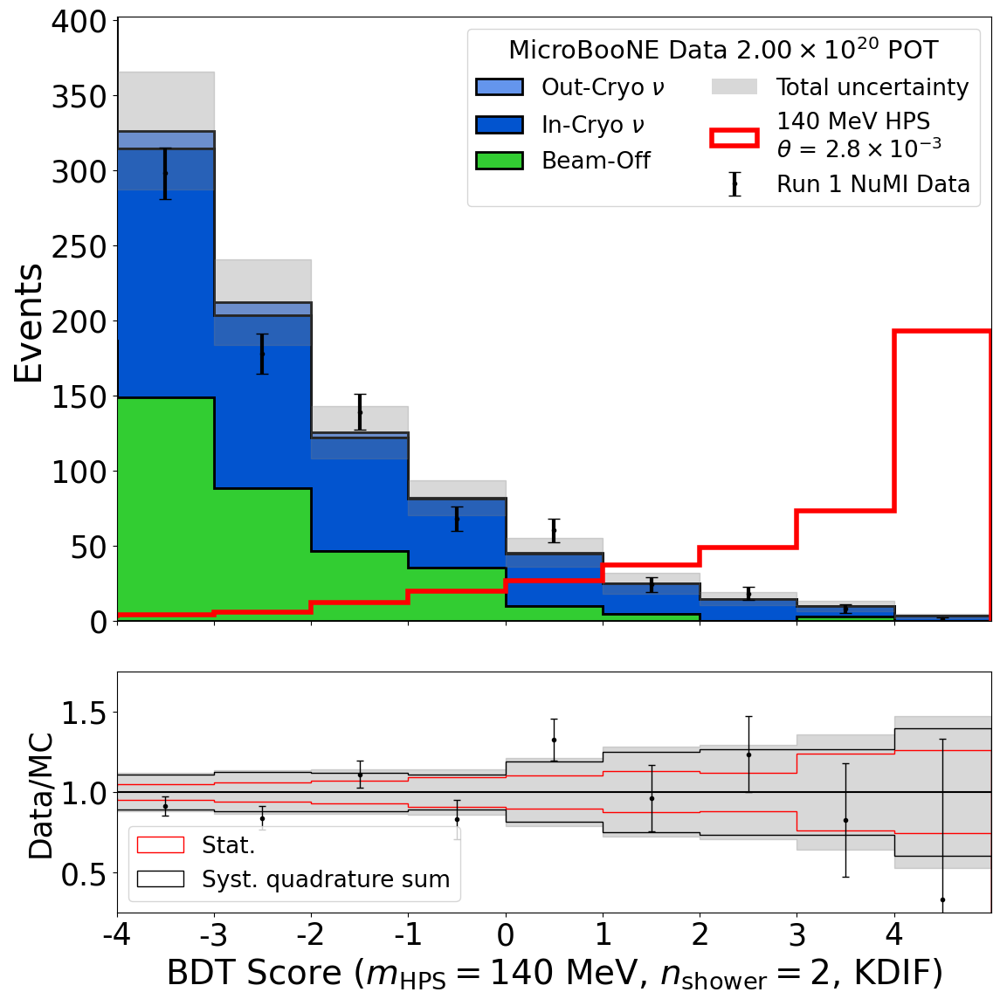

140_2shr_KDAR
HNL scale is 24.557923848397692
10 10 10
Chi square =  9.84322887838433
Reduced Chi square =  1.093692097598259


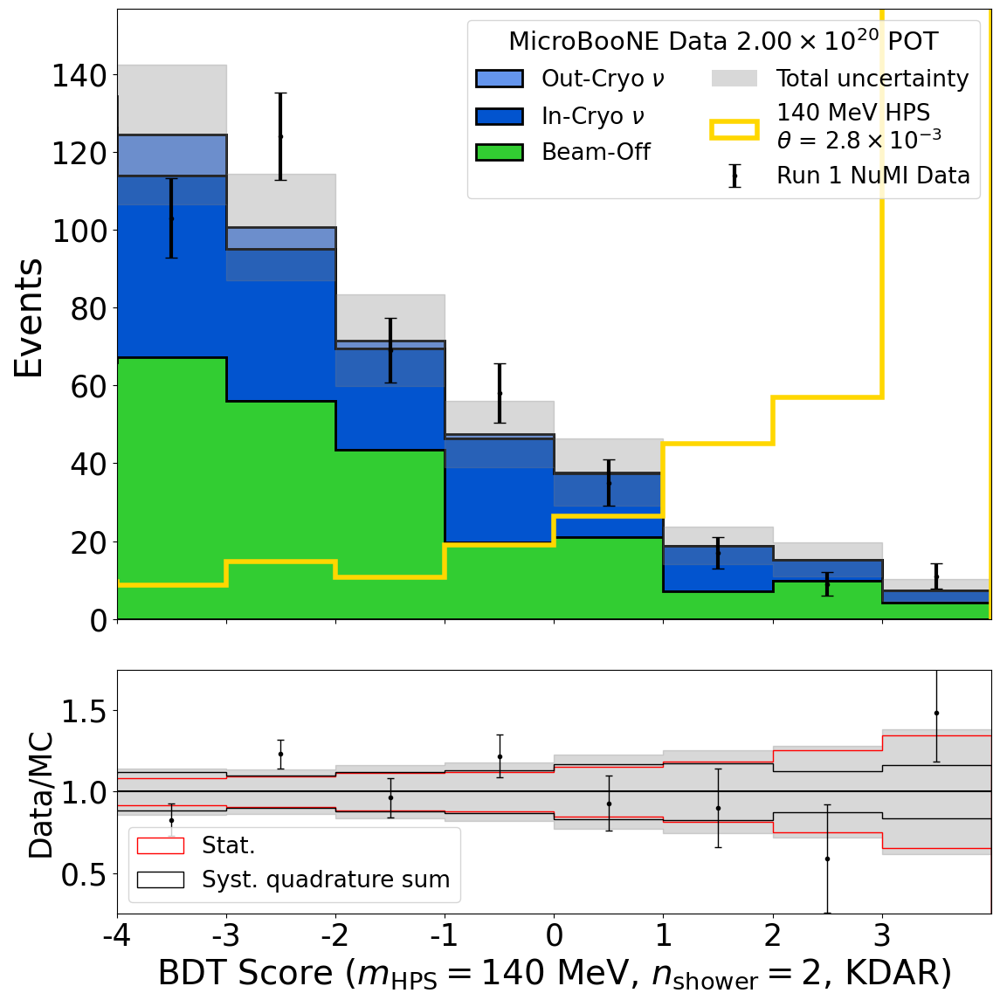

145_1shr_KDIF
HNL scale is 18.910247286354164
10 10 10
Chi square =  4.7320696050547335
Reduced Chi square =  0.5257855116727481


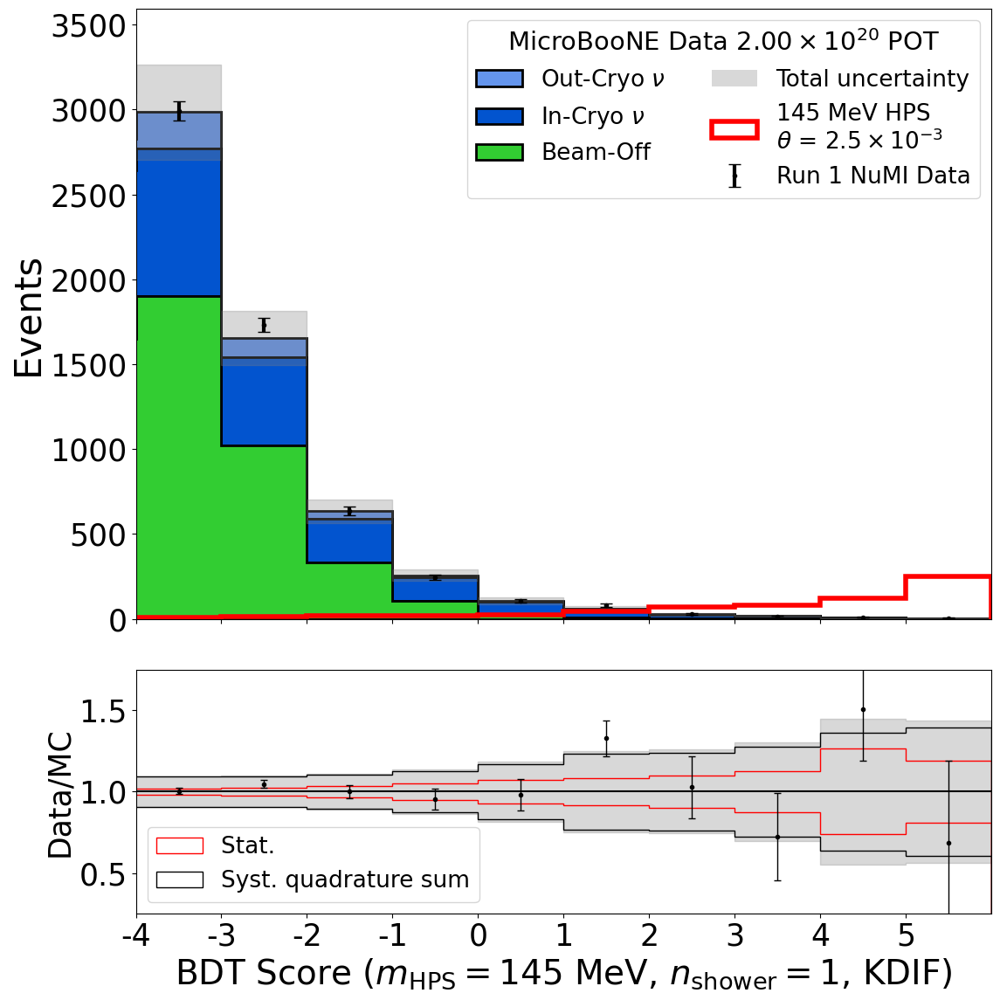

145_1shr_KDAR
HNL scale is 18.910247286354164
10 10 10
Chi square =  4.631330951540486
Reduced Chi square =  0.5145923279489428


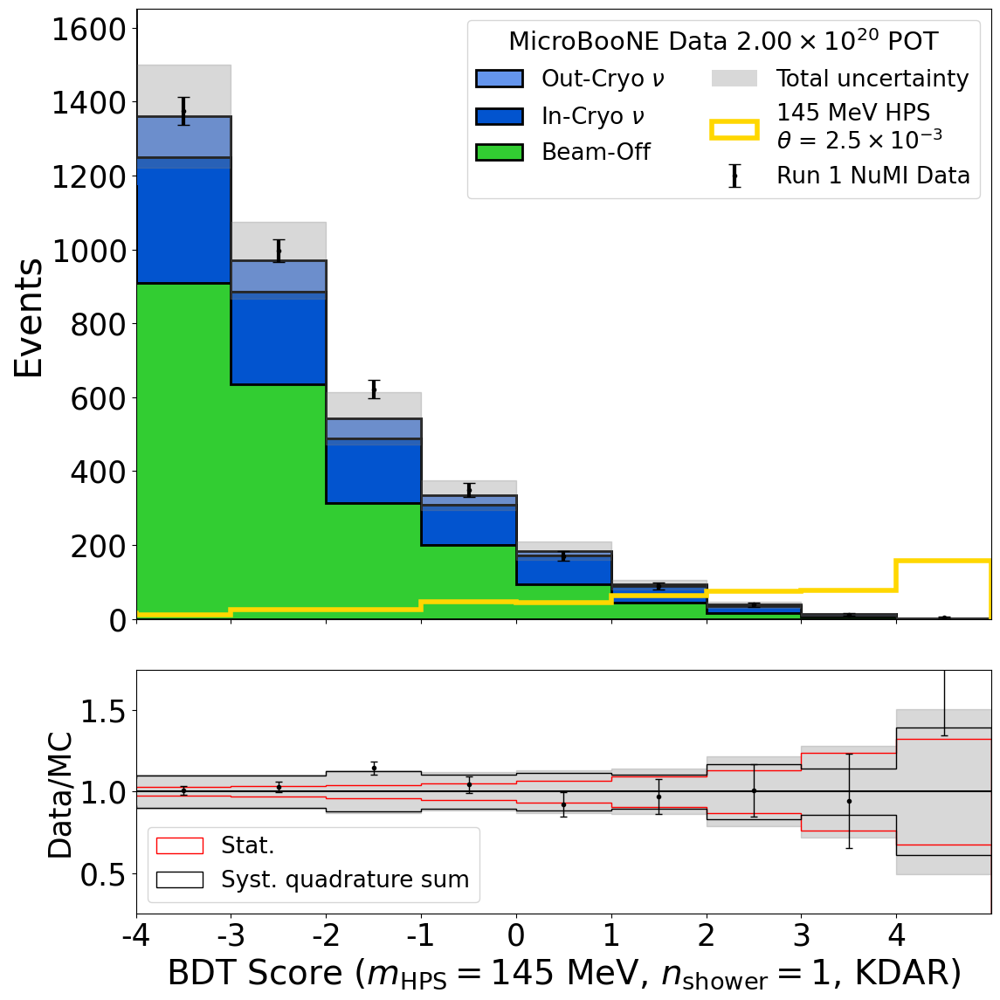

145_2shr_KDIF
HNL scale is 18.910247286354164
10 10 10
Chi square =  6.587067724071581
Reduced Chi square =  0.7318964137857312


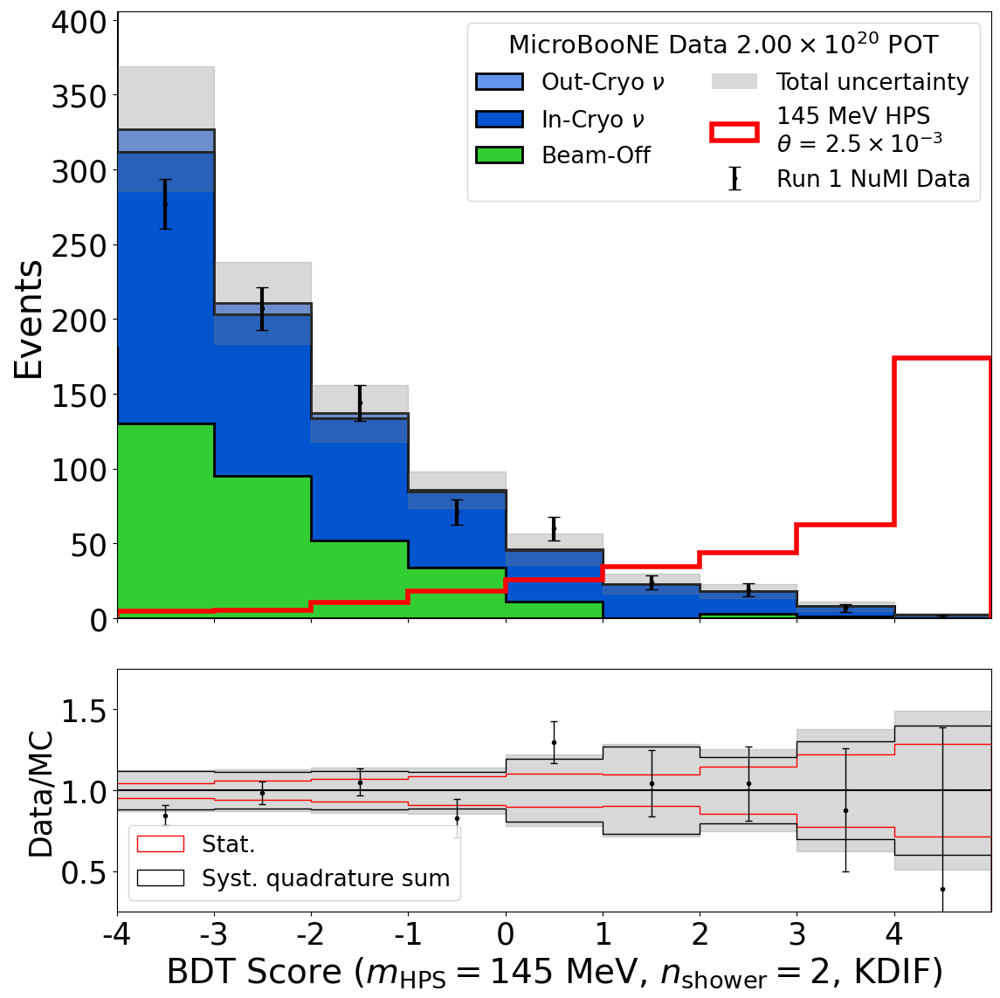

145_2shr_KDAR
HNL scale is 18.910247286354164
10 10 10
Chi square =  10.870151206899191
Reduced Chi square =  1.2077945785443545


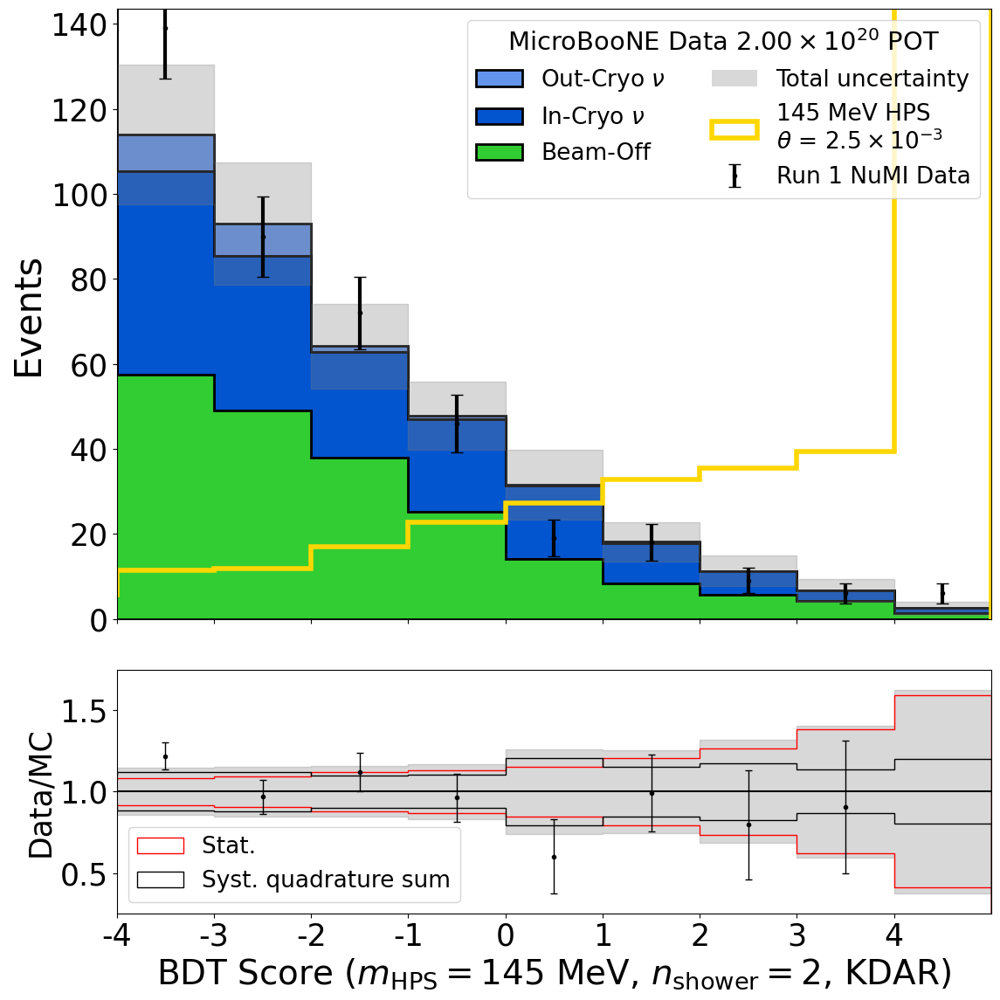

150_1shr_KDIF
HNL scale is 25.614551478855574
10 10 10
Chi square =  5.01651140253307
Reduced Chi square =  0.5573901558370078


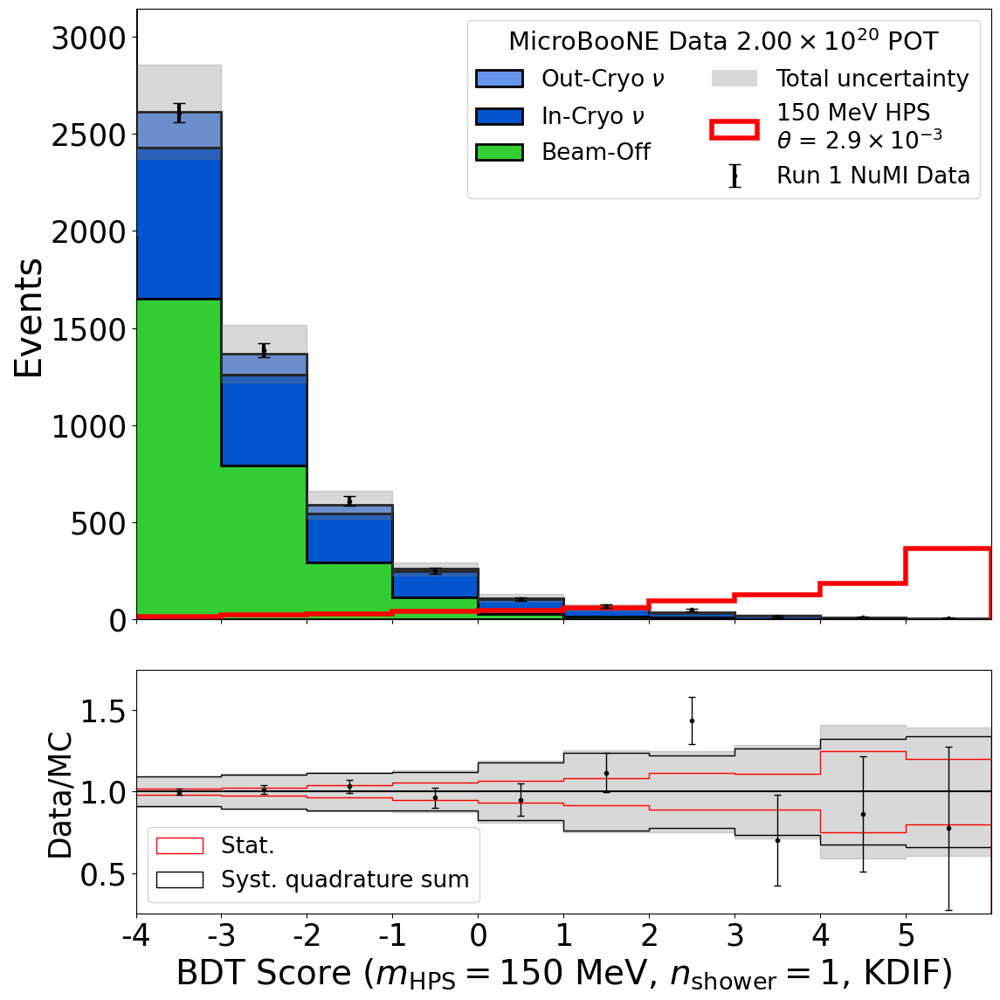

150_1shr_KDAR
HNL scale is 25.614551478855574
10 10 10
Chi square =  2.7458906087731005
Reduced Chi square =  0.3050989565303445


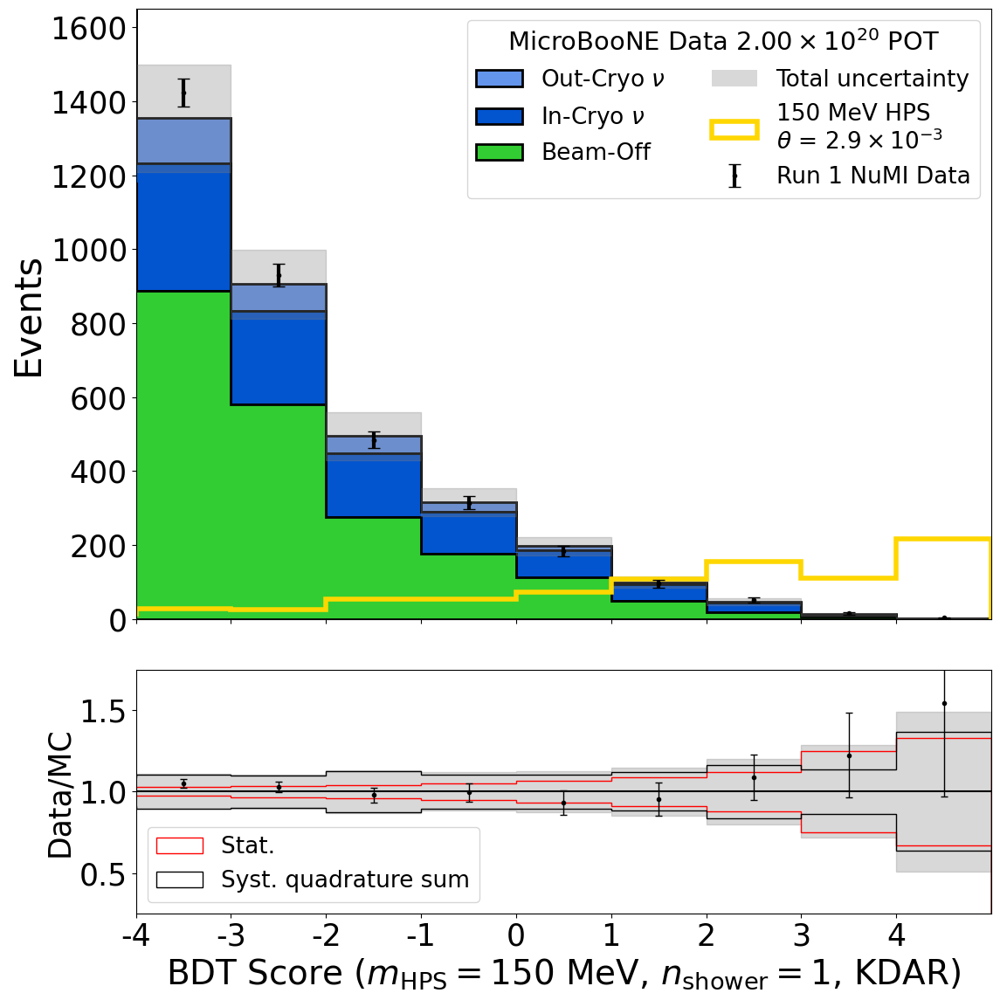

150_2shr_KDIF
HNL scale is 25.614551478855574
10 10 10
Chi square =  6.587570279659811
Reduced Chi square =  0.7319522532955346
Adapted y axis range in one plot for paper


/var/folders/wr/yb1fjkjn1mbg644j5v7f2tlm0000gp/T/ipykernel_25420/3279421264.py:191: RuntimeWarning: invalid value encountered in divide
  dat_err=np.sqrt(x1)*np.nan_to_num(x/x1)
/var/folders/wr/yb1fjkjn1mbg644j5v7f2tlm0000gp/T/ipykernel_25420/3279421264.py:241: RuntimeWarning: invalid value encountered in divide
  fracer_data=np.nan_to_num(np.sqrt(x1)/x1)


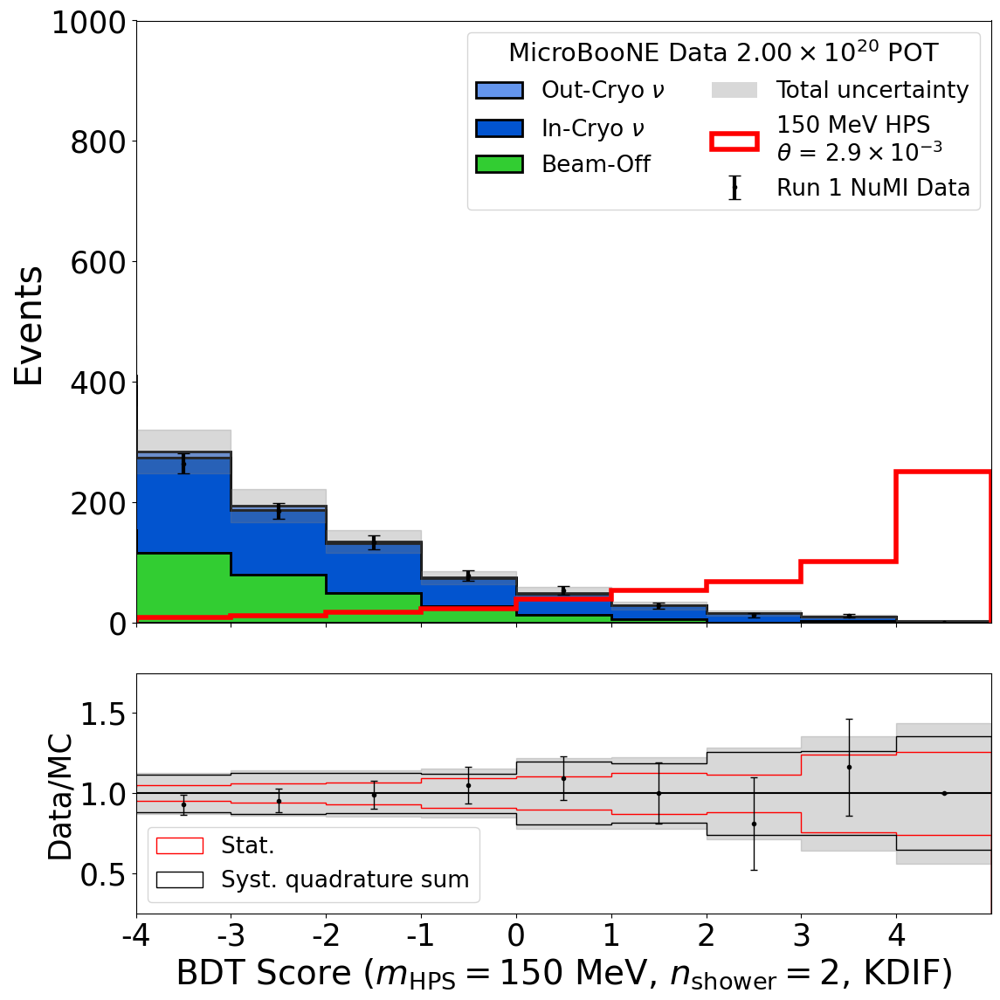

150_2shr_KDAR
HNL scale is 25.614551478855574
10 10 10
Chi square =  5.983178892967297
Reduced Chi square =  0.6647976547741441
Adapted y axis range in one plot for paper


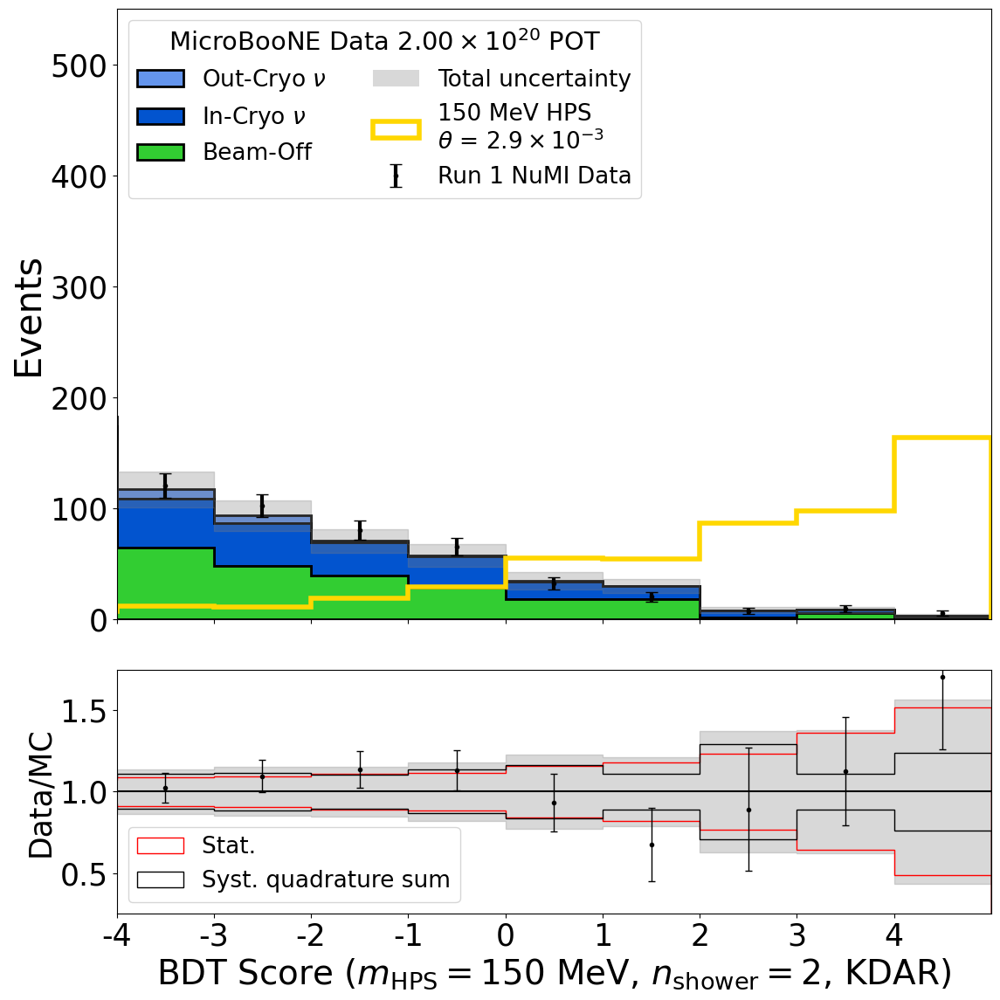

200_1shr_KDIF
HNL scale is 12.324581090746374
10 10 10
Chi square =  1.1771267466166107
Reduced Chi square =  0.13079186073517896


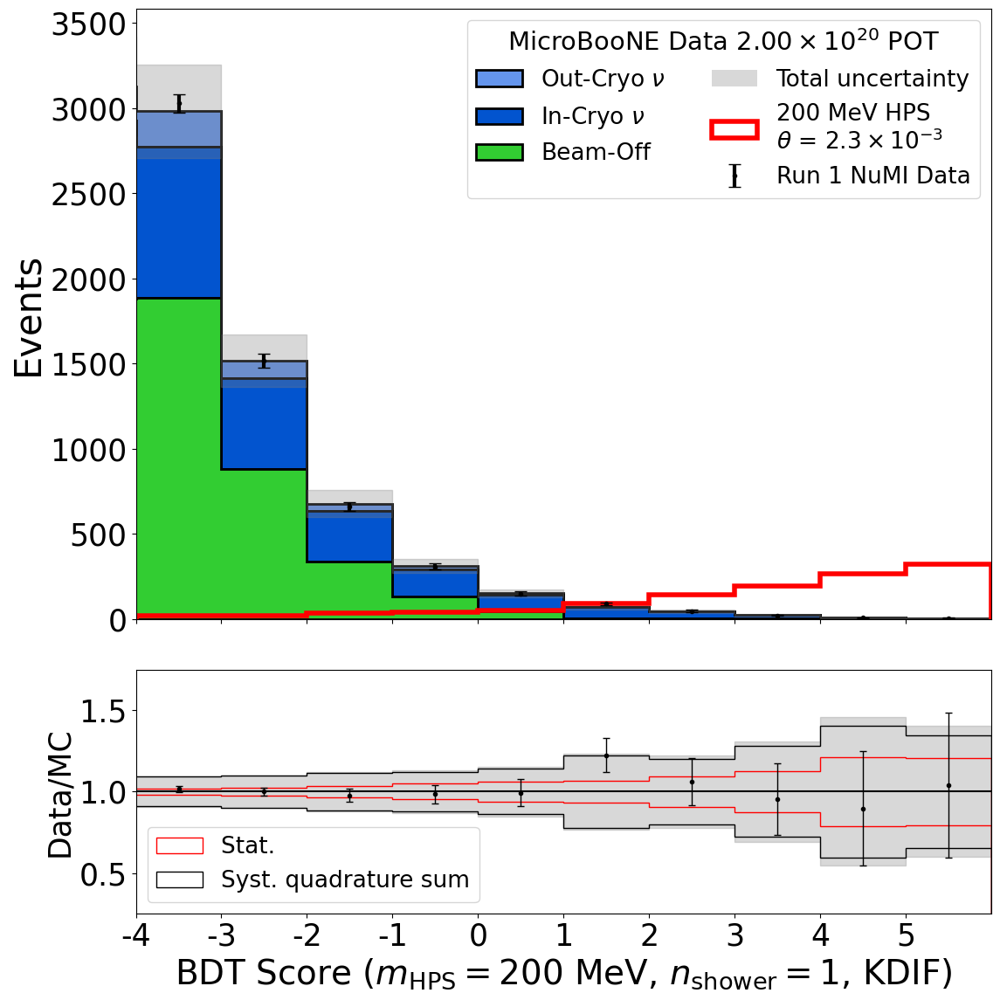

200_1shr_KDAR
HNL scale is 12.324581090746374
10 10 10
Chi square =  2.7682673773533137
Reduced Chi square =  0.3075852641503682


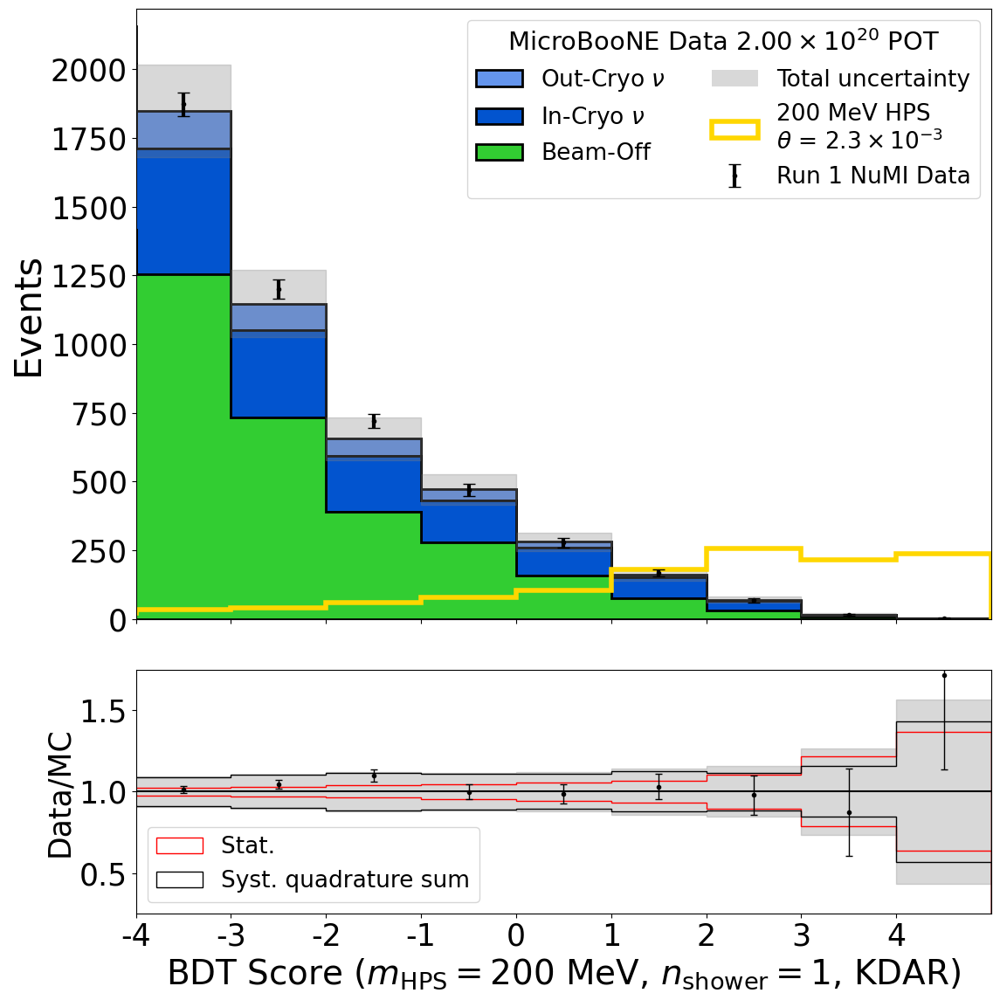

200_2shr_KDIF
HNL scale is 12.324581090746374
10 10 10
Chi square =  6.558425821364636
Reduced Chi square =  0.7287139801516261


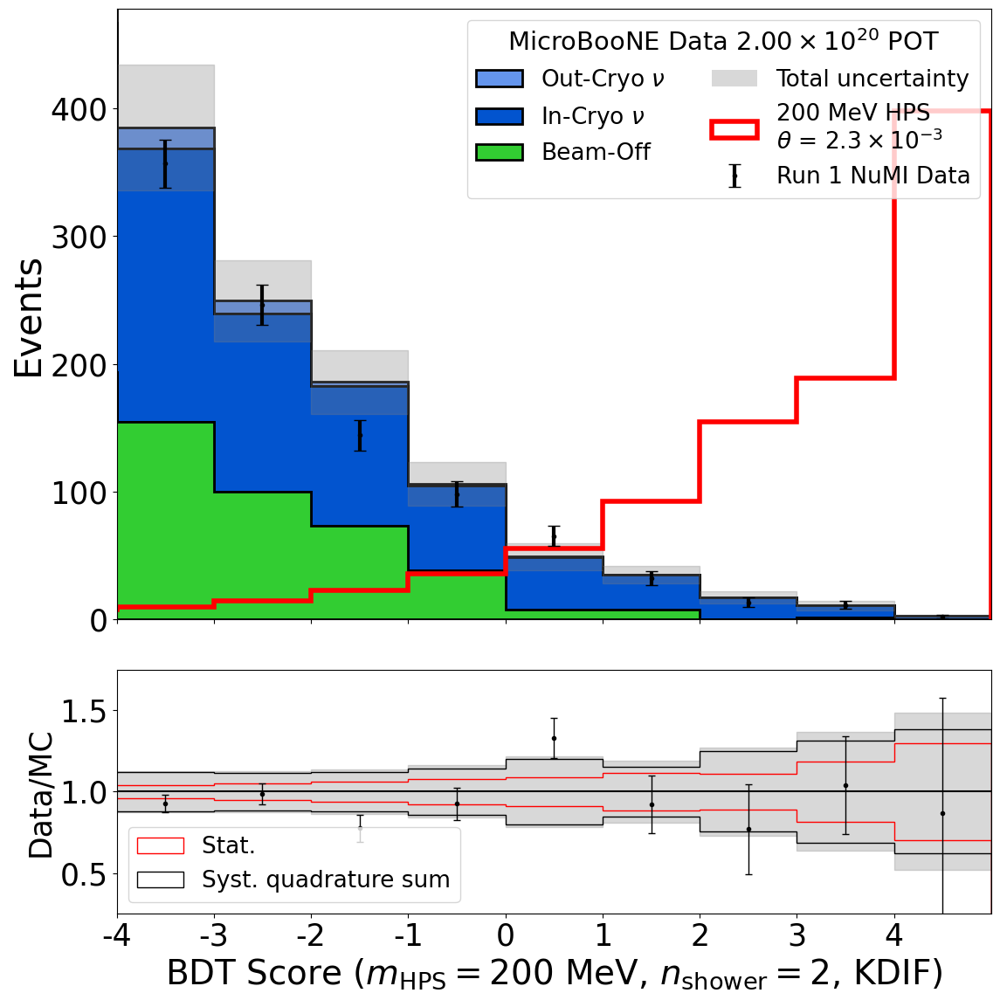

200_2shr_KDAR
HNL scale is 12.324581090746374
10 10 10
Chi square =  13.126479325694886
Reduced Chi square =  1.4584977028549873


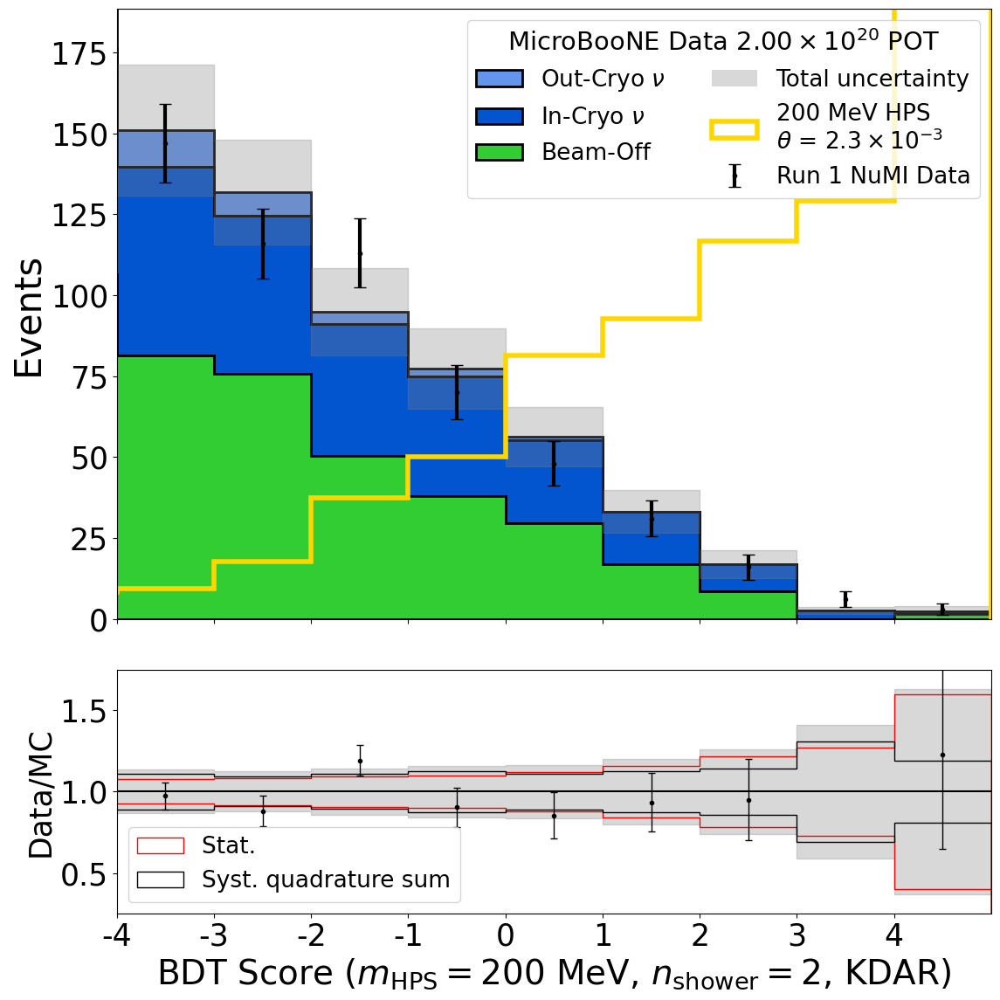

In [37]:
# Run1
plt.rcParams.update({'font.size': 25})
Lo_score = -5.0

adjusted_xlims_r1, xticks_r1 = make_xlims_dict(bins_overflow_r1, lower = -4)

# for key in adjusted_xlims_r1:
#     adjusted_xlims_r1[key][0] = 1

savestr = f"_unstacked"

sample_colours_test = {'overlay':'#0254cf',
                  'dirtoverlay':'cornflowerblue',
                  'beamoff':'limegreen',
                  'signal':'red',
                  'signal_pi0':'gold'}

# titlename = r"MicroBooNE Data" "\n" r"$2.00\times10^{20}$ POT"
titlename = r"MicroBooNE Data $2.00\times10^{20}$ POT"

Plot_BDT_output_systematics_data(signal_dict_r1, tot_uncertainty_dict_r1, bkg_sys_r1, sig_sys_err_r1, bkgs_dict_r1, data_r1, bins_cents_overflow_r1, bins_overflow_r1, 
                                 xlims=adjusted_xlims_r1, xticks=xticks_r1, upper_y=0.75, legloc="upper right", colours = sample_colours_test,
                                 legsize=19, logy=False, savefig=False, save_str=savestr, Run="run1", HNL_scale=new_hist_scaling,
                                 override_sub_ylim=True, subplot_ratio=1.2,show_ev_nums=False,
                                 scale_up=new_hist_scaling, thetas = theta_dict, sig_sys=False, HNL_scale_label=True, stacked=False,
                                 title_name=None, textpos=None, plot_text=titlename, textsize=18, ncols=2, plot_stat_sys=True, get_chi2=True)

Scaling each mass point individually
100_1shr_KDIF
HNL scale is 33.019602633385574
10 10 10
Chi square =  1.7168155406169814
Reduced Chi square =  0.1907572822907757


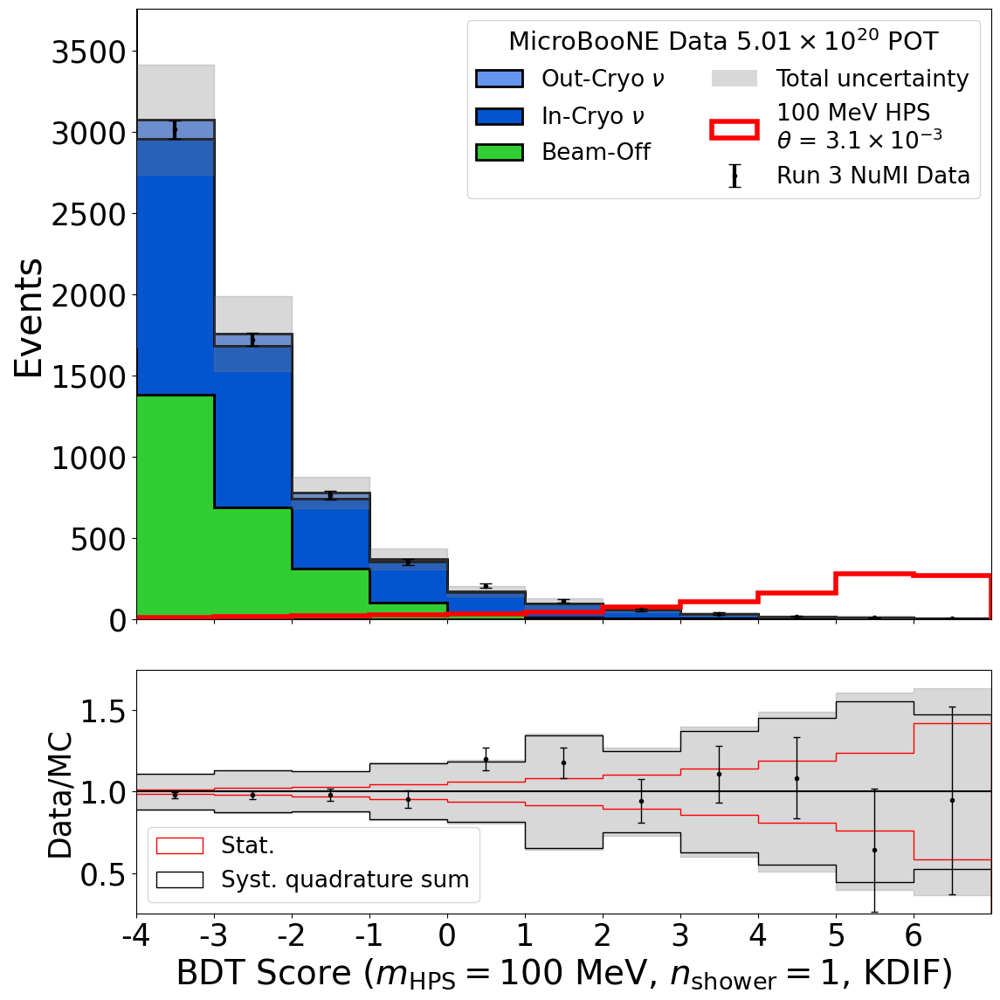

100_1shr_KDAR
HNL scale is 33.019602633385574
10 10 10
Chi square =  1.4442935499619627
Reduced Chi square =  0.16047706110688476


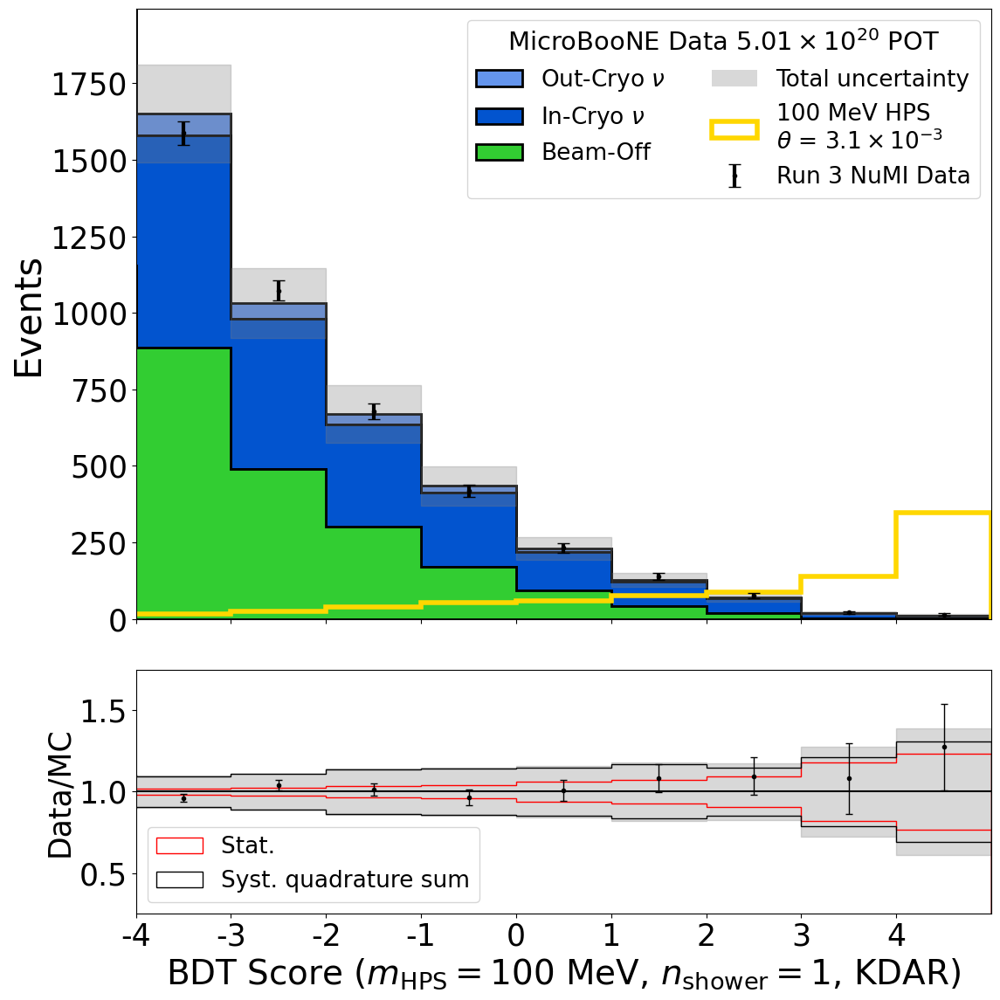

100_2shr_KDIF
HNL scale is 33.019602633385574
10 10 10
Chi square =  1.717332130396546
Reduced Chi square =  0.19081468115517178


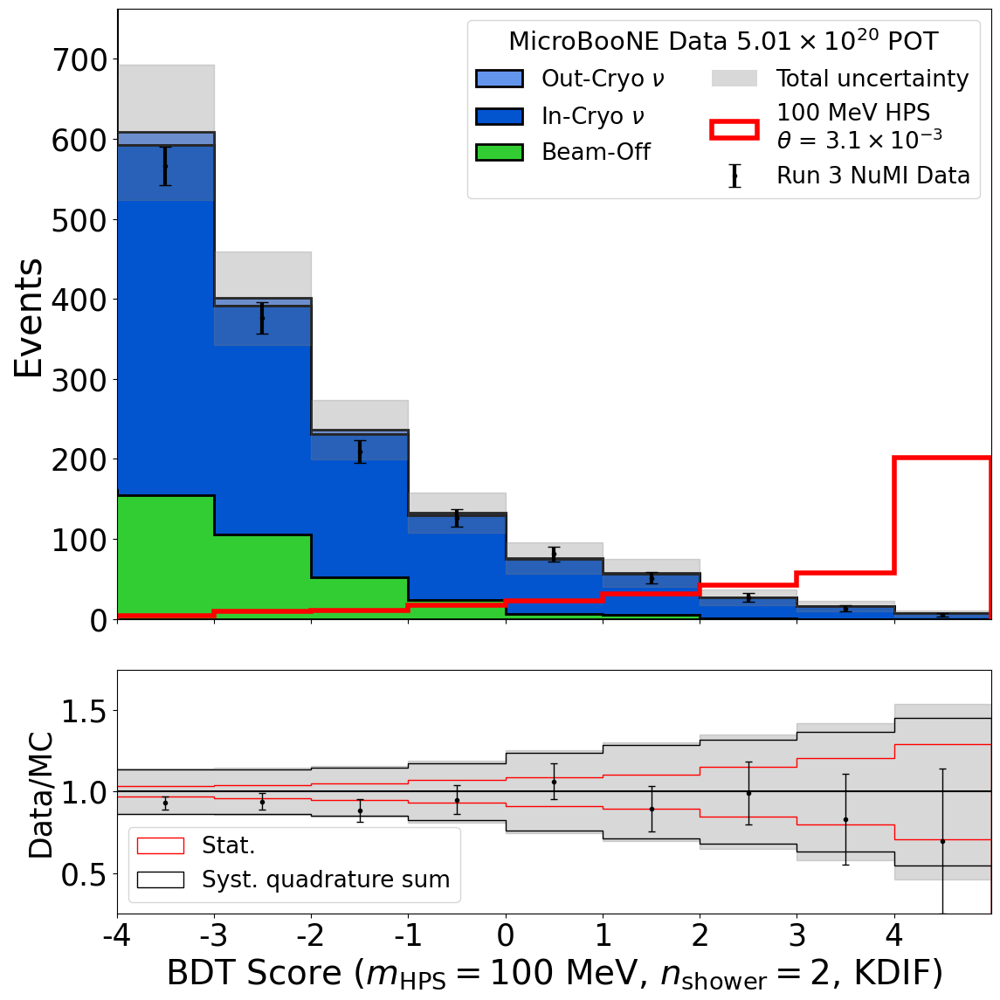

100_2shr_KDAR
HNL scale is 33.019602633385574
10 10 10
Chi square =  7.695568958743215
Reduced Chi square =  0.855063217638135


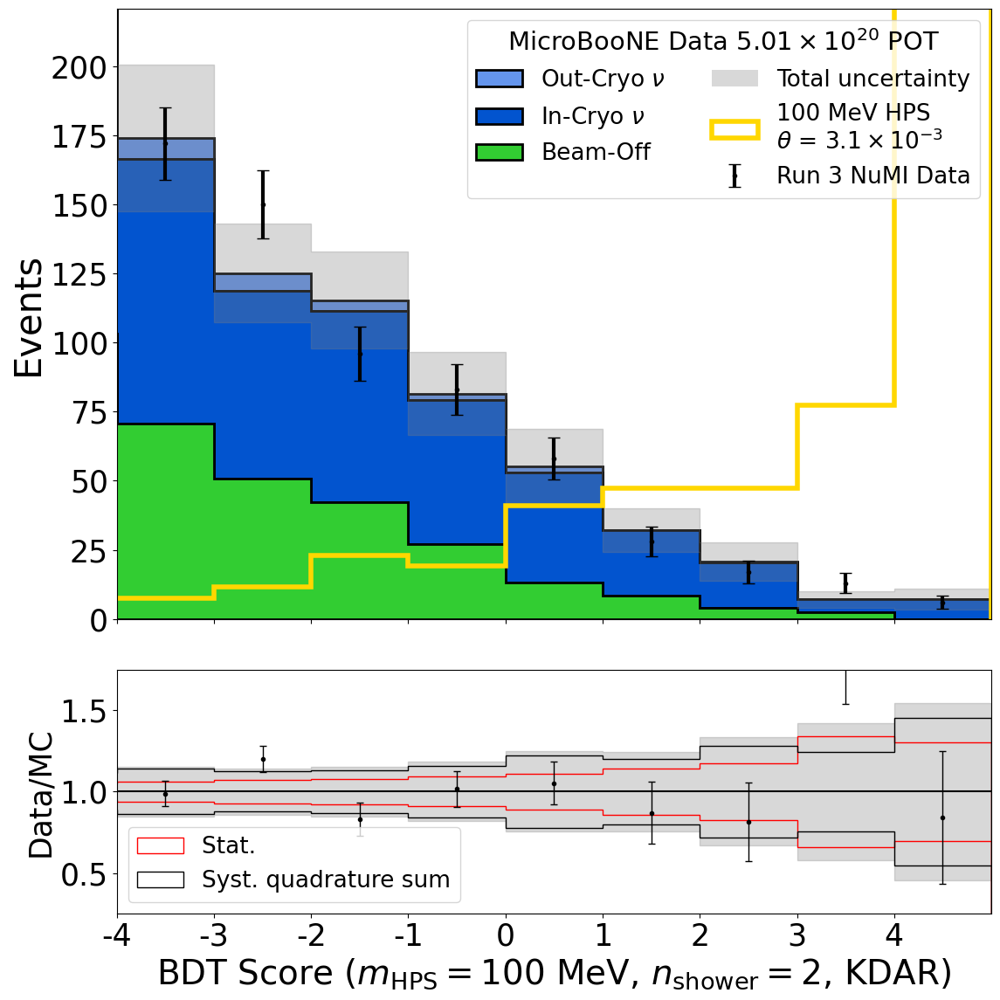

125_1shr_KDIF
HNL scale is 28.379835018301986
10 10 10
Chi square =  2.7257004836145415
Reduced Chi square =  0.3028556092905046


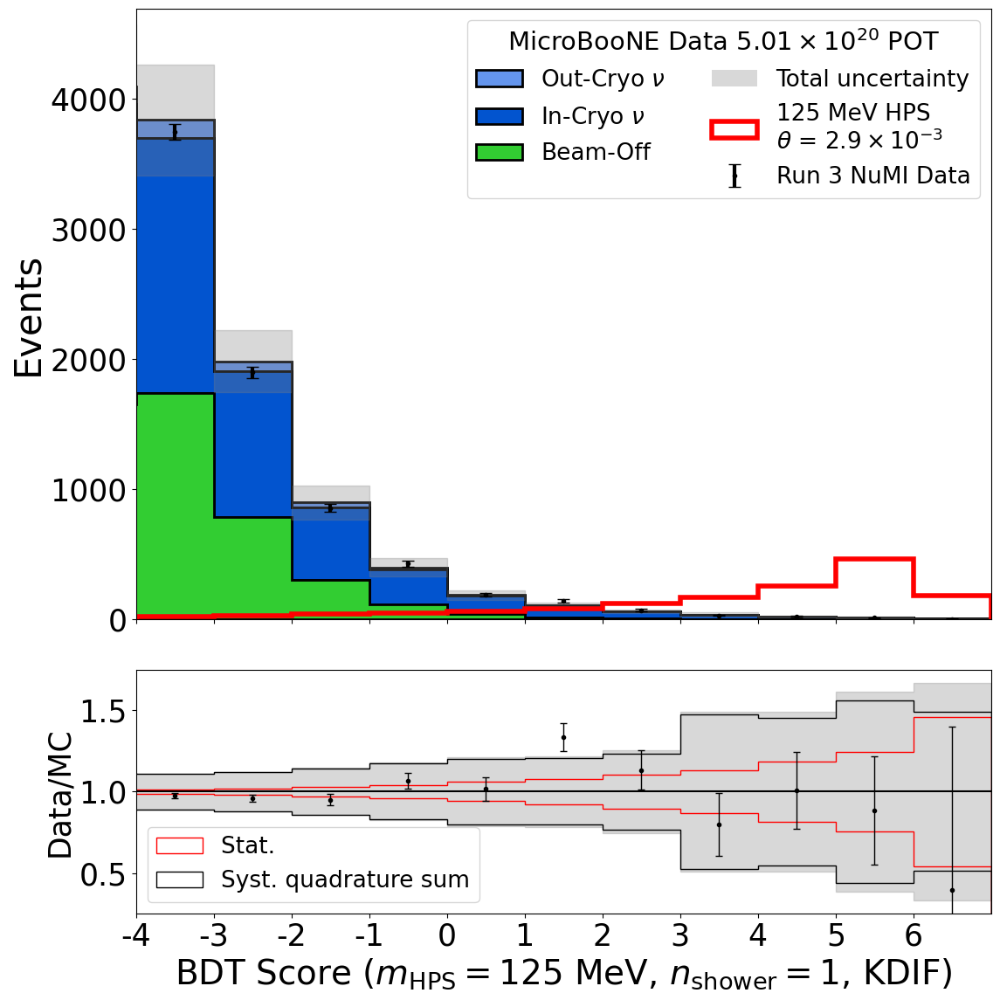

125_1shr_KDAR
HNL scale is 28.379835018301986
10 10 10
Chi square =  3.0071619541631036
Reduced Chi square =  0.3341291060181226


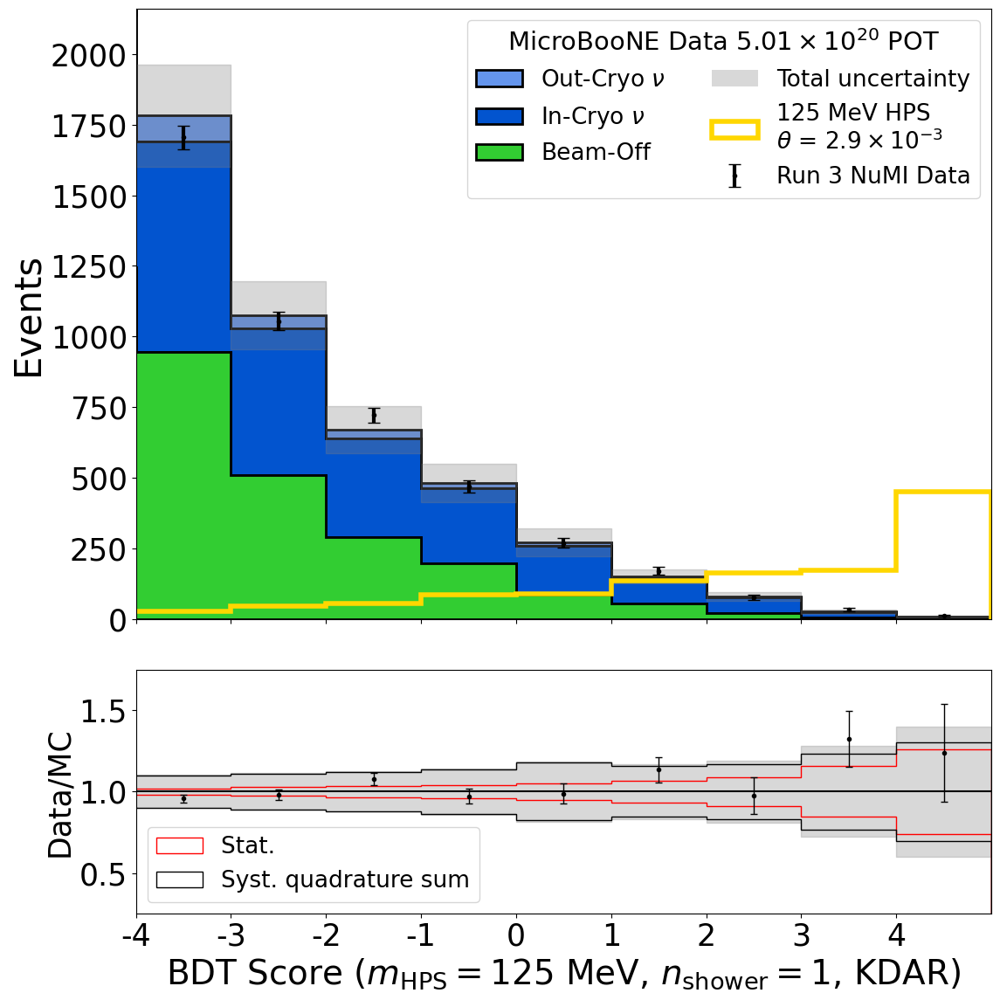

125_2shr_KDIF
HNL scale is 28.379835018301986
10 10 10
Chi square =  3.890363876799138
Reduced Chi square =  0.432262652977682


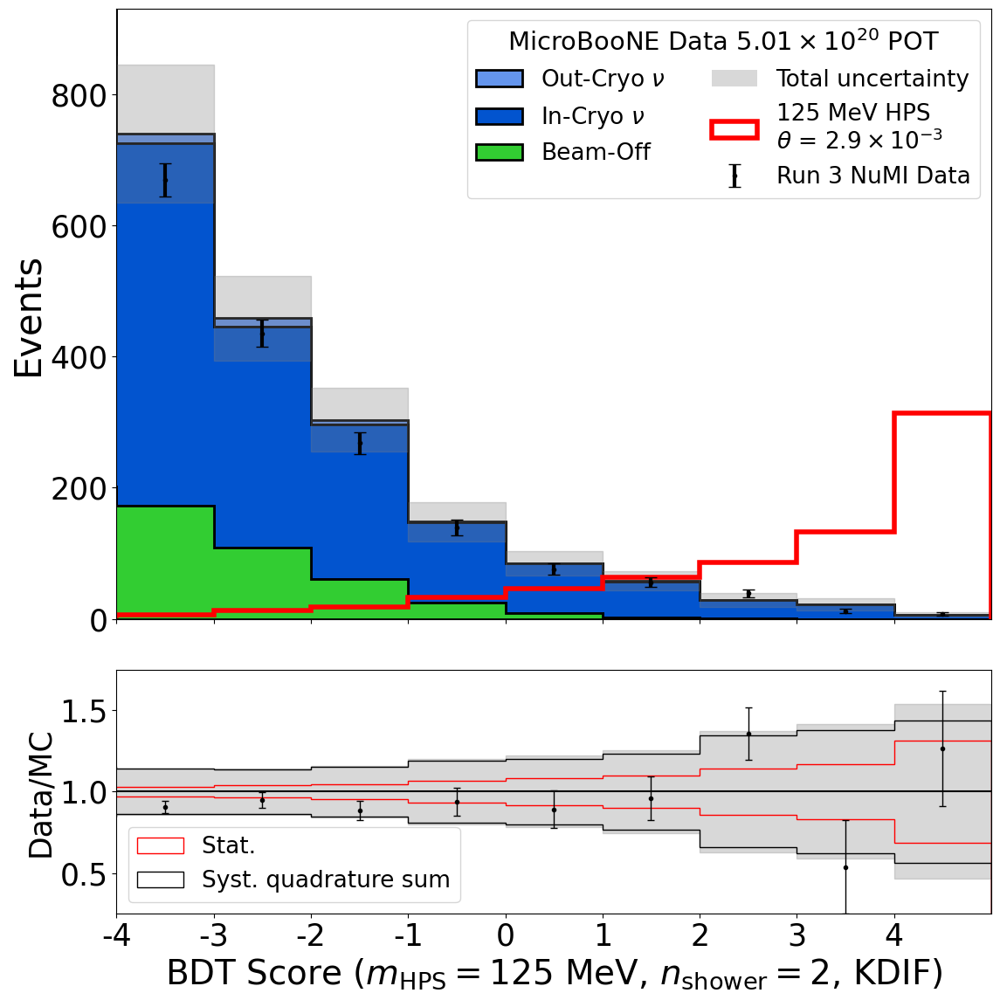

125_2shr_KDAR
HNL scale is 28.379835018301986
10 10 10
Chi square =  6.242578230637609
Reduced Chi square =  0.6936198034041788


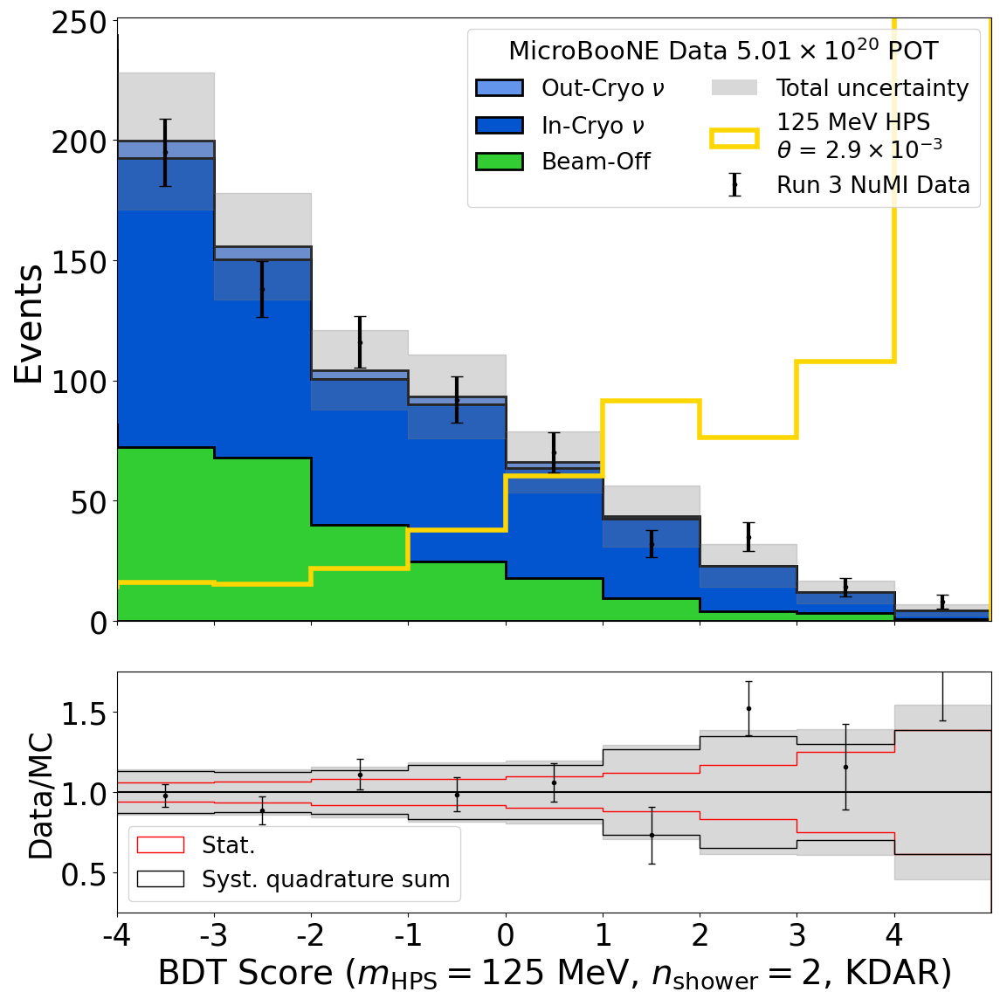

130_1shr_KDIF
HNL scale is 28.162751836253243
10 10 10
Chi square =  1.6456982503728503
Reduced Chi square =  0.18285536115253892


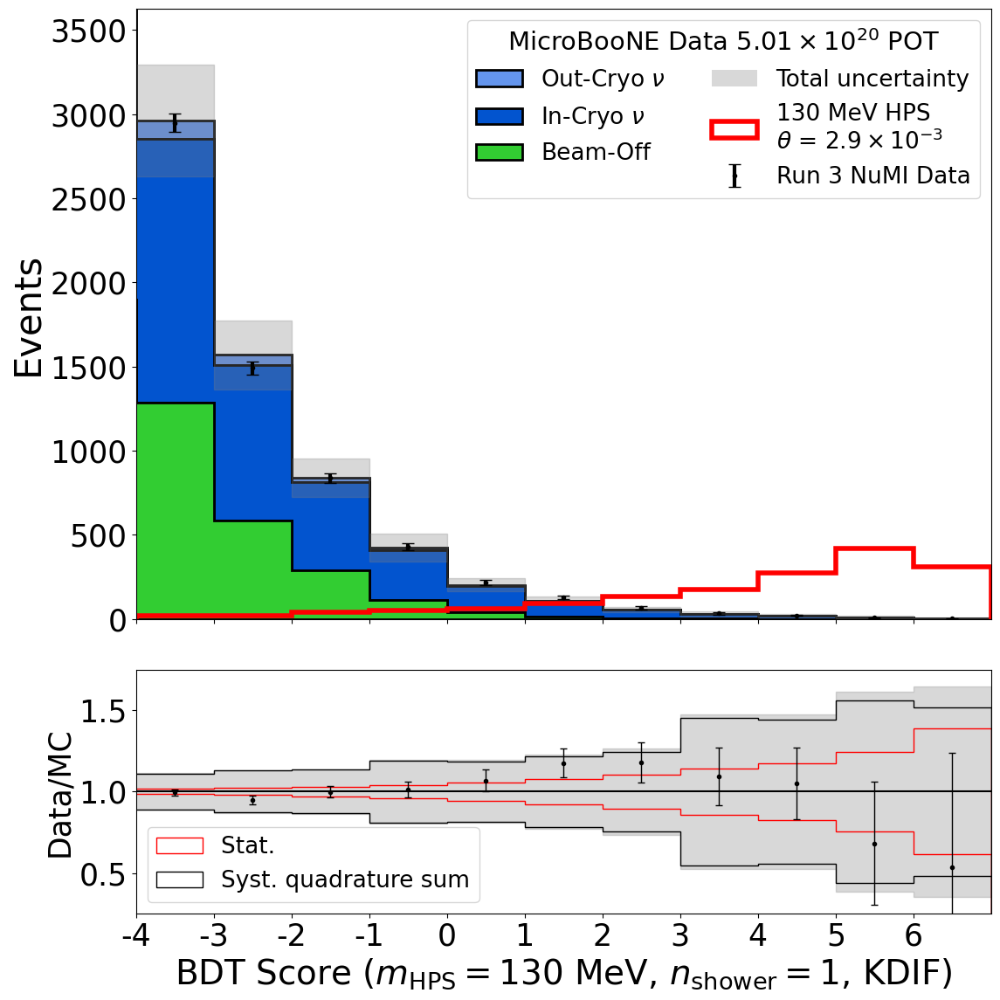

130_1shr_KDAR
HNL scale is 28.162751836253243
10 10 10
Chi square =  0.9252025131529995
Reduced Chi square =  0.10280027923922216


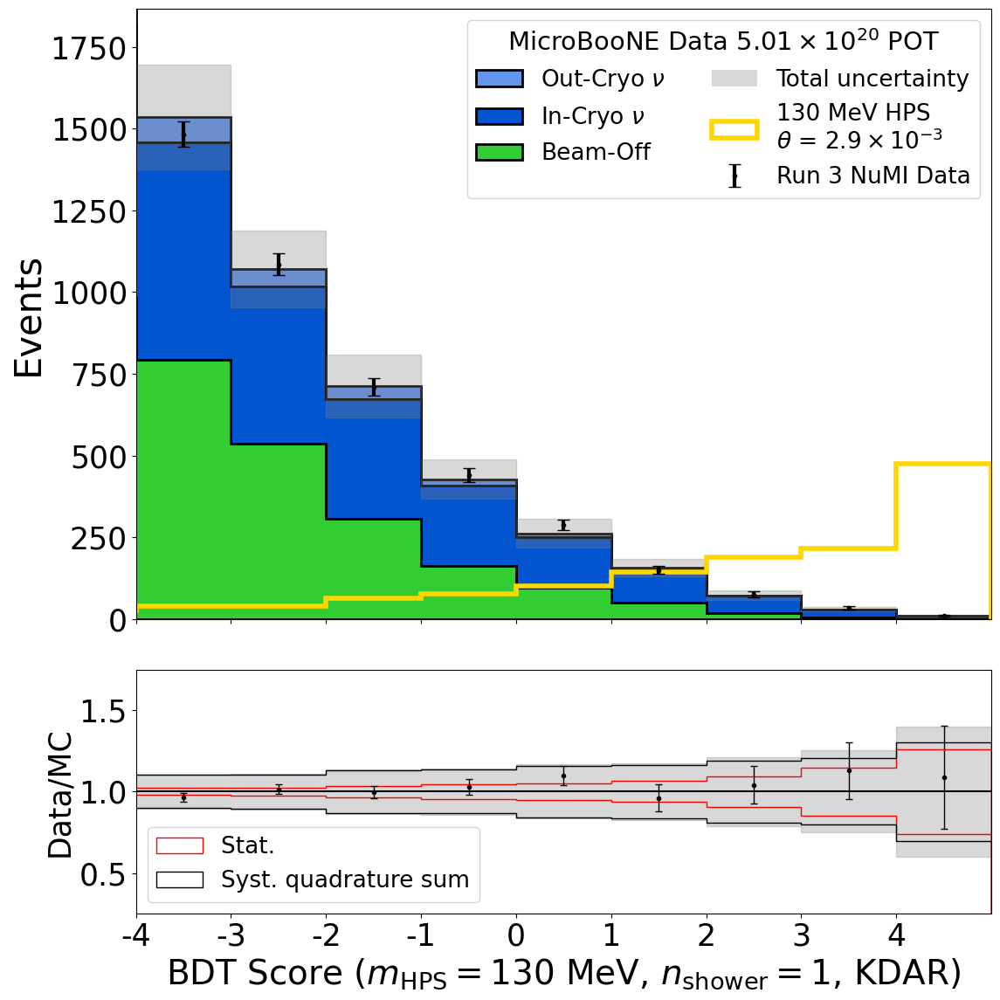

130_2shr_KDIF
HNL scale is 28.162751836253243
10 10 10
Chi square =  2.122502593975162
Reduced Chi square =  0.23583362155279575


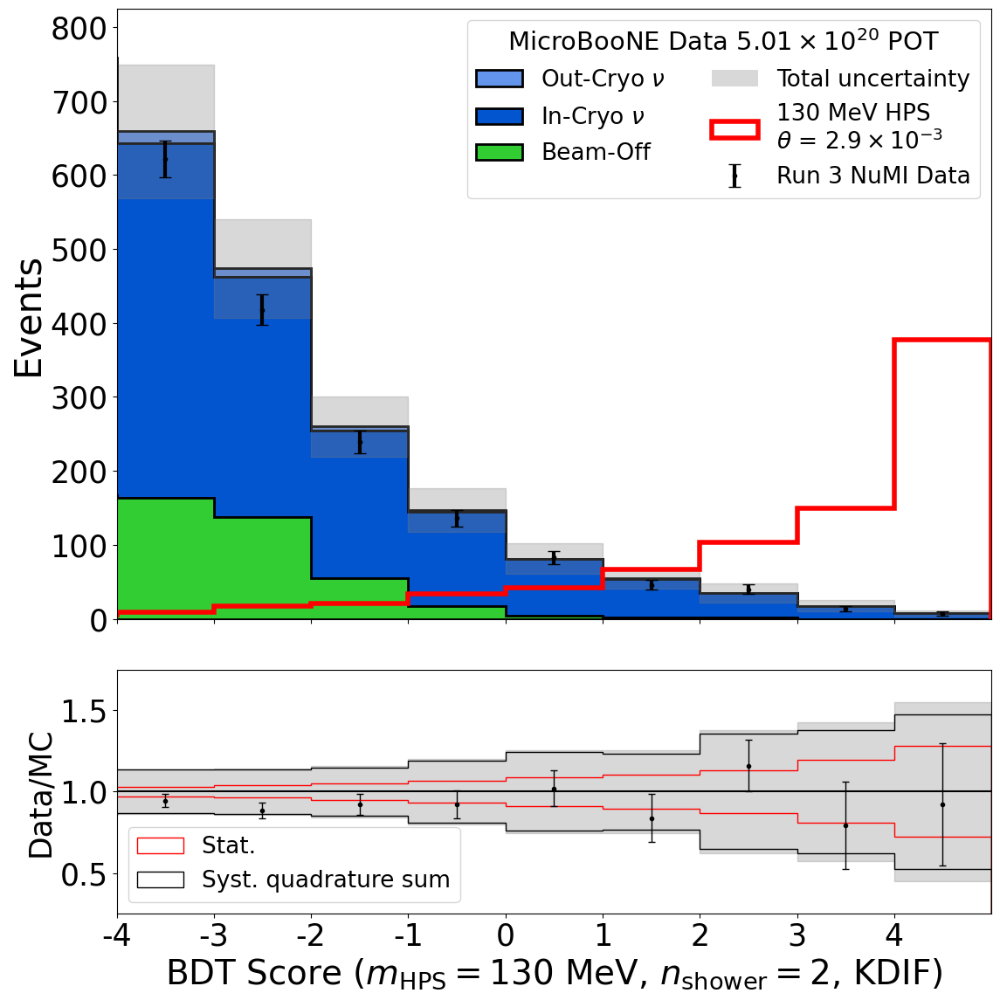

130_2shr_KDAR
HNL scale is 28.162751836253243
10 10 10
Chi square =  4.140778929795444
Reduced Chi square =  0.46008654775504937


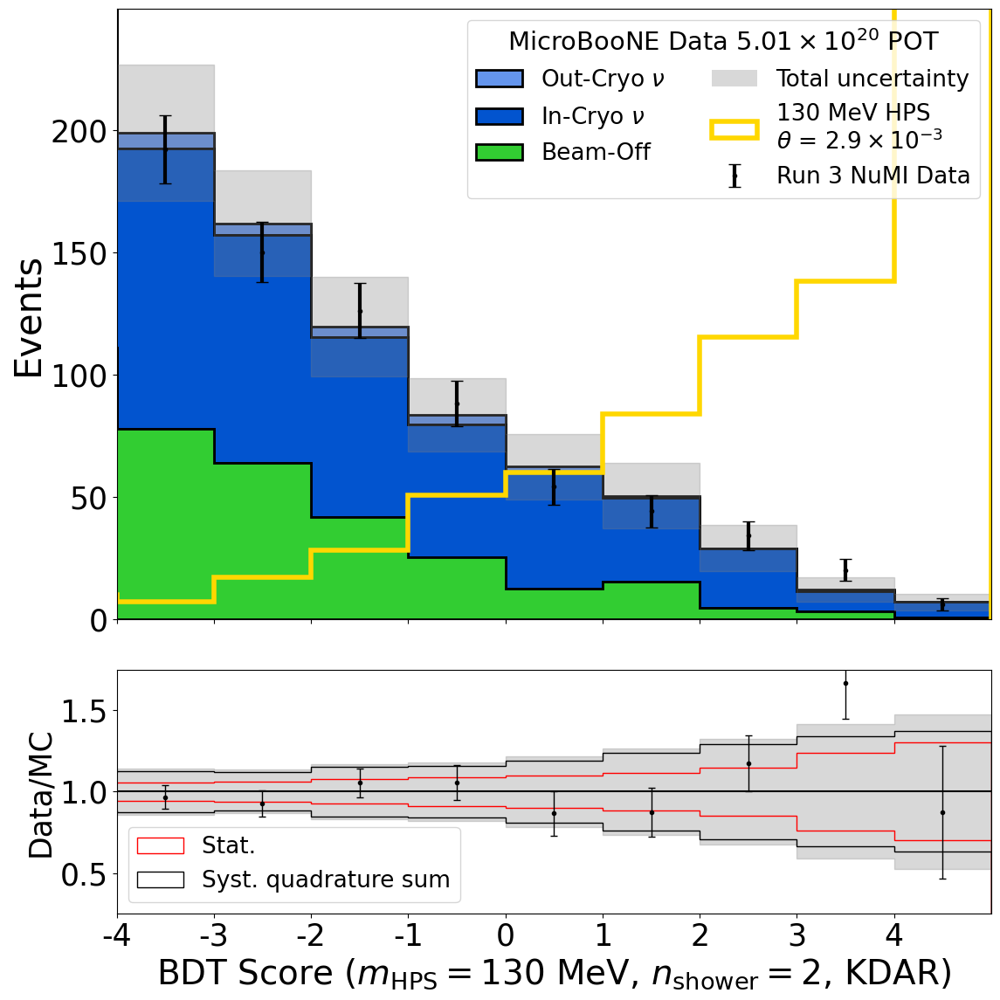

135_1shr_KDIF
HNL scale is 33.0934212370203
10 10 10
Chi square =  3.8106615236081547
Reduced Chi square =  0.4234068359564616


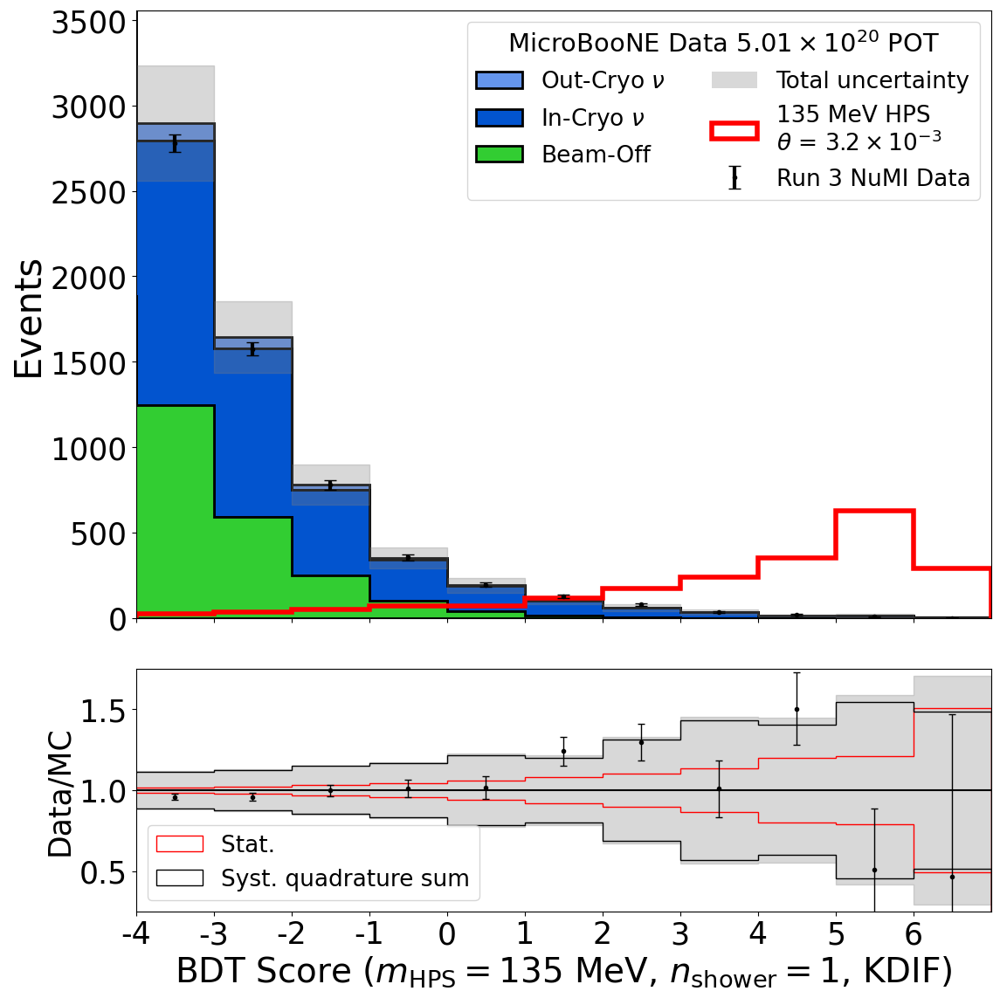

135_1shr_KDAR
HNL scale is 33.0934212370203
10 10 10
Chi square =  2.922774623891695
Reduced Chi square =  0.3247527359879661


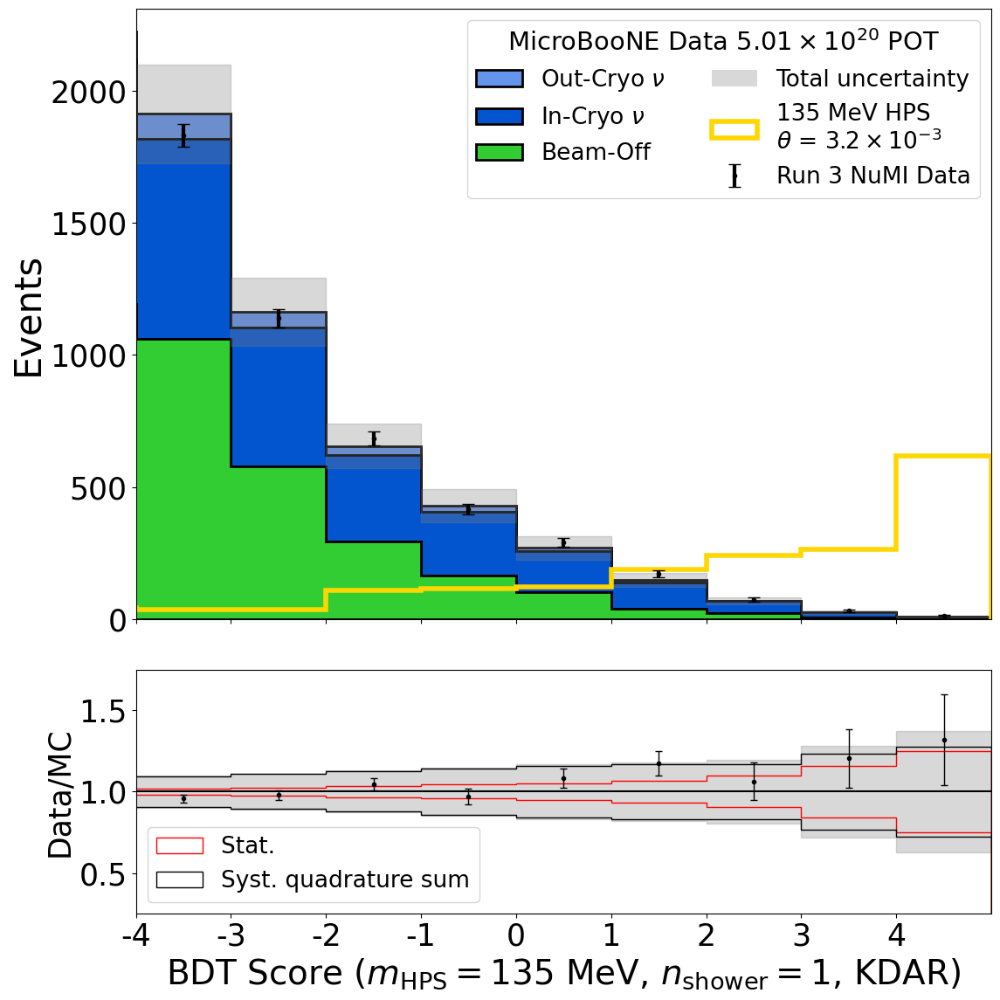

135_2shr_KDIF
HNL scale is 33.0934212370203
10 10 10
Chi square =  1.7311011993229295
Reduced Chi square =  0.19234457770254773


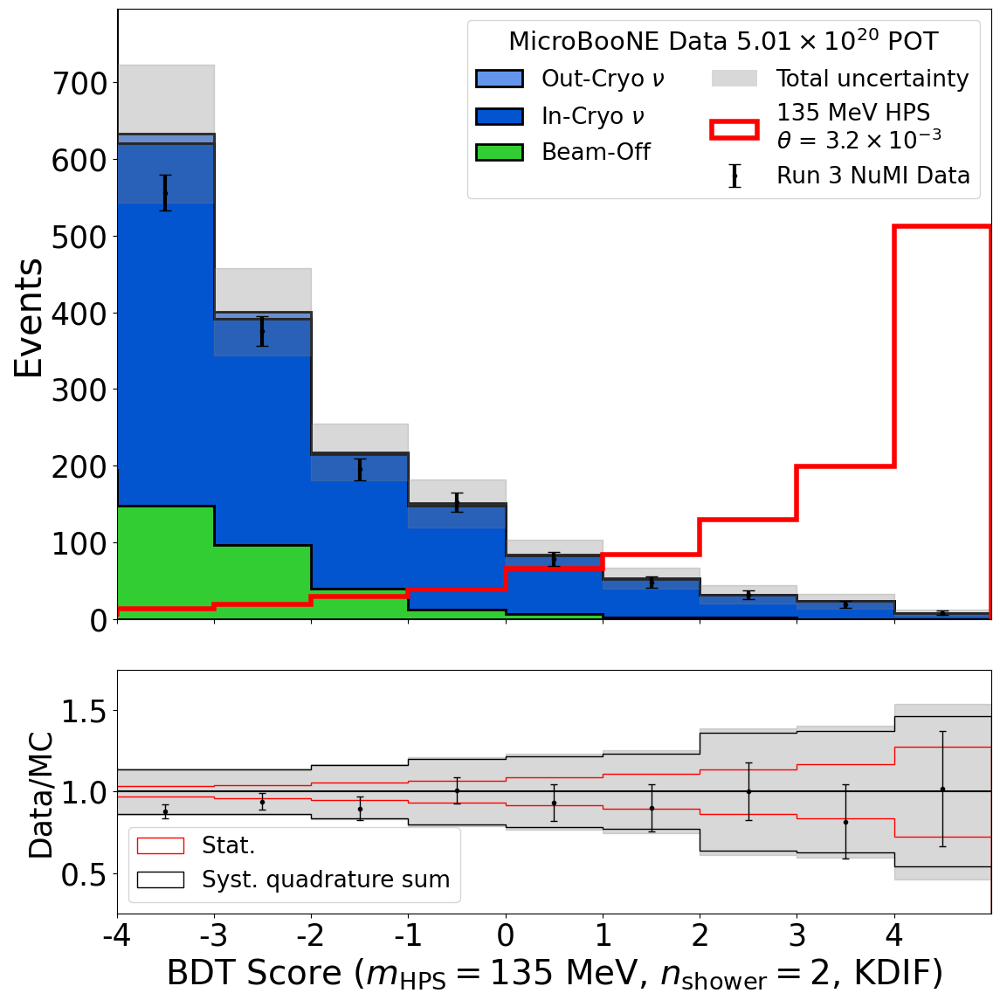

135_2shr_KDAR
HNL scale is 33.0934212370203
10 10 10
Chi square =  3.1077630635739317
Reduced Chi square =  0.3453070070637702


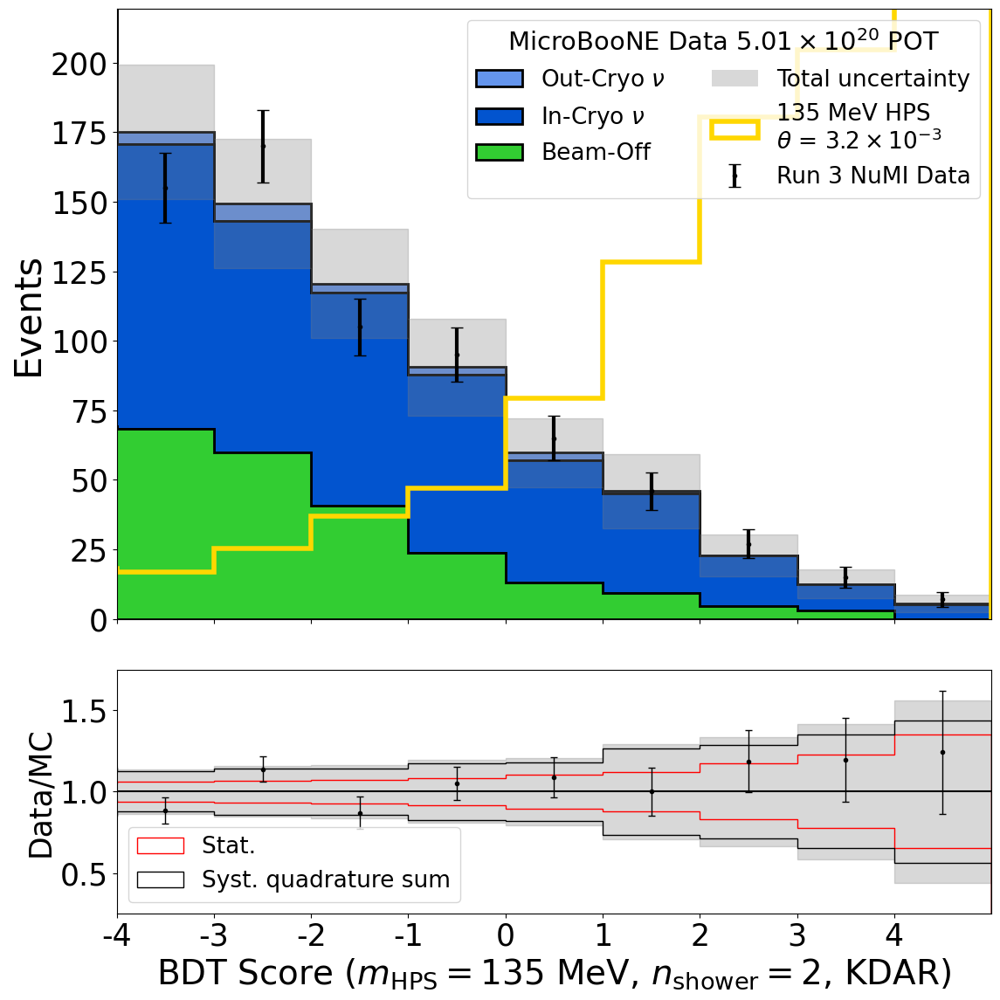

140_1shr_KDIF
HNL scale is 24.557923848397692
10 10 10
Chi square =  3.311474529234263
Reduced Chi square =  0.36794161435936257


/var/folders/wr/yb1fjkjn1mbg644j5v7f2tlm0000gp/T/ipykernel_25420/3279421264.py:191: RuntimeWarning: invalid value encountered in divide
  dat_err=np.sqrt(x1)*np.nan_to_num(x/x1)
/var/folders/wr/yb1fjkjn1mbg644j5v7f2tlm0000gp/T/ipykernel_25420/3279421264.py:241: RuntimeWarning: invalid value encountered in divide
  fracer_data=np.nan_to_num(np.sqrt(x1)/x1)


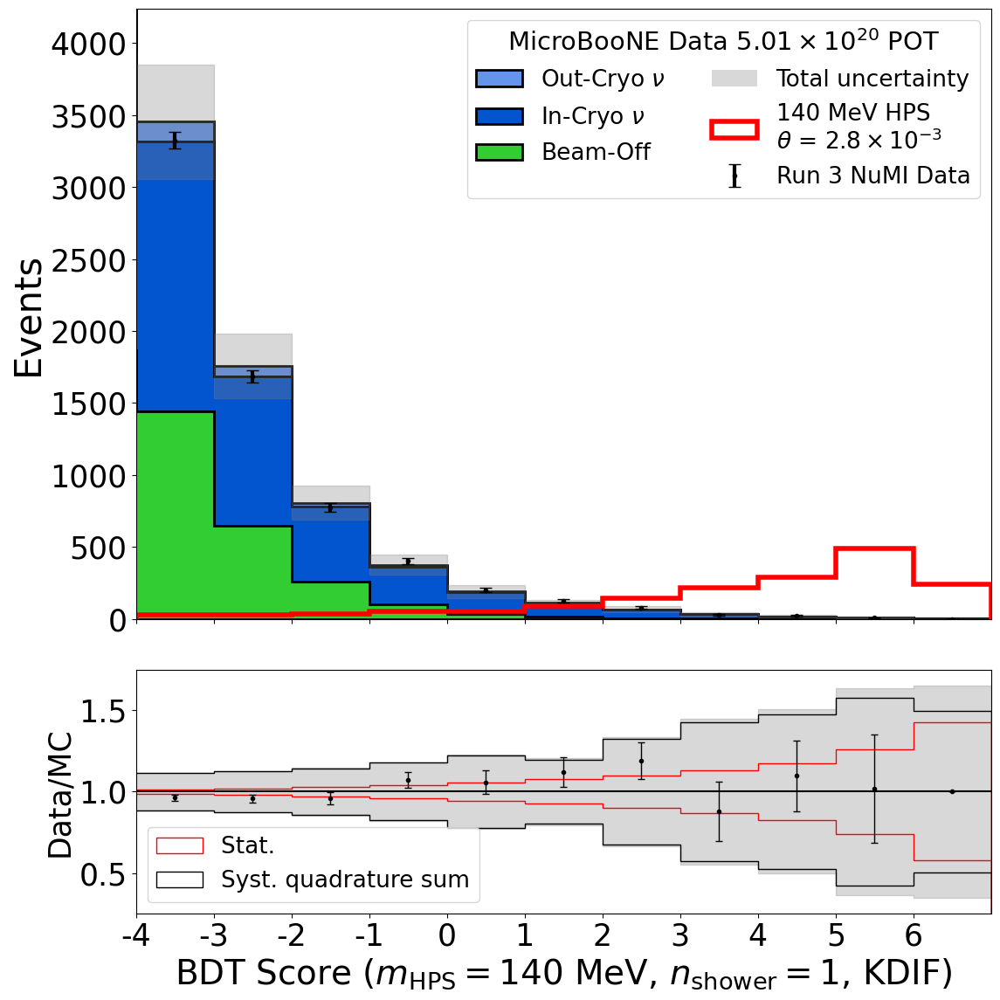

140_1shr_KDAR
HNL scale is 24.557923848397692
10 10 10
Chi square =  2.318506618986116
Reduced Chi square =  0.25761184655401287


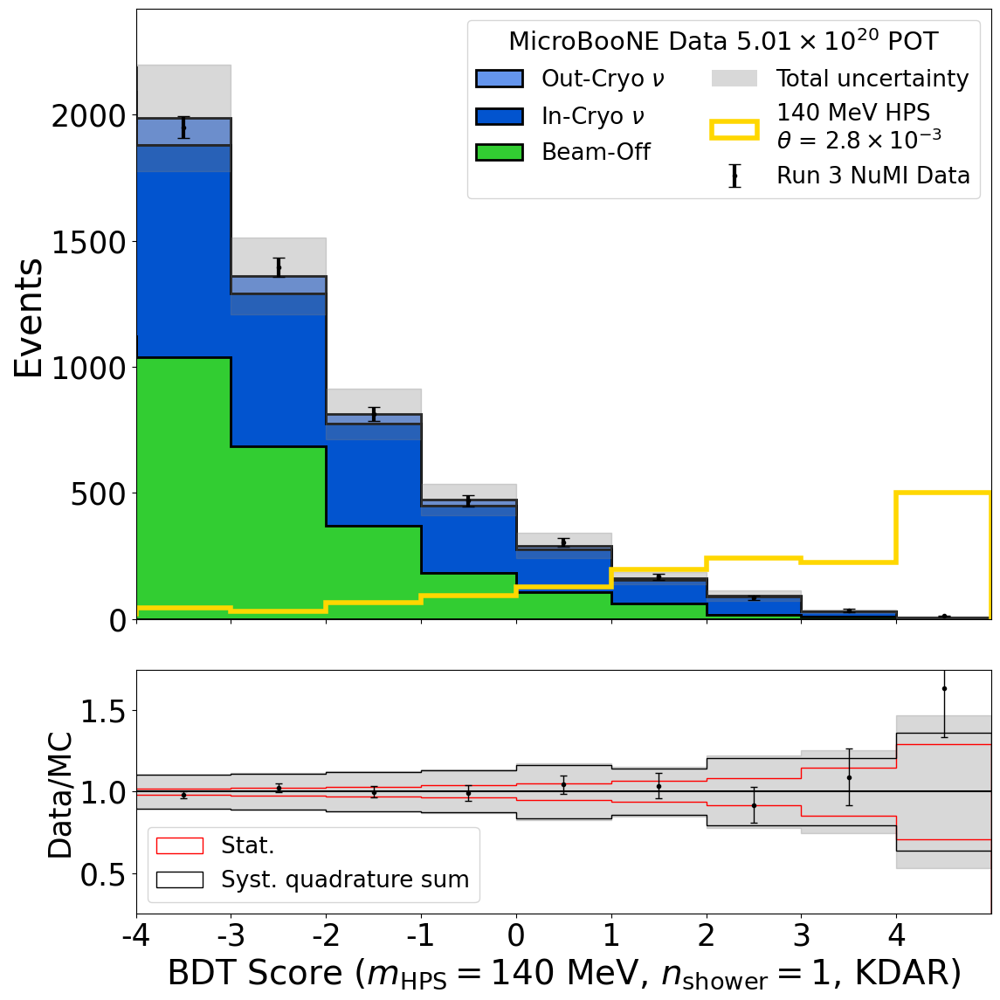

140_2shr_KDIF
HNL scale is 24.557923848397692
10 10 10
Chi square =  2.6716168088149717
Reduced Chi square =  0.2968463120905524


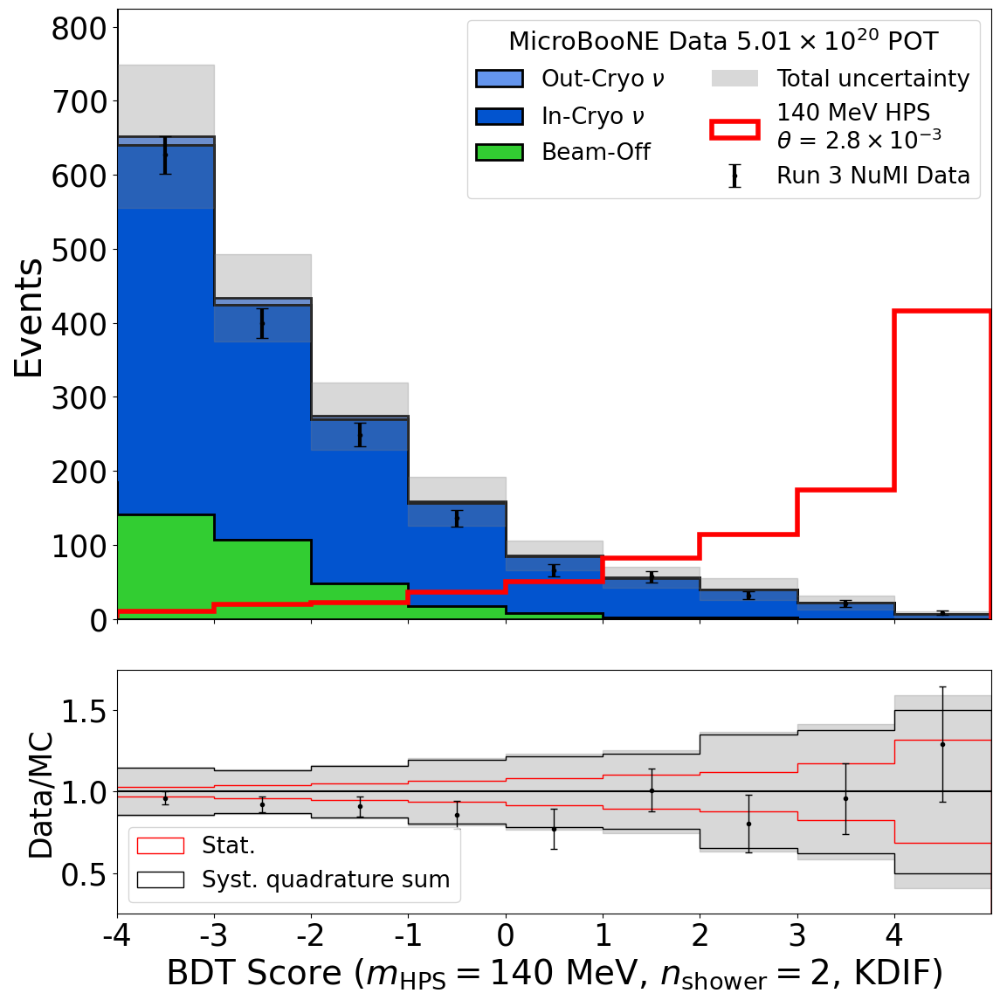

140_2shr_KDAR
HNL scale is 24.557923848397692
10 10 10
Chi square =  5.5013409315653305
Reduced Chi square =  0.6112601035072589


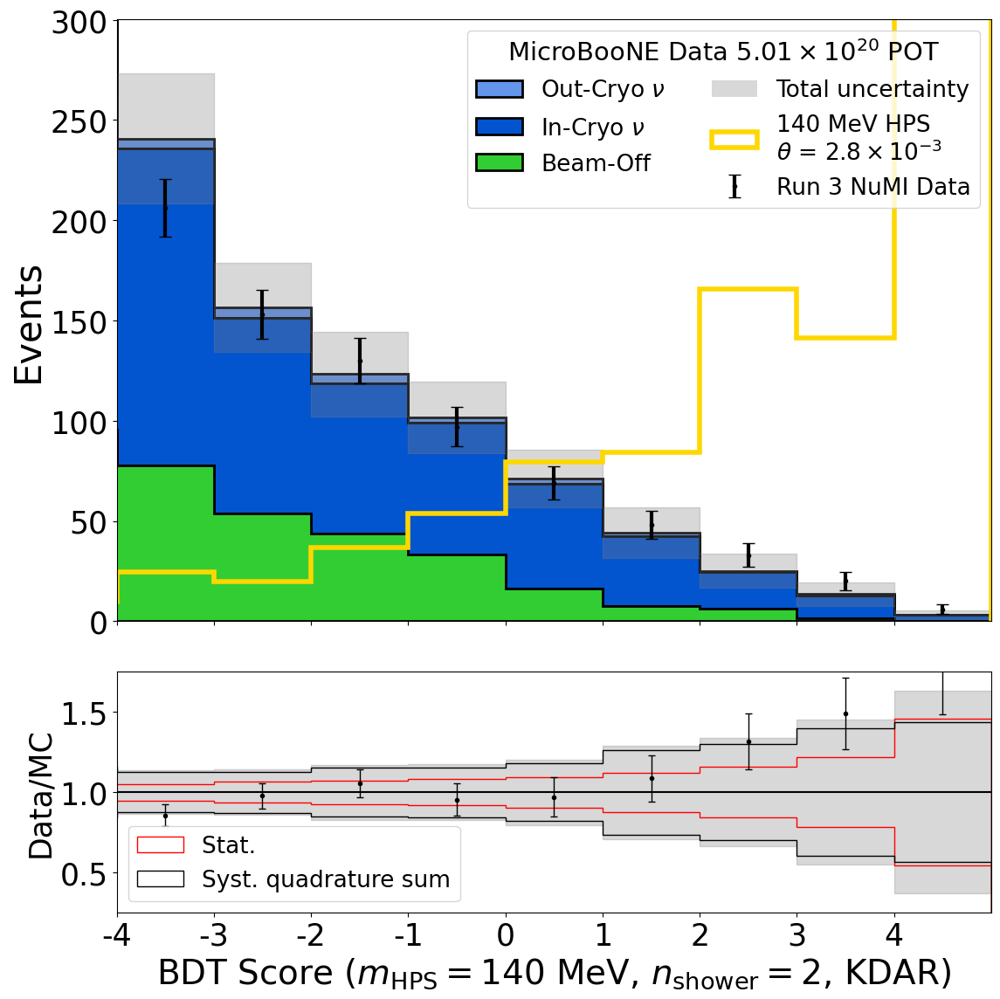

145_1shr_KDIF
HNL scale is 18.910247286354164
10 10 10
Chi square =  2.9303890625774534
Reduced Chi square =  0.32559878473082815


/var/folders/wr/yb1fjkjn1mbg644j5v7f2tlm0000gp/T/ipykernel_25420/3279421264.py:191: RuntimeWarning: invalid value encountered in divide
  dat_err=np.sqrt(x1)*np.nan_to_num(x/x1)
/var/folders/wr/yb1fjkjn1mbg644j5v7f2tlm0000gp/T/ipykernel_25420/3279421264.py:241: RuntimeWarning: invalid value encountered in divide
  fracer_data=np.nan_to_num(np.sqrt(x1)/x1)


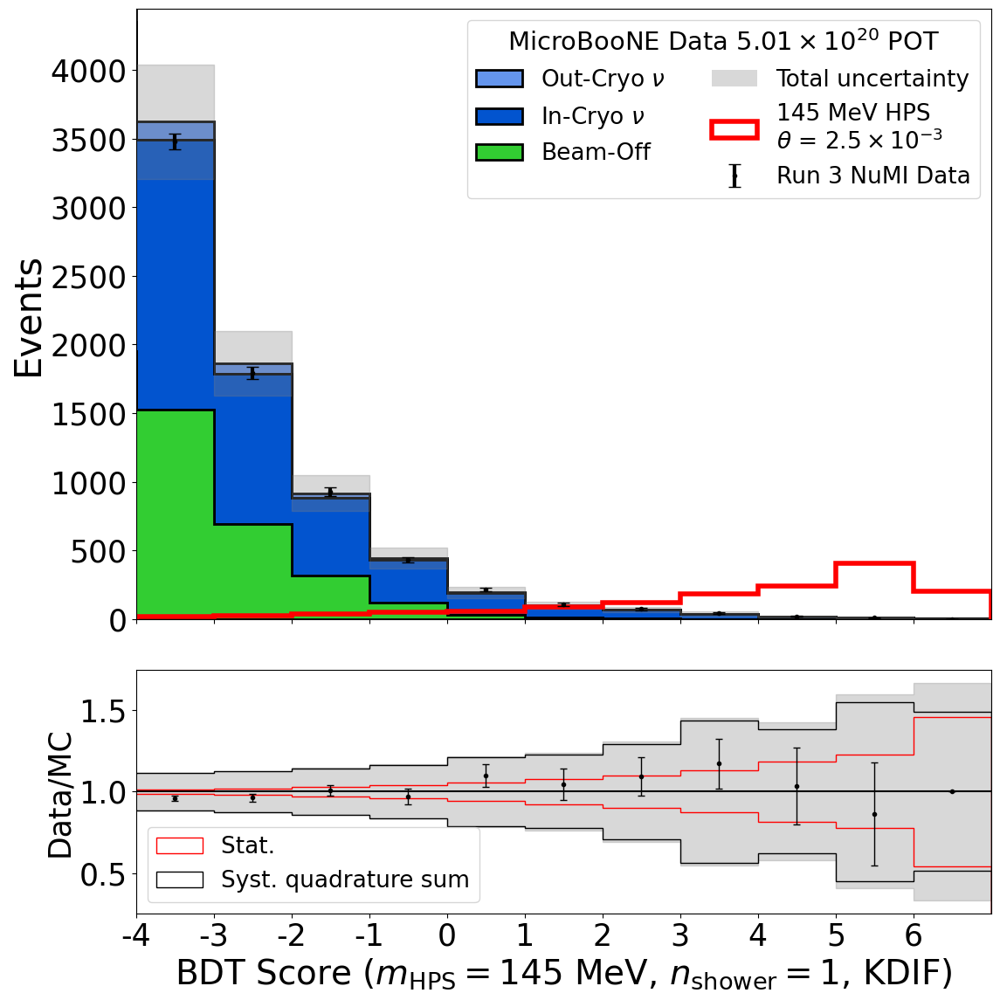

145_1shr_KDAR
HNL scale is 18.910247286354164
10 10 10
Chi square =  0.7050609256997012
Reduced Chi square =  0.07834010285552236


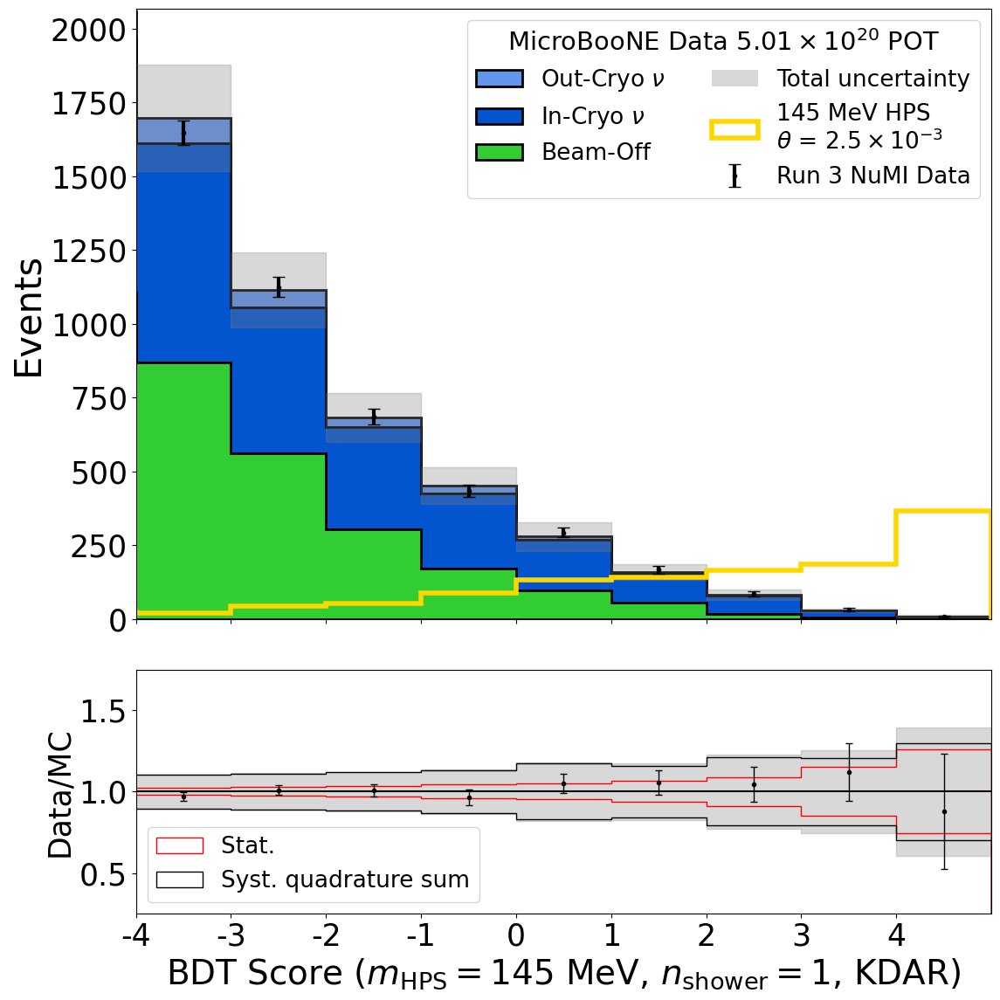

145_2shr_KDIF
HNL scale is 18.910247286354164
10 10 10
Chi square =  3.4841107648336163
Reduced Chi square =  0.38712341831484626


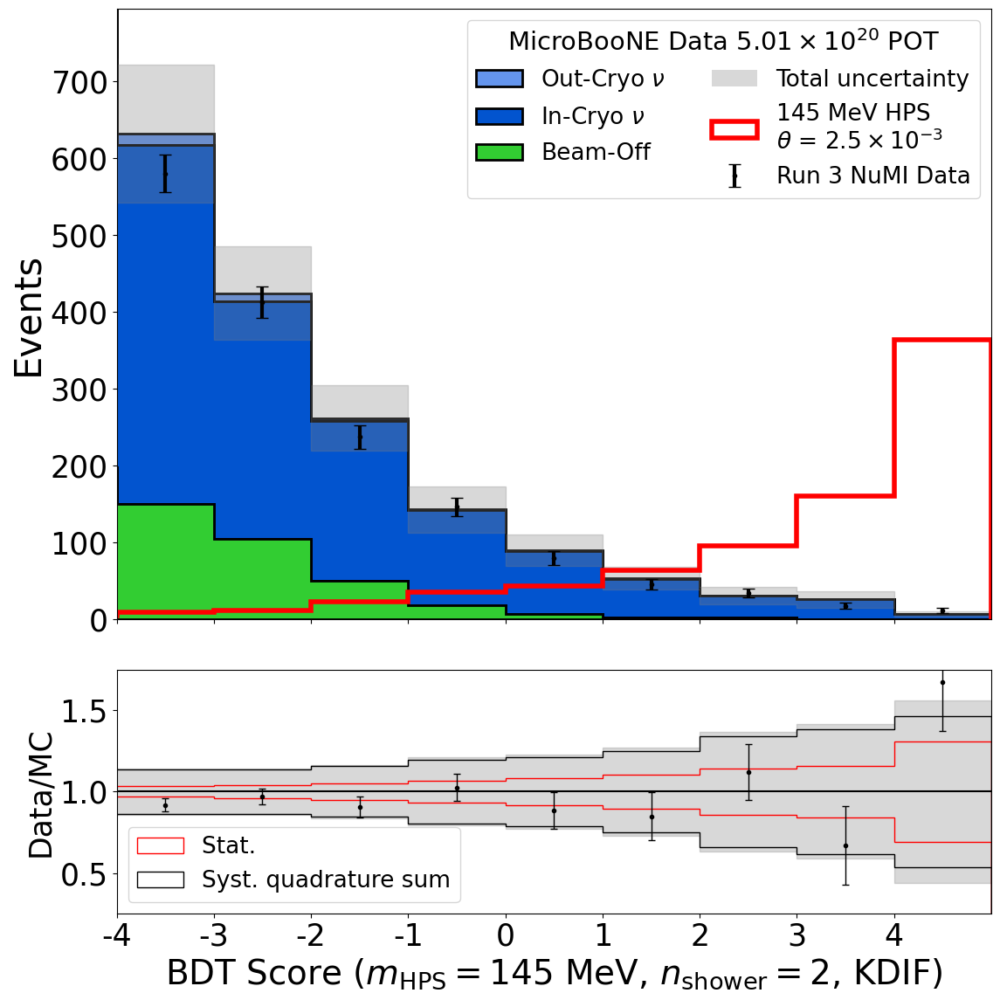

145_2shr_KDAR
HNL scale is 18.910247286354164
10 10 10
Chi square =  3.381765934176865
Reduced Chi square =  0.3757517704640961


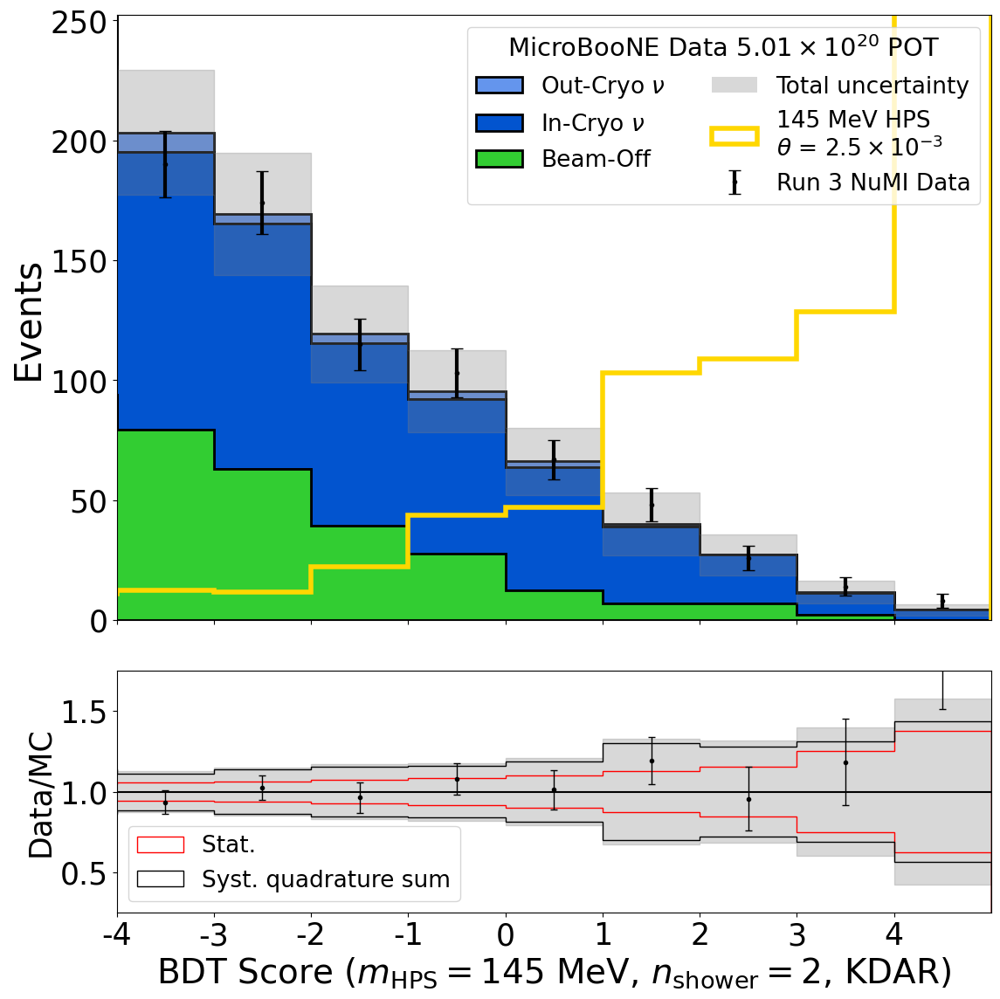

150_1shr_KDIF
HNL scale is 25.614551478855574
10 10 10
Chi square =  4.200978400196513
Reduced Chi square =  0.4667753777996126


/var/folders/wr/yb1fjkjn1mbg644j5v7f2tlm0000gp/T/ipykernel_25420/3279421264.py:191: RuntimeWarning: invalid value encountered in divide
  dat_err=np.sqrt(x1)*np.nan_to_num(x/x1)
/var/folders/wr/yb1fjkjn1mbg644j5v7f2tlm0000gp/T/ipykernel_25420/3279421264.py:241: RuntimeWarning: invalid value encountered in divide
  fracer_data=np.nan_to_num(np.sqrt(x1)/x1)


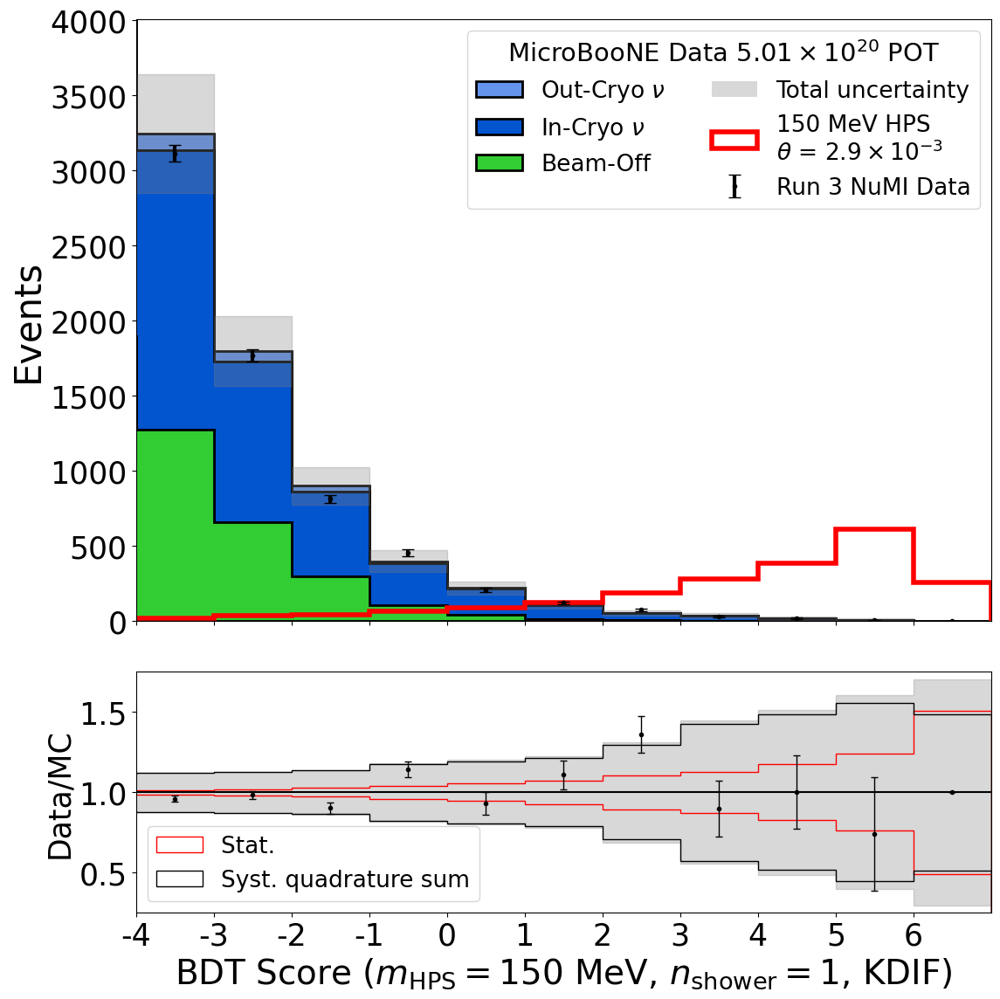

150_1shr_KDAR
HNL scale is 25.614551478855574
10 10 10
Chi square =  1.2020021692060103
Reduced Chi square =  0.1335557965784456


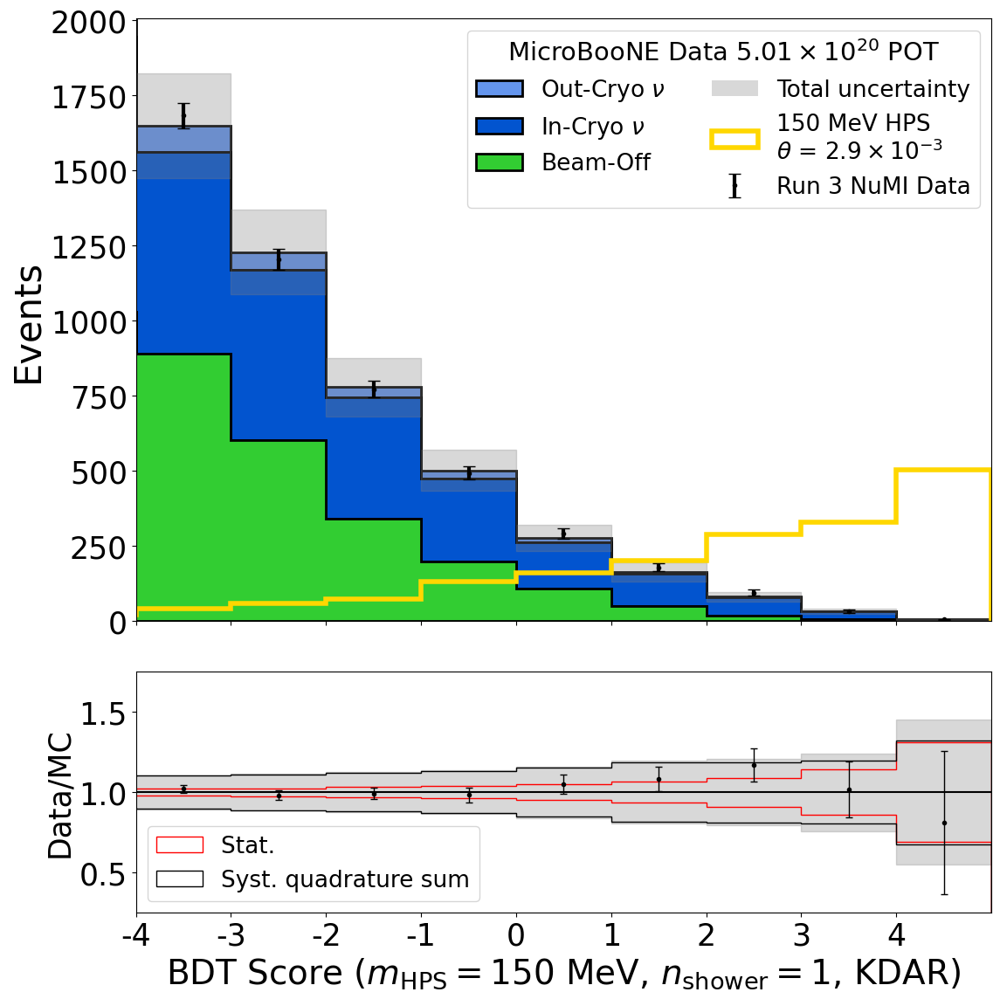

150_2shr_KDIF
HNL scale is 25.614551478855574
10 10 10
Chi square =  1.9868868023027957
Reduced Chi square =  0.22076520025586618
Adapted y axis range in one plot for paper


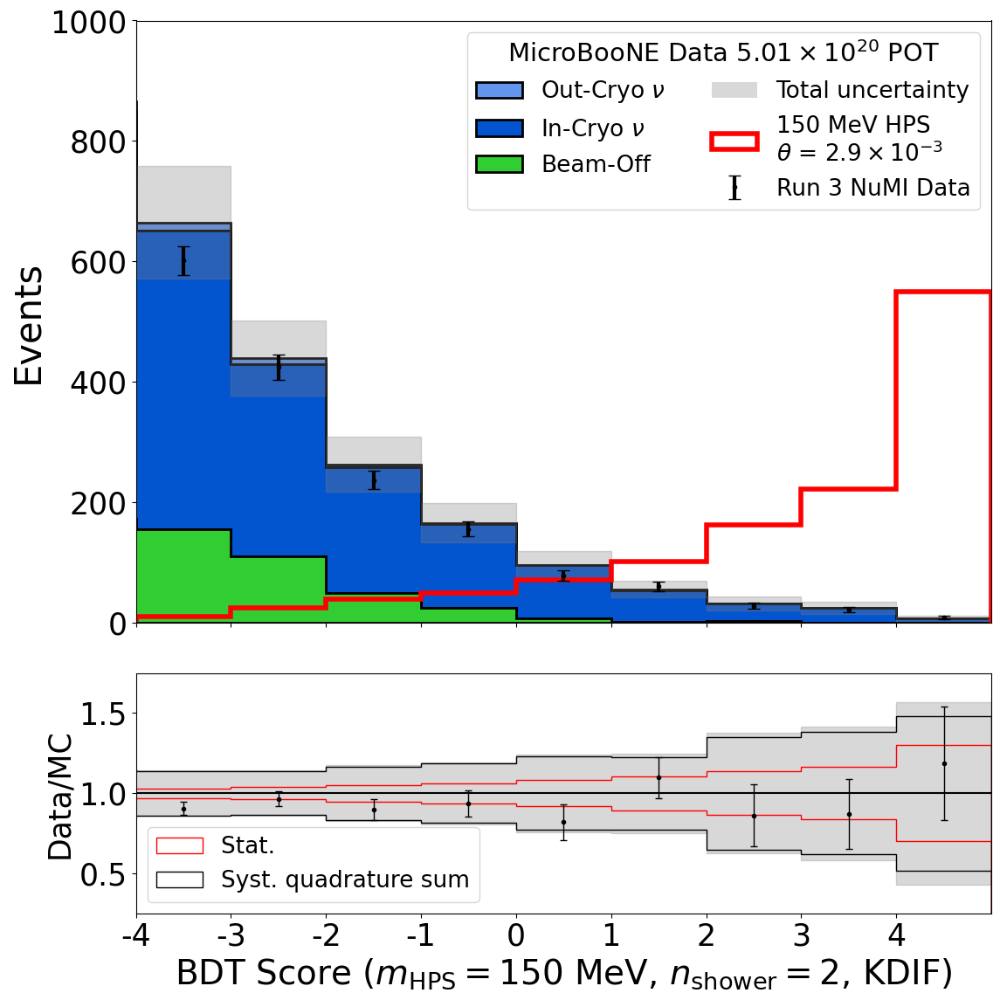

150_2shr_KDAR
HNL scale is 25.614551478855574
10 10 10
Chi square =  4.5838978762562865
Reduced Chi square =  0.5093219862506985
Adapted y axis range in one plot for paper


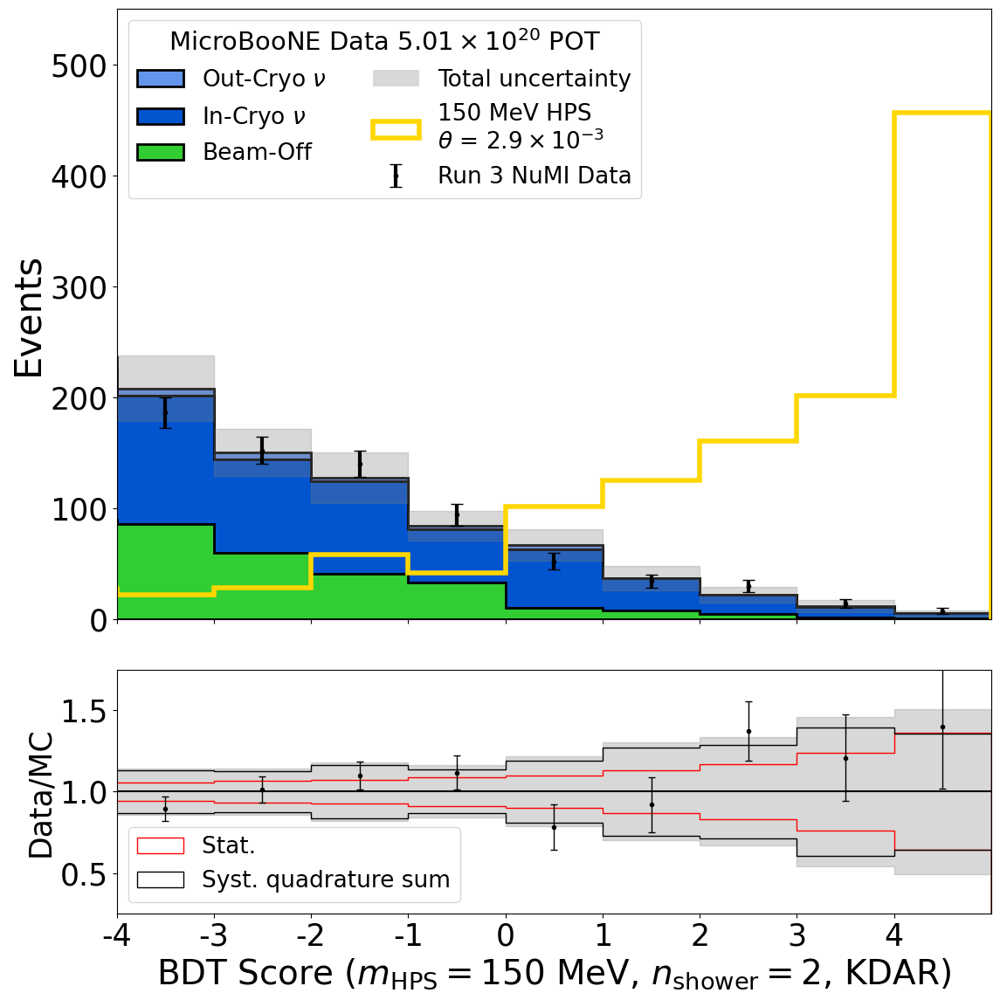

200_1shr_KDIF
HNL scale is 12.324581090746374
10 10 10
Chi square =  2.6806892707941086
Reduced Chi square =  0.2978543634215676


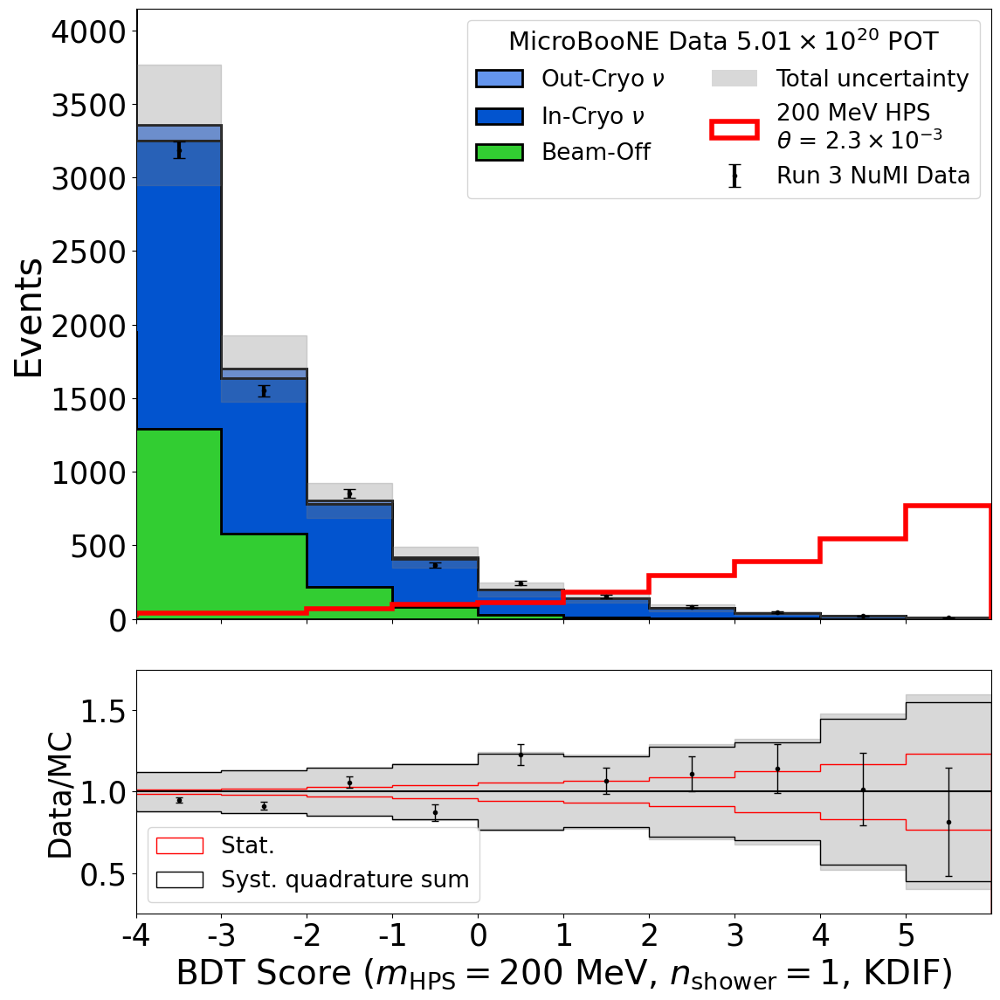

200_1shr_KDAR
HNL scale is 12.324581090746374
10 10 10
Chi square =  3.816684301156816
Reduced Chi square =  0.42407603346186845


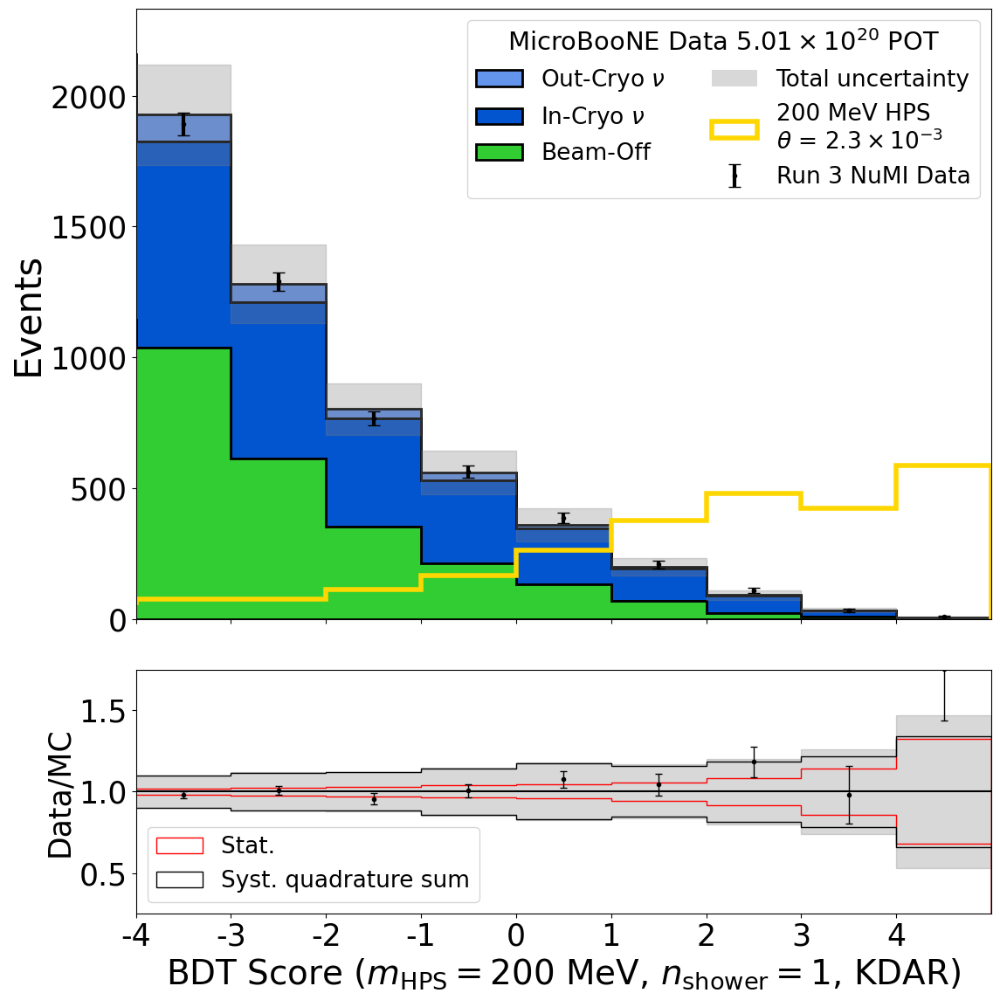

200_2shr_KDIF
HNL scale is 12.324581090746374
10 10 10
Chi square =  2.8508004128150377
Reduced Chi square =  0.3167556014238931


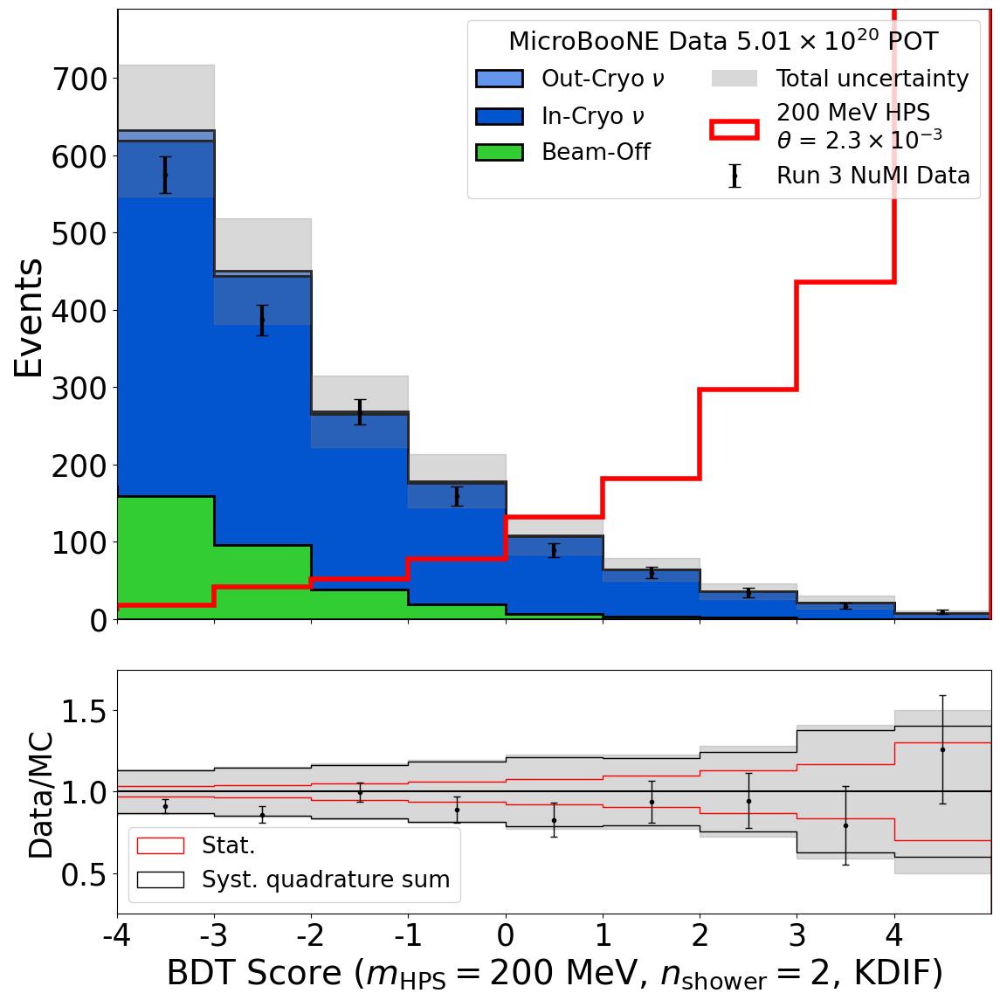

200_2shr_KDAR
HNL scale is 12.324581090746374
10 10 10
Chi square =  2.2628951737544494
Reduced Chi square =  0.2514327970838277


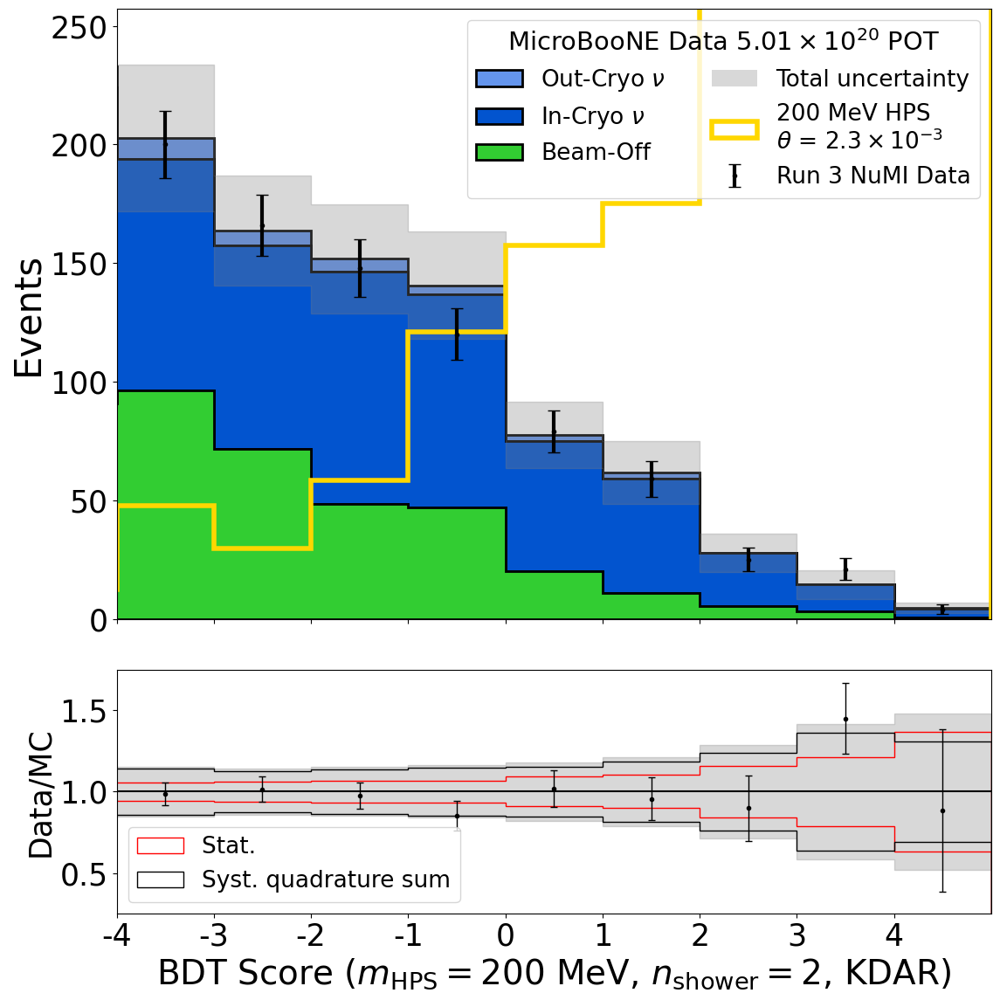

In [38]:
# Run3
plt.rcParams.update({'font.size': 25})
Lo_score = -5.0

adjusted_xlims_r3, xticks_r3 = make_xlims_dict(bins_overflow_r3, lower = -4)


# for key in adjusted_xlims_r3:
#     adjusted_xlims_r3[key][0] = 0

savestr = f"_unstacked"

sample_colours_test = {'overlay':'#0254cf',
                  'dirtoverlay':'cornflowerblue',
                  'beamoff':'limegreen',
                  'signal':'red',
                  'signal_pi0':'gold'}

# titlename = r"MicroBooNE Data" "\n" r"$5.01\times10^{20}$ POT"
titlename = r"MicroBooNE Data $5.01\times10^{20}$ POT"

Plot_BDT_output_systematics_data(signal_dict_r3, tot_uncertainty_dict_r3, bkg_sys_r3, sig_sys_err_r3, bkgs_dict_r3, data_r3, bins_cents_overflow_r3, bins_overflow_r3, 
                                 xlims=adjusted_xlims_r3, xticks=xticks_r3, upper_y=0.75, legloc="upper right", colours = sample_colours_test,
                                 legsize=19, logy=False, savefig=False, save_str=savestr, Run="run3", HNL_scale=new_hist_scaling,
                                 override_sub_ylim=True, subplot_ratio=1.2,show_ev_nums=False,
                                 scale_up=new_hist_scaling, thetas=theta_dict, sig_sys=False, HNL_scale_label=True, stacked=False,
                                 title_name=None, textpos=None, plot_text=titlename, textsize=18, ncols=2, plot_stat_sys=True, get_chi2=True)


## Rewriting plotting functions for reweighted data

Functions have been copied from above, with the savefile location changed to prevent over-writing of data.

In [30]:

def make_overflow_bin(bins_dict, bins_cents_dict):
    """
    For making the final "overflow" bin the same size as the previous bins, i.e one integer in width.
    """
    bins_overflow, bins_cent_overflow = {}, {}
    for HNL_mass in bins_dict:
        overflow_bin = bins_cents_dict[HNL_mass][-2]+1 #Just adding one to the penultimate bin centre val. 
        bins_cent_overflow[HNL_mass] = bins_cents_dict[HNL_mass].copy()
        bins_cent_overflow[HNL_mass][-1] = overflow_bin
        bins_overflow[HNL_mass] = bins_dict[HNL_mass].copy()
        bins_overflow[HNL_mass][-1] = bins_dict[HNL_mass][-2]+1 #Just adding one to the penultimate bin end val. 
    return bins_overflow, bins_cent_overflow

def make_xlims_dict(bins_dict, lower = None):
    """
    Making a dict of xlims for plotting several mass points at once.
    Also returns a dict of xticks for the purpose of indicating the overflow.
    """
    xlims_adjusted, xticks_adjusted = {}, {}
    for HNL_mass in bins_dict:
        if isinstance(lower,(int, float)): lower_val = lower
        else: lower_val = bins_dict[HNL_mass][0]
        xlims_adjusted[HNL_mass] = [lower_val,bins_dict[HNL_mass][-1]]
        ticks = np.arange(bins_dict[HNL_mass][0], bins_dict[HNL_mass][-1], 1)
        ticks_strings = []
        for val in ticks:
            ticks_strings.append(str(int(val)))
        ticks_strings[-1] = str(ticks_strings[-1])+"+"
        xticks_adjusted[HNL_mass] = ticks_strings
        
    return xlims_adjusted, xticks_adjusted

def Plot_BDT_RW_output_systematics_data(signal={}, tot_uncertainty_dict={}, sys_uncertainty_dict={}, sig_unc={}, bkgs={}, data={}, bins_cent_dict={}, bins_dict={},
                                     colours={}, ALPHA=1.0, xlims=[], xticks=[], upper_y=[],
                                     figsize=[12,10], density=False, legloc="upper right",legsize=22,
                                     logy=False, savefig=False, save_str="", Run="_", HNL_scale=1.0,scale_up=[], thetas=[], c_phis=[], order=[], 
                                     sig_sys=False, HNL_scale_label=False, stacked=False, title_name=None, textpos=None, textsize=None,
                                     plot_text=None, ncols=1, plot_stat_sys=False, show_ev_nums=True):
    """
    This should take the histograms which have already been binned and scaled and plot the total uncertainties on bkg.
    Therefore it will display what is being fed into the limit setting software. INCLUDING the data.
    """
    if(isinstance(HNL_scale, float)): print("Scaling by a single number for all")
    if(isinstance(HNL_scale, dict)): print("Scaling each mass point individually")
    if(signal=={}): raise Exception("Specify HNL sample masses")
    if(bkgs=={}): raise Exception("Specify background samples")
    if(data=={}): raise Exception("Specify data sample")
    if(bins_cent_dict=={}): raise Exception("Specify bin centres")
    if(bins_dict=={}): raise Exception("Specify bins")
    if(colours=={}): colours = {'overlay':'#0254cf',
                                'dirtoverlay':'cornflowerblue',
                                'beamoff':'limegreen',
                                'signal':'red',
                                'signal_pi0':'gold'}
    if(order==[]): order = ["beamoff","overlay","dirtoverlay"] #From bottom to top in stack
    if(thetas==[]): print("Haven't entered thetas, can't calculate scalings") 
    
    if logy == True: logscale="log"
    elif logy == False: logscale="linear"
        
    savefig = input("Do you want to save the BDT score plots? y/n")
    
    for HNL_mass in signal.keys():
        
        mass_label = HNL_mass.split("_")[0]
        nshr_label = HNL_mass.split("_")[1]
        nshr_label = nshr_label[0]
        K_label = HNL_mass.split("_")[2]
        
        fig,ax = plt.subplots(nrows=2, ncols=1, sharex=True, gridspec_kw={'height_ratios': [3, 1]}, figsize=figsize,dpi=100)
        
        if xlims==[]: xlims_plot=[bins_dict[HNL_mass][0],bins_dict[HNL_mass][-1]]
        elif(isinstance(xlims, dict)): xlims_plot = xlims[HNL_mass]
        else: xlims_plot=xlims
        
        #----primary plot----#
        plt.sca(ax[0])
        
        if isinstance(title_name, str): plt.title(title_name, fontsize=24)
        
        if(isinstance(HNL_scale, dict)):
            HNL_scaling=HNL_scale[HNL_mass]
        else: HNL_scaling = HNL_scale
        print("HNL scale is " + str(HNL_scaling))
        
        bins_cents=[bins_cent_dict[HNL_mass], bins_cent_dict[HNL_mass], bins_cent_dict[HNL_mass]]
        
        if HNL_scale_label==False: HNL_label = f"{mass_label} MeV ALP"
        if HNL_scale_label==True: 
            c_phi = c_phis[HNL_mass]
            c_phi_label = sci_notation(c_phi, decimal_digits=1)
            HNL_label = f"{mass_label} MeV ALP \n" + r"$c_{\phi}$ = " + c_phi_label
        
        labels_sample = {'overlay':fr"In-Cryo $\nu$",
                         'dirtoverlay':fr"Out-Cryo $\nu$",
                         'beamoff':f"Beam-Off",
                         'signal':HNL_label}

        bkg_scores, bkg_colors, labels = [], [], []
        for sample in order:
            bkg_scores.append(bkgs[sample][HNL_mass])
            bkg_colors.append(colours[sample])
            labels.append(labels_sample[sample])
        
        hist_placeholder = np.histogram(bins_cents, weights=bkg_scores, range=xlims_plot)[0] #Just for calculating ylims
        
        hist_full_placeholder = np.histogram(bins_cents, weights=bkg_scores, bins=bins_dict[HNL_mass])[0] #For making the error bars
        numbins = len(np.where( bins_cent_dict[HNL_mass] > xlims_plot[0] )[0])+1 #Getting the number of bins that will be plotted with the given xlims range
        
        tot_uncrt = tot_uncertainty_dict[HNL_mass]
        sys_uncrt = sys_uncertainty_dict[HNL_mass]
        upvals_placeholder = hist_full_placeholder+tot_uncrt
        lowvals_placeholder = hist_full_placeholder-tot_uncrt
        upvals = np.append(upvals_placeholder, [0])
        lowvals = np.append(lowvals_placeholder, [0])
        
        stat_uncrt = np.sqrt(tot_uncrt**2-sys_uncrt**2)
        
        dat_val=data[HNL_mass]

        maxy = max(upvals[-numbins:])
        
        ov_placeholder = np.histogram(bins_cents[0], weights=bkgs['overlay'][HNL_mass], range=xlims_plot)[0] 
        dirt_placeholder = np.histogram(bins_cents[0], weights=bkgs['dirtoverlay'][HNL_mass], range=xlims_plot)[0] 
        beamoff_placeholder = np.histogram(bins_cents[0], weights=bkgs['beamoff'][HNL_mass], range=xlims_plot)[0] 
        sig_placeholder = np.histogram(bins_cents[0], weights=signal[HNL_mass]*HNL_scaling, range=xlims_plot)[0] 
        dat_placeholder =np.histogram(bins_cent_dict[HNL_mass],weights=dat_val, range=xlims_plot)[0]
        
        full_ov = np.histogram(bins_cents[0], weights=bkgs['overlay'][HNL_mass], bins=bins_dict[HNL_mass])[0]
        full_dirt = np.histogram(bins_cents[0], weights=bkgs['dirtoverlay'][HNL_mass], bins=bins_dict[HNL_mass])[0]
        full_beamoff = np.histogram(bins_cents[0], weights=bkgs['beamoff'][HNL_mass], bins=bins_dict[HNL_mass])[0]
        full_data = np.histogram(bins_cent_dict[HNL_mass],weights=dat_val, bins=bins_dict[HNL_mass])[0]
        
        Datanum=dat_placeholder.sum()
        Offbeamnum=sum(beamoff_placeholder)
        Dirtnum=sum(dirt_placeholder)
        Overlaynum=sum(ov_placeholder) 
        HNL_num=sum(sig_placeholder)

        if show_ev_nums==True:
            labels_sample = {'overlay':fr"In-Cryo $\nu$ ({Overlaynum:.1f})",
                             'dirtoverlay':fr"Out-Cryo $\nu$ ({Dirtnum:.1f})",
                             'beamoff':f"Beam-Off ({Offbeamnum:.1f})",
                             'signal':f"{HNL_label} ({HNL_num:.1f})"}

            sig_label = [HNL_label+f"({HNL_num:.1f})"] #HNL_label
            data_label = f"{Run} NuMI Data ({Datanum:.0f})"

        labels=[]
        for sample in order:
            labels.append(labels_sample[sample])

        plot=plt.hist(bins_cents,
                      label=labels,
                      bins=bins_dict[HNL_mass],
                      histtype="stepfilled",
                      stacked=True,linewidth=2,edgecolor="black",
                      weights=bkg_scores, color=bkg_colors, alpha=ALPHA)
            
        plt.fill_between(bins_dict[HNL_mass], lowvals, upvals, step="post",color="grey",alpha=0.3,zorder=2)
        
        sig_placeholder = np.histogram(bins_cent_dict[HNL_mass], weights=signal[HNL_mass]*HNL_scaling, bins=bins_dict[HNL_mass])[0] #For making the error bars
        sig_down_placeholder = sig_placeholder-sig_unc[HNL_mass]*HNL_scaling
        sig_up_placeholder = sig_placeholder+sig_unc[HNL_mass]*HNL_scaling
        sig_down = np.append(sig_down_placeholder, [0])
        sig_up = np.append(sig_up_placeholder, [0])

        if stacked==False:
            
            if K_label == 'KDAR':
                colour = colours['signal_pi0']
            else:
                colour =  colours['signal']

            plt.hist(bins_cent_dict[HNL_mass],
                     weights=signal[HNL_mass]*HNL_scaling,
                     bins=bins_dict[HNL_mass],
                     lw=4, edgecolor=colour, label=labels_sample["signal"], histtype="step")
            
        if stacked==True:
            
            if K_label == 'KDAR':
                colour = colours['signal_pi0']
            else:
                colour =  colours['signal']

            sig_stacked = hist_full_placeholder+sig_placeholder
            plt.hist(bins_cent_dict[HNL_mass],
                     weights=sig_stacked,
                     bins=bins_dict[HNL_mass],
                     lw=4, edgecolor=colour, label=labels_sample["signal"], histtype="step")
        
        if sig_sys == True:
            plt.rcParams.update({'hatch.color': colours['signal']})
            plt.fill_between(bins_dict[HNL_mass], sig_down, sig_up, step="post",hatch='//',alpha=0,zorder=2,lw=2)
        
        ylims = [0,maxy*1.1]
        
        plt.xlim(xlims_plot)
        if logy==False:
            plt.ylim(ylims)
        
        dat_val=data[HNL_mass]
        
        x,y=np.histogram(bins_cent_dict[HNL_mass],weights=dat_val,bins=bins_dict[HNL_mass],density=density)
        x1,y=np.histogram(bins_cent_dict[HNL_mass],weights=dat_val,bins=bins_dict[HNL_mass])
        bin_center = [(y[i] + y[i+1])/2. for i in range(len(y)-1)]
        dat_placeholder=x
        dat_err=np.sqrt(x1)*np.nan_to_num(x/x1)
        
        if Run=="run1":Run_label = "Run 1"
        if Run=="run3":Run_label = "Run 3"
        data_label = f"{Run_label} NuMI Data" 
        if show_ev_nums==True: data_label = f"{Run_label} NuMI Data ({round(Datanum)})" #Datanum
        # data_label = f"Data"
        
        plt.errorbar(bin_center, dat_placeholder, yerr=dat_err,fmt='.',color='black',lw=5,capsize=5,elinewidth=3,label=data_label) #Plotting data
        
        plt.ylabel('Events', fontsize=30)
        plt.yscale(logscale)
        plt.legend(loc=legloc,frameon=True, fontsize = legsize, ncols=ncols)
        
        if HNL_mass == "150_2shr_KDAR": 
            plt.ylim([0, 300])
            print("Adapted y axis range in one plot for paper")
        
        if plot_text != None:
            plt.legend(loc=legloc, frameon=True, prop={'size': legsize}, title=plot_text, title_fontsize=legsize, ncols=ncols)
        
        #----sub-plot----# 
        plt.sca(ax[1])
        
        fracer_data=np.nan_to_num(np.sqrt(x1)/x1)
        x_err=fracer_data*x
        fracer_mc=np.nan_to_num(tot_uncrt/plot[0][2])
        
        fracer_sys=np.nan_to_num(sys_uncrt/plot[0][2])
        fracer_stat=np.nan_to_num(stat_uncrt/plot[0][2])

        rat_err_data=x_err*(1/plot[0][2])

        rat_err_mc=fracer_mc

        rat_err_mc=np.nan_to_num(rat_err_mc) #other wise the next doesnt plot pro[erly]

        upvals= np.append(1+(rat_err_mc),1+(rat_err_mc)[-1]) #hate this but need to repeat last value to get bar on last bin to work, saw it here https://matplotlib.org/stable/gallery/lines_bars_and_markers/filled_step.html
        lowvals=np.append(1-(rat_err_mc),1-(rat_err_mc)[-1])
        
        upvals_sys=np.append(1+(fracer_sys),1+(fracer_sys)[-1])
        lowvals_sys=np.append(1-(fracer_sys),1-(fracer_sys)[-1])
        
        upvals_stat = np.append(1+(fracer_stat),1+(fracer_stat)[-1])
        lowvals_stat = np.append(1+(fracer_stat),1+(fracer_stat)[-1])

        plt.fill_between(y, lowvals, upvals,step="post",color="grey",alpha=0.3,zorder=2., label="Total uncertainty")
        # plt.fill_between(y, lowvals_sys, upvals_sys,edgecolor="black",alpha=0.0,zorder=2)
        if (plot_stat_sys):
            plt.hist(bins_cent_dict[HNL_mass],
                     weights=1-(fracer_sys),
                     bins=bins_dict[HNL_mass],
                     lw=1, edgecolor="black", histtype="step", label="Syst. quadrature sum")
            plt.hist(bins_cent_dict[HNL_mass],
                     weights=1+(fracer_sys),
                     bins=bins_dict[HNL_mass],
                     lw=1, edgecolor="black", histtype="step")
            plt.hist(bins_cent_dict[HNL_mass],
                     weights=1-(fracer_stat),
                     bins=bins_dict[HNL_mass],
                     lw=1, edgecolor="red", histtype="step", label="Stat. quadrature sum")
            plt.hist(bins_cent_dict[HNL_mass],
                     weights=1+(fracer_stat),
                     bins=bins_dict[HNL_mass],
                     lw=1, edgecolor="red", histtype="step")

        rat=np.nan_to_num(x/plot[0][2])
        rat[x==0]=1 #dont think this is a good way to deal with this

        plt.errorbar(bin_center,rat,yerr=fracer_data,fmt='.',color='black',lw=3,capsize=3,elinewidth=1)
        plt.ylabel("Data/MC")
        plt.axhline(1,ls='-',color='black')
        
        ylim = max(abs(np.nan_to_num(rat)))*1.1
        ylim_min = min(abs(np.nan_to_num(rat)))*0.9
        if (1.0+(1.0-ylim_min))>ylim: Use_ylim = False #Which is further from 1.0
        else: Use_ylim = True #i.e the max is further from 1.0 than the min.
        ylim_low = 1-(ylim-1.0)
        ylim_high = 1+(1.0-ylim_min)
        if (ylim>1.5) or (ylim_min<0.5):
            if(Use_ylim):plt.ylim(ylim_low,ylim)
            else:plt.ylim(ylim_min,ylim_high)
        else: plt.ylim(0.5,1.5)
        
        if isinstance(xticks,dict):
            plt.xticks(ticks=np.arange(bins_dict[HNL_mass][0], bins_dict[HNL_mass][-1], 1), labels=xticks[HNL_mass])

        if upper_y!=[]:
            plt.ylim(1-upper_y, 1+upper_y)
            
        if (plot_stat_sys):plt.legend(loc="lower left",fontsize = 12)
            
        plt.xlim(xlims_plot)

        plt.xlabel(f'BDT Score '+r'($m_{\mathrm{ALP}}=$'+f'{mass_label} MeV,' +r' $n_{\mathrm{shower}}=$'+f'{nshr_label}, {K_label})', fontsize=28)
        
        plt.tight_layout()
        
        if savefig == "y":
            plt.savefig(root_dir+"Plots/Rebinned_BDT_RW_scores_TEST/BDT_output_sys_" + Run + "_" + str(HNL_mass) + "MeV_" + logscale + ".pdf")
            plt.savefig(root_dir+"Plots/Rebinned_BDT_RW_scores_TEST/BDT_output_sys_" + Run + "_" + str(HNL_mass) + "MeV_" + logscale + ".png")
        plt.show()
        plt.close()


In [31]:
def Load_root_hists(filenames, location='BDT_output/', HNL_masses=[100,150,200]):
    loc_hists = location

    hist_dict_run1, hist_dict_run3, theta_dict = {}, {}, {}

    #Loading in the .root files
    for HNL_mass in HNL_masses:
        for shr in ["1shr", "2shr"]:
            for K in ["KDIF", "KDAR"]:
            # name_ends = f"{HNL_mass}_R{Run}_{K}_{shr}"
                name_ends = f"{HNL_mass}_{shr}_{K}"
                hist_dict_run1[name_ends] = uproot.open(loc_hists+f'run1_TEST_ALL_Capped_{name_ends}' + filenames)
                hist_dict_run3[name_ends] = uproot.open(loc_hists+f'run3_TEST_ALL_Capped_{name_ends}' + filenames)
                theta_dict[name_ends] = hist_dict_run1[name_ends]["theta"].values()[0] #assuming scaled theta is the same for all runs, only 1 value saved

    print("thetas are:")
    print(theta_dict)
    print("Done")
    
    return hist_dict_run1, hist_dict_run3, theta_dict


In [149]:

Params={"Flat_bkg_dirt_frac":1.0, "Signal_flux_error":0.3}

hist_dict_RW_run1, hist_dict_RW_run3, theta_dict =  Load_root_hists(".root", location=root_dir+'BDT_RW_output/', HNL_masses=[100,125,130,135,140,145,150,200])

signal_dict_RW_r1, bkgs_dict_RW_r1, data_RW_r1, sig_sys_err_RW_r1, tot_uncertainty_dict_RW_r1, bkg_sys_RW_r1, bins_dict_RW_r1, bins_cent_dict_RW_r1 = Get_uncertainty_dicts(hist_dict_RW_run1, 
                                                                                                                                        Params)

signal_dict_RW_r3, bkgs_dict_RW_r3, data_RW_r3, sig_sys_err_RW_r3, tot_uncertainty_dict_RW_r3, bkg_sys_RW_r3, bins_dict_RW_r3, bins_cent_dict_RW_r3 = Get_uncertainty_dicts(hist_dict_RW_run3, 
                                                                                                                                        Params)

bins_overflow_RW_r1, bins_cents_overflow_RW_r1 = make_overflow_bin(bins_dict_RW_r1, bins_cent_dict_RW_r1)
bins_overflow_RW_r3, bins_cents_overflow_RW_r3 = make_overflow_bin(bins_dict_RW_r3, bins_cent_dict_RW_r3)



thetas are:
{'100_1shr_KDIF': 0.000536, '100_1shr_KDAR': 0.000536, '100_2shr_KDIF': 0.000536, '100_2shr_KDAR': 0.000536, '125_1shr_KDIF': 0.00055, '125_1shr_KDAR': 0.00055, '125_2shr_KDIF': 0.00055, '125_2shr_KDAR': 0.00055, '130_1shr_KDIF': 0.000554, '130_1shr_KDAR': 0.000554, '130_2shr_KDIF': 0.000554, '130_2shr_KDAR': 0.000554, '135_1shr_KDIF': 0.000558, '135_1shr_KDAR': 0.000558, '135_2shr_KDIF': 0.000558, '135_2shr_KDAR': 0.000558, '140_1shr_KDIF': 0.000563, '140_1shr_KDAR': 0.000563, '140_2shr_KDIF': 0.000563, '140_2shr_KDAR': 0.000563, '145_1shr_KDIF': 0.000568, '145_1shr_KDAR': 0.000568, '145_2shr_KDIF': 0.000568, '145_2shr_KDAR': 0.000568, '150_1shr_KDIF': 0.000573, '150_1shr_KDAR': 0.000573, '150_2shr_KDIF': 0.000573, '150_2shr_KDAR': 0.000573, '200_1shr_KDIF': 0.000658, '200_1shr_KDAR': 0.000658, '200_2shr_KDIF': 0.000658, '200_2shr_KDAR': 0.000658}
Done


In [50]:
adjusted_xlims_RW_r1

NameError: name 'adjusted_xlims_RW_r1' is not defined

In [49]:
# Run 1
plt.rcParams.update({'font.size': 25})
Lo_score = -5.0

adjusted_xlims_RW_r1, xticks_RW_r1 = make_xlims_dict(bins_overflow_RW_r1, lower = -4)

savestr = f"_unstacked"

sample_colours_test = {'overlay':'#0254cf',
                  'dirtoverlay':'cornflowerblue',
                  'beamoff':'limegreen',
                  'signal':'red',
                  'signal_pi0':'gold'}

# titlename = r"MicroBooNE Data" "\n" r"$5.01\times10^{20}$ POT"
titlename = r"MicroBooNE Data $2.00\times10^{20}$ POT"

Plot_BDT_RW_output_systematics_data(signal_dict_RW_r1, tot_uncertainty_dict_RW_r1, bkg_sys_RW_r1, sig_sys_err_RW_r1, bkgs_dict_RW_r1, data_RW_r1, bins_cents_overflow_RW_r1, bins_overflow_RW_r1, 
                                 xlims=adjusted_xlims_RW_r1, xticks=xticks_RW_r1, upper_y=0.75, legloc="upper right", colours = sample_colours_test,
                                 legsize=19, logy=False, savefig=False, save_str=savestr, Run="run1", HNL_scale=new_hist_scaling,
                                 scale_up=new_hist_scaling, thetas = theta_dict, c_phis=c_phi_dict, sig_sys=False, HNL_scale_label=True, stacked=False,
                                 title_name=None, textpos=None, plot_text=titlename, textsize=18, ncols=1, plot_stat_sys=True)

NameError: name 'bins_overflow_RW_r1' is not defined

Scaling each mass point individually
HNL scale is 33.01960347516151


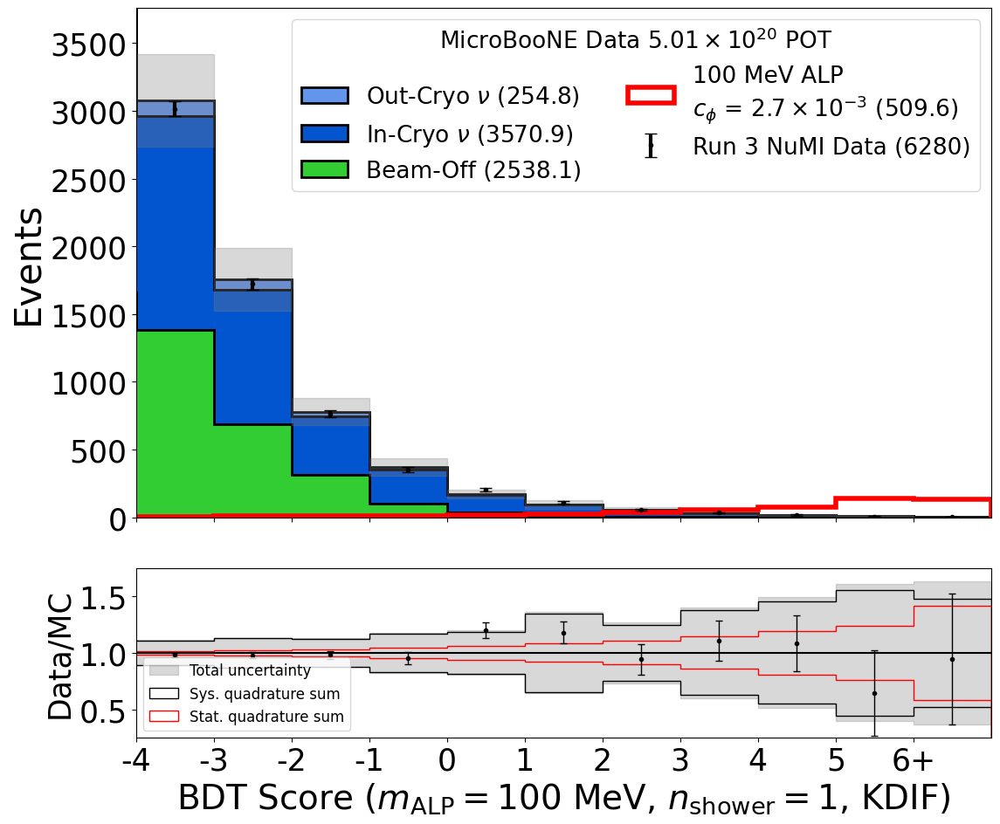

HNL scale is 33.01960347516151


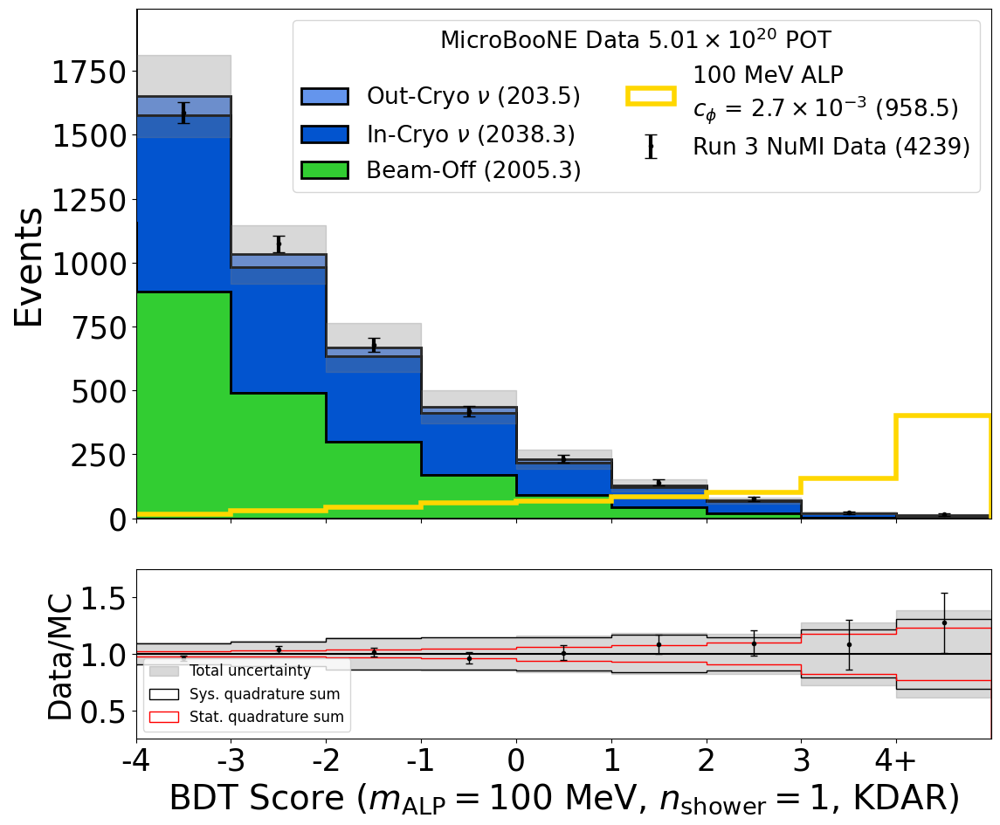

HNL scale is 33.01960347516151


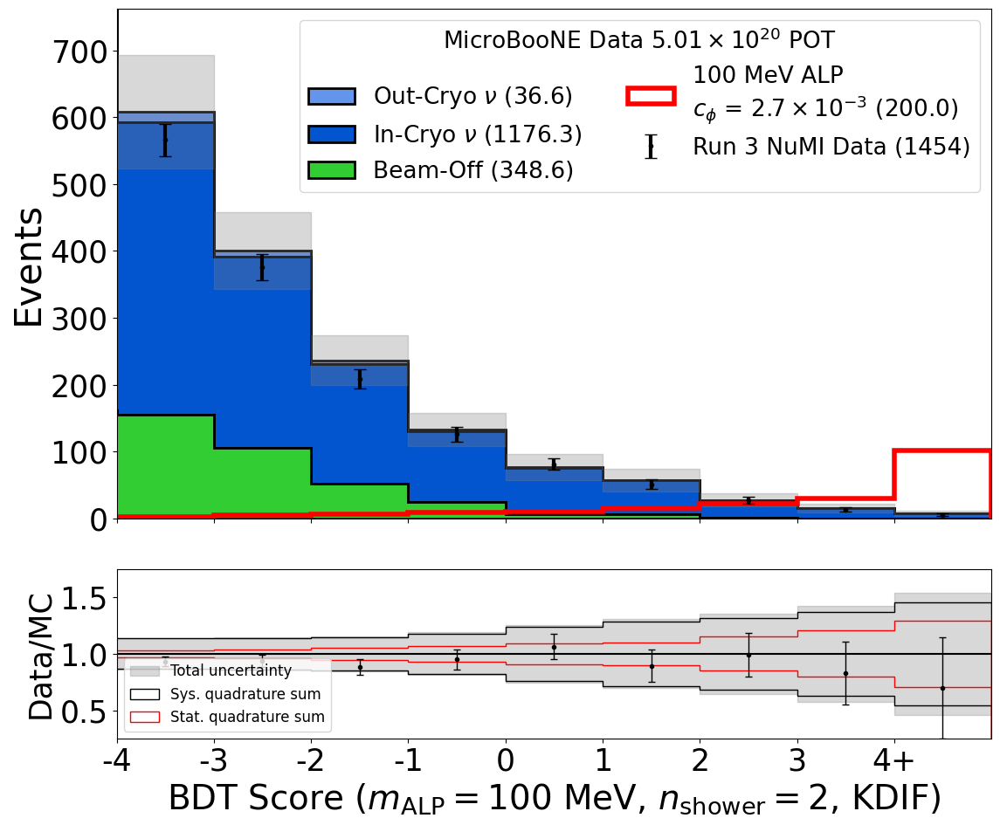

HNL scale is 33.01960347516151


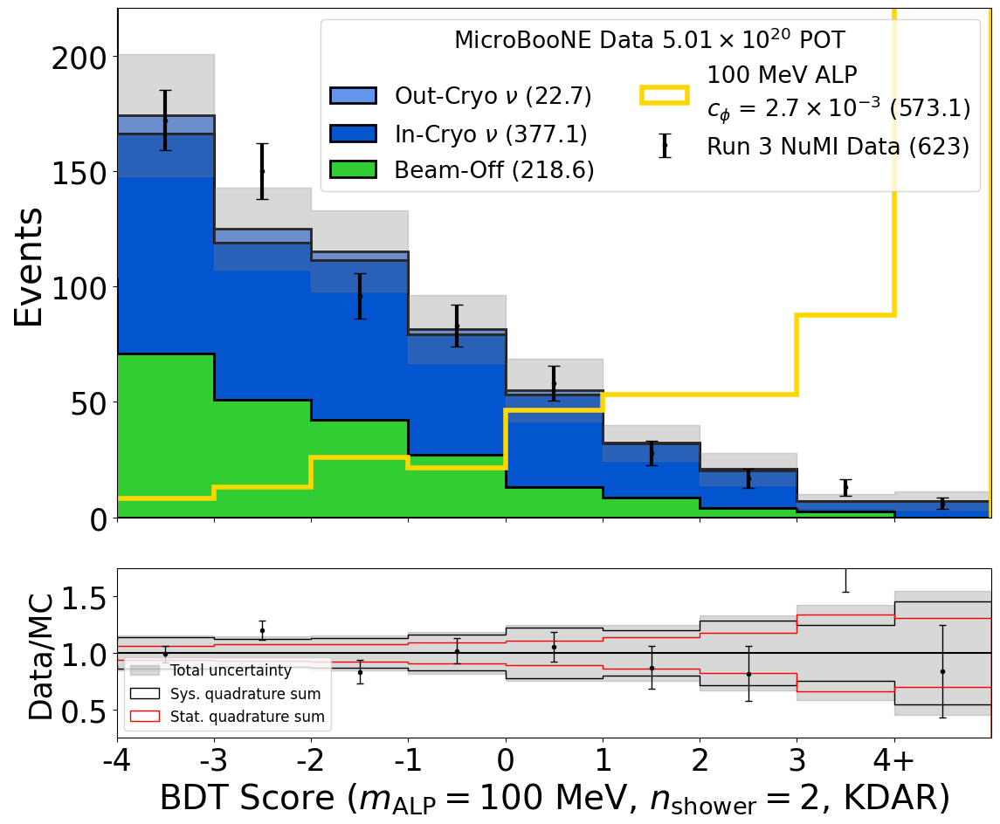

HNL scale is 28.3798347107438


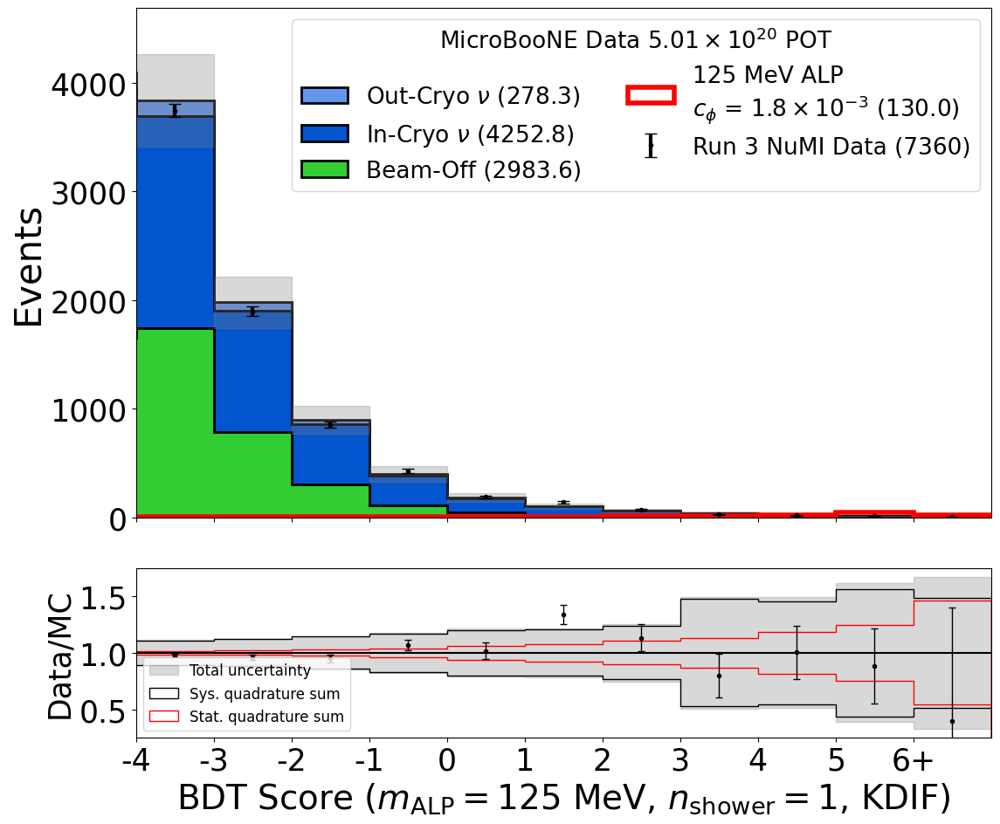

HNL scale is 28.3798347107438


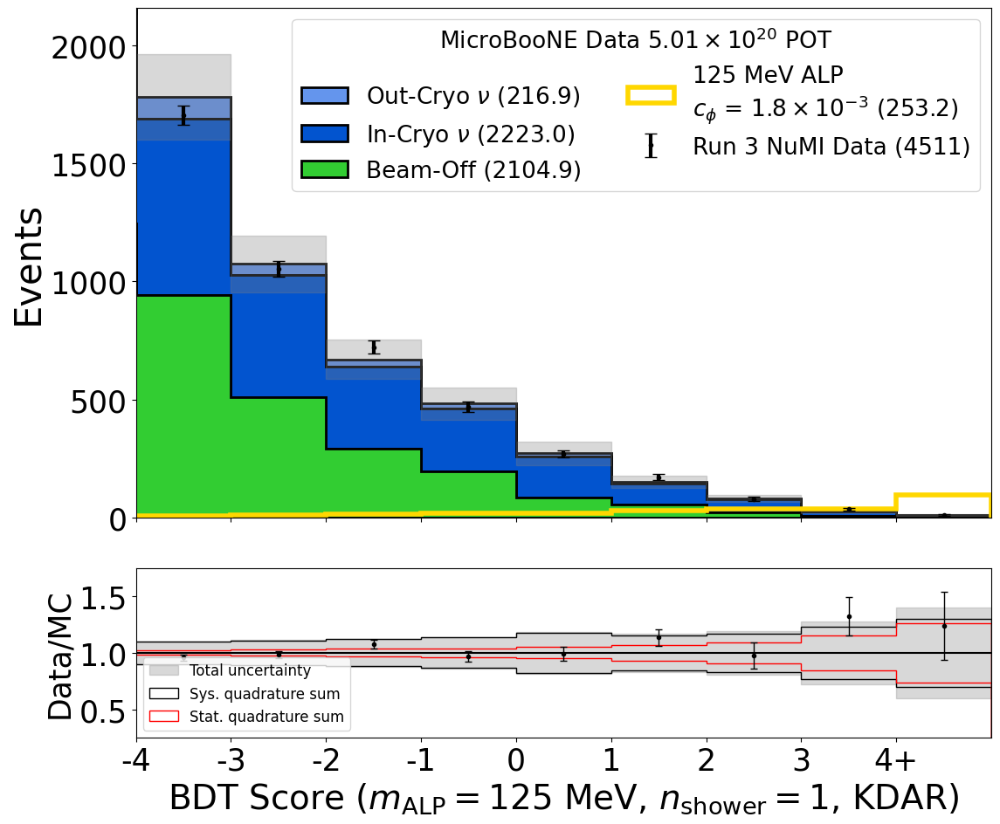

HNL scale is 28.3798347107438


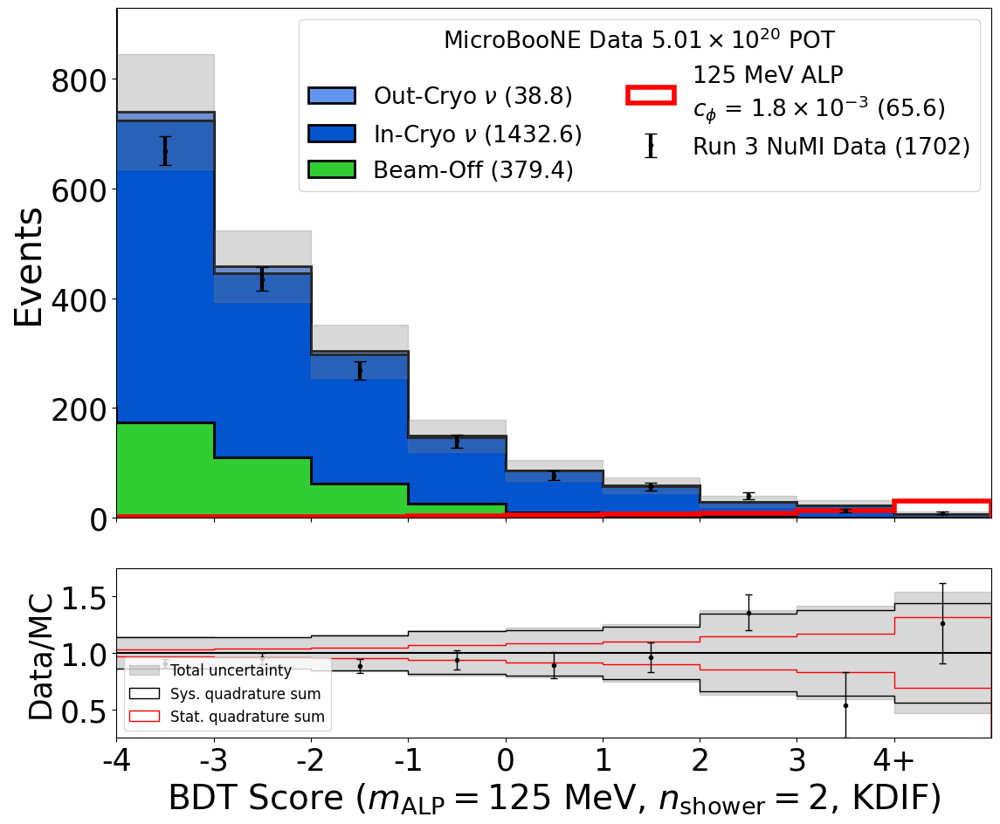

HNL scale is 28.3798347107438


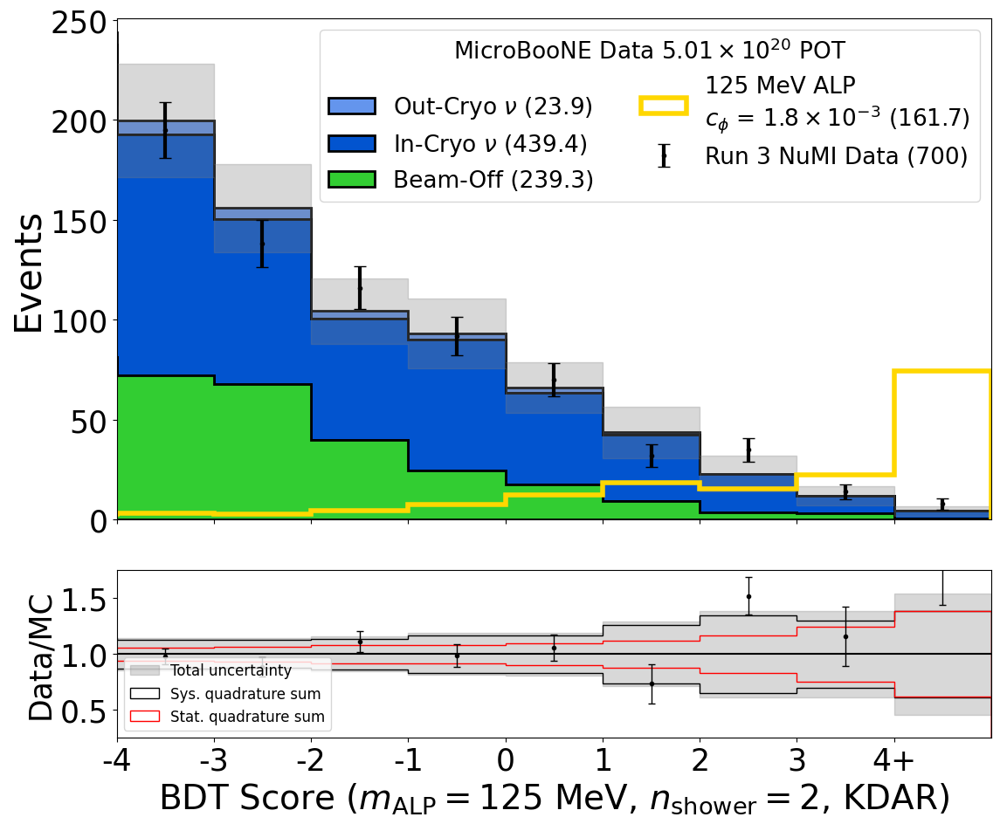

HNL scale is 28.162754629931314


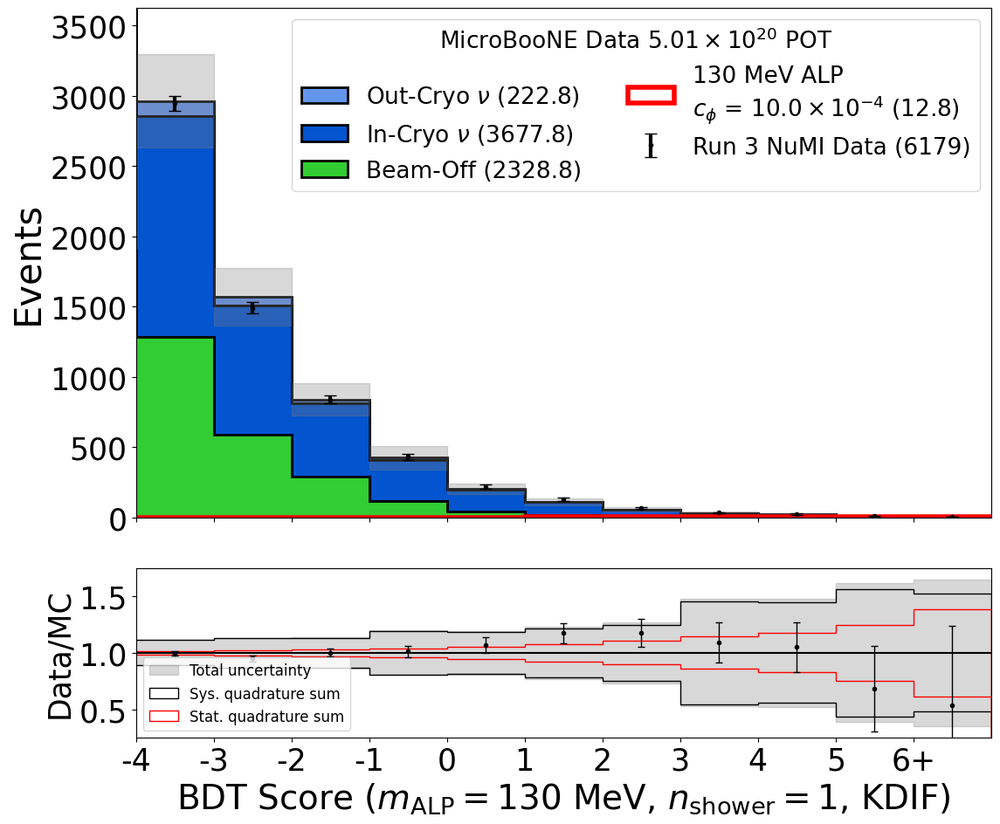

HNL scale is 28.162754629931314


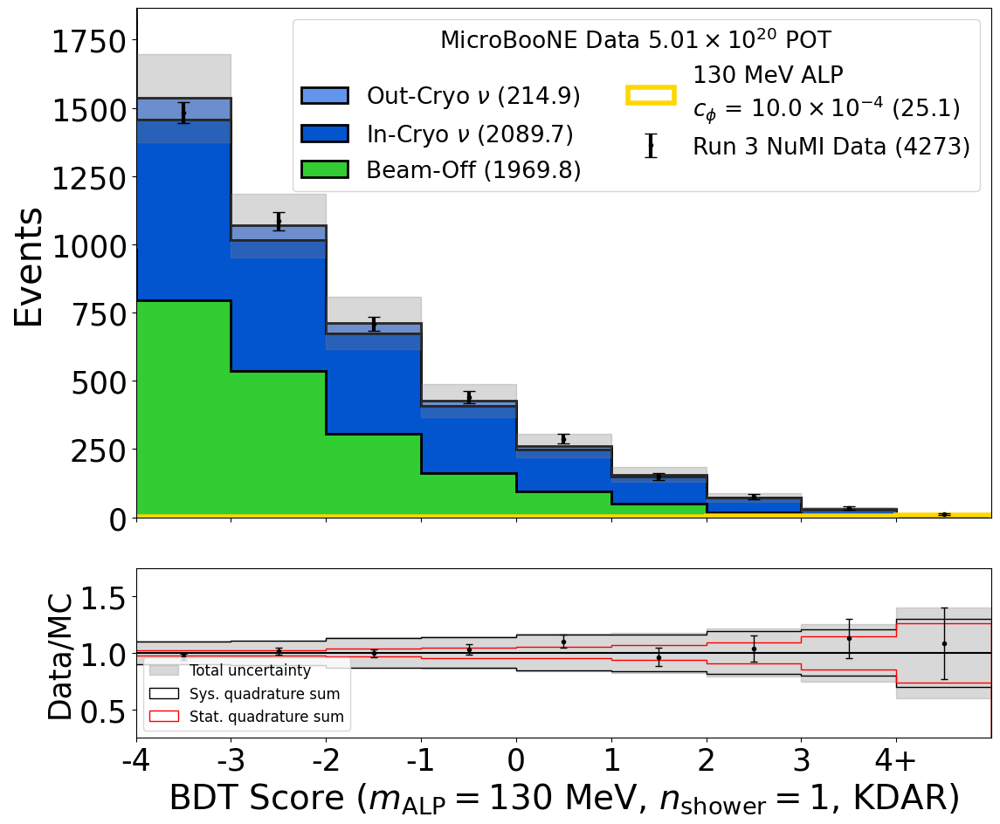

HNL scale is 28.162754629931314


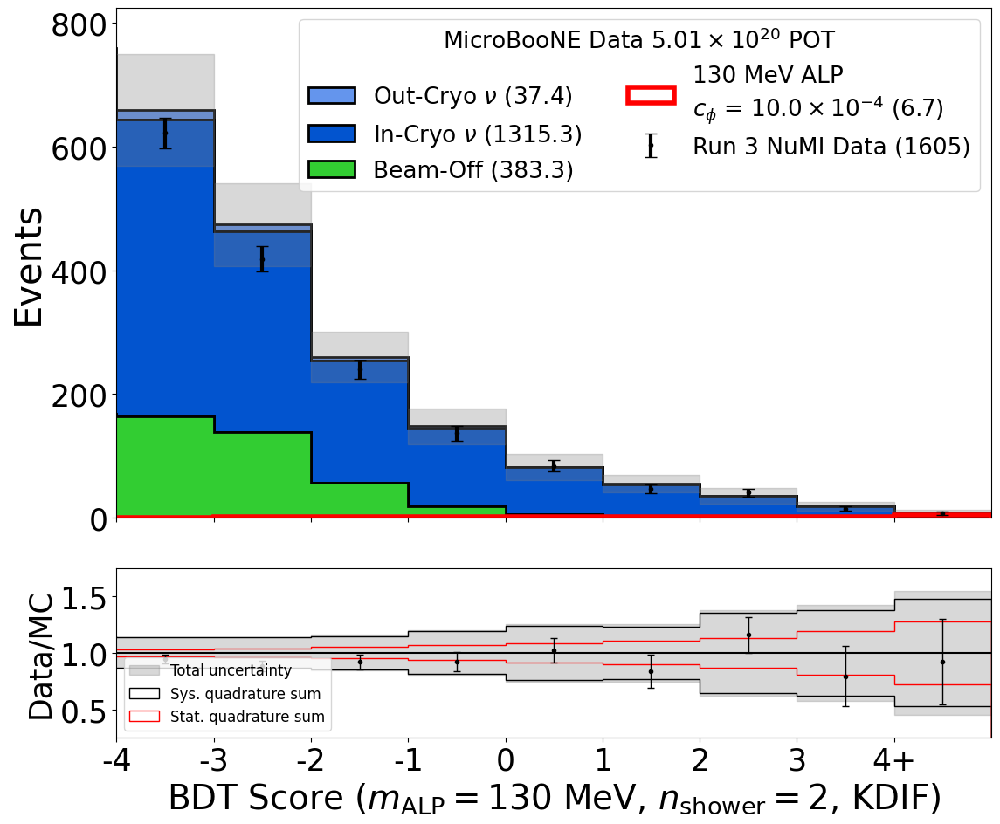

HNL scale is 28.162754629931314


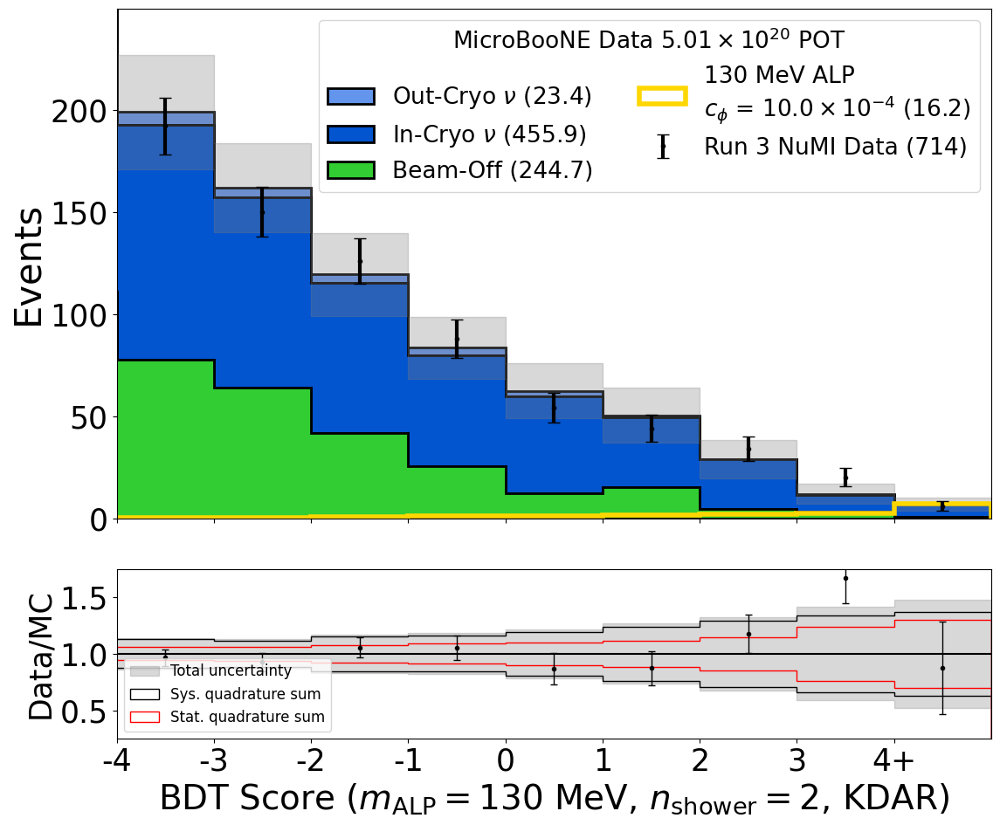

HNL scale is 33.09342120476355


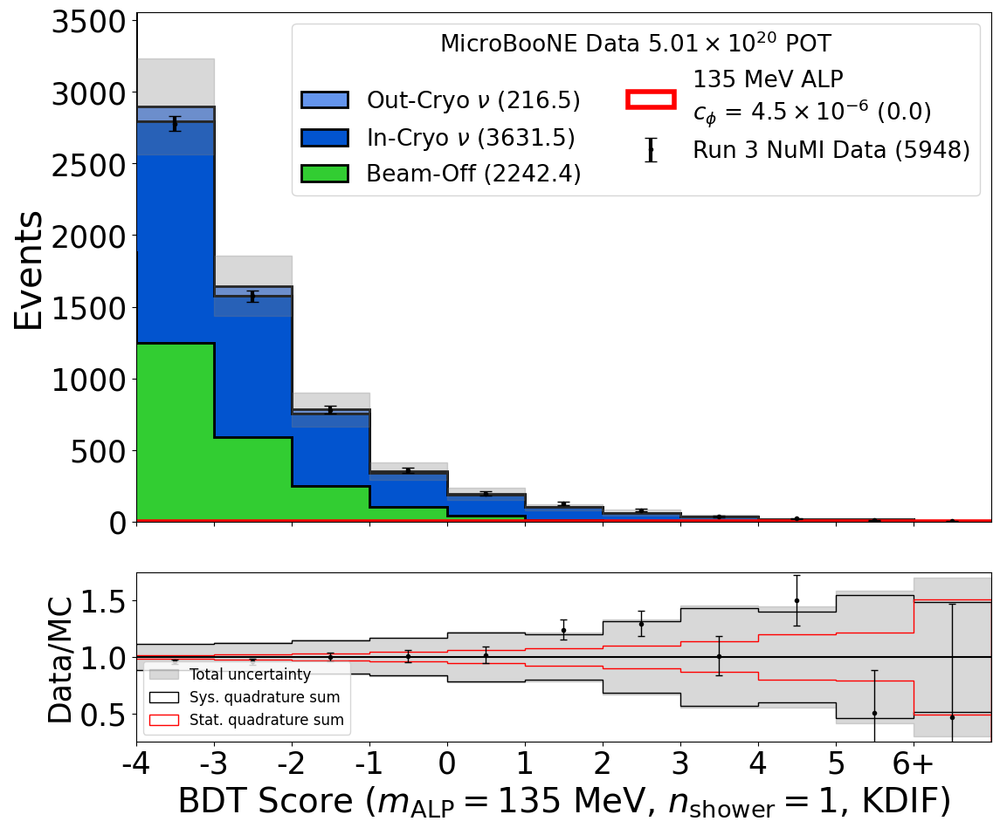

HNL scale is 33.09342120476355


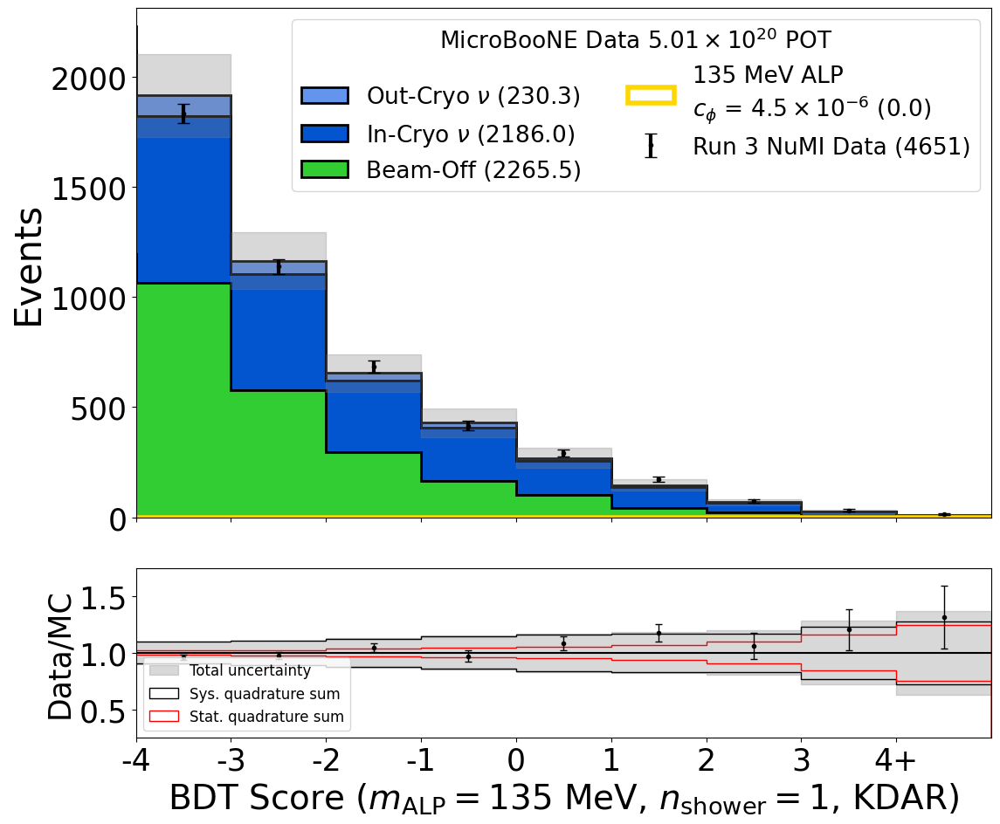

HNL scale is 33.09342120476355


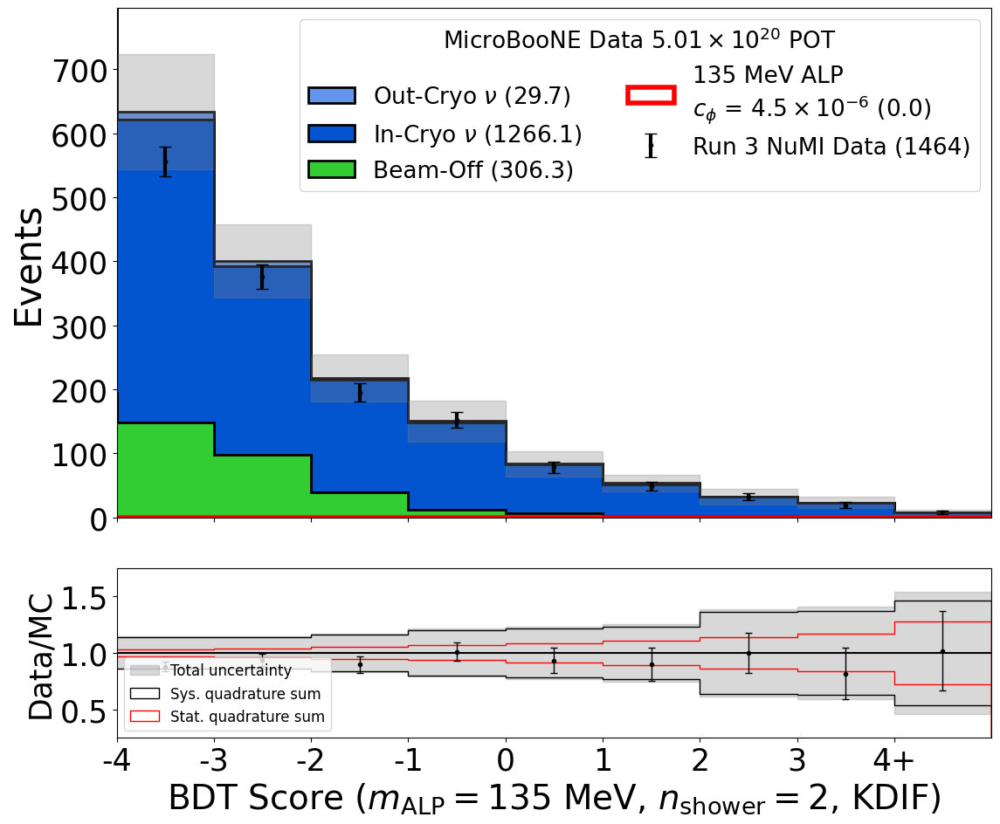

HNL scale is 33.09342120476355


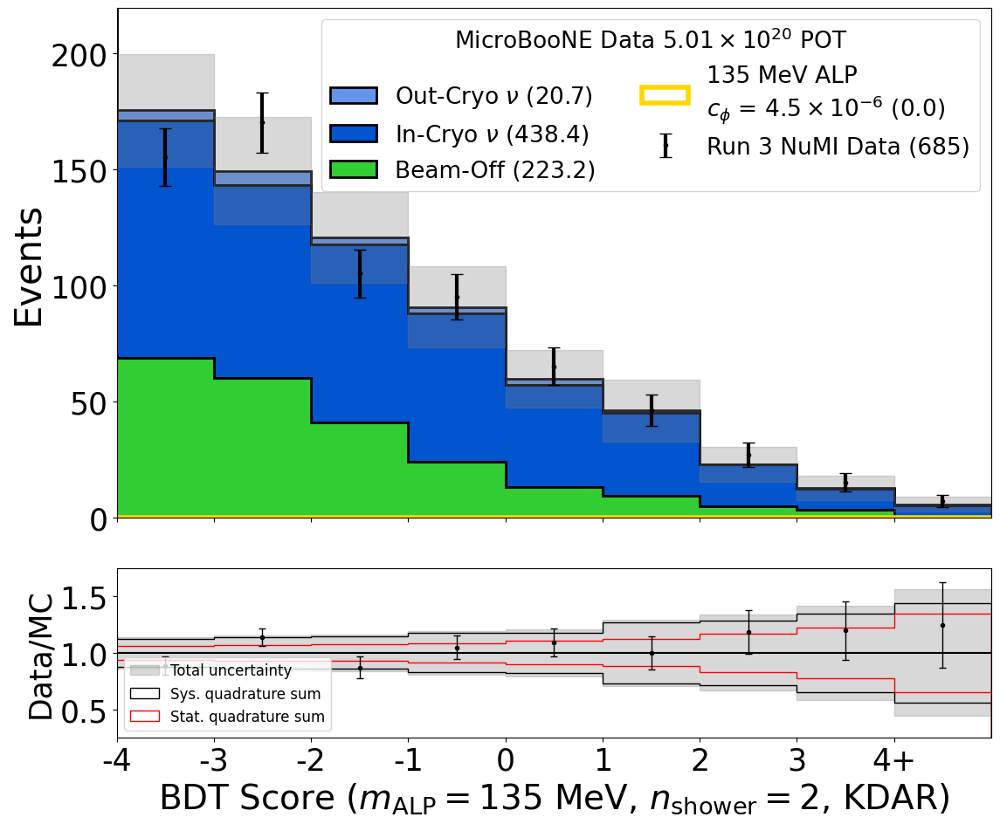

HNL scale is 24.557922068088676


/var/folders/wr/yb1fjkjn1mbg644j5v7f2tlm0000gp/T/ipykernel_75330/3800248063.py:209: RuntimeWarning: invalid value encountered in divide
  dat_err=np.sqrt(x1)*np.nan_to_num(x/x1)
/var/folders/wr/yb1fjkjn1mbg644j5v7f2tlm0000gp/T/ipykernel_75330/3800248063.py:233: RuntimeWarning: invalid value encountered in divide
  fracer_data=np.nan_to_num(np.sqrt(x1)/x1)


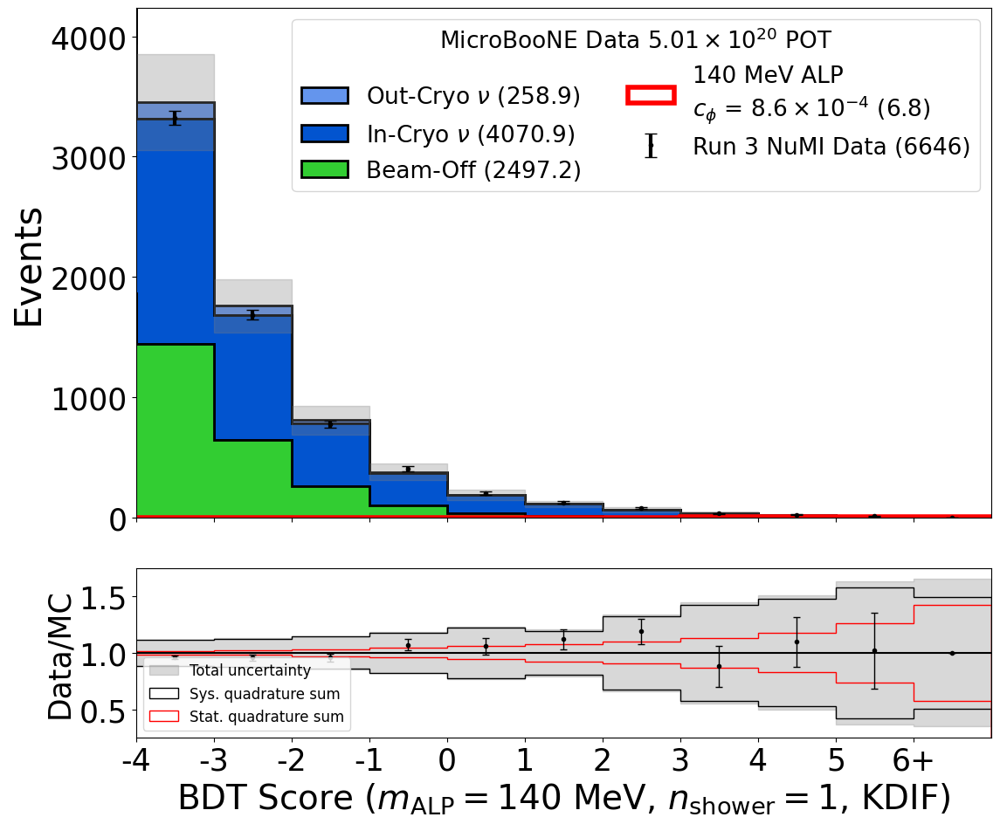

HNL scale is 24.557922068088676


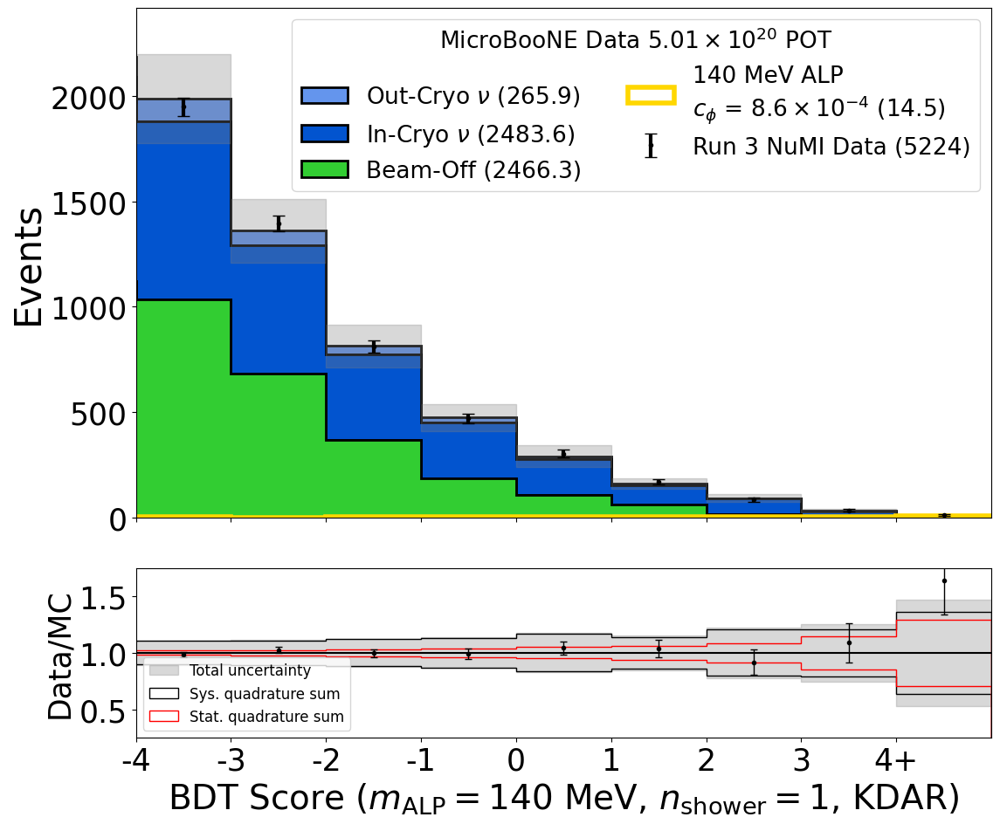

HNL scale is 24.557922068088676


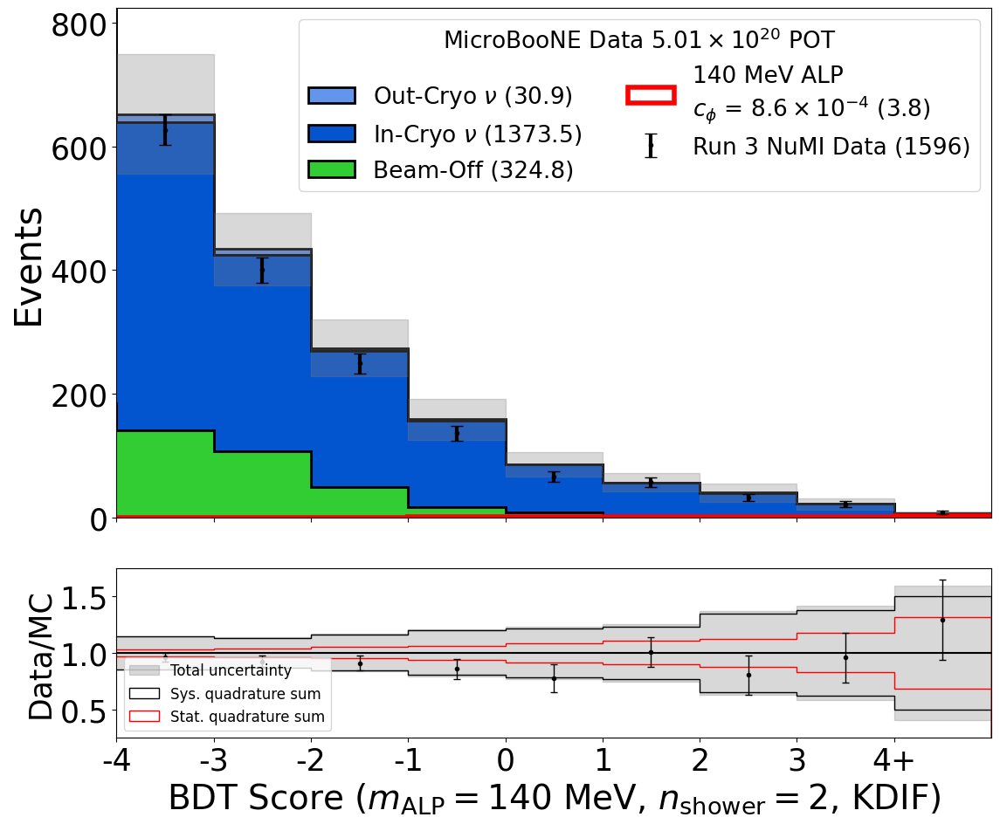

HNL scale is 24.557922068088676


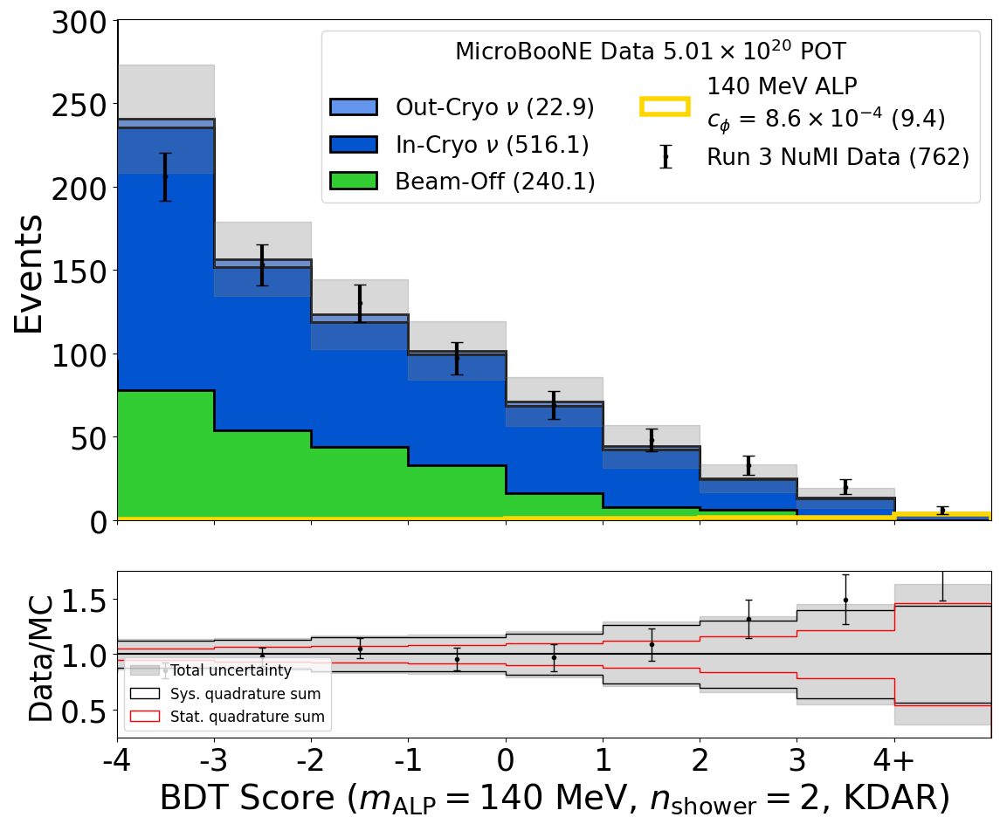

HNL scale is 18.910248462606617


/var/folders/wr/yb1fjkjn1mbg644j5v7f2tlm0000gp/T/ipykernel_75330/3800248063.py:209: RuntimeWarning: invalid value encountered in divide
  dat_err=np.sqrt(x1)*np.nan_to_num(x/x1)
/var/folders/wr/yb1fjkjn1mbg644j5v7f2tlm0000gp/T/ipykernel_75330/3800248063.py:233: RuntimeWarning: invalid value encountered in divide
  fracer_data=np.nan_to_num(np.sqrt(x1)/x1)


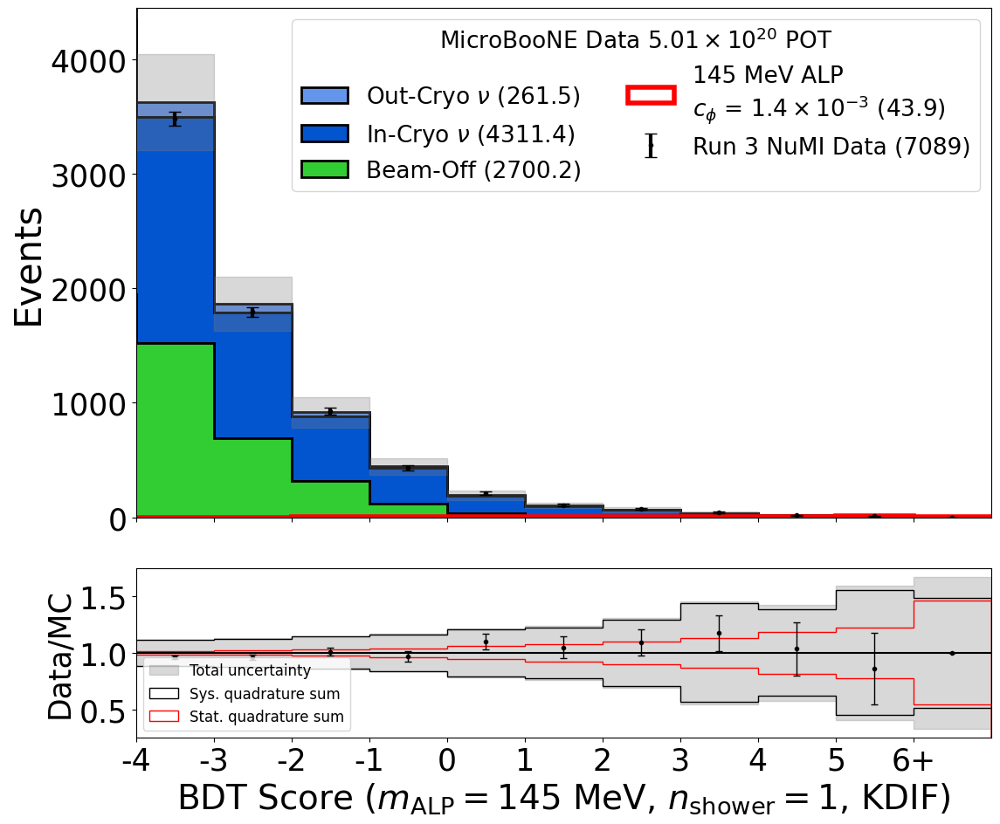

HNL scale is 18.910248462606617


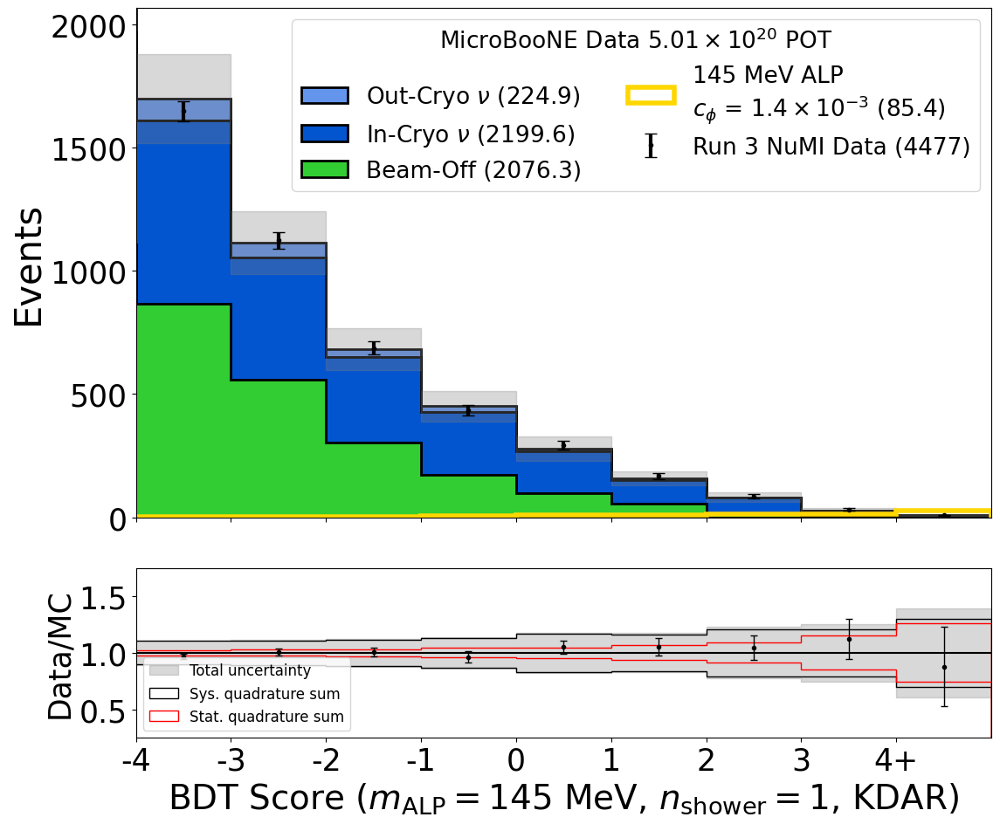

HNL scale is 18.910248462606617


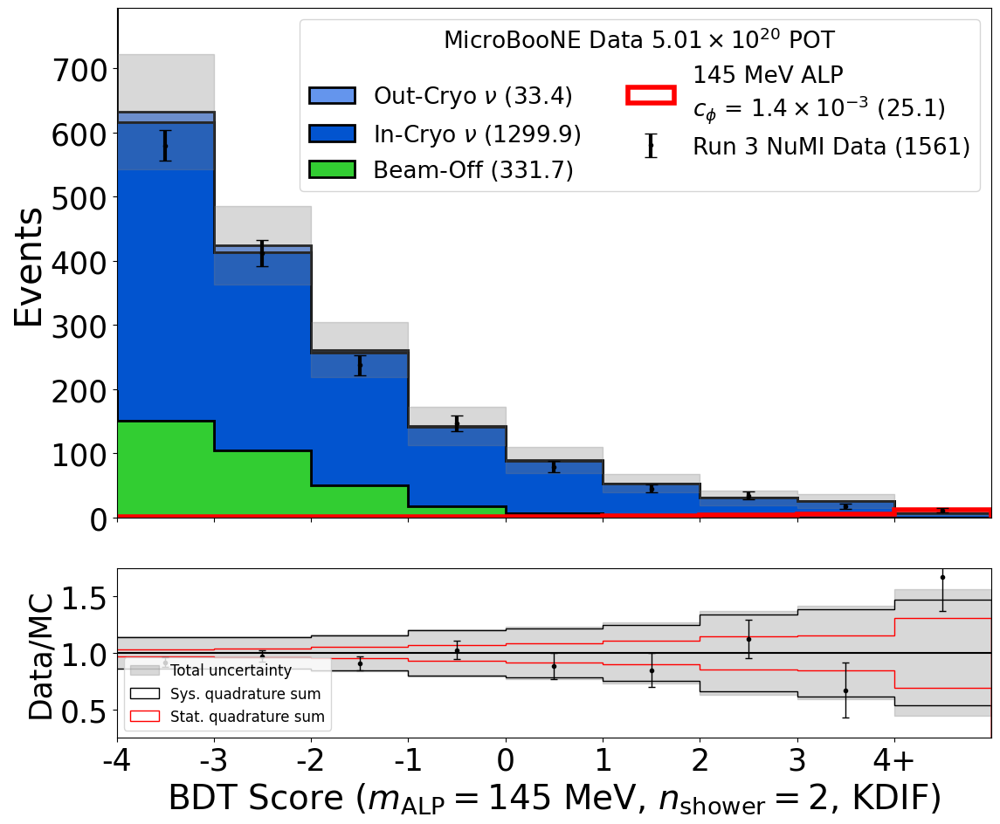

HNL scale is 18.910248462606617


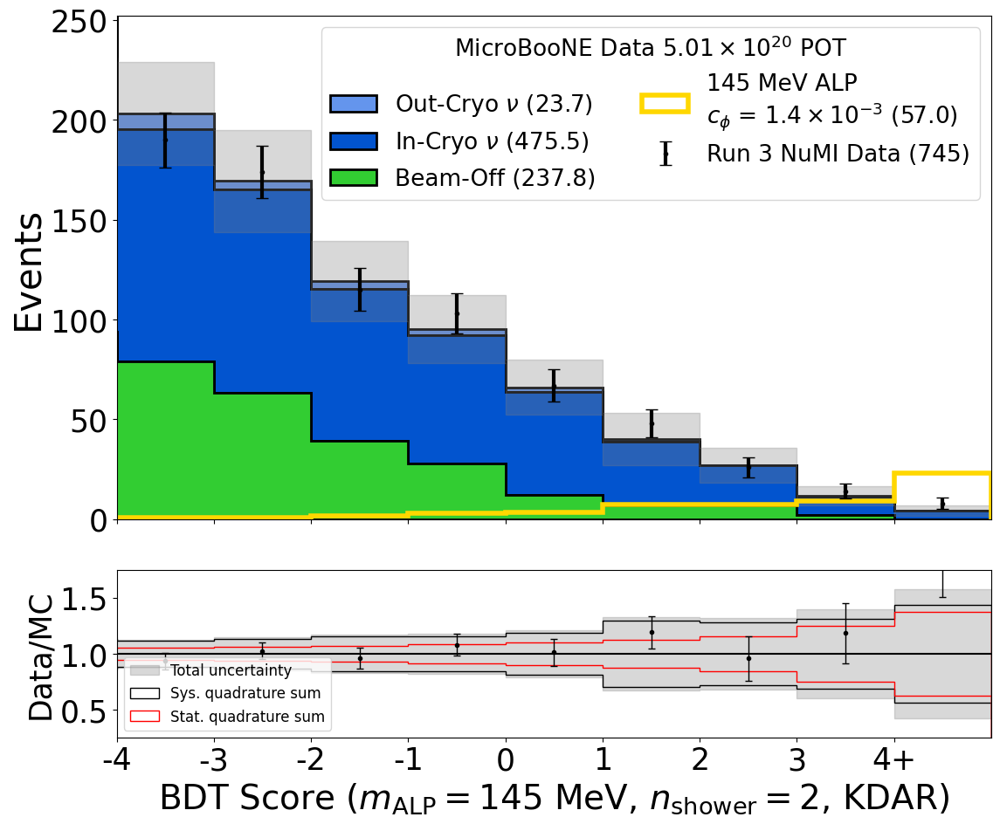

HNL scale is 25.6145512580369


/var/folders/wr/yb1fjkjn1mbg644j5v7f2tlm0000gp/T/ipykernel_75330/3800248063.py:209: RuntimeWarning: invalid value encountered in divide
  dat_err=np.sqrt(x1)*np.nan_to_num(x/x1)
/var/folders/wr/yb1fjkjn1mbg644j5v7f2tlm0000gp/T/ipykernel_75330/3800248063.py:233: RuntimeWarning: invalid value encountered in divide
  fracer_data=np.nan_to_num(np.sqrt(x1)/x1)


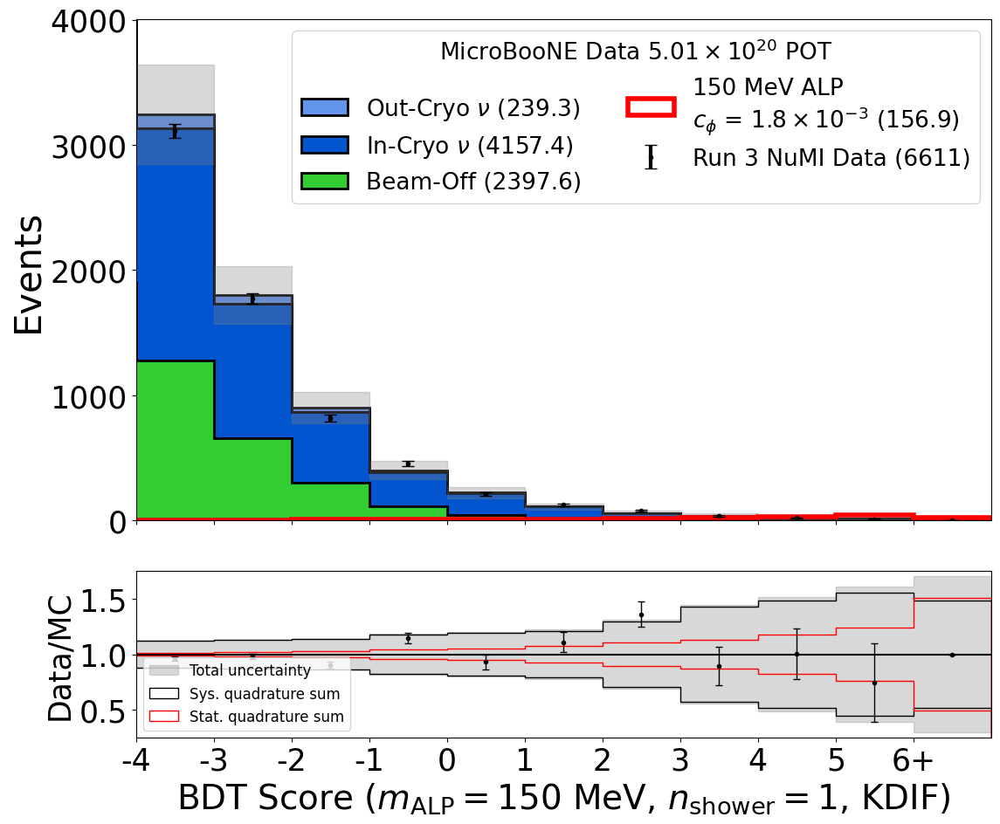

HNL scale is 25.6145512580369


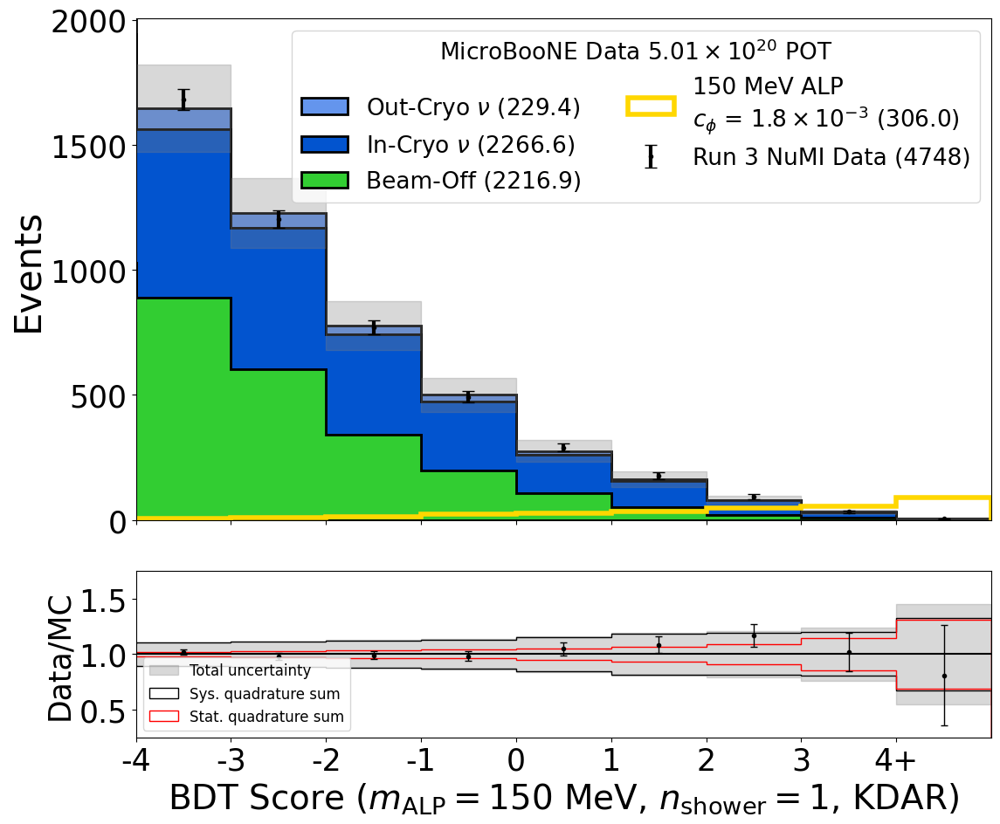

HNL scale is 25.6145512580369


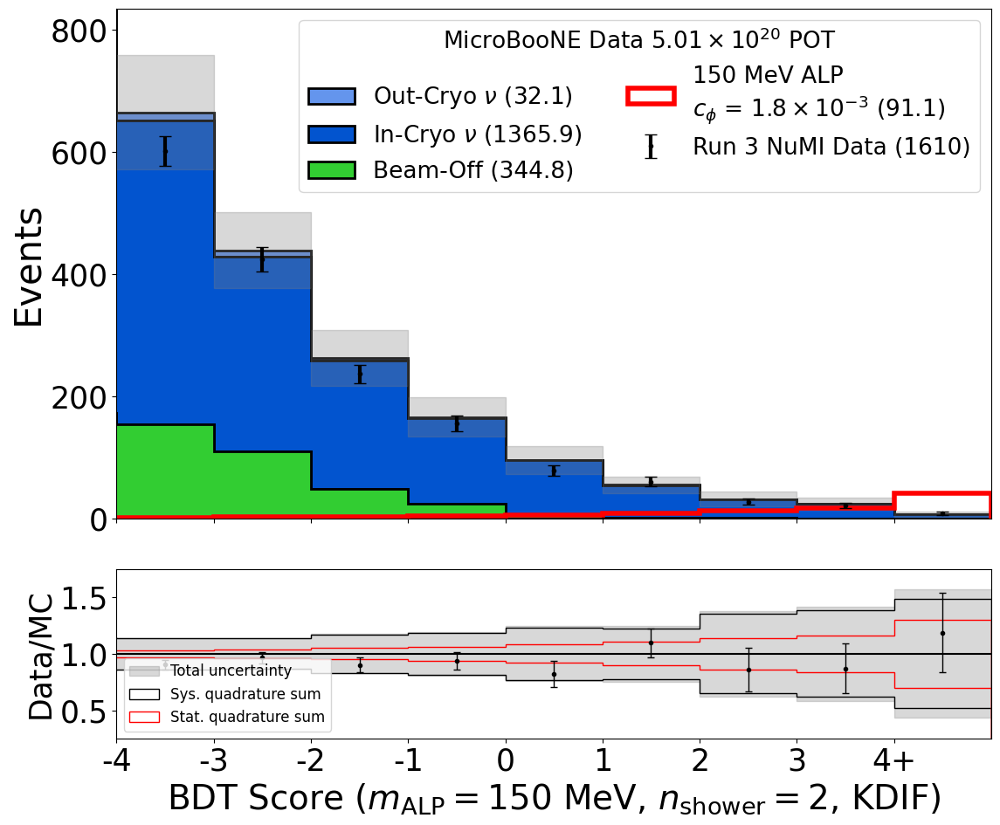

HNL scale is 25.6145512580369
Adapted y axis range in one plot for paper


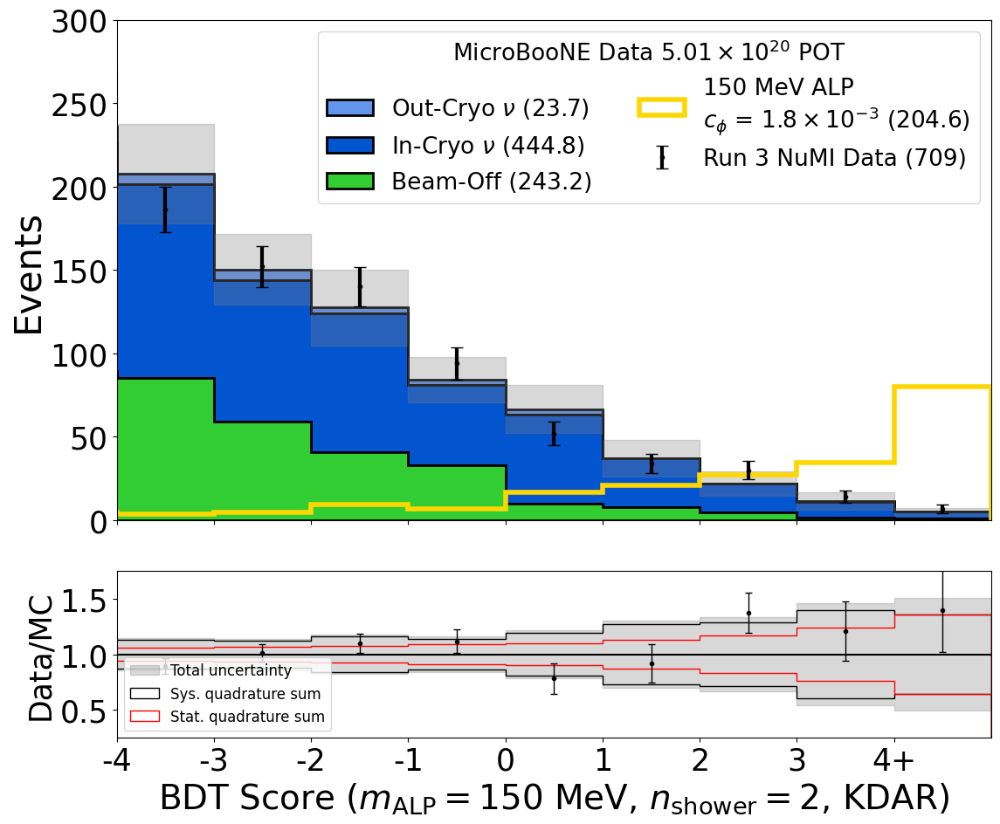

HNL scale is 12.324581258488005


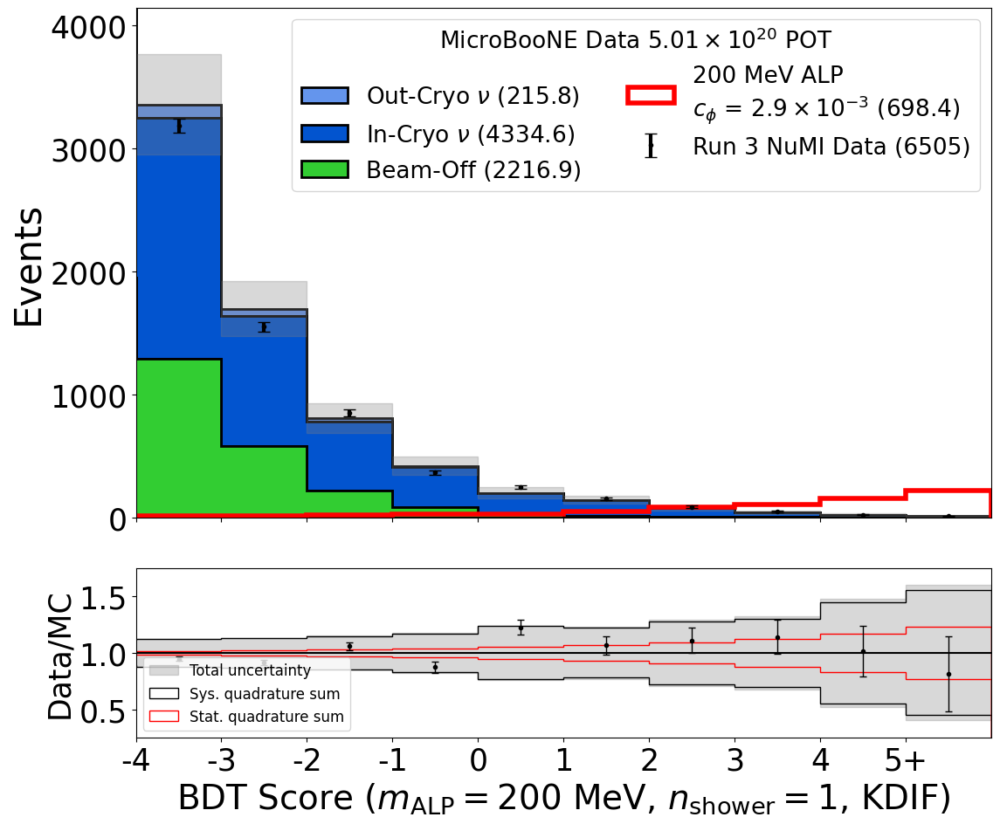

HNL scale is 12.324581258488005


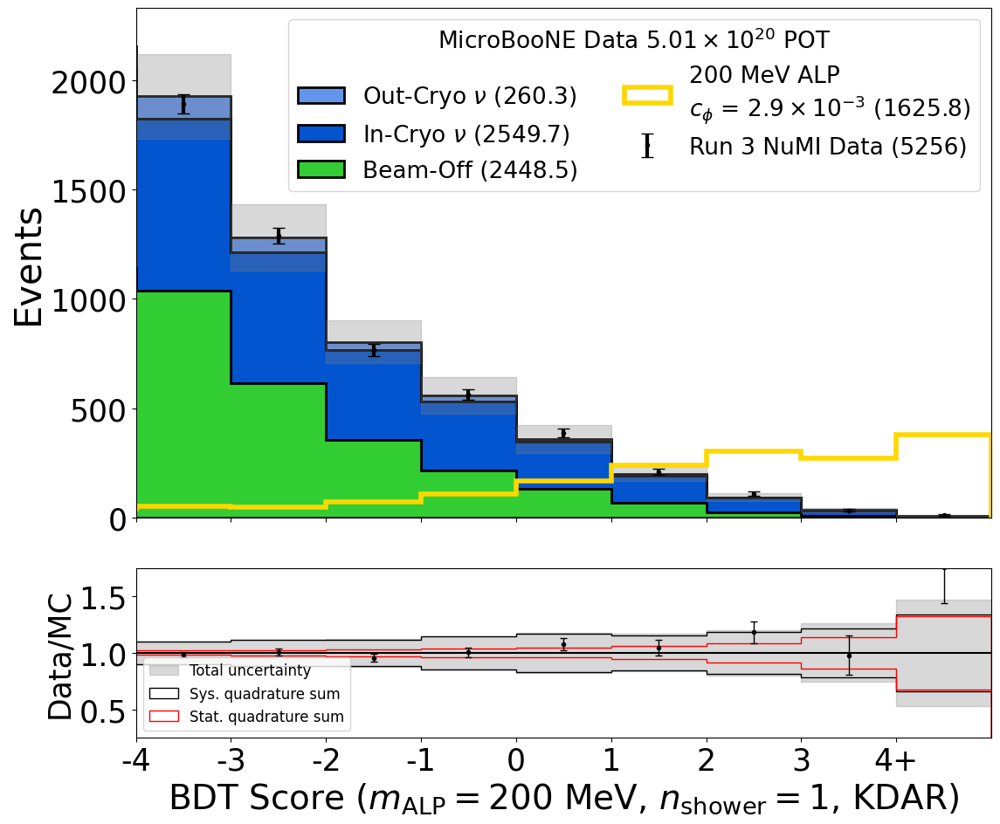

HNL scale is 12.324581258488005


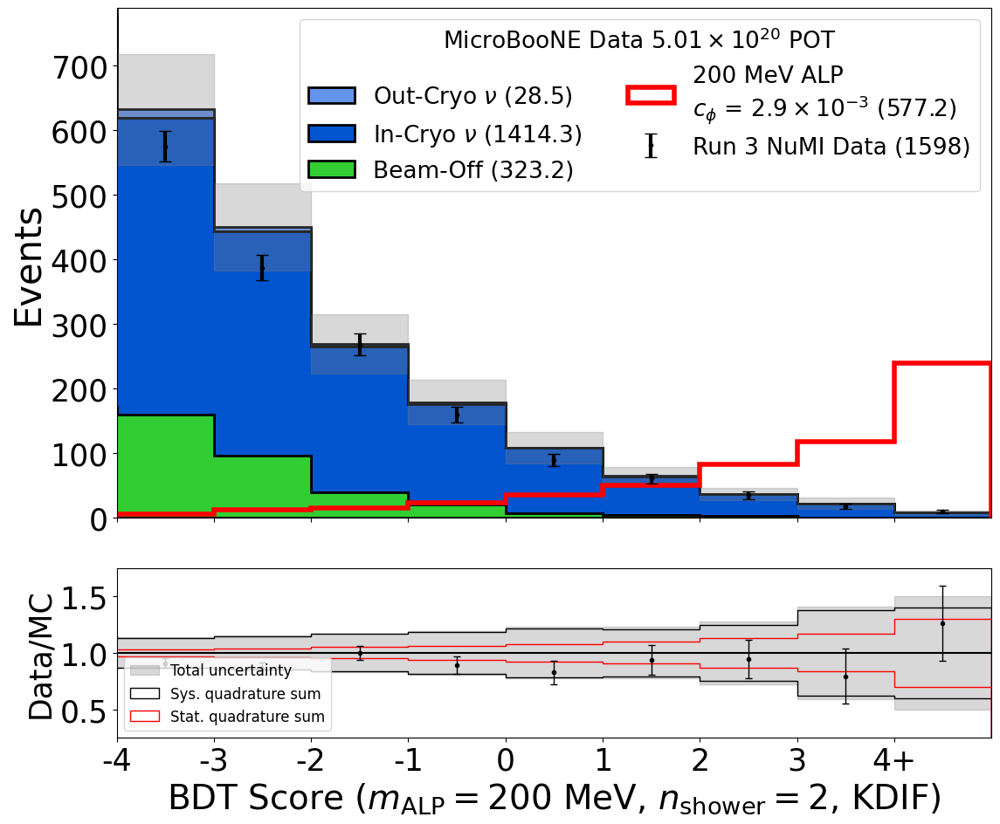

HNL scale is 12.324581258488005


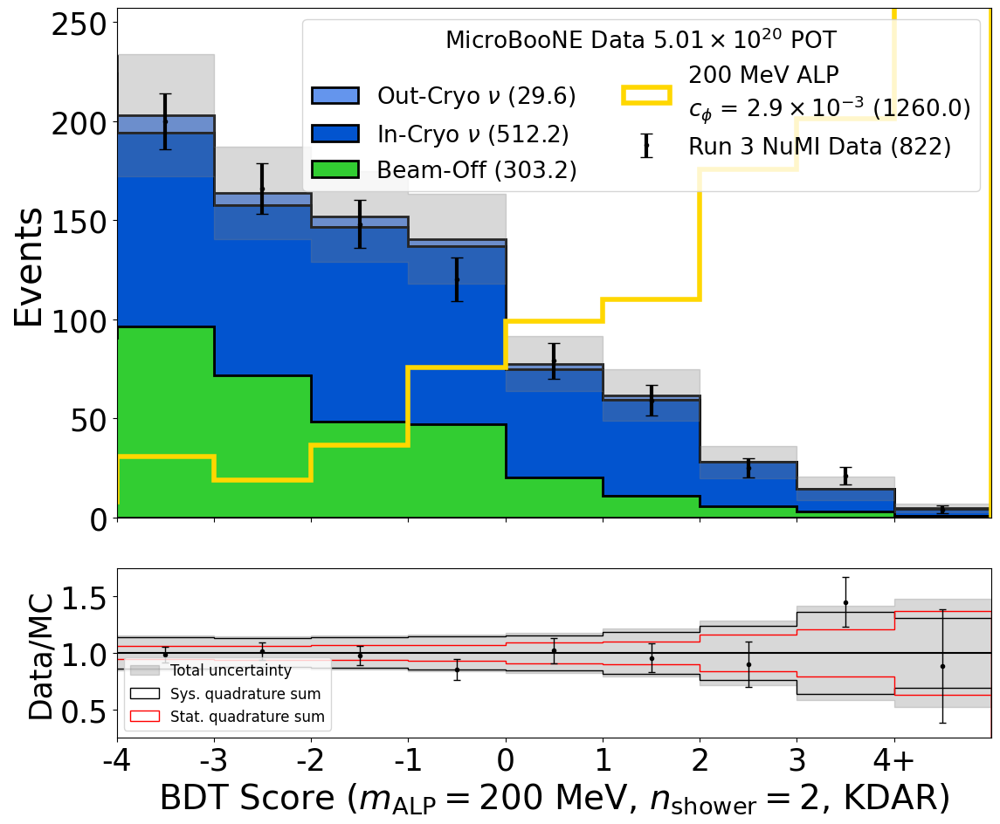

In [200]:
# Run 3
plt.rcParams.update({'font.size': 25})
Lo_score = -5.0

adjusted_xlims_RW_r3, xticks_RW_r3 = make_xlims_dict(bins_overflow_RW_r3, lower = -4)

savestr = f"_unstacked"

sample_colours_test = {'overlay':'#0254cf',
                  'dirtoverlay':'cornflowerblue',
                  'beamoff':'limegreen',
                  'signal':'red',
                  'signal_pi0':'gold'}

# titlename = r"MicroBooNE Data" "\n" r"$5.01\times10^{20}$ POT"
titlename = r"MicroBooNE Data $5.01\times10^{20}$ POT" # Run 1
titlename = r"MicroBooNE Data $5.01\times10^{20}$ POT" # Run 3

Plot_BDT_RW_output_systematics_data(signal_dict_RW_r3, tot_uncertainty_dict_RW_r3, bkg_sys_RW_r3, sig_sys_err_RW_r3, bkgs_dict_RW_r3, data_RW_r3, bins_cents_overflow_RW_r3, bins_overflow_RW_r3, 
                                 xlims=adjusted_xlims_RW_r3, xticks=xticks_RW_r3, upper_y=0.75, legloc="upper right", colours = sample_colours_test,
                                 legsize=19, logy=False, savefig=False, save_str=savestr, Run="run3", HNL_scale=new_hist_scaling,
                                 scale_up=new_hist_scaling, thetas = theta_dict, c_phis=c_phi_dict, sig_sys=False, HNL_scale_label=True, stacked=False,
                                 title_name=None, textpos=None, plot_text=titlename, textsize=18, ncols=2, plot_stat_sys=True)